 # Job scraping - Indeed

### IST652 - Final Project - Jenny&Jieer

This program is aimed to web scraping data from indeed.com, find the detailed information of each job.

In [2]:
from bs4 import BeautifulSoup
import requests
import pandas as pd
from pprint import pprint
import re

## 1. Data of data scientist

<b>Extract the data of job title, company, location, salary, summary and link from the page. And write them into a panda data frame.

In [4]:
pages = list(range(10,700,10))
df = pd.DataFrame(columns=["Title","Company","Location","Salary", "Summary","Link"])

# Loop through the pages
for page in pages:
    
    source = requests.get('https://www.indeed.com/jobs?q=data+scientist&l=United+States&start={}'.format(page)).text
    soup = BeautifulSoup(source, 'html.parser', from_encoding="utf-8")

    # All the information we want is under the specific class='jobsearch-SerpJobCard unifiedRow row result'
    # We will print out the information we get and append them into the data frame
    
    for jobs in soup.find_all(class_="jobsearch-SerpJobCard unifiedRow row result"):
        
        # Get the job title
        try:
            title = jobs.h2.text.strip()
        except:
            title = None
        print('Job Title:',title)

       # Get the company name
        try:
            company = jobs.span.text.strip()
        except:
            company = None
        print('Company:',company)

        
        # For the job location, some of them are under the tag 'span', some are under tag 'div'
        # So here we need to write two try
        
        try:
            location = jobs.find('span',class_='location accessible-contrast-color-location').text.strip()
        except:
            try:
                location = jobs.find('div',class_='location accessible-contrast-color-location').text.strip()
            except:
                location = 'None'
        print('Location:',location)

        # Get the information of salary
        try:
            salary = jobs.find('span',class_='salaryText').text.strip()
        except:
            salary = None
        print('Salary:',salary)

        # Get the brief introduction of job description, but for the full information we need to go the job link page
        try:
            summary = jobs.find('div',class_='summary').text.strip()
        except:
            summary = None
        print('Summary:',summary)
        
        # Get the link of job detailed for further use, like scraping job description/ job type
        
        try:
            url = jobs.h2.find('a', attrs = {'target' : '_blank'}).attrs['href']
            link = 'https://www.indeed.com' + url
        except:
            link= None
        print('Link:',link)

        print('-------------')
        df = df.append({'Title':title, 'Company':company, 'Location':location, 'Salary':salary, 'Summary':summary,'Link':link}, ignore_index=True)

/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:185: UserWarning: You provided Unicode markup but also provided a value for from_encoding. Your from_encoding will be ignored.
  warnings.warn("You provided Unicode markup but also provided a value for from_encoding. Your from_encoding will be ignored.")


Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J3q7BSNu2LAPKaaE-sNqgwaw-vomFdlX3DDQIYlOfF6AhD9SVMxb35AVh7eNu26SajsONlKLp44bW30-8M4E4oGkU7m3_kavXlXKmS9jLqJ0HkWs4K4IxxuO5EWxNe-xYG3ttjAV7EyK5JtqOZx21lrPJ3DxqgoFXsRgp0b8zYVImZc0vxB4Bp1L_5RWHROhJfH7NuUvA_gZvm5sUd5MVbstL1GxjsCZ9_detdsCZfLRpOIPFyRzBWoNgllTlkSV1ptSE4l9wGUQvtkmreucDekzcKHhX7swfhF0wRiJtKamDkhfgb4EHBUGwBpGNLYc4lFURWLizhmjqybexODdH9tXaRWyK6lbJWgc4BCEibLmz2S_5rF5dgAQ6zeL92f5DmFPCjXdz37Iik4pWo4zIfTwZVS-M_nO0kY-Pnfbkyz-qHTOWd8bONlPRtE2aUHIrb5DxrN3A3vUrxK_nn2

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-JysqjF-KqknJwl_iF3jOwVzo6vBKi_gc2hWU7YX02zxreo8XTOALiA5QgwKgNxlZkJYODRU08lKKlb4xd6JmPdHAgKojyCQFh5VBhU6_6E_7EO7g0N-xlG0GfGncWDK3UOtqccXdSMD5jQhW7iTwoK31xWZhkCirm3DFszKmLTeZFqFkhimy4q96AqhwIiNdushNj9nOecHpFLfQzAKjGztayseRqenOePQSeo8_0BjZchQNE3VVZVWErs5LdPxeg9zSM7fBY7mld0Z-mU7ngKtfqbz6mjXmeS-rh7Mu-XJlWtWUQN-01T3CtSHHQ9H3xZi4vBWRAtwwsi6VrgkbweoB5_2sMX6GY-xKHUc8T3Q53WAHcWgwQZH1OEGhKrPr_E6jQnqJ1oPHCRRDhVvSxOF9FpK8YxM9E_3dcfShqtoo9oMKoAj1vnI_TjIYgJr2vprJgR9YJn6LsT9X4A-

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J9i4Qp_M1TF05J7GRAEqSxa5r-FX_RWZGEY7tijc6hUcxy7OuwnLf_hJAkjIUVVeA6bweR00Wf1WUcKnYfaE3oNQ5HBCge1z7fvRVMZIV9h4y6LKCH85-k_ZN4sXdAurO9kXeFYMFV4NI7MJWCFJfmMnFDD10ufyNcTipcAk1EiErl569fB-RtEl41TsIx_L9h6LXj1JJJuNtLlgH7iZUpuwSyF8CtSH9hHZjgy7F6Wqck8KagB74mYzveXvOWSsfOekS45zjYAId14EOMNNzyFJu1iv6Q5Ub68ic_RbBgj3YPB7rrioH1QB09PWs3YS10fsshY3AYMjsW4usIcTWw7XRyWVjp3pYSSc3ggiWcRgWSJ_WJV952PmRLeniIW9bydMBmbtu19bSUuY5in0bweWvsdCcjQycW1gIYqVuuWN5YqhVheQh76aVEKtP_H7FR1BOB6qWNgvg88TTsy

Job Title: Data Scientist
Company: Ars Quanta
Location: Seattle, WA
Salary: None
Summary: We are always looking for Data Scientists who want to work on challenging and interesting projects in a variety of industries…
Link: https://www.indeed.com/rc/clk?jk=0fd42b9ad83ee968&fccid=962b551e7e354052&vjs=3
-------------
Job Title: Data Scientist
Company: Jam City
Location: Culver City, CA
Salary: None
Summary: If doing a deep dive into the latest cutting edge literature on neural networks or probabilistic programming in the morning and working with game designers or…
Link: https://www.indeed.com/rc/clk?jk=a0ec551f9d2ade20&fccid=92938f0e989918d3&vjs=3
-------------
Job Title: Data Scientist
Company: FAAZ Consulting
Location: Philadelphia, PA
Salary: None
Summary: Knowledge and experience in statistical and data mining techniques: XGBoost, text mining, GLM/Regression, Random Forest, Boosting, Trees,.
Link: https://www.indeed.com/company/Guerdon-Group/jobs/Data-Scientist-176b31d1ce02aacb?fccid=

Job Title: Data Scientist, Legal Policy & Economics
Company: Uber
Location: San Francisco, CA 94103 (South Of Market area)
Salary: None
Summary: Data scientists in this role sit at the intersection of data science, economics, and the law.
Build a deep, nuanced understanding of Uber’s large and unique…
Link: https://www.indeed.com/rc/clk?jk=774e8ab55a4627fb&fccid=f766f8bfbc3effb7&vjs=3
-------------
Job Title: Data Scientist
Company: Research Foundation of The City University of New...
Location: New York, NY
Salary: $65,000 - $85,000 a year
Summary: Attend project meetings with other staff and external funders.
Experience with learning, artificial intelligence, and data mining.
Clean and prepare data files.
Link: https://www.indeed.com/rc/clk?jk=41b3e5a54e608d33&fccid=667ba717ce627077&vjs=3
-------------
Job Title: Data Analytics & Biz Intel Intern
Company: TABS Group
Location: New York, NY
Salary: None
Summary: Develop and implement databases, data collection systems, data analytics an

Job Title: Data Scientist
Company: The College Board
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: Proven experience in developing machine learning and deep learning systems to solve real world problems.
You'll work with innovative agile teams' agile teams…
Link: https://www.indeed.com/rc/clk?jk=1b2201cca2c59a93&fccid=c651209eaa60c163&vjs=3
-------------
Job Title: Junior Data Scientist, Analytics
Company: CGI Group, Inc.
Location: Arlington, VA 22201 (Bluemont area)
Salary: None
Summary: Apply data and technical expertise in analysis, data mining and visualization of data using Business Intelligence tools and data development platforms.
Link: https://www.indeed.com/rc/clk?jk=2279701e62fd1527&fccid=d2841a5c0380b93d&vjs=3
-------------
Job Title: Data Scientist
Company: Zurich
Location: Schaumburg, IL
Salary: None
Summary: The Data & Analytics team executes on an enterprise-wide data and analytics strategy that supports Zurich's business goals and creates a way to

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J4MH3_EX1ChgB6owxGw4fYZGFopRYKkKYjUx7qhaH_b36psdNuoTCTF6bYPpxmcgO7QxB0z8T73sYcCV23uKxPFUQshHTRy0YMBJwCQL09fm4dZYmVauxPkO4BLSiAAdyV3-5CbY0coNMUwO7oFOlWUANdHJAFwPa687lthP9FwKQQtKh9G0-WhTv8ooeXFlDZCedMzq7LMRQtIwVeKFT7IPW-W6NXuXNU8IzYJEY7XjA3_XASMdk-Ih-RHjqCy-2iP0-IFqsxPe676lASoKWt9MbGj49ruLDaFY5SPo_PfGSpSXgWMN_P9SCyKwqj8zDS4gTv0_E3TxFbUoWHQYe8FHi3ksADY6wAHHdiSx3vA3k_AVykro7n9Q9Z4_o2GXuYG2L2c9MIN_aGMz8e_kpjuFJHW_cbrp9dFAvuiI6O92n7Oj3xjUehrH2Vbz84z2BU37viirOh1f2VmV5EY

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-Jy9ff2BIZhmPm9bK6zB_ZZ3wSbp9MOEge8nzQ904nS7MQjusjYm2yv0V1LogxJHgD8AI_UM3M5y5mjGgh_JXOIegWJq1w5hSWk_CgGpKtmZ_-_RTCR6P9LLo7sJO_64DDy6g4PT6iiniIS8HIDb5BAFdZByNUuBGk6RPjX3cnu08ofeI4brfP6hN67SihL0cO-rlC9iIPbJohQpZS5EEAGexcuBcLf4cmQ5NReF-sQ3cl5QcjaTCoFeOpJvzLXlNrRHMBPtaioaJoOVBluz4QU-EzbpqGr8s4LE_MEf6eR0WVBmg_s8aG32PAW9gmosL4PZWWtyPhebbPOiC41dv_jsKj42URee4pT-73I_Qg2eetwENe3-5g_eu56u6vZchXA4SOKOqP6YnPHoMQJrKtQCgYMRhxB9o4ucKA6_-P9X4KcyHrLgKzDp6Ftb4ypBNiHZFqhFL7W9vqYXMFAT

Job Title: Data Scientist
Company: GLOBAL RISK INTELLIGENCE
Location: Arlington, VA
Salary: None
Summary: Applicants that demonstrate previous office experience and possess advanced knowledge of relevant software are preferred.
Link: https://www.indeed.com/rc/clk?jk=e3107ed7806f5bc5&fccid=d322b239d696a069&vjs=3
-------------
Job Title: Data Scientist
Company: Getronics
Location: Atlanta, GA
Salary: $50 - $55 an hour
Summary: Train and tune the model and set up meaningful test for assessing model health.
Collaborate with other Data Scientists and Analysts on contemporary data science…
Link: https://www.indeed.com/company/Getronics/jobs/Data-Scientist-fb62d17ba61e7e9e?fccid=06bd806195b7346b&vjs=3
-------------
Job Title: (Junior) Data Scientist - Supply Chain & Operations
Company: Penguin Random House LLC
Location: New York, NY 10019 (Midtown area)
Salary: None
Summary: Execute end-to-end data science projects, including ideation, data collection/engineering, modeling/machine learning, i

Job Title: Data Scientist Intern - Summer 2020
Company: Paylocity
Location: Schaumburg, IL 60196
Salary: None
Summary: Select features, build and optimize classifiers using machine learning techniques such as random forests, xgboost, TensorFlow, linear regression, time series…
Link: https://www.indeed.com/rc/clk?jk=5ccc8e8907c19a29&fccid=761110cb1eadb0d9&vjs=3
-------------
Job Title: Marketing Data Scientist, gTech Professional Services
Company: Google
Location: New York, NY (Chelsea area)
Salary: None
Summary: Lead analytics aspects of client engagements in the area of marketing effectiveness and marketing portfolio management - with deep knowledge of modeling.
Link: https://www.indeed.com/rc/clk?jk=c1c3c13ed25372e2&fccid=a5b4499d9e91a5c6&vjs=3
-------------
Job Title: Data Scientist
Company: Naka Technologies
Location: New York, NY
Salary: None
Summary: You are capable of working with engineers to build an actual production system that uses machine learning and artificial intelligen

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J2o7fg8UJ2bAa0U7uKqqQjzA0_17lK8EpaFiOvxil2n7fzrxWAcELnj78dUuwYF5NIIeS6crAcNsw-BB8FmgvRZGS8WYWbat3d67aga2mCLQf2biJZ3HLSRnGTJHGdGonjZN7WI9gK05r3gyvUdTElmwBPnPR6psNksmM1TCgegZ34q52nWpabUj8Yp1g49WqzFSiAwWuk7-ED5gZY_3SFL6dyn5UKnW3IvD0Z-JHuGnljhZ4IkFwbgvAh53UxR8nNFGzejaXNVTwtX-XCzJloQVVzUkmeiUMm_98HAwEvHY5w_7QsuCpxXjA4fXQPqAAqqQDwJvOFcTL7sZfml0MQSaY2JYIO4fsnurhRhxrU4IAXxF43WlS_quJBR5gtcafodXy3ReNPO3FWCmAQhCzh3Qnaq9W93TyjnfCS_J2Zx4aUfUNkKtPcsdnQsWjQaYqD6jwOqbQE6ueujPmdp

Job Title: Data Scientist
Company: Chen Lab @ Boston University
Location: Boston, MA 02215 (Fenway-Kenmore area)
Salary: None
Summary: Extensive background in either computational neuroscience, image analysis, computer vision, or machine learning is preferred.
Link: https://www.indeed.com/rc/clk?jk=282cb11d8803c808&fccid=a592c034b1b76962&vjs=3
-------------
Job Title: Health Data Scientist
Company: Booz Allen Hamilton
Location: Bethesda, MD
Salary: None
Summary: You’ll mentor teammates, write scripts, build descriptive and predictive analytics, and apply current machine learning methods to help senior government…
Link: https://www.indeed.com/rc/clk?jk=1492d48077a56cb9&fccid=4e041af1d0af1bc8&vjs=3
-------------
Job Title: Data Scientist
Company: Datalab USA
Location: Germantown, MD 20876
Salary: None
Summary: Identify patterns & trends in data, and provides insights to enhance business decision making.
Identify challenges and opportunities from client strategy…
Link: https://www.indeed.

Job Title: Data Analytics Intern
Company: MilliporeSigma
Location: Burlington, MA 01803
Salary: $20 - $25 an hour
Summary: The Operational Design Center is a capability within Global Clinical Operations, the engine that makes clinical trials happen at EMD Serono.
Link: https://www.indeed.com/company/Serono/jobs/Data-Analytic-Intern-f5527f98f7c84e38?fccid=f89587519f04b5aa&vjs=3
-------------
Job Title: SAS Developer /Data Scientist
Company: RICEFW Technologies, inc
Location: St. Louis, MO
Salary: None
Summary: Coordination as a project team member with marketing, project management, quality analytics, manufacturing, regulatory and other functional areas will be…
Link: https://www.indeed.com/company/RICEFW-Technologies,-Inc/jobs/SAS-Developer-d77ac6a42ee8d7ec?fccid=a8eff612dff0130e&vjs=3
-------------
Job Title: Data Scientist/Epidemiologist, Activity #2
Company: Heluna Health
Location: Los Angeles, CA
Salary: None
Summary: Knowledge and experience in public health is desired.
The skills

Job Title: Data Scientist
Company: Plymouth Rock Assurance
Location: Woodbridge, NJ 07095
Salary: None
Summary: Performs data mining and data cleansing tasks.
Solid skills and training in predictive modeling, data mining and other quantitative and research analytics (,…
Link: https://www.indeed.com/rc/clk?jk=df16eea8cb77a301&fccid=ad326fd4de64e5d0&vjs=3
-------------
Job Title: Data Scientist II
Company: Cleveland Clinic
Location: Cleveland, OH
Salary: None
Summary: Requirements: Must have a Master’s degree in Statistics, Operations Research, Computer Science, or related field and two years of experience conducting data…
Link: https://www.indeed.com/rc/clk?jk=e3abd6e7be53fcab&fccid=e2a2a5c0f4f84192&vjs=3
-------------
Job Title: Data Scientist
Company: Booz Allen Hamilton
Location: Hawaii
Salary: None
Summary: 5+ years of experience with the application of data science and data analytics, including structured, unstructured, or relational and data mining and machine…
Link: https://www.i

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J3K_M2euGSuvE7Vd0aQFE9IFnjb54rneKz0gH-3WvhnveutViuhz9HD1obZL79kpBgGguyK6h5xX23HU_eBzOWoKh9GOVT0uOyg6Gc5Lv0v5kI4ipp5XHt1uCHHPIkuWYEgwj1OLt7j4Nrbys_Ld5P9uIo7YDI2U9bWPjiwD7OuySYvZZA-gXyxf3kpYpt1yelIvys6S6mAZF-Hx-siJKE9sCNClMZPUFqDNSVBCSe71h5cA2v_RIZDTlJ1Wtt2IdgTHl1iBKlnwfNAbIzD35E3tWXb0JPqUj_EUg23y6VhMH1Ktk4E9FBYZfal1fJYOfuSiPn7O7DMUbsL4Ls64lT4LCGWoLasA8aFhc9sIwj0zITUH9ROfCXEY3cwcqU3jIbeS7bZlNO-rzkSvV-3egQWMSNl-o-Lnap3emHvbDArSYjwbZ3YvNHRLG1FJcBUzK2mrU2VTh9FMlEzom-g

Job Title: Data Scientist
Company: Seen by Indeed
Location: Washington, DC
Salary: None
Summary: With one application you can be considered for thousands of tech roles from leading companies on Seen. Seen by Indeed is a free service that connects you to…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0DhVAxkc_TxySVbUOs6bxWYWOfhmDTNcVTjFFBAY1FXZz6G2ZVf9e4MlRcqYL3IWTNlI-QAuIKJij7gRQE1uNn-3ZY_TbYay7OZNWqzmobDlQ7NH6oHqPLKf1xeGYSQ-rvN7snHohtIoIUJnmzENHmLH2x9OLnJgocR8ERuTmVfwhP8QldosU3Bxc9an6M3w8eYm3jUJV0PZfTGdHJvM9yIcNf-qM6K5u99-Ghq6iAwyzCmzbBSUfvYLyXi4fMN4rwcLCoNLrRnu8S5fq4eMKxUgMUydvCo6Ywa-FTz3WPs7Py8uE3Ij-RnhiR1uvHu8h9tN4zcYub6yaEMxfoTOWnWUGCjjY9qSih-LyobTK4fqqeXvpGbpQKq88xRcVLzkRrDYSyqyz6URPr9G6eL7ulT00vXGnlpDi9oPLVRt6qt4sDOg_HdthXFDC6nVq0wmFd1fYKSXoPb4jNsw-KM5WcAOROlsTAJ7CInevoSTi_uYQU-j7ryLD-lI3Dr3AFxAHjyc_FIYc4zCSNdsXDPpO19Zz93cTjSozVh-gZtUHjEPWs5a548JnxncFKqXB3r0FgcR51oIEU8U2chWV8OoSW2XJaBI8-ihkAVFwRft0Hc1bqP4G9mooLcN1OZW6zXzmU=&p=0&fvj=1&vjs=3
-------------
Job Title: Dat

Job Title: Data Scientist
Company: Rapid Response Monitoring
Location: Syracuse, NY 13204 (Lakefront area)
Salary: None
Summary: 3+ years of work experience with data mining and advanced analytics and/or statistics.
3+ years work experience managing data analytics projects.
Link: https://www.indeed.com/rc/clk?jk=b5a755f30b438b56&fccid=a8519ffde299000e&vjs=3
-------------
Job Title: Data Scientist
Company: FarmTogether, Inc.
Location: New York, NY
Salary: $80,000 - $200,000 a year
Summary: You will build machine-learning models that power core operations, such as properties assessment and opportunities detection.
Temporarily due to COVID-19.
Link: https://www.indeed.com/company/FarmTogether,-Inc./jobs/Data-Scientist-1a2a28ef8ed52753?fccid=e4919a8a00a52040&vjs=3
-------------
Job Title: Data Scientist
Company: eDriving
Location: San Jose, CA 95110 (Downtown area)
Salary: None
Summary: Assist with designing key metrics in regression tests to measure the system performance, confirm hypothe

Job Title: Data Scientist
Company: Quantifind
Location: Menlo Park, CA 94025 (Vintage Oaks area)
Salary: None
Summary: Real world experience with popular machine Learning algorithms such as Random Forest, Boosting, SVMs.
Our team values a creative and empathetic approach to…
Link: https://www.indeed.com/rc/clk?jk=ab4b358ccf594831&fccid=d0977671a0c62269&vjs=3
-------------
Job Title: Data Scientist
Company: Amzur
Location: Miami, FL
Salary: None
Summary: As a Data Scientist, you will discover business insights, identify opportunities, and provide solutions and recommendations to solve business problems through…
Link: https://www.indeed.com/company/Amzur/jobs/Data-Scientist-f996d1cd0a23cd52?fccid=56f4601a7e1af579&vjs=3
-------------
Job Title: Junior Data Scientist - Charleston, SC
Company: Atlas Executive Consulting
Location: North Charleston, SC 29405
Salary: None
Summary: Experience with developing solutions using data science and visualization tools and languages, including R, Python

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J1lABizCPnXl38sCIRLbpaGF2ufofymsYeZktzltAzWBw-8GCuKNInPhQkGd73j6zCl6XeuMqWlmY-TLH_VC7cbdMuUcMJebq8Rrru1PuVeLHo7KUUIDQGBwhor6Tj9XCfEt78PlIEY5xJMJcCUGGhc5GykNTWMqxNOY8Al4vyShjdzqwJ7uC5AFhsiIP7ICUNBENih0rsNcuFE8C3Wa4qdBwAAWK_KXG1cIfQR-PJs49ZrxDAPf6cq3jMl1E93K1oIePjtfQNKYNLiTy02FXf0-QAUW7cAVHNFL-xgGMbs5VsbAi_TRx459AiBpyCdP0DDsTsEovByK6oa6RI3kVXgnKZNHbHXohTDtdEL74oIe5Ceo1DWLmOByKAj3woMTwk-hLrBkvvIC8Jt0gQSqFvhk8Hu3sEVLgF22O8E--wgfdoAB9qzLtof75twDeRMkG-G5whyhA09x89Ptsvp

Job Title: Data Scientist
Company: QuaEra
Location: New York, NY
Salary: None
Summary: Experience with machine and statistical learning areas such as classification, regression, clustering and text analysis is a plus.
Link: https://www.indeed.com/rc/clk?jk=cfbfb1cf9515b357&fccid=0773ac3d4e33a966&vjs=3
-------------
Job Title: Junior Data Scientist
Company: Hitachi Solutions
Location: Chicago, IL
Salary: None
Summary: Participate on cross-disciplinary project team of database specialists, data scientists, and business subject-matter experts to complete project deliverables.
Link: https://www.indeed.com/rc/clk?jk=293b0e11a02a0456&fccid=28f79c18789111e8&vjs=3
-------------
Job Title: Data Scientist
Company: Kognetics
Location: Gahanna, OH
Salary: $85,000 a year
Summary: Extensive hands-on experience workingwith very large data sets, including statistical analyses, data visualization,data mining, and data cleansing…
Link: https://www.indeed.com/rc/clk?jk=66a82407dff93d61&fccid=03e33d2cdea1

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J9LRvf0Fw-9-_LsrmyRcCNKKbj54xKHTg5SCRhy6KsBLjzDvGQiGTZIn2dDv-tpt8z9DLAIUFfvspyJ3lwKiFqRshReWBHmT2yj_eahQpCBuTBmnKhUQ1Pil5qO69qtbBbA_PlNvfJuqp7U7lTE_Mhm6YNB6fKx9uRYe3VE8GiTkRIdcS3tPLv13m_IekUg-vR9HqvP8XRRWRBr22o0-anu6dsj3CxPEYu3l83F0XGT2a3ZCO8f2_yc_4H5rC4AYMerSj_Nd1HpzGdeV8M4AixUifT7pb60a1NN5BTSh_ge2LNnYjm4ShvytTGun0l4bRYTVP_gm1yUpXXVXYXf6idcBOKtsYIAdstqr2C2hcfToImfI0LrNq8YD64MK8qOha9YwsDUdL2B0Y7joGOkGRAktM2qhClrzvR17-sKEr58gUPQ-IGeJH-hlRE-SNQ_JL6ac5IUoNCJ2K--E7qy

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J_QkIho9OZq86w62ZQppnCbZbYWVZrsuQkL5FMZDIekqmhYdOXdf6BjJqYAr2kyhk-1Q_orq053J3gXyphjolKmjgIeg9wVeA8ywdZIjHnxDoZ6pYaSl6anZFlXYxBW8cELe4q7r9EpxWyev3L8oGqfH7McqS1kLpoVRqcQwAzNfvfFMVe9ZTUJxnGu4F3yDHBJk5ZeiOKDSwyHe_-c1zrkHrvOqtzkixUGhKNcM68Y4jogaz6QJI7Oe8lkJzx7eti4w8fStwNvkSLT_keS_2mmaLl2bzBK5apST0myieVbn8OxrOFsOfgevuDVZrQi7h7LCeknaXlqf4V_Aj7J3Jb0wMAmlW_ms5fOh-vGOi1g7m7Lf3m4KUIJBgcJ9juHY0aJPK13_rHKuey7zbGVuA6O09KX9y7PstrcKmo6_YnqRv8ef4YGPA0frnyQf4CCpff8hYTQ9HcrspKoa7eJ

Job Title: Data Scientist
Company: Data Quantist
Location: Austin, TX
Salary: None
Summary: ﻿ 3+ years of relevant experience is a must.
Strong analytical skills and expertise with analytical and database tools such as R, SAS, MS SQL, MySQL, PostgreSQL…
Link: https://www.indeed.com/rc/clk?jk=b43d6da2962d9037&fccid=1f4fca6f3945dc69&vjs=3
-------------
Job Title: Data Scientist - Junior
Company: Qbase
Location: Herndon, VA
Salary: None
Summary: Design, develop and evaluate machine learning models suitable for text analytics tasks such as extraction, disambiguation and classification.
Link: https://www.indeed.com/rc/clk?jk=92963342befeb06e&fccid=06dc9d2ecc558685&vjs=3
-------------
Job Title: Data Scientist
Company: Biz2Credit Inc
Location: New York, NY 10119 (Chelsea area)
Salary: None
Summary: While a background in financial services is not required, you must be passionate about tackling complex data challenges for the benefit of small and medium…
Link: https://www.indeed.com/rc/clk?jk=

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J-cphDwK42pxdsFjyfihPCnHj-R3aUVHwSoGj69HDkDY4QbGMUbbDOsqbvsoEyJENQDwQhyM0yOGa8MEkgZPakYAhh4YPr_30-tTk8IUzRlRbJ_0f-VO0wjEWVfQNvSY92TqG0wGn3wu0h17iSyflojFWuGOXyUDxUhbRusCJZ-SWbbW0Hc7t_axb0Yi8mPIqm0-8w1J5Y2iwzB4tHNhXPYe9NIP_W1zw1d9IBfFgNf5OFkWB2E7WwegCbbcD7ZqOeAy2IM1m9ut0-gK1d9ejND4OaB_FqWwJaq3D1G8d7Ep8uH9-1GiPuiOzI2RSR7W0JePo0Cu7iq-YZ0n3Ytyybr9zFnFh5x6NY39QFLFbTNfH9BfyZBWZEn4GH05E6hixPSKKaCinD5XTH6rQWYMsaRsRINO2hfjxGgcQp_G9GiN7H4VpHnNA5h0eo9ePxI7xdGBO3XF-FNaixu4H3L

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J01_BiA0NblT0rAxmIvJ5xrxw_9TVM5RHobTc2uCEL_vTQPopWo4pTI6L2742FremxfPcFXFYN3WMuQFl9pPz2p8IIiYuE5G2svwgxArR4NEJ5X2QdhbBaeWAFJ6HaZa6fWSErtnJMZv01A3KU40XP8GqCxf8ZEZBeVwuc2o0AVx05BYYvySIU-5EfsF_aHiKcB5ySf8P9BV2xnFl1iuO5b0kyKyN_g14ojW4U7RAur5Tq-WaQG1dTAHMqv82fBmvxnt8l4Hye5lBSHpqyh8S4ahMWVW425oI4Tu_2x-rAhUOiI3FxKzv_T0XnJeQER3SCw4PT2XWD0oW5vtMVStEW9S6meQW1PyB7GYDzBqG88zahlzb4lAqyBMqGhF0ghnMxsM3lkfb7UthqI5d-luXYzA_DiSunUmNHGqob5JhpUoAJZwRj5SAzVliVJSUmFAEDYYCC1NZup1d8Ye6tx

Job Title: Visualization/Data Scientist
Company: Vita Data Sciences
Location: Waltham, MA 02451
Salary: None
Summary: May require a bachelor’s degree in a related area and 2-5 years of experience in the field or in a related area.
Oversees testing and develops fixes.
Link: https://www.indeed.com/rc/clk?jk=e639f912eca2dfd2&fccid=689a0711948ef7f1&vjs=3
-------------
Job Title: Data Scientist
Company: University of Michigan
Location: Ann Arbor, MI 48109
Salary: $62,000 - $67,000 a year
Summary: Identify new predictive modeling, machine learning, and advanced analytics methodologies based on the available data sets and implement dynamic models…
Link: https://www.indeed.com/rc/clk?jk=d9abaa88a44a36ca&fccid=46c847dc877cedc2&vjs=3
-------------
Job Title: Senior Data Scientist
Company: GutCheck
Location: Denver, CO
Salary: None
Summary: By combining qualitative, quantitative, and behavioral methodologies, our team of full-service research experts synthesizes insights to help clients make more

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-Jz3YickPtcTVQfau5P5ztCmWcYJbfNng3--_nsypFotjkbVulj9xCJwIpHjJEOZx5hdQqjeK1A-2RCn-7TumivudBPHbQnmMHkjKQUYvbevs_3sCBKQBeChnSX_SbEulO0jU0PvPE2LHhrhEg37Sfqg3y7ZwopblocEEGejPVwhWEC6DHK0FBjCoXX8uvLBPd-6g9FG4fmyW6Wh-FzeuA6x-RHG2-s93SOQa5RzdYJdRXB3Ic64w7Vo61Mle9Hhi1OFoNDkwRBAkO4IvC3dNB8RKntiH6mMgjBL8fOU9Zj_ubTyCuu784F5Co52OWEZs9yIw7iIwSrlUPMCfLhvQUBDdY_5MOHCMr4sNOZhfPQfv-RZEybfqYJ3NR-DBFG3fXTDWdwoeSh-wIcMBp8MtGA28U5Rac5dOzxuA3uwfkPOGoB7rVY0eAx2voTcCtcFgo6wf29i1ur4U2fsCOOA

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-JyoPJCpra_nXJIhSC03jlKhObvNWVMSJN-lH09fclD7e6stYW7R8hU3olfJxc2bhqbRb4TFdD8fm2MXQCfAfzUsriZLK5tgqYjKQq6NWQsK3GVlo5hJPjvbb858MeYJJiA3GPnt53kEa--rvWSR7BD6fwNa1fzlPoS1JpgIwdj_4UoH91PtSBCEtK6A89QBX_URKqqBZJoESLh0RidKKXv8OvUybhPBRB-vfu8K2gT3il3rxHiZBGKP_hYuwt6kyMG5HLxDqkmHVjVCBfbmpBZyRpzreStAmz1uBGn0SDVpuZjXeJSH76KQhhsjW03fcYL-w1bJN0p2g0v1E_GP-dZi-DWg9Tp11jwfV5xu5mKTFocC4rZyBACw3cTnRyc9_Eysr9B3tnZmuUGCpJtPIucKy5ufjDSAN7YX5YAv8odshko-UZotwroVFyMPxHIyd6aL6LdDlgQLWQh_V6r_

Job Title: Sr. Advanced Data Scientist
Company: Honeywell
Location: Atlanta, GA 30308 (Midtown area)
Salary: None
Summary: Work within project planning constraints, communicating any identified project risks and issues to the delivery/project manager and provide inputs to the change…
Link: https://www.indeed.com/rc/clk?jk=6b3acd657e559b14&fccid=50208b5bf45ee3b8&vjs=3
-------------
Job Title: Data Scientist, Analytics - Payment Risk
Company: Facebook
Location: Menlo Park, CA
Salary: From $30 an hour
Summary: We employ sophisticated machine learning models to catch fraud and manage risk at a large scale.
Monitor events through dashboards, detect anomalies, and…
Link: https://www.indeed.com/rc/clk?jk=d760482c16d4689f&fccid=1639254ea84748b5&vjs=3
-------------
Job Title: Data Scientist
Company: SPACE AG
Location: Remote
Salary: None
Summary: Health coverage SPACE AG pays or copays health insurance for employees.
Identificar fuentes de datos valiosas y automatizar los procesos de recolecció

Job Title: Data Scientist
Company: Brightidea
Location: San Francisco, CA
Salary: None
Summary: These folks will have the ability to work with / understand / and build on top of an existing code base using their deep knowledge of various machine learning…
Link: https://www.indeed.com/rc/clk?jk=2afdf54c472105e8&fccid=34e432285076b351&vjs=3
-------------
Job Title: Data Scientist
Company: Enable Data
Location: Minneapolis, MN 55414 (Prospect Park area)
Salary: None
Summary: Data scientists often working in a fast-paced multidisciplinary environment so need the ability to autonomously to develop and query databases, perform analysis…
Link: https://www.indeed.com/rc/clk?jk=224e9b10e2dcb14b&fccid=0ff890d2b9eda516&vjs=3
-------------
Job Title: Wind Energy Data Scientist
Company: Huxley
Location: Boston, MA 02109 (Central area)
Salary: None
Summary: As part of our analytics and engineering team, you will be working on projects such as: using SCADA data to model turbine behavior, delivering i

Job Title: Senior Data Scientist
Company: Humana
Location: Louisville, KY
Salary: None
Summary: Build smart systems that learn from health intervention outcomes, clinical programs over time.
Use industry leading database systems, clinical decision engines…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0BF3MqD9ihQNGAQXRRX8kFec5QR50SCHolnEnD72OFj8wCMOCePN7dkWmvYSAVQ4UsZ5m8KG6ilKcFiwPUqTXgV8BKX6lUsc9VWXbGNK7llbj4zENypBWvpRgu8Djy3lzqAlRPv2W2wyfS5CdUGsWAJvK4rmpJtC8W9e2FBGVIwy5iSmCq6fHJsODoPiL0fQOaJpsuAM8sHrdMuANV9iGFsTxn-cSC-FVS2floY2sQV4sHL7j5M1LCzZtiL2TPLIaMHLeu3HvtCTaUIBHYoneImQBirREY9s0ZYIeYnX1Ue9AgO8j98YDCdfvfY02lqrdVyUGhVtF-dkV6j454bNwBA3lEYJCcVaNMKbj4NueUzk96PrOT_0-9qAcvOCtLQ8-Ea4j1UmBnQ19taf2iafMrJKCedf9-0QT4ag1XXsaxDgzjqykm9OaZt5hocMLGRJG8sFKJ5cFegHPZlmk4E2JU0OIuTveOa7FHH-DLw6JjdbTpTIux3fYWtIphuQRKlDQd2GDL_d6t2WRbEkNoa5c1eFAQ9ysAm0AO8dnzkB3Eo7ipOyO21hX7QWM-xnCzIkPoZpDczYqyG6hjvQrwRInRI9iX6mmRpyo91UhuoYgBqtDGYp9M7_dtKdplec91KVodhqxpaLHZg3JFcFlufv-lXwbdf5inb_IiGp7M8iPcgtTl

Job Title: Data Scientist
Company: ClearOne Advantage
Location: Baltimore, MD 21224 (Canton Industrial Area area)
Salary: $70,000 - $80,000 a year
Summary: We want to see a passion for machine-learning and research.
Build predictive models and machine-learning algorithms.
Combine models through ensemble modeling.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AfyxtKAsIDKuPc19r_9GZZvhDRtpB8Z4g9EqhS5ouyi1T2BD-rTLPI3WniH6MOACojp5yCHH1aZMRJfU6lmxiyMdTgOeB2caU9NP8jP4YV2YM64iRxBpE5eFyZKNN6ZWcUdRZH-jdzIyha0pOgHKq1AAAvDr8z1emR3dx-_VSu8iucDVYz2n-tPU1HCkryXsuZq5oHf4HO4-oB8dc2xmxq1JQ_sGBhqeAXraCW5xbxIqYyYRGC1RkKXe06SxxlO_d4uWbxcQOpqFfJSr--37pC7xqf7NAovqyiVKeAW2ajzRKFbWrIt0QgkpbPrpy_4UT4ya_VCF8NL45sm-xNUAjevS5ATUEq48tzaKyCLmTN1T6BlcmcmTIYyhgPwFJCS4LKYLYt_gDESWQfZm_K0OPQ-MlYYktwPgAT43UkdRAZF5Tl8ymO_3tFKtu2DotNAcNDJBz0oPn4uw==&p=0&fvj=1&vjs=3
-------------
Job Title: Machine Learning Engineer
Company: Apple
Location: Seattle, WA
Salary: None
Summary: In this highly collaborative role, you

Job Title: Data Scientist
Company: ClearOne Advantage
Location: Baltimore, MD 21224 (Canton Industrial Area area)
Salary: $70,000 - $80,000 a year
Summary: We want to see a passion for machine-learning and research.
Build predictive models and machine-learning algorithms.
Combine models through ensemble modeling.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AfyxtKAsIDKuPc19r_9GZZvhDRtpB8Z4g9EqhS5ouyi1T2BD-rTLPI3WniH6MOACojp5yCHH1aZMRJfU6lmxiyMdTgOeB2caU9NP8jP4YV2YM64iRxBpE5eFyZKNN6ZWcUdRZH-jdzIyha0pOgHKq1AAAvDr8z1emR3dx-_VSu8iucDVYz2n-tEgd1WTQDhALEP_nXg3k6v7Fj-iqsAWkBhvAYonSRRbT0znVT1BdFz31UnIKC4NI_Lz3CqXzgLmkGvD61YKiVW_NYVPiDMtAusvJil6L4y4BHOzrv_ZwsFqbdCPEwHp75z2-a7TfAb9JvDocioIicWY5nb7AEqz0TxklAuTdzhnzl0iuMIJy5DrHFZLqkPUBraOwLZDAlQHR-3lzNUtgtXY_j0o-AaNfcLck-10hodtkVl39Fd_raI4-KJlChTC1oE7DhLyFEDzqUUNJN7WBnnQ==&p=0&fvj=1&vjs=3
-------------
Job Title: Data Scientist, Networking
Company: Bytedance
Location: Mountain View, CA
Salary: None
Summary: Hands-on experience handlin

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J3l5k0Fv1-xa_IVExr6pSKsemAI1-xTMTYOA3drs5NUeThYuxOp4MPXIt-ySnCIpYXW10L9QC60pTh9L7nIDF_u16DrAy3T6RZyU1nhLOIPpZ5UEtyLDeDNMIKqz1o2nzDilJQtW4MLRLdq8A1fDiDmozOwSLLeP_Yb-WZeVKIaPMEyeo3egru20BOqvjKJ84ghBZfKdM7z_Jdxn7IK477d6LgA8c47Sho4wMmcO1kNgsRCvQtbh3F8aPgjDjtD6gmMPMT871gy9rE_-QWLtRPhjLB6mH6-vgBpKKo5Lzk9z5SehKhjgSTWBMIMBR1nJQcli_Ku6veqe0hk2ZFpZsBfnF5qZNV0Ok3mJrCtnFq2rIW4eNmzG0WNd3ZIvHFrVgBY805zojVTspyLElK3o8s24x1LeoB215GhZ_Rcxl0TYqdx84gnDSyzMqN576nGmFXC6DnCUHZ94hZWwLm-

Job Title: Data Scientist
Company: Seen by Indeed
Location: Washington, DC
Salary: None
Summary: With one application you can be considered for thousands of tech roles from leading companies on Seen. Seen by Indeed is a free service that connects you to…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0DhVAxkc_TxySVbUOs6bxWYWOfhmDTNcVTjFFBAY1FXZz6G2ZVf9e4MlRcqYL3IWTNlI-QAuIKJij7gRQE1uNn-3ZY_TbYay7OZNWqzmobDlQ7NH6oHqPLKf1xeGYSQ-rvN7snHohtIoIUJnmzENHmLH2x9OLnJgocR8ERuTmVfwhP8QldosU3Bxc9an6M3w8c9hw9NH_8jpFRjVDyO_sMCrahSe9qdOP7H62GTzkjKB6C6nKRt8JOvtTe8RW67rS9eflsh_v9onQpl5AJhwQcIqt-6-rrqboJovzmucqGdhMod18RnzFEaXFhwjg-i6L_SapdrVLNdm0rzebTgpieB98JqPS7IufaLZIXF1VOxDwPCP2CVvb4du9YM5zBzA09p_q3k9PPcBEYY1Z7Y7nyk2FguBVwRW0PeQyZ9okp3ua-_4Gt_530xZWHn2HE4ajNvvxmNmTg4QQEHcg1Gf-EY_bc_ejxLLhWFtETpWoAb52G_bNfSeHZD3cGy2ivk1dZMB3Ijwxat8BEpKPbPtCpj8ChBLZD0LN8LLpEX81i-4Gb1YBGkowDsEiC6TdJAhuhhiHKyEa01vAbEtAiWfZxQqoAXwVeXn4mIOg03cBb7VH8-dj6-cnZZu4eYXGK-Ck4=&p=0&fvj=1&vjs=3
-------------
Job Title: Pri

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J-_tmgBgmzuRdWkOr8P2E5UiecQlDoeToa4GvYnkHbMqEURxAn2xddce3lT6bTt9tHBxsFUt8FAp8BIKwFIARGq-Ql0JH18D2_Gf-_vJDsGfjsBNbWoKJ8AND0tPbO0xCJ1Vp-3ilDEyLaPt0GOKg7QEnADpombx7Oe4ys8RiYAr03mBrG08u9_z9EslhIlEPXL9PIiqlePjnhISKBtonuJnSdsTYccG2krJtDheoXssDUGFyeVhIOe6VCKp3UuQI8usFrb3fTLqjhKfAQgOQhKEaXhVBomu5jjCRAYwYGq8rNSqKmM88n3fZQZleLQsFt4bHbYQQVbdo5Esy08-Zm4YM7M_sssZ4-021fXw8XgQRZEZ9qhSA7VPll8llPkvKTtpU8eiF8ZoUdZydXo8bP-hY1aQ3oqX-FKjh0IhMdyYzKznaUj1MPkKRp6L542bHsFWQUhko_sWSbNt94e

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-JzwJkVX9xMmaAHqf-U_uj-NDzCi6pI3EznxWhEEYc1NHC4Eh4lx94SIpCqEQHtJiQlddIvAcxVkao9i28quXprFLXVWa72RaDXcPv7lVCqZLlCM95DMC28R76iuWKS1mr0ave8fONEluebU7SQZ6mVVcAbou1FmDpPZlDSzv9oI-E4EBGjvqg9PNfjMMCfTZQZ1-p6yKkzgiJ-E6EuArXR-fBTNQLrUCbkKa-c6_1_rejT_Z3Z1JmKBlCSsSla3glp3mM3Gkb5eZLTNpa0HfkujfQ3o5ItW2oAhePCkz1FmaNCvzBy47SvRJ5v_TkiZaSsyczhVi1tvMt4IrOhhMf6zGymT3taPrtxTNVPx6lXOirba-xp0Ec-mZbcNFZCu3jPJAwy6dZ06SzW4YJdLIsMj1MI4F6-5voC5DF3SiZpBKbmcAT3L-fngVve5o6DcLMVOdMC851tFpdxtvPt8

Job Title: Data Scientist
Company: Seen by Indeed
Location: Washington, DC
Salary: None
Summary: With one application you can be considered for thousands of tech roles from leading companies on Seen. Seen by Indeed is a free service that connects you to…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0DhVAxkc_TxySVbUOs6bxWYWOfhmDTNcVTjFFBAY1FXZz6G2ZVf9e4MlRcqYL3IWTNlI-QAuIKJij7gRQE1uNn-3ZY_TbYay7OZNWqzmobDlQ7NH6oHqPLKf1xeGYSQ-rvN7snHohtIoIUJnmzENHmLH2x9OLnJgocR8ERuTmVfwhP8QldosU3Bxc9an6M3w8c9hw9NH_8jpBjvUbm31s1yuq-Ng1fFAn2pfyaJnVK6PsS4I4wyx7SdQWkxduNTOegs_Owl2u0AIfsyngYaosthf1nF_CjTzvR1QebaV3seHER3jV7-l0KkDwUQ_Dl81XgeYtaGRYTKg7H3KSOG5vzVuYoYUqoW_y64w808tSscdsNuIgMFSit2b5pvnmpR1e0bzNZo96zv0fFSIsAXeu-UoyCoT-dPz1GSxO-hIPqu-UDS0ulEQGV0T2QvzgfEmn_gAYUlFH_zeLtxQEe-E9eRsiekCTKXYyu2h8PfJt-S71ceh5SL46QeVAjls8WUfLbc3FUyg-brV4AlAbInrWWcH0DsAayT4NistATlTY2u8HH242wj7tsKcAm6zOcOxl6JZ0RNDkhn9KnlYn6XP6tUBtJTOtfjGlqoQ6FEQ80nGParFEmhoW1mXDCNjcg8YUw=&p=0&fvj=1&vjs=3
-------------
Job Title: Dat

Job Title: Data Scientist
Company: Seen by Indeed
Location: Washington, DC
Salary: None
Summary: With one application you can be considered for thousands of tech roles from leading companies on Seen. Seen by Indeed is a free service that connects you to…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0DhVAxkc_TxySVbUOs6bxWYWOfhmDTNcVTjFFBAY1FXZz6G2ZVf9e4MlRcqYL3IWTNlI-QAuIKJij7gRQE1uNn-3ZY_TbYay7OZNWqzmobDlQ7NH6oHqPLKf1xeGYSQ-rvN7snHohtIoIUJnmzENHmLH2x9OLnJgocR8ERuTmVfwhP8QldosU3Bxc9an6M3w8c9hw9NH_8jpL-F5i7gS3dS8pMPOyTA_oqDrVfSt4gsWOLYIatCd60OzjQmzo9lE14IBEN_mMyHLLV0wZTKFJVCwipyCSHzhVOaGUMIkN1g_LG5SrHDNhpobUh0VDgIMel-jtbq1vyFU5nQJnyf6qsOmtDP7IKrDS7UMyt8Qcu6PbnK__etU4cUs867iRDQm7Ty6hMGEyqB3QNa2hYNBOY-7WoWsmUmkoRxL5yWThnt6qDeAxtCUigfOwKNvJkRWl1kOvxsAGEz08LddKePdkKa2w2AdDsG-mZQ8fe4KXwAGECukWhN6MKxGfMLE97HYuPfkM2KWpn0kZL_PHDBTtOoqJnowUuq4pomR33LFeOESwn5IJ_81BHYNMj6m1SAh0iCk2g4Ks_Es2BxG0ArYzc7CDQTxWQm7KvUMyoIe8HkP1QytDbzA11yjs6gieByN-k=&p=0&fvj=1&vjs=3
-------------
Job Title: Dat

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J5wHAjdkfOeEdnyrB03xI1GwgwYXiFOknH4ak_sUYpoU46DtXWpOpCwAP1ZXHF24WmP2VCD4PlbfVc8k8ILcy3hMfbxaJJNP-3l1FZkeKKym0GB8qGPdkyjIRyjxZmRWJhgbjRsQtEjt-qlF5wBIhxd9FnSizycdkIpqBA2s3NRLuq7j0NkMkYvV398QuuBVIXgOigKqHoTKWF3nq_M7z1qgA-RpMSdC96h-Dy3gXXhd24C2mtnU0GRZFc-LkuHX-5kRbHOKC3TN9uqStY-fzHUZt4N2EOR7vnowJvrifQt0xiEj9d_ak6UytdSXOlWtjFihGw240PdSurbQha3JWarlKPMy0aMM7YucxrIwlEVNu6HI5ZoKKxht7qkLgJN5shfawK-assqPQmt0_9xl-5GJxcuGx6fN812BLeq1Jl_tm2q7S1nAH2meDle7UoVMqya8coUDEhQ1W6XaeXo

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-JwI3Dtukf1-9se0CRDndvsoYC50ffLM-Yp4IaagkeeHrzoO9FHRRVktrxzG9VxtgiBj-GALOx7vTHn5sUWyYhnth1drpkx6_Q3U42AI6AGKK7W0hOtySL_TWRrjIvTAGzPaREBCAaLN6jilnSqqZx3NMhs2wJ3vthRgkf4QMTeBxBJEUdiSgwEfBtt_Q15tUY6MErnNi2BJEJ-DGVG88GZeSzv5YDk73bVeo_b5mQ0LBj8QiGGZ1iFoX8DSeqd2DW2_Bf8vZqTOrTDNnN4jINjh30i6Mqz3zpxnLHO_oDkhRRgcvyy5QtFmjlvA3FNfSyoia-RsJkPJPht_6JHM3doNJobweVQm0EmKiscIUsN8eqT5bdudeQeCGCAIsI8ogSA4ZCCj_02tDW8LfmnizvsYgC_P6Et1t5eWcnHjKIS12ApUoWdvDhvi33I6XbYM42GoY-vgUoQFWDgO0k38

Job Title: Senior Machine Learning Data Scientist (Work from Home)
Company: Cigna
Location: Hartford, CT 06152 (Frog Hollow area)
Salary: None
Summary: 3-5 years of previous work / project experience with leading ML / AI methods; XGBoost, deep learning, reinforcement learning, optimization required.
Link: https://www.indeed.com/rc/clk?jk=18b47cbec757ed71&fccid=afbf8c270610a38a&vjs=3
-------------
Job Title: Bioninformatics/Genomics Data Scientist
Company: Signature Science, LLC
Location: Charlottesville, VA
Salary: None
Summary: Experience using Version Control software (e.g., Git or similar) to manage programming code.
A bioinformatics/genomics data scientist is responsible for…
Link: https://www.indeed.com/rc/clk?jk=26762ec35759caa0&fccid=4810863341d86f72&vjs=3
-------------
Job Title: Data Scientist
Company: Scaleapi
Location: San Francisco, CA
Salary: None
Summary: Expert knowledge of a scientific computing language (*e.g. *R, Python) and SQL.
Set up, maintain, and scale our data a

Job Title: Data Scientist Intern
Company: Asset Control
Location: New York, NY 10018 (Garment District area)
Salary: None
Summary: You will augment the capabilities of the team with data science expertise and will drive the analytics activities from inception to deployment, while working…
Link: https://www.indeed.com/rc/clk?jk=5a39fee23f55e816&fccid=1da912140cdad8ad&vjs=3
-------------
Job Title: Genomic Data Scientist
Company: GSK
Location: Collegeville, PA 19426
Salary: None
Summary: Experience with complex longitudinal human clinical/phenotype data, e.g. from electronic health records, epidemiological cohorts, or clinical trials.
Link: https://www.indeed.com/rc/clk?jk=72bd3bbbec1f33e4&fccid=4e42ec53f4b93e02&vjs=3
-------------
Job Title: Associate Data Scientist
Company: Øptimus Consulting
Location: Alexandria, VA
Salary: None
Summary: Experience with machine learning (Scikit Learn, Tensor Flow, H20), data mining, regressions, generalized linear models, experimental design, and/or G

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J4mOgOpj-5drbcsCU9ZjBsYmYmVjUTIX4bw-VFWBowtisZ46ODz3lj3FmScSsxddRwIqTuG6L6c7iEFZzJneX0AUk3aLlHX40YLdt1GxEJhhOWOzxhCa25MWdyh94YqnUTVZJEhPy8LKM17HtFz2Dzhd4QuzCm1jeJWeXqMZ9xxUauXYWFfgSQ2icYgdSrybH3-UWgmgrhajlvpcBR8Swi7yf_UrcLxOoX8wkaTWU2DuMK4X-_da4fW8PsrbhJYULGXK4w-IEXEBtO0QbZm94Lh-OldLN3fdHfa1NsXycQIzuT85wLk0dQ_QqJgtpmYCy7QnQvmU_DIbmzG09ZJbepzM2rL_PWstarHYWvgj-DPbhqFbyfq5RMAdrjGBqyxnh0SWfcb0FuSbZl5_wm-iMkh3XHJ1bo02b44d0Qub9qxxOVLP4LrKS3gIUX_oS7QQzXk2QmwSJZ5dAoJCI1X

Job Title: Conservation Data Scientist - 20047
Company: World Wildlife Fund
Location: Washington, DC 20037 (West End area)
Salary: None
Summary: Works closely with scientists to deliver this.
The conservation data scientist provides data analytics support with expert knowledge of data and GIS ranging…
Link: https://www.indeed.com/rc/clk?jk=ca86a90c5542b492&fccid=50b321722d532d87&vjs=3
-------------
Job Title: Senior Data Scientist, Customer Analytics
Company: Atlassian
Location: Mountain View, CA
Salary: None
Summary: An advanced degree in a quantitative subject area, such as statistics, economics, mathematics, or computer science.
Link: https://www.indeed.com/rc/clk?jk=a9cf02a0b7d134d1&fccid=e6d4ba9e2cfe7902&vjs=3
-------------
Job Title: Data Scientist
Company: Supplyframe
Location: Los Angeles, CA
Salary: None
Summary: Top notch health, dental, and vision insurance.
Competitive salary and bonus program in an entrepreneurial environment.
Passion for solving real-world problems.
Link:

Job Title: Data Scientist, Instagram - Well-being, Trust
Company: Facebook
Location: New York, NY
Salary: None
Summary: Demonstrate a track record of judgement in balancing practical business needs and scientific rigor.
Provide technical and product mentorship to the members of…
Link: https://www.indeed.com/rc/clk?jk=e00766b047c43e06&fccid=1639254ea84748b5&vjs=3
-------------
Job Title: Data Scientist II
Company: Centene Corporation
Location: Arlington, VA
Salary: None
Summary: Knowledge/Experience: Master’s degree in Statistics, Mathematics, Computer Science, Informatics, Econometrics, Engineering, Experimental Science with 3+ years…
Link: https://www.indeed.com/rc/clk?jk=2836870aed844902&fccid=5ece327da33e0274&vjs=3
-------------
Job Title: Research Data Scientist
Company: University of California San Francisco
Location: San Francisco, CA 94143 (Haight-Ashbury area)
Salary: None
Summary: Additionally, this position requires strong multitasking skills as the Research Data Scientist ma

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J44FtWlQhK1wUa8o_NrxDcZFrCfk80TElaiP6IvR4WZWNF0P5f5gm3v68zdjy47EMcqspyn7jm9S5vSgNdrlDY5PvCnD4TftOE6hv_dLA2mWwhWfKpS6XPMDTcbzY2CW2GEYKSi3yL7uN3rvQwWL_r6ouDF9Y6G1ami5r82OAAom56lDbL_iFrbBIRe3BJXjDEN1AheyoGSYIRFmQzbjLgxjwQ-ieCBgg5z_vQz8_jMKo_7KreWba5zA0QvM2hD_9VqaKUfGyRD1Z8-Qi_LW9jBWbqBPV-QJU5fqtFEVDhplbi2r2FMqPPZ8UPjrvSRLa-oNpPKGfqu_ejErZI7t-VytOaDV8KpqCNeIqqiHVYprmeiweY0JnA2c-mf5-rtaX_5Mi4dBYEIaWvhTlWJ3sef8A5x42RwXi2oW4N2jnCUjP0ShRwzUatXg34W021iCKZcABzbDlAZ0zkUoGWi

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J6ks8l_ii30qTT7tcLs51HtPoaQ1QOSqia779fOM-plQSUnr7C6map6AVVhCQqyXSAccUi6W2-FV6uPy6f-F_5Gk5e__2lguulkbXXBnpEsmjzJhpyeyMZrYEi-eOIWUFCtsLcKKk8v85Md13FOBrjN6TOsvErhjWYR4tTafT-xKaNTI5YW9ul1JVsv_FvWkZCPyOjutV1AgglzgZexUxVHEFhzEnzXHpvGiz8WBSV5Bnzx8nHmPYlTfcbEhL1NIMnDsIJF9y5r-AV9BVGtyFbQVRumm0UwkTPccldzUbkuoNTFYHpOqSWDdDDG2pgJqDEKBLVIvC92SDxCa50WKShfaFtyFQn1vI38QxxjZ7qdygguNNt0qTjH_NXogNS3mvSOO9wo2qD9XVzTHQV5vG4-DHKLKhWUcTgO8U3tejZyxyv9UFZyuS1I20wRAB8J6FEZk6X3DM1JF65aJD_9

Job Title: Data Scientist
Company: PayPal
Location: San Jose, CA 95131 (North San Jose area)
Salary: None
Summary: Collaborate with other data scientists and engineers to formulate innovative solutions to experiment and implement advanced data mining techniques • Being able…
Link: https://www.indeed.com/rc/clk?jk=a70807d74c72548c&fccid=978d9fd9799d55a8&vjs=3
-------------
Job Title: Data Scientist
Company: aramcoservices
Location: Houston, TX
Salary: None
Summary: Strong fundamental understanding of various modern machine-learning methods or computational physics/geosciences/chemistry background, along with significant…
Link: https://www.indeed.com/rc/clk?jk=25d7dedb410ccd54&fccid=6d390bc3a47cd8a7&vjs=3
-------------
Job Title: Biological Data Scientist
Company: Foresite Labs
Location: San Francisco, CA
Salary: None
Summary: Applied experience with machine learning on biological datasets, including deep engagement with biological subject matter and validation.
Link: https://www.indeed.

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J4hnjsmzjy8-eMiMqWrFVeIamal4OvtwvkihXNQUssCLpVXASFijrG_w54t7B2AoT6AV6wkIlserbByEPb60aXxisIKhqNwn1CIt7lLvxvwMlDoTvU6I4OuCXHi-MItuCJUxNNU6N77b2oQ8qnucfbFDv8QS2cZTTf5BvCNv4ncNUePmXInKM8k8QyaH6ZdXfMRYzwvlikm9GdX5QzFYU9GwFrkHXWR4g7FMHNgmeedmakgrNYbjEoAo0OZtJDqzIyIkTrYVgusZbmx7mL015aWLUNGDrAGPuhPWhWez56h97yzOApx6qfzzxFo2mjDqEDzlQho05b8JVacycoLguLlZwJXNOVfHYmCDQ9ouKXXW-zLlHlGr7nBTsU2J85vUneOIXqDfrzIaRT1TaNnrKaO6Btdjr1yCVSto67Y_3ScmTjcAezxVIWP-edt1r2VdDo0VvEZREEj3G5OZd7b

Job Title: Data Scientist
Company: Zurich North America
Location: Schaumburg, IL
Salary: None
Summary: Experience applying data transformation techniques such as exact and probabilistic matching methods; fuzzy matching, text mining, and data reduction.
Link: https://www.indeed.com/rc/clk?jk=6bb248c6065a253d&fccid=34938366d45106af&vjs=3
-------------
Job Title: Data Scientist (Computer Vision)
Company: AI Factory
Location: San Francisco, CA
Salary: None
Summary: Experience in implementing machine learning algorithms on mobile devices.
You must be passionate about creating new technologies, ready to grasp knowledge fast…
Link: https://www.indeed.com/rc/clk?jk=2317130c41af09f8&fccid=60d8eba86d738ba1&vjs=3
-------------
Job Title: Data Scientist
Company: Vanguard Solutions & Analytics
Location: Arlington, VA 22209 (North Rosslyn area)
Salary: $52 - $70 an hour
Summary: MS or PhD in a scientific field such as Statistics, Mathematics, Computer Science, or Data Science or 2+ years of relevant

Job Title: Sr Data Scientist
Company: Bayer
Location: Chesterfield, MO
Salary: None
Summary: Provide technical contributions in a fast-paced team environment to accelerate our efforts on building an analytics-driven product pipeline;
Link: https://www.indeed.com/rc/clk?jk=1fe082b787397930&fccid=e08122e0e993cc32&vjs=3
-------------
Job Title: Senior Data Scientist
Company: The College Board
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: Proven experience in developing machine learning and deep learning systems to solve real world problems.
You'll work with innovative agile teams' agile teams…
Link: https://www.indeed.com/rc/clk?jk=9349f6912effba9d&fccid=c651209eaa60c163&vjs=3
-------------
Job Title: Data Scientist
Company: Kochava
Location: Sandpoint, ID 83864
Salary: None
Summary: As a Data Scientist, you’ll be applying machine learning and statistical techniques on vast data sets to create and support data-driven products and business…
Link: https://www.indeed.c

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J072pq4mEeA1sud6Ye8pF8Xsz05wc8Z1EXsu2TULutSrXI0yoU0lsZUqeak0Wku8-sSMee9DS-KjlqDbYKnQvngHWRqAXV_HF0cLhcDXvmp4EnpQ4STxXOAiVRAAW2azqr2rCQe-ZZeYq8ETXX1sPzuroNN5cPoZFoy2wopCib1n3wqIleIDzAZhLIXQHAu9Hx-1ZTsxwVAncScrjmnza21141HzmoeKgDm6CEJyY1ex4xCiYwqXPd9_godE4MUgMaLtRfjMdMCsF9K6u1aANem9nZRcfd1zKL9FehVS_7FlP6a2JZuKXRyMCHP5oQtYhhOVTDSIzDu5s_mBF1RzLLGHtlQtq4FcmFZenqk0CslctOmKyPj3cuJw5EcNzugeDtGWQquq27nSFYtKdGcNv78ISQpxHOrKDNB3gP5g4FIga3a2sPIid95BJVF86pv4SskAsvezU8KrxxaHngz

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-JysVXHMSsP_RN1xsipaoeOup8T-_HWgigofCj-BnKRfCnVHMIBRWlsW5JFJPw0szSyurCW-Bf7W4q9a6Aa1vw1HKmigxtj-WgEFT5km8laPhx_AoM0X7gKXOjnwHQQtcgRCCv1VmeFyTf76bheIxY5kzmktdYbQf_U35Hu9L_pbm6jKPrTIvq2PjCE0JIwelhEOjjJ-8WcND12Smi_G_5X-sLQApkDHfsaEFQC_1VWPCJgk_qXwtiE_3GOUZ6sX_zRTMW0q2RY55LvK8ORoAzpfQALoH5tUAfi9GwHi7rPikzhk7m6ah6OoXw6dIB4Ghface9LwNd9K4c1OwP1Uf-fgZsEhSj5W58xtg8TqgcFeMoUSbIw_LiGRkc49dXbdi7P2swjxgbwUVG70hfpANkcBFJIETCsIQXundZHId1SRbnceE8FQQ4P6b3Rsf-ZCBGVBCe_7Ev5j8KKA3p1h

Job Title: Data Scientist / Biostatistician
Company: PicnicHealth
Location: San Francisco, CA
Salary: None
Summary: Transform real-world clinical data into actionable insights using machine learning, robust statistical methods, and compelling data visualizations in formats…
Link: https://www.indeed.com/rc/clk?jk=0e2dbb69b581efd1&fccid=47afa44fdeb52f22&vjs=3
-------------
Job Title: Data Scientist
Company: Vulcan Management, Inc.
Location: Birmingham, AL
Salary: None
Summary: Explore application of various machine-learning models to our business processes.
This full-stack data science position is responsible for completing high-level…
Link: https://www.indeed.com/rc/clk?jk=3dc0eba5b70919cb&fccid=851c391fdfc1e9b0&vjs=3
-------------
Job Title: Associate Data Scientist
Company: Disney Television Animation
Location: Glendale, CA 91201 (Grand Central area)
Salary: None
Summary: You will be working through industry research, participate in ongoing education, and apply practical experience wh

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J0SWvg0xiSfQTxZ8JLWGRk1kb9nuZnSbHD7lajh6EJmTvgCXAr9-4-rQEGWaSKWVYR9yet4BwgopfM6BI50Y4paCdFPJOKmw4PSwD-oFxAOX9AZPV6sT5KCpeF8e9ZEuqjG83nqvkiOqY64RBAlyO2qcOyjJtHB812hU4CZtA5FJtquyS0ZqCjPcgtnm50FlcaJYdZSLmEhLLD2G9GPLe-vRue3CNn6tCebLY0Yf5vbBN9ArDG921ca8dntArOUKLtLQB3UFeV4QERJsTrzzygJRTKrfSjoEHJAAKKro_461Pm1w9F4w3oY4ZVj6FWjG89GYpCqlO7I5lW1cZR2lI5MK03FQhz_aUyBkbR1eXcm6-ZI2bLwfGMk_DVxsvYlpIxmS8golHACCKiAn04ygs9GKRd8hi3dYY1iIXYt3ajqAzPxlQ5030OM8KykUksb-f4xpl7nAyYDLD3Bq8fj

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J3TpTTB3Ugx1zeDnG26m0KefWJxJz6v_GLuFI8AY3NxFQpTB6vMDoXV3dyLRJTU6XDsFjPGcRNAQLb2DxFeKJZxJQ53_8cwT91m3CoSlVxjZENmiVrEWBt2rlK21_OOINzyfuEePse7NknaSjGFNWWepYSiCHx5rTAn8FXaoTxtYEfr5tRu_BgIzklVHKZNxA8uLacWtnmCM9mDwghsdmVRTY5hpf3-JSHVL2EqnTUWhqP3kVmdfrOsL-yAKo1ueBmTxQyEaoVd_7ELPEK54ZA1B0vFxH_Xqo51cmPAVLYRDEQyE7tqkSyWE2zgIHDuUhJCHDcasHQPhb-4APxmeUyNJTVjWpNR2N99215YEFmz-1fNJ8XPFF3_XaFEZ0_OI2XFcXsFjRHqUJZ1-4eHQ7_A4V_dD9XwR-wwsbH16QMyiA528YIlFEN1RAL3OL1gVdlr8PW2rXFsO0XG8CEY

Job Title: Data Scientist
Company: GovernmentCIO
Location: Austin, TX 78744 (Mckinney area)
Salary: None
Summary: Collaboratively work with key stakeholders from IT, business, and analytics at enterprise levels to enable the creation of an effective enterprise data…
Link: https://www.indeed.com/rc/clk?jk=1401ccc137407f0a&fccid=9e8fa8250b6bf7e7&vjs=3
-------------
Job Title: Machine Learning/Data Engineer
Company: General Mills
Location: Minneapolis, MN
Salary: None
Summary: Learn about machine learning, data science, computer vision, artificial intelligence, statistics, and/or applied mathematics.
Link: https://www.indeed.com/rc/clk?jk=015af1f25b97814a&fccid=3bcf7eb192e678e4&vjs=3
-------------
Job Title: Data Scientist/AI Scientist
Company: STATS PERFORM
Location: Durham, NC 27701
Salary: None
Summary: Researching, developing, and implementing the most innovative machine learning and computer vision techniques to Stats Perform’s wealth of sports data (both…
Link: https://www.indeed.co

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J26JZanrev4Sx0j1syQND2iypZ4sHJiD-WfET2pdBg5j6od1BEc4GbJf0v56FMAYeIKkyf9dxC4y4lA9ygLIN7eD5NSw6zZo2RzYdjBP1ybdISRoDuDUPS5BY2DUstdJBRTbiuW2UvksbwLUxNMa0z7NwAlklltIpUrEuTiwOhBR50uz49ZaFocwkWMShfRRi9o1ToZsCoWKoLYsbIpKM-MYh_kfByzEoCD6RFp-csTnf1ieGDfaVqlezF3PCkD8lL5p-iDls5GsG4icciTh5Th9WSpbEetHpLRPivmzDHPMKkwQSq3HdwWPZdZZxC3x_Uy0fg360Ls6E1EFBbX1we4cSL3zNuWoE7B_ex-8sOJYofpEJ7yYUz6UVjrxeCDV-jtFvuPbg_4DlN-ovNut7cvONW5IqyHhzesm5AoZHe1P5LJaHjymLsJvpstIbkvdzgjF7L0_JevXlSXQthp

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J_pmyAOL45GoqSHf8yIB_gTmHyzh9agsjFZ6H2OhxwS58p6u41rjKDvxevc03uewati4KnHKeGpazczd-evrVtvmLzmFNYzC22uITksN_-5Z94QdO4OrwiZPxlHNvh8exBl9WEfyYv5DcnuSCkBQ5FERQQDU75Eczba3jZijkrzcflA7ewD9SGBQz1FDZfzb_KwYSwgHC1c6iVz1izBAUzH7opDzFpB4QG2NU4nAANAKQf7tHZtOtEFssBK_dOwk767_pWxaOU0sj3BEzQLEGd7m2jAij7Bz5OMXpx_Ws9rmJMUPuXfWLEl-bln6gtbCaewf6Whr1YPORLj8i8BDPFa0d6_4CSVuakmvFCPMY2j0Lq1yFGZ0dbcppDpKUaBmjkWfPYw7P3hXRIlcktQxOeUMYaVUG7zKFYIRvCCtT2mjc4t3z443L0VWmRqtT0XL-Os_88oxa0TSEAfUSGo

Job Title: Hedge Fund Analyst Intern
Company: Platinum Point Capital
Location: New York, NY 10017 (Midtown area)
Salary: None
Summary: We are seeking interns or temporary employees to assist managers with deal-sourcing, due diligence, and back-office operations.
Reconcile trades and cap-table.
Link: https://www.indeed.com/rc/clk?jk=a7748accf72361aa&fccid=c20ff3b14fb24def&vjs=3
-------------
Job Title: Data Scientist
Company: Signature Science, LLC
Location: New Jersey
Salary: None
Summary: Performs data analytics, specifically data clean-up, data processing, predictive modeling, chemometric statistical modeling and analysis, multivariate data…
Link: https://www.indeed.com/rc/clk?jk=253651d4b7a4bf15&fccid=4810863341d86f72&vjs=3
-------------
Job Title: Data Scientist
Company: Facebook
Location: Fremont, CA
Salary: None
Summary: You will be responsible for creating end to end analytics programs, from data sourcing to surfacing insights and driving action, for various aspects of Facebook…

Job Title: Data Scientist / Data Analytics
Company: Tredence Inc.
Location: Seattle, WA
Salary: $100,000 - $130,000 a year
Summary: Data analytics: 3 years (Preferred).
Lead and manage independently the onsite-offshore relation, at the same time adding value to the client.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0BN2qOToIvVhPfClmiAF4qfL17fBuIwixkN-lxsWHT-o6wuTt89mo6No3OxpJJoS6krFWzo3YzbS72e5C0OXn0xDEmoNdm1YBe_Q6sMbAqPF6ezMNyEHyQLu59DS3FY9cHkQGlh61LIPo3hCGlFm4msxzuqmT9AGDVp9D7wuU_s5MoE8_S9BVkqxY_ROUyLgm65BXGQxjOShpfOEfvNOllpQDeeemC6VP5GQv3fpYuBGUAsiqTZsbkn4cWCa-0fAvixB__mxLU2TZas02mfZ1cLX-aQ5KrqWup8Qut-U06waith-4_Ha6HSIhXQepKCPDcR7EPuku_Rcrn-lzWmAyYqxKrb61kkN_Fhv9BaspUb-XodEjdG7afkRADV5zwPu3WGsSggHNjpLUjaB8Yx3A3OVXvrUzPySm9HvNKMP2eVJMbXjhGW478r2rnhYzPUC13zCeKtXuEeYl1_i3V1OShq3ATOcBxacjE=&p=0&fvj=1&vjs=3
-------------
Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be respon

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J_kkixx56NU8_Nj7rO6fleBT8FnAm8rcsh_-IobtiaHuKAQ1f9l5jzOx3ODw90N9sm-OWeW0Wc2nS603K1CZrp4TpmF5TBBnGQ5jJxDklJy4jKyUcDcm5x-gpxa0xsH2_jK9bUf6kK2AlTl8WqVvna1RB3MMaDEHambw1_8KxA7QzRcaJPBsdifj4q8SGd153SCwiqvIk9tA8yjmUJtHA_9rfgNwksJikLigfCGWT42qWVBh4BwF7-tnLUA_r9KLLAYaCIq6onF-w2sNmggio_GlTVG1IGnpWN-8wOaRKUfqOQuVWTkIy_JgwGe_pmLbJNoJY6h50IvmyiXpiwErq76lD0gAHPx5yEbNw_AJWc6mEgxxysDf7tTovcMeeGjhKKCVeRGQetycgt10_51Gs22hSojRt4IlcLfaAk4xsE_T6vdBmyaJyCCU21PYEYageeIfZ-ZKELsKNlFR7il

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J4KWpSU8q5MwS-N5rcb6TH_f4tB3rUFTo29BM9SifQ9OZhW_6wfrJOC3-2zriEnBxEPKPGOR27pKrwwql2NIv10Re5TGW3YbmkerKZWhZjOlFIE3trjLKIaIyP6pv0wqifXABA8FmWME0pCfw1wfRxa9XRpuWqXH00Fl7LAuLL_WuXaZuGvqzdcBc2XRLxIU2TBmqrNf03MxJIn6yy1ZooMv8lPtI7jJmpCVlacN-DmJuse0CWOp7_cTb3eaJGnarTavvaqR7nlJv2pA8hCw89y6u3CmsbmJI7MOcn_LpLGa-jhv0QL8kyVV2UOtwv1m4GbIrU4rWrLKE0Ird27VeQ2NnXCzoLIMf9QPe5iiq1S8pCBN9m9Ba5ZXyq5fb9PvYe7L1i1RuRk7hFgISz8VWNQ5AVgQFEbsnd071dGvMtw1x848ePxPlL_bC9ewYTvRgXkebYE01FX6hOCvuK7

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J0liqIJRFiWrnoNGLNcH0kEg2y5CpqrobqqE8KqA9W0H0Hg3vzwukJyC6FwUN9uAkImILq6n0zw4YTpBQTX6Ma3LIC21tebpjj-Ns9kSkMRjYCV2LPLfhwYsM4q0a5V_K09Jui4x-Xl8Uw6uSd-oHLZdzg5Z4Y4z9Sao1JJhEeOqyaIPV-CPqEaxbF6EF1Xa0Fb8WEXacKJugT1JA0Ic7KCPOV05KJjzHkeJrCulDAaoAoUU55NYe3h8V8j8JXF0b8Fbm2MGYz9cHi4ZAhO6MyaSESHEJvna3EYFGZuRp14xjDE_quxB75oJkQnEP_habAjqYnvQNe5JKh25nX0BBwWGUu6oxJ-5_Yc_58ROLUhVZbZYLKU4p5AlXRGY7kURgklyCsRymv_2M_U_iHDTHYduqi9X88dt64wNf3lt5wJXmT6Q5Azfo7ZQo_XvUGXlk4tn28ixqDN2EsAO7Na

Job Title: Senior Data Scientist
Company: Humana
Location: Louisville, KY
Salary: None
Summary: Build smart systems that learn from health intervention outcomes, clinical programs over time.
Use industry leading database systems, clinical decision engines…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0BF3MqD9ihQNGAQXRRX8kFec5QR50SCHolnEnD72OFj8wCMOCePN7dkWmvYSAVQ4UsZ5m8KG6ilKcFiwPUqTXgV8BKX6lUsc9VWXbGNK7llbj4zENypBWvpRgu8Djy3lzqAlRPv2W2wyfS5CdUGsWAJvK4rmpJtC8W9e2FBGVIwy9qx6_rMkVW02GV6fvo7V4WhTQqhGXBMW-AIg8qT84ymYq6Mbj9d--HP6E3wAIHBn0JSbIhGurFiRdK_XMwYACLWmgkdgUIEL4d7iIK2Re5WxuDq-C2F5dbqxrFviwL66u8G7kVPogEgGsfyW4qd_f5oHhj9dsCe0c_ziNc-b6RuFLBlwxVXu0anc-D1wEE5A52fySxCvCQhI5GaMJSwmWevIabiKF6oHQq9Ddbe_KOw3gVhehxwrHPvO2Udohw9JlqfvltL86EB-VwdSR-9gWYDLL2w08sCOwU_3w2MYak-IbCPe8dcFLV-MZLZ5wpsyGH-_ASfzp2PmGmp5tMI3S2MYCuNJSHICNJxAMpihxGPDJlS4w0n27HPF3RYQqbE_eY1-xlvWsr6NTWd-TiHIozRlsRYbexMJOHAe-E6-R8dWj40pRLx0EokL6VL0VVOPmrUia3yIGCOByM0IrdJF6xsctyssEee9b9MOIN6MQnd-xDIwTGlD_WGRd17gxpg7ZD

Job Title: Senior Data Scientist
Company: Humana
Location: Louisville, KY
Salary: None
Summary: Build smart systems that learn from health intervention outcomes, clinical programs over time.
Use industry leading database systems, clinical decision engines…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0BF3MqD9ihQNGAQXRRX8kFec5QR50SCHolnEnD72OFj8wCMOCePN7dkWmvYSAVQ4UsZ5m8KG6ilKcFiwPUqTXgV8BKX6lUsc9VWXbGNK7llbj4zENypBWvpRgu8Djy3lzqAlRPv2W2wyfS5CdUGsWAJvK4rmpJtC8W9e2FBGVIwy8kytRWH-pC_Y_RaiTw1Tt-T0jcYTJymRrV6WOFWUeAQddQ4qfYqeGV6tRl6s_TJ_5HuEaZ4O6ZS58aqMl_975lvk_BVFEov3Y-UOKnuSgYYCfnlfNJr7udRla_7gLV-cpeTX9-yHu3dQLfXpE8CovOQotQ-2eTFAYj9bIec7LR4KtiO5q0A8wvFddOZRh58rT2Rn1qVtYHE-n1XyUFC7Dvq5hNMbv57zYp3aG8n2jxwn_XM1b0NoBSW-dd8pZw_3dJZr4MgxGMwPnWC8KJkrYhRgYl11tZ6MPEbhXntMQLaX-P5QdHEapKTpM45hn6xHfm-Z-ax79VMj5HPLm-GajsjRffjSnulzp1XyzChwaMKWn6jlmmNgol_OGln-dJ07fv2QEKHvwSJjaQU0gb0Xlwbs0rzFYfG4L60IfNBxRcFHrBcWeN-fDw_kj2WjWhfdI_VC2-N-W_HDMgGGOUpcQERLwy51l91xpxuuBot6XvD4a8C2xubd0eHCjsNEnLjexd

Job Title: Senior Data Scientist
Company: Humana
Location: Louisville, KY
Salary: None
Summary: Use industry leading database systems, clinical decision engines and algorithms to extract meaningful insights from structured and unstructured data by…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0BF3MqD9ihQNGAQXRRX8kFec5QR50SCHolnEnD72OFj8wCMOCePN7dkWmvYSAVQ4UsZ5m8KG6ilKcFiwPUqTXgV8BKX6lUsc9VWXbGNK7llbj4zENypBWvpRgu8Djy3lzqAlRPv2W2wyfS5CdUGsWAJvK4rmpJtC8W9e2FBGVIwy3dW_vf3hKmaKY7JGzoJjh-ESTb3C8hi0CoYXIMb40xCf2BppSUWnAe9JdgqbG89pKyrBs4V7_xvsPU60Xj1jSbRDF6S3RA-4Y3iMczphHDAiWJIvcw1LXGLSC01JjiaRTedNb5EwC6B4dTGp37bY9-J--IrgOcbVb2OSic57YCZyEHifSTYnNu2zYebS2wlGiBm3F-D6d_Ih3l7zwsgSrl6myWpTsSkjrx3Eh_qjrMMFnj_l0NtWDhwf5eeQV7Eap_PCe9J3a4lyvB_z8zfujAEpZpykOzN-N3yFGUr9AYHd8AoPDOVKKEnAvTE2-ReuFd6EzIr5OkWMFCYMF3FcGw53ICKgk_20AZCXOcgqqpIVUbShJ8ywpJ2qR_LAGv7o2SmbBQ_cQKHkTf5qAIw_Nzy02XEN6b9NIDwtDjHI0NVxdyFrHkT0N-ay7x4a8DkfmBbSFXazo6J0kl8zif40Kkl82ezaPjYhGf1Kq5GPMgwYl9AbSf3Cy0rv-z8vQvJSvxJg1HqEvA

Job Title: Data Scientist
Company: Metron, Inc.
Location: Reston, VA 20190 (Sunset Hills area)
Salary: None
Summary: As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Ch7hKpadESJfgro1bG73Kra14uv7livYd-0V2WnZ0_gGsRKl9irves_DkFqxakiq96EhyrIP9SUrLPgEn3zRWl-RCqBVJ6v4l4UeEks8cJ_Dndac05kkoBTsFH1IcE5fvDjitl5SkhOsnxD8JjuQykhuRGo0t5DgOKqq4GHenWYrfANtFkkn820i8dt446XsMBs3A62Ko-J1YSUKIxKe0oR1FDuD81vOMj1HU5PM838EqEg6-rbNRKsRnrxgM2fRYLbd5xVrgTWbGJxFlRfyyoSIozsvtLV6_kOxQCVpd7oybMIEtavkhvhOhxTZOIpLinfdbOfrPtEEDQoQnf509TyolvRQGCLNxhabvVIM7zmIYC9_cHdfItaKhkhztd-hTnCsSQJ0L9_gsutRhXl3mf8CcHZ59m7KdmKJ4KyTLKMia8qBfOcqhH5ptWSRqrlvF6Jk1CsqZouSrX3dZDLsy6ryE_RJIgEP-t7hvzysz26xeiYODjGebi7w2L4bMUXOtpUnsd_Bc29djzcIXW5OGR0trgwDMN4gulALNMhG-DuvEeL4hdz8laawMcLbnig5tF1HekGWN4qAVy62kmDwiOBB0PpLg9w6dD-sk5x3szMr19YJSQwaYE9QfDi4WNqRZrpptJF71ol8GKWcV6SC4HiGliKg-

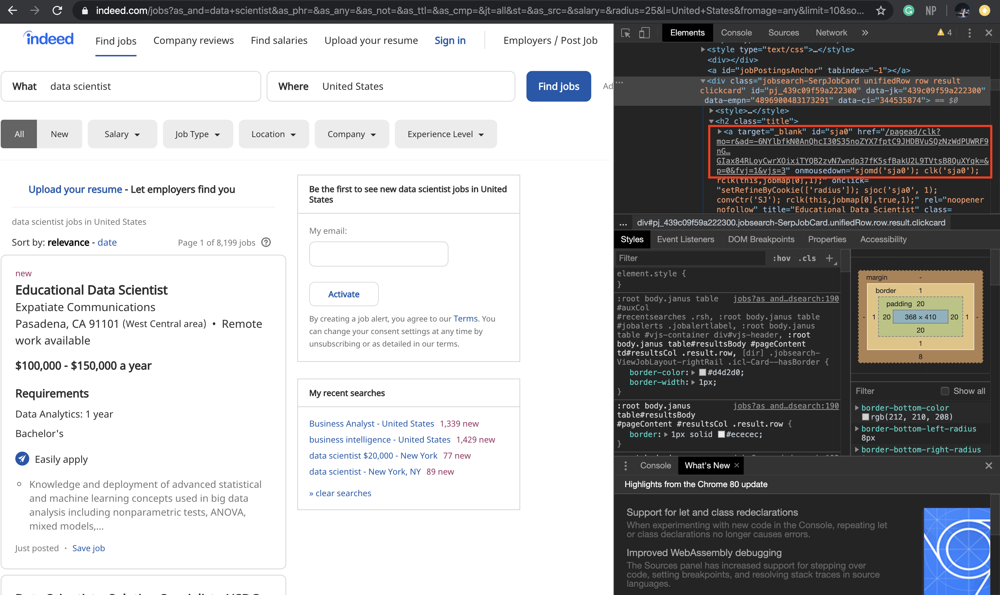

In [5]:
df

,Title,Company,Location,Salary,Summary,Link
0,Data Scientist,"Metron, Inc.","Reston, VA 20190 (Sunset Hills area)",None,As a Data Scientist you will be responsible fo...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...
1,Senior Data Scientist,TRANZACT,"Fort Lee, NJ 07024","$90,000 - $125,000 a year",Excellent understanding of machine learning te...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...
2,Data Scientist,ClearOne Advantage,"Baltimore, MD 21224 (Canton Industrial Area area)","$70,000 - $80,000 a year",We want to see a passion for machine-learning ...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...
3,Machine Learning Engineer,Apple,"Seattle, WA",None,"In this highly collaborative role, you will be...",https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...
4,Jr. Data Scientist | Development Team,DarkOwl,"Denver, CO",None,Work closely with our lead researchers to writ...,https://www.indeed.com/rc/clk?jk=24a7b392eb383...
...,...,...,...,...,...,...
1305,Senior Data Scientist,Humana,"Louisville, KY",None,Build smart systems that learn from health int...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...
1306,Data Scientist,Seen by Indeed,"Washington, DC",None,With one application you can be considered for...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...
1307,Data Scientist / Data Analytics,Tredence Inc.,"Seattle, WA","$100,000 - $130,000 a year",Data analytics: 3 years (Preferred).\nLead and...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...
1308,Clinical Data Scientist - Clinical Data Manage...,UTMB,"Galveston, TX 77550","$101,231 a year",Five years of clinical analytics experience in...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...


<b>Extract the job detailed description from each job's link, then write them into a new panda data frame.

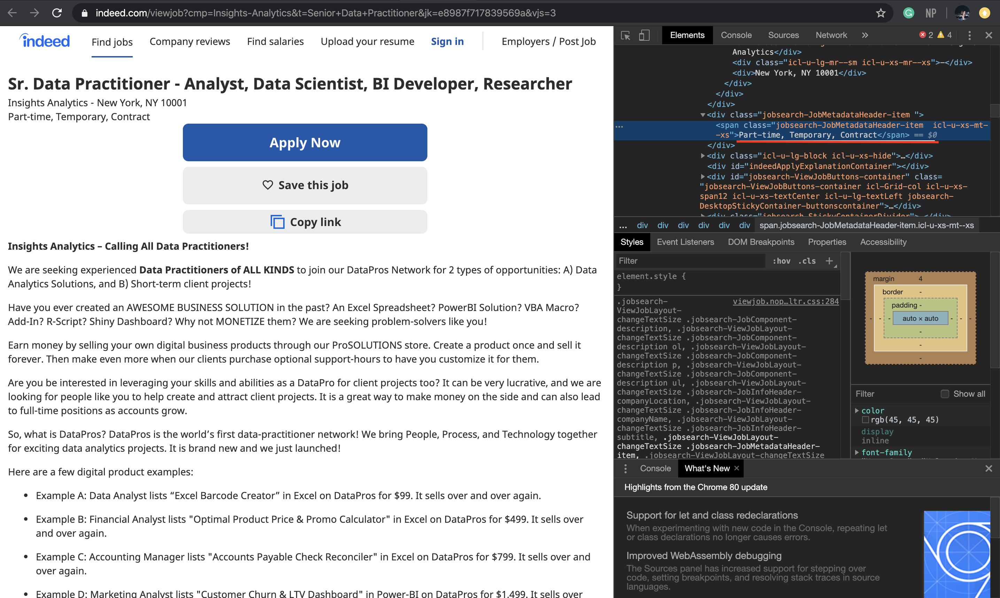

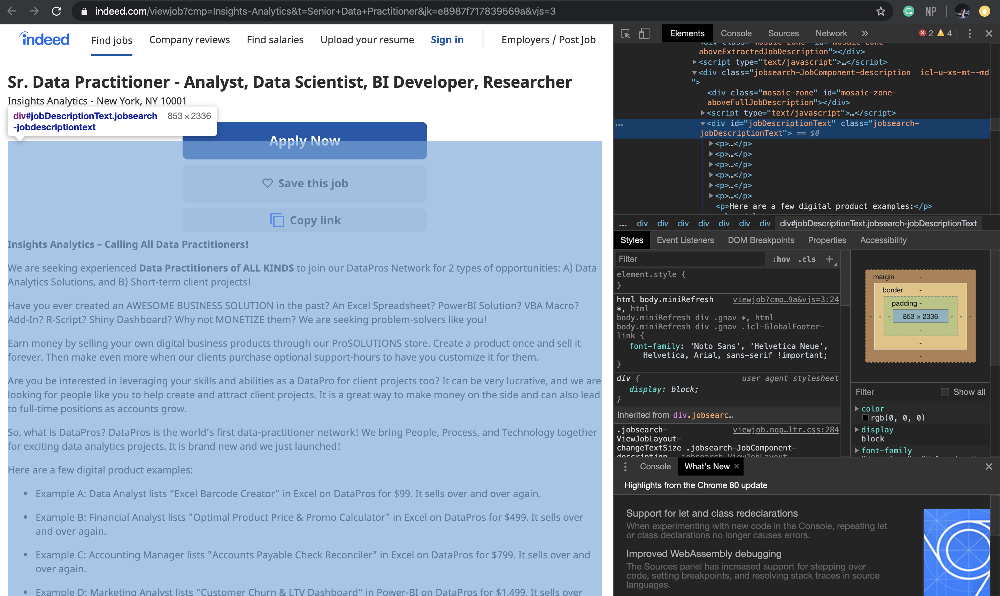

In [6]:
des = pd.DataFrame(columns=["Description",'Job Type'])

for i in range(len(df['Link'])):
    source = requests.get(df['Link'][i]).text
    soup = BeautifulSoup(source, 'html.parser', from_encoding="utf-8")
    
    # Get the job description, this the main body of the job link
    try:
        description = soup.find('div',{'id':'jobDescriptionText'}).text.strip()
    except:
        description = None
    print('Description:',description)
    
    # Get the job type
    try:
        jobtype = soup.find('span',class_='jobsearch-JobMetadataHeader-item').text.strip()
    except:
        jobtype = None
    print('Jobtype:',jobtype)
    
    
    print('-------------')
    des = des.append({'Description':description,'Job Type':jobtype}, ignore_index=True)


Description: Job Description:
Our Advanced Data Analytics division in Reston, VA is seeking a talented Data Scientist for R&D projects with large amounts of complex data. As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine learning and data mining problems. Applicants interested in applying only off-the-shelf solutions need not apply. Project teams are small, typically 2-5 people including Data Scientists, Mathematicians, and Software Developers. Each person is involved in the project’s entire process, from concept through design and implementation to demonstration. Our management structure gives you the freedom to create innovative designs and products. The ideal candidate will have experience writing well-documented, maintainable, and extensible software and APIs.
Required Qualifications:
Bachelor’s or Master’s degree in Machine Learning, Data Science, Computer Science, Mathematics,

Description: What does a Jr. Data Scientist do at DarkOwl?
The world needs more DarkOwls and fewer bad guys. We are experiencing a time of great growth and are expanding our Research Development team to generate algorithms, analytic tools, and publications that provide unprecedented capability and insights for our analysts and clients. The right person has strong software development skills, is curious, and is pro-active: rolling up their sleeves, jumping in, and helping making sense of our data so we can stay on the leading edge of darknet analysis.
This is a full-time position based in our downtown Denver office or remote for the right candidate.

What a day in the life of a Jr. Data Scientist looks like:
Work closely with our lead researchers to write, test, and develop analytical tools and solutions to help shape the future of our products.
Build software prototypes to explore our data, refine algorithms, and test our hypotheses.
Stay curious, working closely with our data, quickly

Description: Company Overview
Imagine if we could match patients with the treatments that prove the most effective for them . . .
GNS Healthcare applies a powerful form of AI called causal machine learning to predict which treatments and care management programs will work for which patients, improving individual patient outcomes and the health of populations while reducing the total cost of care.
Headquartered in the biotechnology and health IT center of Cambridge, MA, our patented REFS™ technology is based on recent breakthroughs in causal machine learning and AI that transforms massive quantities of patient data into computer models of disease at molecular, patient, and health system levels. These computer models power up solutions, products, and services that health plans, biopharmaceutical companies, health systems, and patient foundations utilize to slow disease progression, reduce adverse events and hospitalization, and improve therapeutic effectiveness. Our platforms and solutio

Description: Role: Content Data scientistLocation: Seattle, WAInterview Mode: Skype/VideoDuration: 12+ Months ContractMandatory Skills: Content Data Scientist Experience: Senior ResourceJob Description:Need senior candidates.Content Data Scientist This is true data scientist who will be working on content efficiency modelling, taste personas, content acquisition, forecast, Avod forecasting Etc.Work with stakeholders throughout the organization to identify opportunities for leveraging company data to drive business solutions.Mine and analyze data from company databases to drive optimization and improvement of product development, marketing techniques and business strategies.Assess the effectiveness and accuracy of new data sources and data gathering techniques.Develop custom data models and algorithms to apply to data sets.Use predictive modeling to increase and optimize customer experiences, revenue generation, ad targeting and other business outcomes.Develop company A/B testing framew

Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please find the Job Description below:About Us: Tredence is a global analytics services and solutions company. Our capabilities range from Data Visualization, Data Management to Advanced analytics, Big Data and Machine Learning. Our uniqueness is in bringing the right mix of technology and business analytics to create sustainable white-box solutions that are transitioned to our clients at the end of the engagement. We do this cost effectively using a global execution model leveraging our clients' existing technology and data assets. We also come in with strong IP and pre-built analytics solutions in data mining, business intelligence and Big Data.(Permanent Position) **Job Responsibilities: Lead and manage independently the onsite-offshore relation, at 

Description: Job Description:
Our Advanced Data Analytics division in Reston, VA is seeking a talented Data Scientist for R&D projects with large amounts of complex data. As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine learning and data mining problems. Applicants interested in applying only off-the-shelf solutions need not apply. Project teams are small, typically 2-5 people including Data Scientists, Mathematicians, and Software Developers. Each person is involved in the project’s entire process, from concept through design and implementation to demonstration. Our management structure gives you the freedom to create innovative designs and products. The ideal candidate will have experience writing well-documented, maintainable, and extensible software and APIs.
Required Qualifications:
Bachelor’s or Master’s degree in Machine Learning, Data Science, Computer Science, Mathematics,

Description: The Challenge:
Are you excited at the prospect of unlocking the secrets held by a data set? Are you fascinated by the possibilities presented by the IoT, machine learning, and artificial intelligence advances? In an increasingly connected world, massive amounts of structured and unstructured data open up new opportunities. As a data scientist, you can turn these complex data sets into useful information to solve global challenges. Across private and public sectors — from fraud detection, to cancer research, to national intelligence — you know the answers are in the data.
We have an opportunity for you to use your analytical skills to improve a Joint Combatant Command client. You’ll work closely with your client to understand their questions and needs, then dig into their data-rich environment to find the pieces of their information puzzle. You'll develop algorithms, write scripts, build predictive analytics, use automation, apply machine learning, and use the right combina

Description: About the Job
We now have more high-quality data than ever before, which allows us to answer hard questions in clinical oncology that were previously out of reach. As Data Scientist you will lead our efforts on analyzing real-world clinical and genomic data. Your focus will be on clinical use cases, such as biomarker-based outcomes analyses, examining correlates of genomics and clinical outcomes, clinical utility of next-generation sequencing, and the impact of diagnostics on patient care. You’ll join a mission-driven team of data scientists with diverse expertise and grow your analytical toolbox. Together, you’ll partner with product managers, engineering, and domain experts in oncology and genomics to advance the field.
To support your work, you will have access to the richest real world cancer genomics and clinical datasets; these include FoundationCORE, a repository of comprehensive genomic profiles and pathology images from 250,000+ patient tumor samples tested by Fou

Description: TD Securities provides a wide range of capital market products and services to corporate, government and institutional clients. The firm works with clients around the world, focusing selectively and strategically on the key financial centers: Toronto, Montreal, Calgary, Vancouver, New York, London, Singapore and Tokyo. www.td.com
Department Overview
The successful candidate will apply data & analytics techniques across data engineering to statistics and machine learning for investment banking situations. The array of projects includes client prospecting, relationship management, pricing, post trade analytics and risk management. It is a unique opportunity for a motivated candidate who is passionate about investment banking and can conceptualize innovative analytical products to deliver results. The candidate will work on projects ranging from business intelligence, descriptive metrics, predictive models and automated decision making. The goal is to add immense value to our

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: **Please only local candidates apply - thank you**ClearOne Advantage is a fast-growing company that is aggressively hiring due to increased business. We are always improving our marketing, culture and technology to provide our employees with the best work atmosphere and our customers with excellent customer service. COA’s proprietary software is tailored to our industry and allows the client to receive the best service possible.We are looking for a Data Scientist to analyze large amounts of raw information to find patterns that will help improve our company. We will rely on you to build data products to extract valuable business insights. In this role, you should be highly analytical with a knack for analysis, math and statistics. Critical thinking and problem-solving skills are essential for interpreting data. We want to see a passion for machine-learning and research. Your goal will be to help our company analyze trends to make better decisions.If you are looking to work

Description: As a data scientist at Triplebyte, you’ll have the opportunity to work on a variety of challenges to help us scale. You'll be part of a small team, who are leveraging data to fix technical hiring. Your day to day, will include a mix of dataset acquisition, statistical modeling, exploratory data analysis, and software engineering. You’ll report directly to Triplebytes' Head of Machine Learning and will work alongside a team of 6-8 machine learning engineers and data scientists.Fields your work will touch onPsychometricsRecommender systemsTime series analysisSurvival analysisBayesian inferenceProbabilistic programmingThis is an ideal role for a data scientist who wants the scope and responsibility to own features/products from the inception and research phase through to measuring real-world results.Job Type: Full-timeSalary: $150,000.00 to $225,000.00 /yearAdditional Compensation:Other formsWork Location:One locationFully RemoteBenefits:Health insuranceDental insuranceVision

Description: Role: Data ScientistLocation: Boston, MAData ScientistOne project they will support is the Lifetime Engagement space.They will be using data science to identify customers who would be interested in doing certain financial transactions- crossover, invest more, use for more active investment.This is a project to make more money for the firm and to help customers to reach financial goals.They will be creating models to use machine learning to identify that customer, then using that info to do outreach to customer by contact and marketing towards them.Job Types: Part-time, Contract
Jobtype: Part-time, Contract
-------------
Description: Company Description

Infotree Global Solutions: Leading Staffing Agency.

Job Description

******************** only for W2 candidate, no C2C ********************************
Position Title: Data Scientist
Location: Creve Coeur, Missouri
Duration: 12 Months
Note:- Must have internet access and ability to work from home initially due to Covid19 

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please 

Description: We are always looking for Data Scientists who want to work on challenging and interesting projects in a variety of industries.
Jobtype: None
-------------
Description: As a leading mobile games developer, Jam City is looking to “level up” our talent. We’re on the hunt for innovators who consider themselves dynamic, collaborative, and thrive in a fast-paced environment.

PERKS & BENEFITS
Unlimited Vacation, Paid Sick Days & Holidays
100% Employee Covered Medical, Dental, Vision Plan Base Plan
Life Insurance, 401k, Flexible Spending Accounts, Commuter Benefits & More
Catered Lunches & Well-stocked Kitchens
Yoga & Wellness Activities
Happy Hours
Company Events
Dog Friendly

Jam City is looking for passionate, engaged and data driven individuals to join our growing Data Science team. We are searching for Data Scientists ready to work across our portfolio of games and be involved in every part of the process of delivering fun to millions of users worldwide. Working with our sta

Description: Data mining using state-of-the-art methodsExtending company’s data with third party sources of information when neededEnhancing data collection procedures to include information that is relevant for building analytic systemsProcessing, cleansing, and verifying the integrity of data used for analysisDoing ad-hoc analysis and presenting results in a clear mannerCreating automated anomaly detection systems and constant tracking of its performanceJob Type: ContractWork Remotely:Temporarily due to COVID-19
Jobtype: Contract
-------------
Description: COMPANY OVERVIEW:

INFICON is a growing, global, leading provider of innovative technologies that enhances productivity and quality in sophisticated industrial processes. The products provided by INFICON are world-class instruments for gas analysis, measurement, and control and are vital to manufacturers and end-users in the complex fabrication of semiconductors and thin film coatings for optics, flat panel displays, solar cells, a

Description: THE COMPANY

What do you get when you cross the best of Silicon Valley innovation with farming and rural values? Farmer's Business Network, Inc.(FBN)!

We are proudly Farmers First®. FBN is an independent and unbiased network of thousands of American farms. By enabling thousands of farmers to work together, anonymously and securely to democratize information, the FBN network is helping our members level the playing field and putting power back into farmers' hands.

THE ROLE

How can we sustainably feed the world? With the population set to reach nine billion by 2050 and available farmland decreasing, the odds are stacked against us. This problem falls squarely on the shoulders of farmers, who are increasingly working harder for less. FBN helps farmers to solve these problems.

Farmers are often forced to make key decisions in the face of significant uncertainty about their impact. FBN applies technology and data science to this challenge. We're building the world's largest

Description: Summary
Posted: Apr 22, 2020
Role Number:200167237
The ML Platform Technologies team is looking for an exceptional software engineer to help foster a vibrant ecosystem for machine learning development tools.. In this highly collaborative role, you will be at the center of multiple efforts to make machine learning an accessible and powerful tool for all developers.
We are looking for someone with proven deep understanding of software development and familiarity with popular machine learning tools. You should have a strong mix of education and practical experience with a real passion for diving in to challenging problems head first.
Key Qualifications
Strong and proven software development skills
Solid Python coding skills
History of contributing to open source projects
Experience with and knowledge of machine learning libraries/packages
Knowledge of deep learning / neural networks
Passion for software architecture, API and development tool design
Creative, collaborative, an

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: Job Description


General Description
The Research and Evaluation Center of John Jay College of Criminal Justice (JohnJayREC) is an applied research organization established in 1975. We respond to the needs of justice practitioners locally, nationally, and internationally. The Research and Evaluation Center is part of John Jay College of Criminal Justice and the City University of New York. Since 2010, the Center has worked on projects with combined budgets in excess of $48 Million. Staff members of the Center assist public and private agencies by conducting studies of crime prevention strategies, the effectiveness of justice interventions, and efforts to improve the impact and efficiency of justice system operations. At any given time, staff members may be involved in several individual projects designed to discover, test, and improve programs and policies related to the justice system.


JohnJayREC seeks a Data Scientist/Database Manager to oversee data processes for Cen

Description: As a Data Scientist for the CIA, you will organize and interpret data to inform US decision makers, drive successful operations and shape CIA technology and resource investments. Through CIA's global mission, the Agency has access to unique and highly specialized data sets. You will work with advanced hardware, software and techniques to develop computational algorithms and statistical methods that find patterns and relationships in large volumes of data. Data Scientists clearly communicate their conclusions to a diverse audience and become experts through Agency-sponsored continuing education, attendance at academic and technical conferences as well as collaboration with the Intelligence Community.
Offices of the CIA – Directorate of Digital Innovation

The Directorate of Digital Innovation (DDI) is at the forefront of defining the future of digital expertise within the CIA. DDI focuses on developing the workforce with cutting-edge skills, investing in IT infrastructure, 

Description: Identifies trends and problems through complex big data analysis. Interprets results from multiple sources using a variety of techniques, ranging from simple data aggregation via statistical analysis to complex data mining independently.
Responsibilities
Designs, develops and implements the most valuable solutions for the organization. Prepares big data, implements data models and develops database and web applications to support the solutions.

Familiar with a variety of the field’s concepts, practices, and procedures. Ability to initiate and drive projects to completion with minimal guidance; the ability to communicate the results of analyses in a clear and effective manner. Basic understanding of statistical analysis. Relies on extensive experience and judgment to plan and accomplish goals. Performs a variety of tasks. Leads and directs the work of others. A wide degree of creativity and latitude is expected. Typically reports to a manager or head of a unit/department



Description: Summary
Posted: Apr 22, 2020
Role Number:200167237
The ML Platform Technologies team is looking for an exceptional software engineer to help foster a vibrant ecosystem for machine learning development tools.. In this highly collaborative role, you will be at the center of multiple efforts to make machine learning an accessible and powerful tool for all developers.
We are looking for someone with proven deep understanding of software development and familiarity with popular machine learning tools. You should have a strong mix of education and practical experience with a real passion for diving in to challenging problems head first.
Key Qualifications
Strong and proven software development skills
Solid Python coding skills
History of contributing to open source projects
Experience with and knowledge of machine learning libraries/packages
Knowledge of deep learning / neural networks
Passion for software architecture, API and development tool design
Creative, collaborative, an

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: Position Description:
This is an exciting full-time opportunity to work in a fast-paced environment with a team of passionate technologists. We take an innovative approach to supporting our client, working side-by-side in an agile environment using emerging technologies. As a solution builder, you will be working to support the client's mission and goals of building an enterprise analytics platform.

Your future duties and responsibilities:

Demonstrate in-depth technical capabilities with the ability to support multiple work streams and drive assimilation of new techniques and solutions.
Apply data and technical expertise in analysis, data mining and visualization of data using Business Intelligence tools and data development platforms.
Evaluate data quality using SQL and data analysis techniques that improve client-reporting capabilities.
Participate in team problem solving efforts and offer ideas to solve client issues.
Understand data needs and construct data pipelines

Description: Nokia is a global leader in the technologies that connect people and things. With state-of-the-art software, hardware and services for any type of network, Nokia is uniquely positioned to help communication service providers, governments, and large enterprises deliver on the promise of 5G, the Cloud and the Internet of Things. Serving customers in over 100 countries, our research scientists and engineers continue to invent and accelerate new technologies that will increasingly transform the way people and things communicate and connect.
Discovering the possibilities that shape the human experience are at the heart of everything we do. Our researchers are continually massively scaling the capabilities of networks from the data center to the end device, to change the way we live and work, by inventing breakthrough technologies to make networks and systems faster, smarter and greener.

At Nokia, employment decisions are made regardless of race, color, national or ethnic origi

Description: Performs exploratory research and analysis to identify novel and meaningful patterns in data and uses statistical methods to reject or accept proposed hypotheses about relationships or latent predictive factors discovered through their work to provide business value. Uses a combination of tools, technologies, and numerical computing systems (i.e.: GPU processing, distributed computing, highly parallel coding, cloud computing, machine learning, visualization, system modelling and simulation) to achieve results. Areas of expertise should include several of the following: applied statistics, text mining, natural language processing, deep learning, optimization, and other similar fields.
Basic Qualifications:
Work on datasets with applied statistics and machine learning algorithmsUse exploratory data analysis techniques to identify meaningful relationships, patterns, or trends from complex data sets and discover opportunities in datasets to support decision-makingDevelop predi

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please 

Description: Job Description:
Our Advanced Data Analytics division in Reston, VA is seeking a talented Data Scientist for R&D projects with large amounts of complex data. As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine learning and data mining problems. Applicants interested in applying only off-the-shelf solutions need not apply. Project teams are small, typically 2-5 people including Data Scientists, Mathematicians, and Software Developers. Each person is involved in the project’s entire process, from concept through design and implementation to demonstration. Our management structure gives you the freedom to create innovative designs and products. The ideal candidate will have experience writing well-documented, maintainable, and extensible software and APIs.
Required Qualifications:
Bachelor’s or Master’s degree in Machine Learning, Data Science, Computer Science, Mathematics,

Description: Summary
Posted: Apr 22, 2020
Role Number:200167237
The ML Platform Technologies team is looking for an exceptional software engineer to help foster a vibrant ecosystem for machine learning development tools.. In this highly collaborative role, you will be at the center of multiple efforts to make machine learning an accessible and powerful tool for all developers.
We are looking for someone with proven deep understanding of software development and familiarity with popular machine learning tools. You should have a strong mix of education and practical experience with a real passion for diving in to challenging problems head first.
Key Qualifications
Strong and proven software development skills
Solid Python coding skills
History of contributing to open source projects
Experience with and knowledge of machine learning libraries/packages
Knowledge of deep learning / neural networks
Passion for software architecture, API and development tool design
Creative, collaborative, an

Description: The Zebra, named a Best Place to Work in Austin four years running, is revolutionizing how connected consumers research and shop for insurance. The Zebra is highly invested in using Data Science to create the best insurance comparison experience for our users. To support this goal, we are expanding the Data Science team and seeking a mid-level data scientist to help us build data-driven products and personalize across the entire user journey.

As a Data Scientist at The Zebra, you will collaborate cross functionally, working with product managers, engineers, and analysts to identify opportunities and scope new data science projects. You’ll dig into data, build models, and design and analyze experiments to create the maximum impact for the business. You’ll work with software engineers to write production code and deploy models. As part of a small and highly autonomous team, you will have the unique opportunity to help define the data science process and Data Science team cu

Description: Domino’s Pizza, which began in 1960 as a single store location in Ypsilanti, MI, has had a lot to celebrate lately: we’re a reshaped, reenergized brand of honesty, transparency and accountability – not to mention, great food! In the rise to becoming a true technology leader, the brand is now consistently one of the top five companies in online transactions and 65% of our sales in the U.S. are taken through digital channels. The brand continues to ‘deliver the dream’ to local business owners, 90% of which started as delivery drivers and pizza makers in our stores.

That’s just the tip of the iceberg…or as we might say, one “slice” of the pie! If this sounds like a brand you’d like to be a part of, consider joining our team!
Jobtype: None
-------------
Description: We are currently looking to bring someone in for a Data Scientist role to work in a research and development oriented role. Initial interviews can take place early to mid April and will allow for the opportunity t

Description: Job Title:  Data ScientistLocation:  Phoenix, AZDuration:  Full TimeRole Description Hands on experience in predictive analytics and statistical tools, machine learning algorithms and big data toolsIdentify, analyze and interpret trends or patterns in complex data sets using various regression, classification or clustering ML approachesCreate visualizations to visually represent data for consumption by different audiencesJob Type: Full-time
Jobtype: None
-------------
Description: At Wish, our Data Science & Engineering team is comprised of Data Scientists, Data Analysts & Data Engineers who focus on centralizing corporate data in order to gain insights, knowledge and scalability, that empower a proactive and rigorous analysis of key business indicators. Our mission is to derive wisdom from data via the application of Data Science.

Wish has exciting opportunities for talented Data Scientists to form the foundation of our centralized data science team. Successful candidate

Description: Min Qualifications

EDUCATION & EXPERIENCE
Minimum Qualifications:
Master's degree in a quantitative discipline (applied mathematics, statistics, computational biology, bioinformatics or related field)
Five years of SQL experience
Five years of experience working with relational databases
Five years of clinical analytics experience in a healthcare or hospital environment
JOB DESCRIPTION
Scope/Function: Responsible for providing meaning to the data in our system and developing methods to leverage that data in our applications. Responsibilities include standardizing and cleaning data (Curation), building prediction models (Analytics), modeling clinical outcomes (Clinical Analytics), and developing metrics to monitor patient treatment and outcomes (Quality Measurement). Member of a cross-functional, collaborative team that works closely with other UTMB Discover teams.

Salary Range

The salary range for this position is $101,231/yr - $161,969/yr commensurate with experience
T

Description: **Please only local candidates apply - thank you**ClearOne Advantage is a fast-growing company that is aggressively hiring due to increased business. We are always improving our marketing, culture and technology to provide our employees with the best work atmosphere and our customers with excellent customer service. COA’s proprietary software is tailored to our industry and allows the client to receive the best service possible.We are looking for a Data Scientist to analyze large amounts of raw information to find patterns that will help improve our company. We will rely on you to build data products to extract valuable business insights. In this role, you should be highly analytical with a knack for analysis, math and statistics. Critical thinking and problem-solving skills are essential for interpreting data. We want to see a passion for machine-learning and research. Your goal will be to help our company analyze trends to make better decisions.If you are looking to work

Description: Responsibilities
TikTok is the leading destination for short-form mobile video. Our mission is to inspire creativity and bring joy.
Key Responsibilities：
1. Work with engineers to design machine learning solutions for anti-abuse systems
2. Partner with operatives to quickly respond to rapidly evolving threats
Qualifications
Minimum Requirements：
1. BS degree in Computer Science, Computer Engineering, Electrical Engineering or other relevant majors with 2+ year of work experience
2. Solid technical / data-mining skills and ability to work with large volume data to detect and identify abusive actions in Bytedance products (e.g. TikTok)
3. Ability to think critically and to formulate solutions to problems in a clear, concise and timely manner
4. 2+ years of industry experience in predictive analytics and/or statistical modeling role
Jobtype: None
-------------
Description: Project: LA County Novel Coronavirus (COVID-19) Epidemiology Data Project (Activity #2)

SUMMARY

This p

Description: Exciting opportunity as a Data Scientist for top financial firm in NYC.We offer award-winning desktop, mobile and web applications which provide our clients with the tools they need to be successful. The company was founded by a software engineer to rewrite the rules of trading by automating anything and everything. Software development is the lifeblood of our firm, and it shows. Our engineers work with latest technology, command respect in the firm, and have competitive compensation packages.We are looking for a Data Scientist. The successful candidate will execute analytical tasks on large data sets to support decision makers and provide insight and reports about our platforms. The data scientist role will use data to help us better understand who our clients are, how they engage with our products and services and how we can better serve them by identifying interesting and useful trends in our data. You will make an impact by using your passion for data and analysis to g

Description: Marvis is Mist’s AI based interface which is used by customers to ask questions in order to obtain answers while troubleshooting and/or which would help them in troubleshooting Wi-Fi issues. Since this is customer facing and potentially high customer value, it is critical to ensure the interface is easy to use, helps customers’ questions get answered, understands their needs/concerns and continually improves so that it is ever evolving.

We are looking for a Data Analyst Intern to help us in the above and specifically to:
Determine customers’ experience when they use Marvis for the 1st time vs recurringly and provide insights into how their experience can be further improved.
Track and trend how many 1st time users return back to Marvis. For those who don’t, provide reasons as to why are they not returning and what could be done to improve.
Continually track overall number of Marvis users based on daily, weekly, monthly usage.
Identify power users of Marvis and ascertain w

Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please find the Job Description below:About Us: Tredence is a global analytics services and solutions company. Our capabilities range from Data Visualization, Data Management to Advanced analytics, Big Data and Machine Learning. Our uniqueness is in bringing the right mix of technology and business analytics to create sustainable white-box solutions that are transitioned to our clients at the end of the engagement. We do this cost effectively using a global execution model leveraging our clients' existing technology and data assets. We also come in with strong IP and pre-built analytics solutions in data mining, business intelligence and Big Data.(Permanent Position) **Job Responsibilities: Lead and manage independently the onsite-offshore relation, at 

Description: Pomeroy is seeking a Data Scientist to work in either Atlanta, GA, Dallas, TX, Chicago, IL or Kansas City offices. Right now this role is allowed to work 100% remote as long as you have previous experience working remote. You must be our W2 Employee!! NO 3rd parties are allowed!!Required Skills: Advanced Degree (Masters or PhD) in Physics, Operations Research, Mathematics, Neuroscience, Computer Science, or StatisticsAdvanced understanding of time-series forecasting for commodities/equities trading or supply chain demand planningExperience with advanced techniques in non-linear dimensionality reduction and/or manifold learning to leverage large amounts of enrichment data for feature extractionExperience with cloud-based development environment for storage and model training; AWS, Google, Cloud, AzureResponsibilities: Work with product managers, analysts, and clients to better understand the business problemThink through a business problem and formulate approach based on su

Description: Company Description

As an Etsy employee, you can do the work you love, be yourself, and make an impact in the lives of millions. Our commitments to diversity and inclusion, team culture and the spaces where we work all reflect our mission to keep commerce human.

Job Description

Etsy is an international marketplace with 50M+ handmade and vintage items from passionate artists, designers and vintage collectors. Our Data Science & Machine Learning (DSML) organization’s objective is to help our 60M+ buyers find remarkable goods, and our 2M+ entrepreneurs better run their businesses.
Within the DSML org, the Applied Machine Learning (AML) Team works closely with product teams to develop custom machine-learning models that can drive product vision and customer impact. We are looking for individuals who are product and delivery-driven, and are passionate about making ML innovations in the areas of search ranking, recommendations, information retrieval, and computational adverti

Description: Position Summary:
Domo is changing the way Executives manage their business. Pivotal within the most innovative business management platform. As a Data Scientist at Domo, you will help implement the applicable big data systems and help create and implement algorithms in relevant statistical inference.
Team Culture:
Work – Are you someone who has ideas and will stop at nothing until those ideas are made a reality?


Fight – Domo looks for individuals who can drive their own ideas forward and who can also support the initiatives within their team.


Innovate – Are you someone that can’t stand the status-quo? Do you improve upon the ideas of others?


Create – Like to build? Do you have a creative drive? Domo has a culture that embraces creativity.


Serve – We’re all about the customer. We expect you to be relentless in your defense of the customer experience. We’ll do the same.


Key Responsibilities:
Understand existing business flow and website features, dive into the und

Description: Summary
Posted: Apr 22, 2020
Role Number:200167237
The ML Platform Technologies team is looking for an exceptional software engineer to help foster a vibrant ecosystem for machine learning development tools.. In this highly collaborative role, you will be at the center of multiple efforts to make machine learning an accessible and powerful tool for all developers.
We are looking for someone with proven deep understanding of software development and familiarity with popular machine learning tools. You should have a strong mix of education and practical experience with a real passion for diving in to challenging problems head first.
Key Qualifications
Strong and proven software development skills
Solid Python coding skills
History of contributing to open source projects
Experience with and knowledge of machine learning libraries/packages
Knowledge of deep learning / neural networks
Passion for software architecture, API and development tool design
Creative, collaborative, an

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: Note: By applying to this position your application is automatically submitted to the following locations: Mountain View, CA, USA; Chicago, IL, USA; New York, NY, USA
Minimum qualifications:

Bachelor's degree in Statistics, Computer Science, Engineering, or Mathematics, related quantitative discipline, or equivalent practical experience.
Experience in data science with a focus on marketing analytics, statistical modeling, machine learning, forecasting and optimization.
Advanced experience in Python and/or R, and advanced experience in data management systems.
Preferred qualifications:

PhD in Statistics, Computer Science, Engineering, or Mathematics.
Experience with big data and cloud platforms to deploy large-scale data science solutions.
Experience working in industries such as retail, financial services, telecommunications and automotive (including in a client-facing consulting or advisory capacity), and the ability to navigate complex business organizations and manage

Description: Bayer is a global enterprise with core competencies in the Life Science fields of health care and agriculture. Its products and services are designed to benefit people and improve their quality of life. At Bayer you have the opportunity to be part of a culture where we value the passion of our employees to innovate and give them the power to change.

Biotech Data Scientist




YOUR TASKS AND RESPONSIBILITIES

The primary responsibilities of this role, Biotech Data Scientist, are to:
Work with partners across the Biotech organization to turn data into critical information and knowledge for improved process understanding to facilitate data driven decisions making;
Query large sets of structured and unstructured data from disparate sources, cleans and validates the data to ensure accuracy, completeness, and uniformity for analysis;
Perform advanced statistical analyses and data mining using state of the art methods, develops mathematical models to simulate biomanufacturing pr

Description: Data Scientist / Machine Learning Engineer / Software EngineerAt our laboratory located in Department of Bioinformatics, UT Southwestern Medical Center, we're building better machine learning systems to effectively extract knowledge and build predictive models from large-scale genomic and biomedical data. Machine learning is at the core of everything that we do, and we are looking for a motivated, creative, results-oriented data scientist to develop novel models and improve every part of the workflow in machine learning in genomics research. This is a high-impact position that will contribute to the very heart of our research. You will have the potential to make novel discoveries in genomics and medicine, improve our understanding to human diseases, and develop technologies with a broad range of users in biomedical community.What you'll do: Develop novel, production-ready machine learning models for genomics using our in-house neural network architecture, open source tools

Description: Summary
Posted: Apr 22, 2020
Role Number:200167237
The ML Platform Technologies team is looking for an exceptional software engineer to help foster a vibrant ecosystem for machine learning development tools.. In this highly collaborative role, you will be at the center of multiple efforts to make machine learning an accessible and powerful tool for all developers.
We are looking for someone with proven deep understanding of software development and familiarity with popular machine learning tools. You should have a strong mix of education and practical experience with a real passion for diving in to challenging problems head first.
Key Qualifications
Strong and proven software development skills
Solid Python coding skills
History of contributing to open source projects
Experience with and knowledge of machine learning libraries/packages
Knowledge of deep learning / neural networks
Passion for software architecture, API and development tool design
Creative, collaborative, an

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: Position Description
We are seeking a Data Scientist professional in our Sunnyvale, CA office.

Duties: Build state-of-the-art Machine Learning models by ingesting and training terabytes of customer data from various Wal-Mart channels and optimize the models to achieve business objectives. Design and implement highly scalable distributed systems and storage using advanced algorithms and cutting-edge technologies. Design and implement large scale data models to analyze, interpret, and present complex customer data with efficient and scalable implementation using numerically intensive learning algorithms. Work in Agile development environment with the scrum team. Own end-to-end data science solutions and provide regular metrics for model performance analysis. Drive development and deployment of key machine learning components and features. Design and implement highly scalable deep learning models for large streaming data.

#LI-DNP; #LI-DNI

Minimum Qualifications
Minimum edu

Description: Mandatory Skills:
Content Data
Note:
Screen the profiles properly and ensure the delivery part (Work authorization, Relocation to client site and Rate).
Work authorization and Photo id copy is must for visa dependent candidates. Also share the candidates LinkedIn Id in submission details.
Don’t send H1 transfer candidates and share only 1 or 2 best profiles. Will prefer the local profiles first.

Job description:
Need senior candidates.
This is true data scientist who will be working on content efficiency modelling, taste personas, content acquisition, forecast, Avod forecasting Etc.
Work with stakeholders throughout the organization to identify opportunities for leveraging company data to drive business solutions.
Mine and analyze data from company databases to drive optimization and improvement of product development, marketing techniques and business strategies.
Assess the effectiveness and accuracy of new data sources and data gathering techniques.
Develop custom data 

Description: Data Scientist
We are an equal opportunity employer: qualified applicants are considered for and treated during employment without regard to race, color, creed, religion, sex, national origin, citizenship status, disability status, protected veteran status, age, marital status, sexual orientation, gender identity, genetic information, or any other characteristic protected by law. If a qualified individual with a disability or disabled veteran needs a reasonable accommodation to use or access our online system, that individual should please contact 1.877.734.1938 or accommodations@relx.com.
Risk & Business Analytics (RBA) provides customers with innovative solutions and decision tools that combine public and industry specific content with advanced technology and analytics to assist them in evaluating and predicting risk while enhancing operational efficiency through eight unique brands. RBA is a market segment of RELX and has more than 8,500 employees serving customers in o

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please 

Description: Data Scientist
We are hiring a Data Scientist to be involved in several multi-year BRAIN Initiative related NIH and NSF funded projects. These projects focus on understanding cortical computation during behavior by combining large-scale population recordings, anatomical reconstructions, and transcriptional profiling as well as developing tools for large-scale and high-speed imaging of neuronal populations. This person will be involved in help to analyze experimental data, developing software tools to aid in the data analysis, and helping with data infrastructure and management.
Specific Projects include:
Analysis of dense electron microscope reconstructions of neuronal connectivity (ie. Connectomics)
Establishing pipeline for image analysis for in situ sequencing of gene expression
Establishing pipeline for automated behavioral training and analysis.
Visualization and analysis of population imaging data across multiple brain areas during behavior.
Required Skills
BA/BS deg

Description: Who is Trace3?

Trace3 is a leading Transformative IT Authority, providing unique technology solutions and consulting services to our clients. Equipped with elite engineering and dynamic innovation, we empower IT executives and their organizations to achieve competitive advantage through a process of Integrate, Automate, Innovate.

Our culture at Trace3 embodies the spirit of a startup with the advantage of a scalable business. Employees can grow their career and have fun while doing it!

Trace3 is headquartered in Irvine, California. We employ more than 850 people all over the United States. Our major field office locations include Atlanta, Denver, Detroit, Indianapolis, Grand Rapids, Lexington, Los Angeles, Louisville, San Diego, San Francisco, and Scottsdale.

Ready to discover the possibilities that live in technology?

Come Join Us!

Street-Smart - Thriving in Dynamic Times

We are flexible and resilient in a fast-changing environment. We continuously innovate and dri

Description: Position Description
We are seeking a Data Scientist professional in our Sunnyvale, CA office.

Duties: Build state-of-the-art Machine Learning models by ingesting and training terabytes of customer data from various Wal-Mart channels and optimize the models to achieve business objectives. Design and implement highly scalable distributed systems and storage using advanced algorithms and cutting-edge technologies. Design and implement large scale data models to analyze, interpret, and present complex customer data with efficient and scalable implementation using numerically intensive learning algorithms. Work in Agile development environment with the scrum team. Own end-to-end data science solutions and provide regular metrics for model performance analysis. Drive development and deployment of key machine learning components and features. Design and implement highly scalable deep learning models for large streaming data.

#LI-DNP; #LI-DNI

Minimum Qualifications
Minimum edu

Description: Min Qualifications

EDUCATION & EXPERIENCE
Minimum Qualifications:
Master's degree in a quantitative discipline (applied mathematics, statistics, computational biology, bioinformatics or related field)
Five years of SQL experience
Five years of experience working with relational databases
Five years of clinical analytics experience in a healthcare or hospital environment
JOB DESCRIPTION
Scope/Function: Responsible for providing meaning to the data in our system and developing methods to leverage that data in our applications. Responsibilities include standardizing and cleaning data (Curation), building prediction models (Analytics), modeling clinical outcomes (Clinical Analytics), and developing metrics to monitor patient treatment and outcomes (Quality Measurement). Member of a cross-functional, collaborative team that works closely with other UTMB Discover teams.

Salary Range

The salary range for this position is $101,231/yr - $161,969/yr commensurate with experience
T

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable grow

Description: The Operational Design Center is a capability within Global Clinical Operations, the engine that makes clinical trials happen at EMD Serono. The ODC 2020 Summer Intern will use data and analytics to create baseline metrics and targets for Key Performance Indicators for our Clinical Trial portfolio. Using your skills in analytics, statistics, and your familiarity with databases you will curate, analyze, and produce visualizations for teams and management. Your work will help us identify areas for process improvements and the data collection methods to enable a sustainable workflow going forward. If you are a self-starter who is always curious to understand what happened, we’d like to talk to you!CapabilitiesHighly skilled in excelFamiliarity with databases, statistics, and analyticsCurious analytical mindsetSelf-starterInterest in pharmaceutical drug developmentPotential Academic MajorsBiostatsData SciencePre-medDrug developmentPharmacologyMedical Lab SciencePublic HealthMi

Description: Description:
You will be responsible for developing data science solutions for the human capital (human resources) domain while working with other technology experts.
You will use large structured and unstructured data sets, graph technology, machine learning algorithms, analytical methods, and data visualization to help, understand and improve its workforce in novel ways.

Job Responsibilities
Partner with data engineers and software engineers to develop a robust graph database
Effectively communicate with analytics experts, software engineers, and business leaders, conveying complex concepts in simple ways
Create unstructured machine learning solutions using vector space modeling (e.g. cosine similarity), clustering algorithms, anomaly detection algorithms, and other methods.
Develop data visualizations for effective story telling
Institute new data validation practices with dashboard metrics
Operate across a variety of technical environments and operating systems, inclu

Description: “Join us to make the world's roadways smarter and Safer”

“Join us if you have true passion to improve traffic safety”
“Join us to implement technologies shaping the automotive future”



Savari, a leader in V2X technology is seeking talented and highly motivated Data Scientist for its

Santa Clara Engineering team. Savari seeks to make the world's roadways smarter and safer by

deploying advanced wireless sensor technologies and software’s for V2X environment. With more

than 150 man-years of V2X learning and development and 15 million-plus miles per year of public

testing, Savari is headquartered in Santa Clara, CA and has offices in Detroit, Germany, India and

China. The company is comprised of a core team of industry veterans from the automotive,

semiconductor, software and telecom industries.

www.savari.net

Roles & Responsibilities What you will do
Help product team to set up tests and perform statistical analysis on results to provide actionable
Insights.
Analyz

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please 

Description: Job Description:
Our Advanced Data Analytics division in Reston, VA is seeking a talented Data Scientist for R&D projects with large amounts of complex data. As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine learning and data mining problems. Applicants interested in applying only off-the-shelf solutions need not apply. Project teams are small, typically 2-5 people including Data Scientists, Mathematicians, and Software Developers. Each person is involved in the project’s entire process, from concept through design and implementation to demonstration. Our management structure gives you the freedom to create innovative designs and products. The ideal candidate will have experience writing well-documented, maintainable, and extensible software and APIs.
Required Qualifications:
Bachelor’s or Master’s degree in Machine Learning, Data Science, Computer Science, Mathematics,

Description: Exciting opportunity as a Data Scientist for top financial firm in NYC.We offer award-winning desktop, mobile and web applications which provide our clients with the tools they need to be successful. The company was founded by a software engineer to rewrite the rules of trading by automating anything and everything. Software development is the lifeblood of our firm, and it shows. Our engineers work with latest technology, command respect in the firm, and have competitive compensation packages.We are looking for a Data Scientist. The successful candidate will execute analytical tasks on large data sets to support decision makers and provide insight and reports about our platforms. The data scientist role will use data to help us better understand who our clients are, how they engage with our products and services and how we can better serve them by identifying interesting and useful trends in our data. You will make an impact by using your passion for data and analysis to g

Description: Experiment engineers will be expected to help define and develop our core software for designing and deploying advanced experiments.
Jobtype: None
-------------
Description: Perform data quality analysis.
Develop data modeling and data driven solutions based on business requirements.
Develop analytical procedures, systems and workflows.
Develop data aggregation from different sources, cleansing, and transformation.
Define data quality gaps and make recommendations.
Use complex Machine Learning, data Mining, mathematical and statistical techniques
Jobtype: None
-------------
Description: Job Description
DataSprouts is looking for a Junior Data Scientist to join our team in Bloomington,IN. Data Scientist will work in close collaboration with our team to implement large-scale data ecosystems including data management, governance and the integration of structured and unstructured data to generate insights leveraging cloud-based platforms.
Leverage automation, cognitive and sci

Description: Summary
Posted: Apr 22, 2020
Role Number:200167237
The ML Platform Technologies team is looking for an exceptional software engineer to help foster a vibrant ecosystem for machine learning development tools.. In this highly collaborative role, you will be at the center of multiple efforts to make machine learning an accessible and powerful tool for all developers.
We are looking for someone with proven deep understanding of software development and familiarity with popular machine learning tools. You should have a strong mix of education and practical experience with a real passion for diving in to challenging problems head first.
Key Qualifications
Strong and proven software development skills
Solid Python coding skills
History of contributing to open source projects
Experience with and knowledge of machine learning libraries/packages
Knowledge of deep learning / neural networks
Passion for software architecture, API and development tool design
Creative, collaborative, an

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: Are you a driven and inquisitive data scientist? Do you love finding insights in large, unique datasets? Want to play a crucial role at a dynamic company?
Join Arosys as a Data Scientist! As part of this fast-growing team, you’ll develop deep insights for our business units to execute as we continue to grow, and have a tremendous impact on the success of a game-changing company.

What you’ll do:
Extract actionable insights from huge volumes of data using data mining, statistics, and database techniques.
Work cross-functionally to identify problems in different areas where data mining/machine learning/statistics can help.
Conduct studies, rapid pilots, and use advanced data mining and modelling techniques to build solutions that optimise the quality and performance of our data.
Analyse data quality issues and identify root causes and remedies.
Simplify and explain data science work examples to non-quant business users.
What’s required:
Fluency in modern advanced analytical 

Description: Each month over 500,000 contractors and suppliers connect on Levelset's cloud-based platform to make payment processes stress-free. Users easily exchange payment documents like lien waivers, pay applications, and preliminary notices, they see a complete picture of who is on their job, and are empowered with the resources and knowledge they need to be confident in payment. The results are faster payments and fewer surprises.

All of this activity generates millions of entities, records, attribution, and entity relationships. We use this data to create insights about the payment activity of projects and contractors, which helps our users get paid. That's where you come in.

You'll be Levelset's first Data Scientist and have the opportunity to influence how we expand our data science use cases across the business and products. You will need to be a "data utility player" and be prepared to be able to move data around, analyze opportunities, select the tools and build the infra

Description: Summary
Posted: Apr 21, 2020
Weekly Hours: 40
Role Number:200165632
Imagine what you could do here. At Apple, new ideas have a way of becoming extraordinary products, services, and customer experiences very quickly. Bring passion and dedication to your job and there's no telling what you could accomplish.
The people here at Apple don’t just craft products - they build the kind of wonder that’s revolutionized entire industries. It’s the diversity of those people and their ideas that encourages the innovation that runs through everything we do, from amazing technology to industry-leading environmental efforts. Join Apple, and help us leave the world better than we found it.
As an AppleCare Data Scientist you will have the potential for a high level of executive exposure and the opportunity to lead and facilitate critical service initiatives at Apple. You would be part of a tightly knit and influential team chartered with crafting and measuring business critical KPI for Apple

Description: The UCSF Center for Digital Health Innovation (CDHI) is seeking an experienced Data Scientist to join our SmarterHealth Initiative team working on developing advanced analytic tools for deployment at the point of care. The ideal candidate applies advanced computational, computer science, data science, and CI software research and development principles, with relevant domain science knowledge where applicable, to perform highly complex research, technology and software development which involve in-depth evaluation of variable factors impacting medium to large projects of broad scope and complexities addressing health care challenges. Designs, develops, and optimizes components / tools for data science / CI projects, research and technology groups and management; evaluates new hardware technologies.


The Data Scientist resolves complex research and technology development and integration issues. Gives technical presentations to associated research and technology groups and m

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please 

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: Looking for trainees for AI, Big Data, CloudLocation: Iselin-NJClient- Raps Consulting Inc.Good to have:· fresh Masters graduates who have specialized in computer science only· should have done some college projects on AI, Cloud, Big Data· has strong interest in making a career in Big Data, Data Sciences· should be local in the central NJ areaJob Types: Part-time, InternshipWork Remotely:Temporarily due to COVID-19
Jobtype: Part-time, Internship
-------------
Description: THE ROLE

As a data scientist, you'll be responsible for diving into our data lake, uncovering the latest interesting insights, and visualizing them in dazzling ways. You'll work with the Peloton App team to understand behavior during our user journey and develop data-driven recommendations with a focus on measurable results. As part of the Data Science team you'll work with data scientists and engineers that interface with the entire company, cross-pollinating analytic and business insights to the benefi

Description: Data Services Analyst InternThe Candid Data Services Team has a critical role to play at Candid. Leveraging over 20 years of nonprofit data this team provides a continuous stream of valuable data services and insights about the sector to a wide range of external and internal stakeholders every day. We are looking for a Full Time Data Analyst Intern to join our Data Services team this summer.See the world. Make it better. On February 1, 2019 Foundation Center and GuideStar joined forces to become Candid, a 501c3 nonprofit organization. Candid connects people who want to change the world to the resources they need to do it.Every year, millions of nonprofits spend trillions of dollars around the world. Candid finds out where that money comes from, where it goes, and why it matters. Through research, collaboration, and training, Candid connects people who want to change the world to the resources they need to do it. Candid’s data tools on nonprofits, foundations, and grants ar

Description: Description:

Leads and participates in the development, validation and delivery of algorithms, statistical models and reporting tools. Solves complex analytical problems.
70659

Fundamental Components:

Develops and/or uses algorithms and statistical predictive models and determines analytical approaches and modeling techniques to evaluate scenarios and potential future outcomes. Performs analyses of structured and unstructured data to solve multiple and/or complex business problems utilizing advanced statistical techniques and mathematical analyses and broad knowledge of the organization and/or industry. Collaborates with business partners to understand their problems and goals, develop predictive modeling, statistical analysis, data reports and performance metrics. Develops and participates in presentations and consultations to existing and prospective constituents on analytics results and solutions. Interacts with internal and external peers and managers to exchange co

Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please find the Job Description below:About Us: Tredence is a global analytics services and solutions company. Our capabilities range from Data Visualization, Data Management to Advanced analytics, Big Data and Machine Learning. Our uniqueness is in bringing the right mix of technology and business analytics to create sustainable white-box solutions that are transitioned to our clients at the end of the engagement. We do this cost effectively using a global execution model leveraging our clients' existing technology and data assets. We also come in with strong IP and pre-built analytics solutions in data mining, business intelligence and Big Data.(Permanent Position) **Job Responsibilities: Lead and manage independently the onsite-offshore relation, at 

Description: Summary
Posted: Apr 22, 2020
Role Number:200167237
The ML Platform Technologies team is looking for an exceptional software engineer to help foster a vibrant ecosystem for machine learning development tools.. In this highly collaborative role, you will be at the center of multiple efforts to make machine learning an accessible and powerful tool for all developers.
We are looking for someone with proven deep understanding of software development and familiarity with popular machine learning tools. You should have a strong mix of education and practical experience with a real passion for diving in to challenging problems head first.
Key Qualifications
Strong and proven software development skills
Solid Python coding skills
History of contributing to open source projects
Experience with and knowledge of machine learning libraries/packages
Knowledge of deep learning / neural networks
Passion for software architecture, API and development tool design
Creative, collaborative, an

Description: As FarmTogether’s first data scientist, you will lead the charge of building our analytical infrastructure and driving insights that define improvements in how we operate. We process data about millions of acres to source the most attractive investment opportunities in U.S. farmland. We’re looking for a talented data scientist to help us understand and build better operations. In this role, you will apply statistical models, build mission-critical dashboards, and help structure and order our data in the pursuit of transparency over how we operate and how we can improve.We are creating a technology-driven trading platform for a brand new asset class out of the $9 trillion global farmland market, previously only accessible to the largest institutional investors. This is a unique opportunity to join at the very beginning of this exciting journey and help grow a truly innovative financial product. We already have $50M+ in farmland opportunities and it is just the beginning.In 

Description: As a Data Scientist at BICP your role is to analyze, visualize, and model data. You’ll build and implement machine learning models to make more efficient and effective decisions. We are looking for a mixture between a statistician, scientist, machine learning expert and engineer: someone who has passion for building and improving Internet-scale products informed by data. Bachelor’s degree required and Master’s is preferred.
Jobtype: None
-------------
Description: About Hungryroot
Hungryroot is an online grocery service that delivers modern, healthy food with recipe and meal planning support. Hungryroot's mission is to help people feel their best by making it easier to shop for, cook, and love healthy food. In addition to offering a curated selection of modern brands, Hungryroot develops its own in-house line of innovative healthy products—like Black Bean Brownie Batter—and is challenging the traditional CPG model by building a customer-driven innovation platform to push o

Description: Job Description

A rewarding career opportunity using analytics, deductive reasoning, applied logic, and various communication techniques to inform decision making and meet data needs for the Utah Medicaid budget. The position is with the Bureau of Financial Services in the Medicaid program.

For information about Utah's Medicaid program please click here.

A skills test in SQL and MS Excel will be administered to assess skills needed for this position.

Preference may be given to applicants with:
A completed Master's degree in Business Administration, Public Administration, Mathematics, Finance, Information Systems, Accounting or a related field;
Advanced knowledge of SAS, R, SPSS, or other statistical software.
Minimum qualifications:
Bachelor's degree in Business Administration, Public Administration, Mathematics, Finance, Information Systems, Accounting or a related field;
Advanced knowledge of Microsoft Excel;
Advanced knowledge of Structured Query Language.
Why work 

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable grow

Description: Who You Are
-----------

You are a full-stack data scientist, an experienced quantitative thinker who wants to develop further as both a data scientist and an engineer. You are skilled at finding the precise mathematical kernels of real-world problems and want to bring that talent to bear on the business questions facing the world's leading companies. You are excited to apply your existing expertise in fields such as statistics and computer science on Quantifind's state-of-the-art infrastructure. You are excited to work at a startup where you will have a chance to expand your scientific and engineering skills to new areas. You share Quantifind's commitment to winning together, and are eager to see your coworkers build on the technical foundations you will be creating. You are passionate about maintaining the high scientific and engineering standards required to enable your peers. Above all, you are a curious and independent problem solver who is motivated to find a place w

Description: Atlas Executive Consulting, LLC (Atlas), has an exciting opportunity for a Junior Data Scientist to support a federal client and internal business intelligence and analytics strategy in the Charleston, SC area. The ideal candidate is a self-starter with a passion for solving problems by leveraging technology.
Minimum Qualifications:
Bachelor’s degree in Operations Research, Engineering, Analytics, Data Science, Economics, Applied Mathematics, Statistics, or a related field preferred
Experience with developing solutions using data science and visualization tools and languages, including R, Python, Tableau, and/or SQL
Experience with developing statistical and simulation models
Experience with discrete event simulation, extract, transform, and load (ETL) processes
Ability to consult with non-technical audiences on technical problems, work in a highly collaborative, team-oriented environment, and balance long- and short-term taskings
Ability to obtain a DoD security clearance

Description: Come join our team, and together we’ll realize the true potential of gene therapy!

Who we are

Dyno Therapeutics is a Cambridge based, VC-backed biotech startup that uses next-gen DNA technologies and machine learning to engineer Adeno-associated Virus (AAV) capsids for the effective delivery of gene therapies.

What we offer you

As a member of our quickly growing company, you’ll help us shape Dyno into a startup that takes its scientific mission seriously and provides a positive and supportive workplace environment. Dyno will have the opportunity to benefit from your insight, skills, and talent while enriching your professional and scientific experience as we grow the company together.

Our mission

At Dyno, we are expanding the boundaries of gene therapy. AAV capsids are currently the vector of choice for gene therapy, but they are only a starting point in the gene therapy revolution. Dyno aims to dramatically extend the reach of gene therapy by overcoming the limitati

Description: Join Invent to become a part of a talented team of innovators who are passionate about
creating cutting-edge data analytics technology. We are seeking talented and motivated
engineers and data scientists to develop advanced forecasting and optimization solutions.

Invent Analytics is a leader in the field of retail analytics. We provide software-as-a service solutions and consulting services to major retailers in Europe and the U.S. Our solutions encapsulate intelligent business logic, utilizing optimization techniques, forecasting and decision-making algorithms.

We are currently seeking full-time Junior Data Scientists to join our Philadelphia office.

Qualifications

BSc / MSc degree from a quantitative field such as Industrial Engineering, Mathematics, and Computer Engineering.
Strong analytical thinking and problem solving skills.
Strong background in Statistics, Mathematical Modeling, Operations Research.
Experience with statistical packages such as R, SPSS and SAS i

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please 

Description: Summary
Posted: Apr 22, 2020
Role Number:200167237
The ML Platform Technologies team is looking for an exceptional software engineer to help foster a vibrant ecosystem for machine learning development tools.. In this highly collaborative role, you will be at the center of multiple efforts to make machine learning an accessible and powerful tool for all developers.
We are looking for someone with proven deep understanding of software development and familiarity with popular machine learning tools. You should have a strong mix of education and practical experience with a real passion for diving in to challenging problems head first.
Key Qualifications
Strong and proven software development skills
Solid Python coding skills
History of contributing to open source projects
Experience with and knowledge of machine learning libraries/packages
Knowledge of deep learning / neural networks
Passion for software architecture, API and development tool design
Creative, collaborative, an

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: Business Unit:
We are looking to hire a data scientist to join our analytics team within CTS/TPX. Our team is responsible for providing analytical support to help improve our customers’ experience and products performance by identifying key trends, building new KPIs and telling stories with data. We work cross-functionally and closely with program, product and engineering teams.
The ideal candidate will be passionate about data-driven decision making, able to perform analyses on large unstructured and structured data sets and quickly grasp new technologies. The ideal candidate must be comfortable working in a dynamic team and addressing large audiences. The data scientist will be responsible for supporting our current efforts related to exploratory and predictive analytics, machine learning, and A/B testing methodologies. They will be applying data mining and modeling techniques, statistical analysis, and building high quality dashboards and presentations to provide insigh

Description: Job Specifications
This position requires relocation to Rapid City, South Dakota. See relocation assistance details below.
We are seeking experienced Data Scientists to join a dynamic, entrepreneurial quantitative research and modeling team. You will play a critical role in advancing the state of statistical forecasting, economic analysis, and optimization modeling in the organization. You will do this by supporting the development of a new suite of tools and value-add services that drive operational efficiency, resource optimization, and competitive advantage across utility operations.
SALARY RANGE: $68,450 - $138,150 (Determined by the knowledge, skills and abilities of the applicant.)
REPORTING RELATIONSHIP: Manager, Quantitative Analytics
LOCATION: Rapid City, South Dakota: You’ll find that it is the ideal community to live, work and do business in. With hiking trails, the Black Hills, Mount Rushmore and Badlands National Park in your backyard, there are endless opport

Description: Employs scientific methods and data-discovery tools to find new patterns, insights and relationships in big data; extracts meaningful information from multiple large data sets; develops solutions that quickly and visually communicate results; acts as a subject matter expert in data structure and storage; collaborates closely with IT departments.
Essential FunctionsPerforms both qualitative analysis (e.g., content analysis, phenomenology, hypothesis testing) and quantitative analysis (e.g., clustering regression, pattern recognition, descriptive and inferential statistics) on large data sets to understand trends and relationships between variables to gain predictive insights.Designs and implements experiments to answer targeted questions and solves known issues by actively engaging with business partners to understand key business challenges.Leads investigations into multiple streams of data to solve complex business problems.Designs and implements reporting dashboards util

Description: Are you a driven and inquisitive data scientist? Do you love finding insights in large, unique datasets? Want to play a crucial role at a dynamic company?
Join Arosys as a Data Scientist! As part of this fast-growing team, you’ll develop deep insights for our business units to execute as we continue to grow, and have a tremendous impact on the success of a game-changing company.

What you’ll do:
Extract actionable insights from huge volumes of data using data mining, statistics, and database techniques.
Work cross-functionally to identify problems in different areas where data mining/machine learning/statistics can help.
Conduct studies, rapid pilots, and use advanced data mining and modelling techniques to build solutions that optimise the quality and performance of our data.
Analyse data quality issues and identify root causes and remedies.
Simplify and explain data science work examples to non-quant business users.
What’s required:
Fluency in modern advanced analytical 

Description: Description
The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The Senior Data Scientist work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
This is a unique opportunity for a motivated individual to influence Humanas vision to provide coordinated, integrated care via home care solutions and ECOM (Enterprise Clinical Operating Model). The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
Recommend, design, and develop actionable analytic 

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: We are looking for talented scientists and software engineers to join our platform team.

Our Platform team develops all distributed and big data systems and applications to efficiently run 1Thread's data management, and analytics.
Jobtype: None
-------------
Description: Description:

Leads and participates in the development, validation and delivery of algorithms, statistical models and reporting tools. Solves complex analytical problems.
70659

Fundamental Components:

Develops and/or uses algorithms and statistical predictive models and determines analytical approaches and modeling techniques to evaluate scenarios and potential future outcomes. Performs analyses of structured and unstructured data to solve multiple and/or complex business problems utilizing advanced statistical techniques and mathematical analyses and broad knowledge of the organization and/or industry. Collaborates with business partners to understand their problems and goals, develop predictive model

Description: Domino’s, which began in 1960 as a single store location in Ypsilanti, MI, has had a lot to celebrate lately: we’re a reshaped, re-energized brand of honesty, transparency and accountability – not to mention, great food! In the rise to becoming a true technology leader, the brand is now consistently one of the top five companies in online transactions and over 60% of our sales in the U.S. are taken through digital channels. The brand continues to ‘deliver the dream’ to local business owners, 90% of which started as delivery drivers and pizza makers in our stores.

That’s just the tip of the iceberg…or as we might say, one “slice” of the pie! If this sounds like a brand you’d like to be a part of, consider joining our team!
Jobtype: None
-------------
Description: Position Description:
This is an exciting full-time opportunity to work in a fast-paced environment with a team of passionate technologists. We take an innovative approach to supporting our client, working side-by

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Summary
Posted: Apr 22, 2020
Role Number:200167237
The ML Platform Technologies team is looking for an exceptional software engineer to help foster a vibrant ecosystem for machine learning development tools.. In this highly collabo

Description: Job Description:
Our Advanced Data Analytics division in Reston, VA is seeking a talented Data Scientist for R&D projects with large amounts of complex data. As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine learning and data mining problems. Applicants interested in applying only off-the-shelf solutions need not apply. Project teams are small, typically 2-5 people including Data Scientists, Mathematicians, and Software Developers. Each person is involved in the project’s entire process, from concept through design and implementation to demonstration. Our management structure gives you the freedom to create innovative designs and products. The ideal candidate will have experience writing well-documented, maintainable, and extensible software and APIs.
Required Qualifications:
Bachelor’s or Master’s degree in Machine Learning, Data Science, Computer Science, Mathematics,

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: We’re looking for Data Scientists to work on our core and business products (ex. Instagram, Messaging, Growth, Engagement, Ads) to help shape the future of what we build at Facebook. You will enjoy working with one of the richest data sets in the world, cutting edge technology, and the ability to see your insights turned into real products on a regular basis. The perfect candidate will have a background in a quantitative or technical field, will have experience working with large data sets, and will have some experience in data-driven decision making. You are focused on results, a self-starter, and have demonstrated success in using analytics to drive the understanding, growth, and success of a product. The mission of Community Integrity is to minimize bad experiences for people on Facebook. We build complex measurement systems, reporting interfaces, classifiers, tools to facilitate human review, and checkpoints to help identify and remediate offensive content and abusive 

Description: AbbVie (NYSE:ABBV) is a global, research-based biopharmaceutical company formed in 2013 following separation from Abbott Laboratories. The company's mission is to use its expertise, dedicated people and unique approach to innovation to develop and market advanced therapies that address some of the world's most complex and serious diseases. AbbVie employs approximately 30,000 people worldwide and markets medicines in more than 170 countries.

POSITION DESCRIPTION:

The Data Solutions Department within the Information Research (IR) Division works with internal clients to provide data management and decision support tools to optimize the efficiency and efficacy of research and development at AbbVie.

The Data Scientist I is a critical role for AbbVie within the Data Solutions department. This position independently identifies, develops and optimizes new business technology solutions to address critical business needs within the discovery and development science organizations 

Description: Title : Data Scientist Machine Leaning specialist
Location : New York, NY
Duration : 6 months renewable as long as the new hire performs well
Client : Undisclosed Investment Bank
Type : Contract or contract-to-hire based on experience and performance

Fundamentals :
Knowledge of Machine Learning techniques: e.g. Regression, Classification, Natural Language Processing, Dimensionality reduction, Clustering, Time Series, Neural networks
Knowledge of Visualization techniques: eg. matplotlib, seaborn, Plotly, Tableau, Flask, D3.js
Knowledge of programming languages used in Data Science: Python, R, Stata
Knowledge of Economics: Fixed Income, Equities, etc
Jobtype: Full-time, Contract
-------------
Description: “Join us to make the world's roadways smarter and Safer”

“Join us if you have true passion to improve traffic safety”
“Join us to implement technologies shaping the automotive future”



Savari, a leader in V2X technology is seeking talented and highly motivated Data Scie

Description: Description
The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The Senior Data Scientist work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
This is a unique opportunity for a motivated individual to influence Humanas vision to provide coordinated, integrated care via home care solutions and ECOM (Enterprise Clinical Operating Model). The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
Recommend, design, and develop actionable analytic 

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: Summary
Posted: Apr 22, 2020
Role Number:200167237
The ML Platform Technologies team is looking for an exceptional software engineer to help foster a vibrant ecosystem for machine learning development tools.. In this highly collaborative role, you will be at the center of multiple efforts to make machine learning an accessible and powerful tool for all developers.
We are looking for someone with proven deep understanding of software development and familiarity with popular machine learning tools. You should have a strong mix of education and practical experience with a real passion for diving in to challenging problems head first.
Key Qualifications
Strong and proven software development skills
Solid Python coding skills
History of contributing to open source projects
Experience with and knowledge of machine learning libraries/packages
Knowledge of deep learning / neural networks
Passion for software architecture, API and development tool design
Creative, collaborative, an

Description: Summary
Posted: Apr 23, 2020
Role Number:200167352
Would you like to play a part in the next revolution in human-computer interaction? Contribute to a product that is redefining mobile and desktop computing, and work with the people who built the intelligent assistant that helps millions of people get things done — just by asking? The vision for the Siri Data organization is to improve Siri by using data as the voice of our customers. Within this organization the mission of the Analytics team is to inform the evolution of Siri through measurement and analysis of the user experience. As an Embedded Data Scientist on the team, you will be an ambassador of analytics to product and engineering teams with the ultimate purpose of improving the Siri experience for Apple customers.
Key Qualifications
You think about data in terms of statistical distributions and have a big enough analytics toolbox to know how to find patterns in data, identify targets for performance, and identify

Description: Role: Data Analytics & Business Intelligence Internship | Summer 2020**Overview**Engineered by successful serial entrepreneurs and veteran seed investors, the TABS Suite (www.tabsscore.com) is the first DaaS (Diligence-as-a-Service) platform that provides a comprehensive, holistic, and in-depth qualitative evaluation of an early-stage venture. The TABS Score & Valuation assessment significantly strengthens the due diligence process in a fraction of the time, while providing the investor(s) with a complete picture showing them the strengths and weaknesses of a company from a risk management perspective.We are relentless in uncovering new opportunities to help both founders achieve greater returns through our proprietary solutions and strategies. Our deep knowledge and expertise stem largely from personal experience building and scaling independent ventures over the past decade, while also advising and investing in the early-stage startup ecosystem. We value evidence over op

Description: We are working closely with an international reinsurance company who is seeking a JUNIOR DATA SCIENTIST WITH NO MORE THAN 2 YEARS DATA ANALYSIS PLUS PREDICTIVE MODELING EXPERIENCE. You will be based in its Charlotte, NC office.WHAT YOU’LL DOIDENTIFY, GATHER, WRANGLE, AND ANALYZE L&H DETERMINANTSIDEATE, DEFINE, DESIGN, CONSTRUCT, RUN, ANALYZE, AND COMMUNICATE LIFE & HEALTH (L&H) PREDICTIVE MODELSRESEARCH ANALYTICS PRODUCTS AND APPROACHES TOWARDS DEVELOPING NEW AND/OR IMPROVED L&H INSURANCE PRODUCTSPRESENT AND PUBLISH FINDINGS, INSIGHTS, AND PROPOSED ACTIONS TOWARDS INCREASING L&H INSURANCE PRODUCT PROFITABILITYWHAT YOU’LL NEEDACADEMIC/COMMERCIAL PROJECTS INVOLVING ADVANCED DATA ANALYSIS AND PREDICTIVE MODELING2+ YEARS REXCELLENT COMMAND OF THE ENGLISH LANGUAGE, BOTH WRITTEN AND ORALEXCELLENT BUSINESS SOCIAL SKILLSWILLINGNESS TO TRAVEL AS THE BUSINESS REQUIRESRECENT DATA SCIENCE DEGREE/CREDENTIALS or equivalentWHAT GIVE YOU AN EDGEACADEMIC/COMMERCIAL PROJECTS INVOLVING MACHI

Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please find the Job Description below:About Us: Tredence is a global analytics services and solutions company. Our capabilities range from Data Visualization, Data Management to Advanced analytics, Big Data and Machine Learning. Our uniqueness is in bringing the right mix of technology and business analytics to create sustainable white-box solutions that are transitioned to our clients at the end of the engagement. We do this cost effectively using a global execution model leveraging our clients' existing technology and data assets. We also come in with strong IP and pre-built analytics solutions in data mining, business intelligence and Big Data.(Permanent Position) **Job Responsibilities: Lead and manage independently the onsite-offshore relation, at 

Description: Data Scientist - Junior
Responsibilities:
Design, develop and evaluate machine learning models suitable for text analytics tasks such as extraction, disambiguation and classification
Contribute to the design of solutions that fit the business problem, may include custom algorithm development
Develop new features for existing products, implement proof of concept and prototypes
Work closely with product development teams and product stakeholders following an Agile product development methodology
Effectively communicate with fellow technologists and other stakeholders
Knowledge and skills:
Non-trivial project experience in text analysis, information extraction, entity extraction, machine learning and natural language processing
Strong working knowledge of Bayesian Statistics, Supervised and Unsupervised Machine Learning, and Deep Learning
Experience building models with at least one of the following techniques/tools:
SVM, Naïve-Bayes, CRF, Binary/Multinomial Logistic Regressi

Description: The Core OS and Intelligent Edge (COSINE) Data team is a team of highly skilled Data Scientists and Data Engineers focused on deriving insights from data to improve the quality of experiences across the devices and services Microsoft builds and runs. Our work spans Azure, PCs, Xbox, mobile devices, HoloLens, browsers, apps and more. We combine our data science work with business and engineering knowledge to provide unique insight into customer scenarios that are leading the data-driven culture within COSINE.

We are looking for a highly motivated and deeply skilled data scientist to apply a variety of methodologies to data to improve our products and business. Top candidates have a demonstrable record of using data to improve the world around them. We hire people with a desire to build great products and have great business impact using statistical analysis, machine learning, experiments, data mining, data visualization, and more. We welcome applications from diverse multi

Description: Position Description
NetSEA Technologies is seeking a Date Scientist that will perform the daily tasks of utilizing their analytical, statistical, and programming skills to collect, analyze, and interpret large data sets. This position will help our Department of Defense customer discover the information hidden in vast amounts of data, and help make smarter decisions to deliver better products to our end users.
Clearance Level: Must be able to provide proof of U.S. Citizenship possessing Secret clearance or higher
Location: Aberdeen Proving Ground, MD
Hours: Normal business hours Monday - Friday
Travel: up to 25%
Roles & Responsibilities:
Performs hardware and software assembly, setup, configuration, and network connectivity support for MC systems (CPCE, MCE, GCCS-A, DDS, C2R/C2I, Enterprise Services, Chat, CPOF, EMS/OHS/Projects/3D/MVR/Fires)
Provides engineering support to configure, modify, and operate MC systems to include software installation, network configuration, 

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: Experiment engineers will be expected to help define and develop our core software for designing and deploying advanced experiments.
Jobtype: None
-------------
Description: Apollo AI provides Real-Time Perception Solutions for Autonomous Driving and is currently focusing on mapping and object processing using LiDAR. We follow a judicious approach of mixture of classical techniques with modern deep learning based on more than 100 person years of experience in information theory, control systems, detection and estimation, machine learning, neural networks, communication and signal processing systems, systems design, and navigation.We are currently looking for Machine Learning and Artificial Intelligence Researcher with a recent PhD.Job RequirementsPhD/MS Student in Computer Science, Electrical Engineering, Mechanical Engineering, Aerospace Engineering or equivalent engineering field with a focus on robotics(F-1 students with OPT are also OK)Excellent communication and teamw

Description: Somos una empresa pionera en la nueva era digital de la agricultura. Llevamos soluciones tecnológicas al campo utilizando drones, sensores y software. Recopilamos y procesamos grandes volúmenes de información con drones y otras aplicaciones para proporcionar soluciones prácticas a los agricultores.
Nuestro propósito es ayudar a los agricultores a producir mejores alimentos con menos recursos, utilizando tecnología.

Funciones del cargo
Identificar fuentes de datos valiosas y automatizar los procesos de recolección.
Emprender el reprocesamiento de datos estructurados y no estructurados.
Analizar grandes cantidades de información para descubrir tendencias y patrones.
Construir modelos predictivos y algoritmos de aprendizaje automático.
Presentar información utilizando técnicas de visualización de datos.
Proponer soluciones y estrategias a los desafíos empresariales.
Colaborar con equipos de ingeniería y desarrollo de productos.
Requerimientos del cargo
2 años de experiencia 

Description: Description
The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The Senior Data Scientist work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
This is a unique opportunity for a motivated individual to influence Humanas vision to provide coordinated, integrated care via home care solutions and ECOM (Enterprise Clinical Operating Model). The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
Recommend, design, and develop actionable analytic 

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: Summary
Posted: Apr 22, 2020
Role Number:200167237
The ML Platform Technologies team is looking for an exceptional software engineer to help foster a vibrant ecosystem for machine learning development tools.. In this highly collaborative role, you will be at the center of multiple efforts to make machine learning an accessible and powerful tool for all developers.
We are looking for someone with proven deep understanding of software development and familiarity with popular machine learning tools. You should have a strong mix of education and practical experience with a real passion for diving in to challenging problems head first.
Key Qualifications
Strong and proven software development skills
Solid Python coding skills
History of contributing to open source projects
Experience with and knowledge of machine learning libraries/packages
Knowledge of deep learning / neural networks
Passion for software architecture, API and development tool design
Creative, collaborative, an

Description: About Mason

Mason is a high-growth venture backed startup based in Seattle, Washington.

Mason is transforming mobile deployments the same way AWS transformed web app development, making it easy for companies to deploy their software on single-use Android devices anywhere in the world.

Our customers range from public companies deploying patient engagement software on 22” devices in hospitals, to startups making it easier for restaurants to take orders on 8” tablets.

Mason provides the physical devices along with software to simplify the configuration, deployment, and management of those devices. This gives our customers full control over their mobile stack and lets them focus on what they do best - building their app.

About the Role
We are looking for our first hybrid data science and engineering hire to help define and create the foundational data warehouse that will seed our data science and data engineering function. This hire will drive strategic product and busine

Description: Seeking a Sr Lead Data ScientistShall have at least ten (10) years of experience in enterprise data architecture and managementShall have at least eight (8) years of experience in Conceptual/Logical/Physical data modelingShall have experience in modeling solutions in AWS that us AI/Client algorithmsShall have at least ten (10) years of proven expertise in Relational and Dimensional Data ModelingMust have experience of cloud architecture, specifically AWS, as it relates to data processing (i.e., EC2, S3, Redshift, etc.)Must be able to define & maintain BI/Data Warehouse methodologies, standards, and industry best practicesShall have experience leading and architecting enterprise wide initiatives, specifically system integration, data warehouse build, data mart build, data lakes, etc. for a large enterpriseShall have experience briefing the benefits and constraints of technology solutions to technology partners, stakeholders, team members, and senior levels of managementShal

Description: Company Bio:
Kiefner and Associates, Inc., an Applus RTD company, is a well-established engineering consultancy with headquarters in Columbus, Ohio. Kiefner provides the oil & gas industry with safety and reliability services.
We offer a broad range of consulting services including fitness for service, failure analysis and material testing, stress analysis, inline inspection qualification, and training workshops.

Position Purpose:
 Responsibilities of the Data Scientist include conducting data analytics, statistical and probabilistic modeling, optimization, data scrubbing, standardization, developing and enhancing algorithms and data analysis methodologies, and data validation on projects related to midstream and downstream energy sectors. Support Kiefner by providing integrity assurance services to the oil & gas industry; particularly the midstream.
Duties and Responsibilities:
Initiate, execute, and close out projects within time and budget
Work independently or as memb

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please 

Description: Codes software applications to adhere to designs supporting internal business requirements or external customers. Standardizes the quality assurance procedure for software. Oversees testing and develops fixes.
May require a bachelor’s degree in a related area and 2-5 years of experience in the field or in a related area. Has knowledge of standard concepts, practices, and procedures within Spotfire.
Ability to collaborate with our team to edit and develop custom Visualization reports, dashboards and charts.
2 years Spotfire, Tableau or BI experience
1+ years working with Clinical related data
Jobtype: None
-------------
Description: Job Opening ID: 185415
Work Location: Ann Arbor Campus
Ann Arbor, MI
Full Time/Part Time: Full-Time
Regular/Temporary: Regular
FLSA Status: Exempt
Organizational Group: Avp Enroll Mgmt
Department: VPEM Administration
Posting Begin/End Date: 3/09/2020 - 3/23/2020
Salary: $62,000.00 - $67,000.00

Paid Time Off:Career Interest:
How to Apply
To be c

Description: About Us

At GutCheck, we pioneered agile market research to provide our clients with actionable insights at the speed of their business. As the marketplace rapidly evolves, we're evolving with it. By combining qualitative, quantitative, and behavioral methodologies, our team of full-service research experts synthesizes insights to help clients make more confident business decisions -- connecting them with their target consumers earlier and more often in the development process.

What Makes Our Approach Different

We create heroes out of our clients by providing them with contextualized insights to more efficiently and effectively connect with their target audiences. Enabled by technology and automation, we are dedicated partners who take a human-first approach to delivering powerful insights. Today, we are bringing agile to strategy: enabling brands to gather robust foundational insights in an agile, iterative way to inform key business within the demands of today's innov

Description: As a Data Scientist Graduate Intern for the CIA, you will work side-by-side with other Data Scientists to organize and interpret data to inform US decision makers, drive successful operations, and shape technology and resource investments. Through CIA's global mission, the Agency has access to unique and highly specialized data. You will work with advanced hardware, software, and techniques to develop computational algorithms and statistical methods to identify patterns and relationships in large volumes of data. Data Scientists clearly communicate their conclusions to a diverse audience and develop technical expertise via hands-on experience and continuous learning, including Agency-sponsored training, academic conferences, and other professional development activities.

The Graduate Studies Program allows you and the Agency to assess opportunities for permanent employment following your completion of Graduate school.

Offices of the CIA – Directorate of Digital Innovatio

Description: Description
The Data Scientist is responsible for processing, cleaning, and analyzing large volumes of data to develop business solutions for a wide variety of clients and projects. This position performs tasks utilizing statistics, machine learning, programming, and data modeling to discover information, recognize patterns and trends to address business problems.
Develop and apply data solutions for cleansing data to remove errors and review consistency.
Perform analysis of data to discover information, business value, patterns and trends in support to guide development of asset business solutions.
Gather data, find patterns and relationships and create prediction models to evaluate client assets.
Conduct research and apply existing data science methods to business line problems.
Monitor client assets and perform predictive and root cause analysis to identify adverse trends; choose best fit methods, define algorithms, and validate and deploy models to achieve desired resu

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: Job Description:
Our Advanced Data Analytics division in Reston, VA is seeking a talented Data Scientist for R&D projects with large amounts of complex data. As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine learning and data mining problems. Applicants interested in applying only off-the-shelf solutions need not apply. Project teams are small, typically 2-5 people including Data Scientists, Mathematicians, and Software Developers. Each person is involved in the project’s entire process, from concept through design and implementation to demonstration. Our management structure gives you the freedom to create innovative designs and products. The ideal candidate will have experience writing well-documented, maintainable, and extensible software and APIs.
Required Qualifications:
Bachelor’s or Master’s degree in Machine Learning, Data Science, Computer Science, Mathematics,

Description: Love data? Love investing? Love consumer businesses? Looking for the autonomy to build, develop, and deploy your own infrastructure? You'll fit right in here.

We are looking for a talented data-scientist to play an integral role in helping us find, invest in, and build consumer businesses. We have a track record of working with world-class consumer brands, and we go to work for our portfolio companies. As a Full-Stack Data Scientist, you will be responsible for spearheading our technology and data infrastructure efforts and transforming diverse data into actionable insights. You will work closely with our tight-knit investment team, helping to identify potential new investments, evaluate potential transactions, and drive value creation for our portfolio companies and the firm.

Who Are You?


Full-stack engineer with an entrepreneurial and proactive mindset, who excels in a small team environment
You are excited by the opportunity to build things with code and data to dri

Description: Responsibilities include, but are not limited to:Maintain sufficient detail for the project to instill confidence from the client that the deliverable(s) will meet the needs of the stakeholders, policies, standards, and best practices.Support the automation of a CIO acquisition and financial tracking process by creating efficiencies in the collection, storage, analysis, and reporting of data to include a supporting tool and methodology that allows the organization to track execution of, measure of progress, and ensure the organization achieves outcomes for core strategic goal, objectives and initiative and milestonesAssist in creating implementation plans for all applicable Financial Management and Tracking components and provide the customer with a deep understanding of their data, what it all means and how they can use it.Develop data models and insightful data visualizations from financial and IT support data  * Collaborate with government staff to determine, prioritize

Description: Data Scientist

Sartorius Stedim Data Analytics, a market leader in advanced analytics and provider of Umetrics Suite of Data Analytics Solutions, is on a strong growth path driving new innovative solutions in the field. It currently has an outstanding opportunity for a Senior Data Scientist to drive customer applications, support the Sartorius sales teams and feedback customer needs into the development of new solutions. The incumbent for this key role will have a strong customer focus to help secure innovation and growth from both new and existing customers.
What you can look forward to
Assisting customers in solving business related problems using advanced data analysis and data driven technologies
Supporting implementation of advanced analytics in industry
Analyzing large amounts of data and building data driven models
Initiating, leading and driving customer projects
Training customers on the use of our software
Supporting Sartorius sales (pre/post)
Supporting marketi

Description: Data Scientist

Location: Culver City, Los Angeles California

Division: Global Science Organization (GSO), Data Science & AI Lab

The Data Science & AI Lab of the Ipsos GSO is a uniquely positioned group within Ipsos. We serve as the global R&D capability bridging data science with market research offerings. The team develops analytic tools, builds data science models for pilot studies and internal stakeholder analytics innovations, and consults on a broad range of data and research best practices. Working in a collaborative and supportive environment, we seek to expand what is possible in market research with data science.

We’re looking for someone with a deep interest in data and analytics and the dedication to apply that passion. We need someone that possesses the technical ability to write production-level code and implement data science methods for a diverse set of applications, as well as uncover insights from the models and communicate them concisely and clearly t

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please 

Description: Job Description:
Our Advanced Data Analytics division in Reston, VA is seeking a talented Data Scientist for R&D projects with large amounts of complex data. As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine learning and data mining problems. Applicants interested in applying only off-the-shelf solutions need not apply. Project teams are small, typically 2-5 people including Data Scientists, Mathematicians, and Software Developers. Each person is involved in the project’s entire process, from concept through design and implementation to demonstration. Our management structure gives you the freedom to create innovative designs and products. The ideal candidate will have experience writing well-documented, maintainable, and extensible software and APIs.
Required Qualifications:
Bachelor’s or Master’s degree in Machine Learning, Data Science, Computer Science, Mathematics,

Description: PicnicHealth is a San Francisco-based, venture-backed health tech startup with the mission of empowering patients by giving them the ability to own, use, and share their medical history, to cure their disease. We give patients the first truly useful personal health record by collecting, abstracting, their medical history, and providing it back in a unified timeline ( http://demo.picnichealth.com ). With our research collaborations, patients can contribute their anonymized medical data to create research registries -- which allow Academic and Life Science companies to better understand disease, and how it manifests in the real world.

The Opportunity

At PicnicHealth, biostatistics and data science are at the core of how we transform Real World Data (RWD) into insights for our research partners. We're seeking an experienced data scientist or biostatistician to deliver that insight on a daily basis to achieve both internal, and external research goals. Unlike clinical trial 

Description: About Quirch FoodsIn business for over 50 years, Quirch Foods is a global distributor and exporter of fresh and frozen food products with a unique focus on ethnic cultures. We service our customers from 5 distribution centers strategically located in the United States. We have consistently been ranked among the top 50 exporters in the US and are one of the largest importers of seafood. Our customers include independent grocers, chain supermarkets, foodservice distributors, cruise lines, restaurants and food processors/manufacturers. We have an extensive product list with over 8,000 SKU's and carry niche brands such as Panamei, Mambo and Chiquita along with national brands like Tyson, IBP, Excel, JBS, Iowa Premium, Smithfield, Dietz & Watson, along with many others. We are headquartered in Coral Gables, FL.Quirch is a portfolio company of Palladium Equity Partners, a leading mid-market private equity fund based in New York City, which partnered with the Executive Team to ca

Description: Intern: Data Scientist
About Equinix
At Equinix, we make the internet work faster, better, and more reliably. We hire talented people who thrive on solving hard problems and give them opportunities to hone new skills, try new approaches, and grow in new directions. Our culture is at the heart of our success and it’s our authentic, humble, gritty people who create The Magic of Equinix. We share a real passion for winning and put the customer at the center of everything we do.
We are looking for bright and enthusiastic college students who love to learn and want to make an impact on the world. Join the Equinix team and shape the future of cloud computing and enterprise connectivity at one of the Fastest Growing Technology Companies in America (Forbes).
Opportunities
The Equinix Internship Program offers wide-ranging opportunities in Information Technology, Engineering, Human Resources, Finance and more. Spend your time gaining practical work experience and learning from some

Description: Description
The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The Senior Data Scientist work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
This is a unique opportunity for a motivated individual to influence Humanas vision to provide coordinated, integrated care via home care solutions and ECOM (Enterprise Clinical Operating Model). The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
Recommend, design, and develop actionable analytic 

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: Somos una empresa pionera en la nueva era digital de la agricultura. Llevamos soluciones tecnológicas al campo utilizando drones, sensores y software. Recopilamos y procesamos grandes volúmenes de información con drones y otras aplicaciones para proporcionar soluciones prácticas a los agricultores.
Nuestro propósito es ayudar a los agricultores a producir mejores alimentos con menos recursos, utilizando tecnología.

Funciones del cargo
Identificar fuentes de datos valiosas y automatizar los procesos de recolección.
Emprender el reprocesamiento de datos estructurados y no estructurados.
Analizar grandes cantidades de información para descubrir tendencias y patrones.
Construir modelos predictivos y algoritmos de aprendizaje automático.
Presentar información utilizando técnicas de visualización de datos.
Proponer soluciones y estrategias a los desafíos empresariales.
Colaborar con equipos de ingeniería y desarrollo de productos.
Requerimientos del cargo
2 años de experiencia 

Description: About Swiss Re

Swiss Re is one of the world’s leading providers of reinsurance, insurance and other forms of insurance-based risk transfer, working to make the world more resilient. We anticipate and manage a wide variety of risks, from natural catastrophes and climate change to cybercrime.


At Swiss Re we combine experience with creative thinking and cutting-edge expertise to create new opportunities and solutions for our clients. This is possible thanks to the collaboration of our 15,000 employees across the world.


We offer a flexible working environment where curious and adaptable people thrive. Are you interested in joining us?
About Swiss Re
The Swiss Re Group is one of the world’s leading providers of reinsurance, insurance and other forms of insurance-based risk transfer, working to make the world more resilient. It anticipates and manages risk – from natural catastrophes to climate change, from ageing populations to cybercrime. The aim of the Swiss Re Group is 

Description: Description

TrinityRail is searching for a Data Scientist to join our Data Analytics team in our Dallas, TX office! . The successful candidate will work with the TrinityRail teams to develop and maintain systems and processes to support accurate financial reporting, graphically present results to a wide range of audiences, automate typical tasks, answer business questions, shape corporate strategy, forecast financial trends and more. The data scientist should have experience in data mining and transformation, creating visualizations, and statistical analysis. Presentation skills are required to review variance explanations, explain models, and lead conversations with the leadership team.

What you'll do:
Works with data engineers to facilitate technical design of complex data sourcing, transformation and aggregation logic, ensuring business analytics requirements are met
Possess strong competencies with SQL (or related query languages) and data transformation tools to und

Description: Summary
Posted: Apr 22, 2020
Role Number:200167237
The ML Platform Technologies team is looking for an exceptional software engineer to help foster a vibrant ecosystem for machine learning development tools.. In this highly collaborative role, you will be at the center of multiple efforts to make machine learning an accessible and powerful tool for all developers.
We are looking for someone with proven deep understanding of software development and familiarity with popular machine learning tools. You should have a strong mix of education and practical experience with a real passion for diving in to challenging problems head first.
Key Qualifications
Strong and proven software development skills
Solid Python coding skills
History of contributing to open source projects
Experience with and knowledge of machine learning libraries/packages
Knowledge of deep learning / neural networks
Passion for software architecture, API and development tool design
Creative, collaborative, an

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: Data scientists perform a critical function for client organizations. They need to have statistical, mathematical, predictive modelling as well as business strategy skills to build the algorithms necessary to ask the right questions and find the right answers.

A data scientist understands how to integrate multiple systems and data sets. They need to be able to link and mash up distinctive data sets to discover new insights. This often requires connecting different types of data sets in different forms as well as being able to work with potentially incomplete data sources and cleaning data sets to be able to use them.

Candidates need to be able to program, preferably in different programming languages such as Python, R, Java, Ruby, Pig or SQL. In addition, people need to be familiar with disciplines such as natural language processing, machine learning, statistical analysis and predictive modeling. Data scientists often working in a fast-paced multidisciplinary environmen

Description: About Live Objects
Live Objects delivers continuous business process optimizations to the enterprise through AI-driven automation of discovery, design and process engineering by mining patterns in business objects, cases, and transactions across all process variations. The product integrates deeply with business process management platforms (like SAP, Salesforce, etc.) and delivers continuous process engineering natively as on-demand compositions through the platform’s interfaces. Live Objects’ path-breaking process-calculus engine models predictive, diagnostic and quality-related projections for live cases in business processes. Its AI-driven on-demand process reengineering engine composes process enhancements with rule-based associations with business objects for delivering quantified time, process, margin, and cost efficiency gains. The on-demand compositions can be subject to review by functional subject matter experts in CRM, ERP, MRP, order-to-cash, etc. before deplo

Description: We are looking for a Data Scientist to apply data mining techniques, perform statistical analysis, and build high quality prediction systems integrated with the Datatron platform.

Responsibilities & Duties:

Selecting features, building and optimizing machine learning models
Data mining using state-of-the-art methods
Predictive analysis on large datasets

Skills & Qualifications:

Experience with building non-trivial machine learning models
Excellent understanding of machine learning techniques and algorithms, such as k-NN, Naive Bayes, SVM, Decision Forests, etc.
Experience with open-source machine learning packages, such as Sci-kit Learn, Weka, etc.
Experience with at least one object-oriented, scripting language (Python, Java/Scala, Ruby, Perl)
Proficiency in using query languages such as SQL, Hive or Pig
Good applied statistics skills, such as distributions, statistical testing, regression, etc.

Good To Haves:

Degree in Computer Science or Data Science
Experience bu

Description: Min Qualifications

EDUCATION & EXPERIENCE
Minimum Qualifications:
Master's degree in a quantitative discipline (applied mathematics, statistics, computational biology, bioinformatics or related field)
Five years of SQL experience
Five years of experience working with relational databases
Five years of clinical analytics experience in a healthcare or hospital environment
JOB DESCRIPTION
Scope/Function: Responsible for providing meaning to the data in our system and developing methods to leverage that data in our applications. Responsibilities include standardizing and cleaning data (Curation), building prediction models (Analytics), modeling clinical outcomes (Clinical Analytics), and developing metrics to monitor patient treatment and outcomes (Quality Measurement). Member of a cross-functional, collaborative team that works closely with other UTMB Discover teams.

Salary Range

The salary range for this position is $101,231/yr - $161,969/yr commensurate with experience
T

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please 

Description: Job Description:
Our Advanced Data Analytics division in Reston, VA is seeking a talented Data Scientist for R&D projects with large amounts of complex data. As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine learning and data mining problems. Applicants interested in applying only off-the-shelf solutions need not apply. Project teams are small, typically 2-5 people including Data Scientists, Mathematicians, and Software Developers. Each person is involved in the project’s entire process, from concept through design and implementation to demonstration. Our management structure gives you the freedom to create innovative designs and products. The ideal candidate will have experience writing well-documented, maintainable, and extensible software and APIs.
Required Qualifications:
Bachelor’s or Master’s degree in Machine Learning, Data Science, Computer Science, Mathematics,

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: Data Scientist - Deep Learning
Verb Surgical - a Google and Johnson & Johnson joint venture!

Verb is looking for a Data Scientist with experience applying Deep Learning Methods to real world problems. In this position you will be analyzing surgical video and robotic kinematic data to help improve the performance of surgeons. You will interface directly with surgeons to better understand their needs and where machine intelligence can help improve their surgical experience and expedite their learning and improvement. You will use these insights to build both deep learning and traditional models that will build the new generation of digital surgery.

Qualifications:
Strong experience designing quantitative modeling experiments to solve “fuzzy” real world problems.
Good communication skills to clearly understand the problems of experts outside your field as well as collaborate with other data scientists.
Deep understanding deep learning models and methods allow you to design 

Description: Masters in Computer Science, Machine Learning, Operational Research, Statistics or a related quantitative field4+ years of hands-on experience in predictive modeling and analysisModel development, validation and implementation.At least 2+ years hands on experience programming in R, Python, or other data analysis and scripting languages.Basic knowledge of SQL

Data Center Systems builds world-class controls software, enabling high security metering, monitoring, alarming, and software enabled backstops to ensure the health of our thermal and electrical infrastructure at high infrastructure utilization.

As a Data Scientist, you will work on our Science team and partner closely with other data scientists and DEs on the team as well as Business Intelligence, Technical Program Management, and Software teams to correctly model and optimize our power infrastructure. Outputs from your models will directly influence our data center topology and will drive exceptional cost savings. 

Description: What We Do

Y Combinator (YC) is a startup fund and program. Since 2005, YC has invested in over 2,000 companies including Airbnb, Dropbox, Stripe, Reddit, Instacart, and Docker. These companies are now worth over $155B combined. YC has built programs that support founders throughout the life of their company. Many of our services were created by YC alumni who later became YC partners — so, we understand the challenges involved with building a company. We help founders navigate their biggest challenges — from learning how to start a company, to finding customers, to raising funding and hiring their first employees, to raising a Series A and scaling beyond.

About the role

Twice a year, we receive tens of thousands of applications from promising startups all around the world. Reviewing these applications is one of the most important aspects of YC’s business. The ideal candidate will be a software engineer first, data scientist second. You will be the point person for data 

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable grow

Description: **Please only local candidates apply - thank you**ClearOne Advantage is a fast-growing company that is aggressively hiring due to increased business. We are always improving our marketing, culture and technology to provide our employees with the best work atmosphere and our customers with excellent customer service. COA’s proprietary software is tailored to our industry and allows the client to receive the best service possible.We are looking for a Data Scientist to analyze large amounts of raw information to find patterns that will help improve our company. We will rely on you to build data products to extract valuable business insights. In this role, you should be highly analytical with a knack for analysis, math and statistics. Critical thinking and problem-solving skills are essential for interpreting data. We want to see a passion for machine-learning and research. Your goal will be to help our company analyze trends to make better decisions.If you are looking to work

Description: At Nuna, our mission is to make high-quality healthcare affordable for everyone. We are dedicated to tackling one of our nation's biggest problems with ingenuity, creativity, and a keen moral compass.

Nuna is committed to simple principles: a rigorous understanding of data, modern technology, and most importantly, compassion and care for our fellow human. We want to know what really works, what doesn't—and why.

Nuna partners with healthcare payers, including government agencies and health plans, to turn data into learnings and information into meaning.

---------
YOUR TEAM
---------

Nuna's Meaningful Matches product strives to improve cost, quality, and patient satisfaction by guiding patients to the right primary care physician (PCP) for their healthcare needs.

To do this, we've built a data processing pipeline that combines the state of the art in provider performance measurement with machine learning and optimization. We serve our match recommendations to clients vi

Description: Analytica is seeking a Data Scientist with an emphasis on statistical analytics within a newly deployed cloud-based platform to support a complex set of Federal Financial Compliance and Enforcement challenges. The position will apply statistical programming, statistical visualization techniques, modeling, and forecasting skills to analyze Federal Financial use cases. The Data Scientist will provide daily guidance and co-development support to Federal and Contractor user communities with a diverse set of financial, compliance, and enforcement business problems. This role will support quality management, user stories, and performance standards for a Data Science community made up of diverse Federal and Contractor resources. The ideal candidate will enjoy engaging with stakeholders, learning their business problems, providing technical guidance, evangelizing the team’s data science capabilities. This position will sit in Washington, DC.

Minimum Qualifications:
Master's degre

Description: Love data? Love investing? Love consumer businesses? Looking for the autonomy to build, develop, and deploy your own infrastructure? You'll fit right in here.

We are looking for a talented data-scientist to play an integral role in helping us find, invest in, and build consumer businesses. We have a track record of working with world-class consumer brands, and we go to work for our portfolio companies. As a Full-Stack Data Scientist, you will be responsible for spearheading our technology and data infrastructure efforts and transforming diverse data into actionable insights. You will work closely with our tight-knit investment team, helping to identify potential new investments, evaluate potential transactions, and drive value creation for our portfolio companies and the firm.

Who Are You?


Full-stack engineer with an entrepreneurial and proactive mindset, who excels in a small team environment
You are excited by the opportunity to build things with code and data to dri

Description: Min Qualifications

EDUCATION & EXPERIENCE
Minimum Qualifications:
Master's degree in a quantitative discipline (applied mathematics, statistics, computational biology, bioinformatics or related field)
Five years of SQL experience
Five years of experience working with relational databases
Five years of clinical analytics experience in a healthcare or hospital environment
JOB DESCRIPTION
Scope/Function: Responsible for providing meaning to the data in our system and developing methods to leverage that data in our applications. Responsibilities include standardizing and cleaning data (Curation), building prediction models (Analytics), modeling clinical outcomes (Clinical Analytics), and developing metrics to monitor patient treatment and outcomes (Quality Measurement). Member of a cross-functional, collaborative team that works closely with other UTMB Discover teams.

Salary Range

The salary range for this position is $101,231/yr - $161,969/yr commensurate with experience
T

Description: **Please only local candidates apply - thank you**ClearOne Advantage is a fast-growing company that is aggressively hiring due to increased business. We are always improving our marketing, culture and technology to provide our employees with the best work atmosphere and our customers with excellent customer service. COA’s proprietary software is tailored to our industry and allows the client to receive the best service possible.We are looking for a Data Scientist to analyze large amounts of raw information to find patterns that will help improve our company. We will rely on you to build data products to extract valuable business insights. In this role, you should be highly analytical with a knack for analysis, math and statistics. Critical thinking and problem-solving skills are essential for interpreting data. We want to see a passion for machine-learning and research. Your goal will be to help our company analyze trends to make better decisions.If you are looking to work

Description: Cerner Intelligence is an innovative organization within Cerner focusing on creating contextual, intelligent experiences by leveraging the power of data to discover new evidence-based insights and workflow interventions that drive client value and help achieve the quadruple aim in healthcare. We seek the best and brightest talent to join the team – individuals who thrive on analytical problem solving and data-driven analysis who are smart, ambitious, and inquisitive.

As a Associate Data Scientist, you will discover and develop mathematical models to improve clinical, financial, or operational outcomes at an individual, facility, or population level using advanced mathematical, computational, and machine learning techniques. A few of the responsibilities include supporting feasibility studies, applying modern data storage techniques, discovering explanatory features in high-dimensionality collections of data, exploring data using scientifically valid techniques to applying

Description: We are looking for a senior level data scientist with 6+ years of full-time experience writing code for large-scale distributed production systems. Tasks include:

Writing clean, efficient, and scalable deep learning code for production
Staying current with research in deep learning and image classification
Architecting solutions that integrate into existing products and tools
Implementing tools to analyze and improve large data sets of images
Finding ways to improve existing models to get better performance
Jobtype: None
-------------
Description: Fullpower® designs, develops and operates a complete platform for hybrid Edge/Cloud AI, algorithms, big data, predictive analytics, together with end-to-end engineering services. The Company’s platform is backed by a patent portfolio of 125+ patents. The Company’s key areas of expertise are bio-sensing, non-invasive PSG-level sleep technology. The Company’s markets are in Medical Solutions, Clinical Trials, SmartHome and Wearabl

Description: Description
The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The Senior Data Scientist work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
This is a unique opportunity for a motivated individual to influence Humanas vision to provide coordinated, integrated care via home care solutions and ECOM (Enterprise Clinical Operating Model). The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
Recommend, design, and develop actionable analytic 

Description: Min Qualifications

EDUCATION & EXPERIENCE
Minimum Qualifications:
Master's degree in a quantitative discipline (applied mathematics, statistics, computational biology, bioinformatics or related field)
Five years of SQL experience
Five years of experience working with relational databases
Five years of clinical analytics experience in a healthcare or hospital environment
JOB DESCRIPTION
Scope/Function: Responsible for providing meaning to the data in our system and developing methods to leverage that data in our applications. Responsibilities include standardizing and cleaning data (Curation), building prediction models (Analytics), modeling clinical outcomes (Clinical Analytics), and developing metrics to monitor patient treatment and outcomes (Quality Measurement). Member of a cross-functional, collaborative team that works closely with other UTMB Discover teams.

Salary Range

The salary range for this position is $101,231/yr - $161,969/yr commensurate with experience
T

Description: Job Description:
Our Advanced Data Analytics division in Reston, VA is seeking a talented Data Scientist for R&D projects with large amounts of complex data. As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine learning and data mining problems. Applicants interested in applying only off-the-shelf solutions need not apply. Project teams are small, typically 2-5 people including Data Scientists, Mathematicians, and Software Developers. Each person is involved in the project’s entire process, from concept through design and implementation to demonstration. Our management structure gives you the freedom to create innovative designs and products. The ideal candidate will have experience writing well-documented, maintainable, and extensible software and APIs.
Required Qualifications:
Bachelor’s or Master’s degree in Machine Learning, Data Science, Computer Science, Mathematics,

Description: LexisNexis Risk Solutions is looking for Graduate Students that have an interest in a Data Science Internship!
Are you ready to explore new horizons?

If you are looking for a summer internship we have a great program to offer!

Based in our Alpharetta, GA office

We offer – 10-week competitively paid internship which includes:
Mentoring
Executive networking
Social and volunteer events
Real business related projects
Goal setting and evaluations
End of summer presentations
Resumes will be screened by hiring managers who select candidates to interview. A combination of phone and on-campus or on-site interviews will follow. Internships will be offered to top candidates in April and kick-off in May.

Apply now by submitting your resume online here today!

We are an equal opportunity employer: qualified applicants are considered for and treated during employment without regard to race, color, creed, religion, sex, national origin, citizenship status, disability status, protecte

Description: Data Scientist
Dublin, CA, USA
Step out of your comfort zone, excel and redefine the limits of what is possible. That’s just what our employees are doing every single day – in order to set the pace through our innovations and enable outstanding achievements. After all, behind every successful company are many great fascinating people.

The Data Scientist is responsible for the development, implementation and execution of data analysis tools for medical applications in new and existing ophthalmic platforms. Must define complex problems and solutions, and transfer requirements to software and engineering developers. Must deliver high quality, cutting edge solutions. Is a main point of contact with outside clinical and scientific experts for scientific concepts and investigations, and represents the company and product team to the outside clinical community. Will play a role in determining data collection needs, scientific approach and performance, and in providing guidance t

Description: DeepHealth is a digital health start-up company based in Cambridge, MA engaged in applying state-of-the-art deep learning techniques to improve medical imaging interpretation. We believe the most exciting problems in machine learning are in healthcare, where the development and translation of novel methods has the potential to save patient lives. As a Data Scientist, you will help us collect and curate various sources of data to be used for research and product development and validation.

Qualifications
Advanced degree in a field related to data science
Strong programming skills in python and libraries such as pandas
Experience working with DICOM data or healthcare-related data
Knowledge and experience in cloud infrastructure (e.g., Google Cloud, AWS, etc)
‍

Contact Us for More Information
We're always looking for talented, motivated individuals to join our team - get in touch!
careers@deep.health
Contact Us About This Position
We're always looking for talented, motivate

Description: Description
The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The Senior Data Scientist work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
This is a unique opportunity for a motivated individual to influence Humanas vision to provide coordinated, integrated care via home care solutions and ECOM (Enterprise Clinical Operating Model). The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
Recommend, design, and develop actionable analytic 

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: Summary
Posted: Apr 22, 2020
Role Number:200167237
The ML Platform Technologies team is looking for an exceptional software engineer to help foster a vibrant ecosystem for machine learning development tools.. In this highly collaborative role, you will be at the center of multiple efforts to make machine learning an accessible and powerful tool for all developers.
We are looking for someone with proven deep understanding of software development and familiarity with popular machine learning tools. You should have a strong mix of education and practical experience with a real passion for diving in to challenging problems head first.
Key Qualifications
Strong and proven software development skills
Solid Python coding skills
History of contributing to open source projects
Experience with and knowledge of machine learning libraries/packages
Knowledge of deep learning / neural networks
Passion for software architecture, API and development tool design
Creative, collaborative, an

Description: Our mission is to understand what we’re doing on, and to, Earth. This includes all of the economic and social trends impacting us. In order to do that we are building the best data science team in the world to generate actionable intelligence from millions of satellite and aerial images from a variety of different sensors, as well as other sources of geospatial data. Current members of our data science team come from backgrounds including evolutionary biology, geophysics, neuroscience, and astrophysics.
We are data detectives and our job is difficult because although we have Big Data, we exist in a persistent state of spatio-temporal data starvation. The work is fast-paced, highly iterative, and continuously trading off between what works and what’s best. The actual data analysis typically goes from computer vision to mathematical modeling to validation with rigorous testing at every step of the way.
Along with our team of data scientists, you’ll work with product managers

Description: We believe the future of money is integrated and personal. Bond’s mission is to accelerate the pace of financial innovation and access to capital. Our enterprise-grade financial technology platform streamlines the integration between brands and banks, dramatically reducing friction and creating a more repeatable model. Through our AI-powered infrastructure, Bond enables digital brands to better engage their customers by offering personalized and compliant banking products.

Bond is hiring a Data Scientist team to partner with the executive team and other cross functional stakeholders such as Product, Marketing, Design and Compliance. You will own metric definition, analysis, and presentation of critical business metrics for the team to drive growth and efficiency across the company.

You will:

Apply your expertise in quantitative analysis, data mining, and the presentation of data to see beyond the numbers and understand how our users interact with both our consumer and b

Description: Summary
Posted: Apr 21, 2020
Weekly Hours: 40
Role Number:200165632
Imagine what you could do here. At Apple, new ideas have a way of becoming extraordinary products, services, and customer experiences very quickly. Bring passion and dedication to your job and there's no telling what you could accomplish.
The people here at Apple don’t just craft products - they build the kind of wonder that’s revolutionized entire industries. It’s the diversity of those people and their ideas that encourages the innovation that runs through everything we do, from amazing technology to industry-leading environmental efforts. Join Apple, and help us leave the world better than we found it.
As an AppleCare Data Scientist you will have the potential for a high level of executive exposure and the opportunity to lead and facilitate critical service initiatives at Apple. You would be part of a tightly knit and influential team chartered with crafting and measuring business critical KPI for Apple

Description: Description
The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The Senior Data Scientist work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
This is a unique opportunity for a motivated individual to influence Humanas vision to provide coordinated, integrated care via home care solutions and ECOM (Enterprise Clinical Operating Model). The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
Recommend, design, and develop actionable analytic 

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: Company Description

MessageControl is a cybersecurity start-up in Chicago providing human layer email and messaging security. Our innovative technology protects users from phishing, spoofing, fraud, business email compromise (BEC), and other types of attacks.

Job Description

As a Data Scientist at MessageControl you’ll be building intelligent products to protect people from sophisticated email attacks. In this position, your data science expertise will help us build new features and improve our existing security products. Our transparent and collaborative culture means we work both independently and together as a team on projects in an agile environment.
What you bring to the team:
Partner with stakeholders across the organization to identify high-impact opportunities to use our data to further our innovative product strategy.
Build complex predictive models using Machine Learning and Deep Learning algorithms to substantially improve our email security tools.
Assess the

Description: Who are we?
Afiniti is the world’s leading applied artificial intelligence and advanced analytics provider. Afiniti Enterprise Behavioral Pairing™ uses artificial intelligence to identify subtle and valuable patterns of human interaction in order to pair individuals on the basis of behavior, leading to more successful interactions and measurable increases in enterprise profitability. Afiniti operates throughout the world, and has measurably driven billions of dollars in incremental value for our clients.

Purpose
Our proprietary “big data” algorithms analyze client and third-party information to identify patterns of successful and unsuccessful behavioral interactions. We then apply these patterns in real time to augment human pairings and their associated commercial outcomes.

The successful applicant will be a key member of our AI team that develops and improves the proprietary predictive modeling algorithms used by Afiniti to optimize customer satisfaction and business o

Description: Think West Coast tech company meets small business in the City of Good Neighbors. We develop cutting edge software while maintaining a work environment that compares to the personal interaction you’d get working for a small business. We encourage our team to use the latest technology, collaborate, and run with their ideas. We also encourage them to have fun, which makes coming to work enjoyable! At Utilant, we believe that investing into our employees promotes innovation and excellence in our field.

Teamwork: Work together to accelerate the success of both Utilant and its customers.
Development: Continuously seek to improve our process by empowering individual growth and creativity.
Innovation: Build powerful, intuitive software that people want to use.
We are currently looking to hire a Data Scientist and a Junior Data Scientist to work out of our Buffalo, NY headquarters or to work remotely.

As a Data Scientist you’ll have the opportunity to work alongside Data Enginee

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please 

Description: Job Description:
Our Advanced Data Analytics division in Reston, VA is seeking a talented Data Scientist for R&D projects with large amounts of complex data. As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine learning and data mining problems. Applicants interested in applying only off-the-shelf solutions need not apply. Project teams are small, typically 2-5 people including Data Scientists, Mathematicians, and Software Developers. Each person is involved in the project’s entire process, from concept through design and implementation to demonstration. Our management structure gives you the freedom to create innovative designs and products. The ideal candidate will have experience writing well-documented, maintainable, and extensible software and APIs.
Required Qualifications:
Bachelor’s or Master’s degree in Machine Learning, Data Science, Computer Science, Mathematics,

Description: REF#: 36669
CBS BUSINESS UNIT: CBS Interactive
JOB TYPE: Full-Time Staff
JOB SCHEDULE:
JOB LOCATION: Fort Lauderdale, FL
ABOUT US:
CBS Interactive, a division of ViacomCBS, is the world’s largest publisher of premium digital content and a perennial top 10 Internet company. CBS Interactive’s brands span popular categories like technology, entertainment, sports, news and gaming.
Properties include the websites, apps and streaming services of the CBS Television Network such as the CBS All Access subscription service, CBS News Digital platforms including the 24/7 digital news network CBSN, and CBS Sports Digital brands including the 24-hour streaming sports news network CBS Sports HQ, as well as digital-first properties in key content verticals, including CNET, ZDNet, TVGuide.com, GameSpot, Last.fm, Metacritic and Chowhound.
Follow CBS Interactive on Twitter and Facebook.
DESCRIPTION:
Role Details:
Interest in applying machine learning e.g, supervised methods like logistic reg

Description: Data Scientist Engineer

FT Optimize is looking for an experienced data scientist to lead improvements in a proprietary customized bidding algorithmic system and build out a real time machine learning pipeline. The FTO stack utilizes Python, Ruby and many Amazon Web Services. This person will participate in the improvement of the keyword algo bidding software after hearing client roadmaps and wish lists and seeing results
.

FT Optimize
FT Optimize was founded in 2016 as a way to offer companies custom SEM keyword bidding technology. Most agencies use a one-size-fits-all approach while FT Optimize develops right-size solutions for businesses. FT Optimize is a modern technology-driven SEM agency, partnering with clients and handling every aspect of SEM, from planning and forecasting to implementation and running the campaigns. With its initial success stories, clients started asking FTO to also customize software and machine learning tools for Retargeting, Social Media, Pro

Description: We are a team of professionals from many countries and diverse backgrounds, each with unique missions and challenges in the biggest health, nutrition and wellness company in the world. We innovate every day through forward-looking technologies to create opportunities for Nestlé’s digital challenges with our consumers, customers and in the workplace. We collaborate with our business partners around the world to deliver products and services to create tangible business value.

The Data Scientist falls under Nestlé’s Analytical Service Lines (ASL) business, which is our in-house analytics consulting group. This team performs analytical services not only on behalf of all operating companies across North America, but also for our global markets. The ASL leverages current and future Nestlé IT platforms, tools, and solutions with flexibility to incorporate and use both internal and external data. The goal is to focus on areas with strong demand, which will be shared repeatedly wi

Description: FM:Systems provides workplace management technology and solutions that enable facility and real estate teams to identify, plan, and deliver the ideal workplace for every employee. Our leading web-based Integrated Workspace Management System (IWMS) and real-estate analytics software improves management of space, occupancy, renovations, moves, maintenance, property, assets, agile workspaces, employee experience, smart buildings, and more.
At FM:Systems, we have 3 guiding values around what we believe and how we behave 1) do the right thing, 2) act with urgency, and 3) cultivate a culture of excellence and accountability. We aim to offer our clients an exceptional experience with every interaction, foster innovation, and invest in our people. We also provide a fantastic, casual work environment including a stocked kitchen, flexible time-off, support for volunteer work, company celebrations, excellent employee benefits, and more. If this sounds like a company you would like to

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please 

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please 

Description: Responsibilities:
The individual with work with the CTO team to enhance our existing geolocation products along with new complementary datasets. They would be instrumental on the design of new offerings and combining the various existing datasets in one concrete product. The main focus would be on applying statistical modeling to various structured and unstructured geolocation data for verifying the quality and integrity of the data, cleansing the data and extracting trading signals along with using them to calibrate existing forecasting models. It would be also required to write research reports describing our data and its applications. Part of the role will entail interaction with the business development team on client driven projects.
The individual should demonstrate strong ability to work on a fast paced environment, proven record of working with innovative product teams and be ambitious to participate in shaping the direction of the newly formed geolocation data ind

Description: About Ro
Founded in 2017, Ro is a patient-driven telehealth company that puts you in control of your health. We’re patients, just like you, building technology to make healthcare accessible, affordable, and maybe even enjoyable. Ro powers three digital health clinics: Roman for men’s health, Rory for women’s health and Zero for fighting smoking addiction. The company’s nationwide networking of physicians and pharmacies provides a personalized, end-to-end healthcare experience from online treatment to the delivery of medication and ongoing care.

We’re looking for a Senior Data Scientist who is motivated to strive for analytical excellence, working on unique high impact problems from teams across Ro’s business. You’re a data-hungry leader with strong technical and statistical aptitude, bringing knowledge around machine learning, modeling, dashboarding, and metrics. You’ll be owning and leading projects from start to finish, working closely with internal teams (both data and

Description: Company Description
Due to the current environment we are holding on hiring into this job but are still interested in having candidates apply.
At Abercrombie & Fitch, quality is in our roots and we’re on a mission to honor this rich heritage. With an unwavering focus on our customer, we strive every day to deliver a unique and welcoming experience, whether in our stores or online. Our three global brands, Abercrombie & Fitch, abercrombie kids and Hollister Co., are the embodiment of our passion for the incredible product. At the heart of it all is our amazing 500-acre campus, nestled just outside of Columbus, Ohio. With an open workspace, inspiring views, and even a place to gather as a team around the fire pit, our Home Office fosters a diverse and inclusive culture that consistently seeks the input of our associates and focuses on the future. We are looking for leaders, visionaries, and creatives who are willing to roll up their sleeves and write the next chapter in our 

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: Description
The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The Senior Data Scientist work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
This is a unique opportunity for a motivated individual to influence Humanas vision to provide coordinated, integrated care via home care solutions and ECOM (Enterprise Clinical Operating Model). The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
Recommend, design, and develop actionable analytic 

Description: Min Qualifications

EDUCATION & EXPERIENCE
Minimum Qualifications:
Master's degree in a quantitative discipline (applied mathematics, statistics, computational biology, bioinformatics or related field)
Five years of SQL experience
Five years of experience working with relational databases
Five years of clinical analytics experience in a healthcare or hospital environment
JOB DESCRIPTION
Scope/Function: Responsible for providing meaning to the data in our system and developing methods to leverage that data in our applications. Responsibilities include standardizing and cleaning data (Curation), building prediction models (Analytics), modeling clinical outcomes (Clinical Analytics), and developing metrics to monitor patient treatment and outcomes (Quality Measurement). Member of a cross-functional, collaborative team that works closely with other UTMB Discover teams.

Salary Range

The salary range for this position is $101,231/yr - $161,969/yr commensurate with experience
T

Description: Description
-----------

We are seeking a Data Scientist to solve some of our hardest technical challenges. You will work closely with our clients, fellow engineers, deployment strategists, and others across the company to implement projects from start to finish, participating in data discovery, analysis, algorithm development, feature extraction, and delivery of results.

You have a real passion for using dirty, disparate data to optimize business processes, and highlight relevant metrics and insightful stories. You prefer asking the right question as opposed to offering the right answer. You appreciate ambiguity and are comfortable guiding others while obsessing over details.

We encourage people from underrepresented groups to apply.

What You'll Do


Explore Data - Understand and identify preliminary signals in the data prior to deep processing. Quickly analyze the dataset to assess its usefulness for machine learning.
Prototype Models ­ Develop features, uncover patte

Description: Evidation Health is a new kind of health and measurement company that provides the technology and guidance to understand how everyday behavior and health interact. The volumes of behavior data generated from wearables and smartphones has opened up new ways to analyze individuals' behavior and health in real time. With a virtual pool of 3 million research participants, Evidation Health undertakes research for innovative biopharma and health care companies to transform how diseases are identified, treated, and monitored.

We're looking to fill multiple positions with outstanding applied scientists and engineers who want to use analytics and signal processing to understand and harness vast amounts of multi-variate time series data from connected wearables, sensors, and other mobile data in order to infer changes in health status and disease progression over time. The ideal candidates could have disciplinary training from several disciplines (machine learning, biostatistics, s

Description: The Retail Pharmacy Analytics team within Enterprise Analytics serves as the key analytical partners for the Retail Store Operations department. As a Data Scientist, you will be a leading contributor to the planning, development, and execution of several projects working to revolutionize the way that CVS Pharmacy fills prescriptions. You will be required to manage high-profile work streams with urgency and be accountable for delivering quality results, and be able to present these results to senior leadership in the company. Examples of current projects include:

Overseeing the development of a next-best-action machine learning model to automate actions within the pharmacy
Overseeing the development of a clinical decision support model to help focus the attention of the pharmacist on the most-critical elements of prescriptions during clinical verification

The position requires the rare combination of technical analytical expertise as well as keen business acumen. To be ef

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: Job Description:
Our Advanced Data Analytics division in Reston, VA is seeking a talented Data Scientist for R&D projects with large amounts of complex data. As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine learning and data mining problems. Applicants interested in applying only off-the-shelf solutions need not apply. Project teams are small, typically 2-5 people including Data Scientists, Mathematicians, and Software Developers. Each person is involved in the project’s entire process, from concept through design and implementation to demonstration. Our management structure gives you the freedom to create innovative designs and products. The ideal candidate will have experience writing well-documented, maintainable, and extensible software and APIs.
Required Qualifications:
Bachelor’s or Master’s degree in Machine Learning, Data Science, Computer Science, Mathematics,

Description: Summary
Posted: Apr 22, 2020
Role Number:200167237
The ML Platform Technologies team is looking for an exceptional software engineer to help foster a vibrant ecosystem for machine learning development tools.. In this highly collaborative role, you will be at the center of multiple efforts to make machine learning an accessible and powerful tool for all developers.
We are looking for someone with proven deep understanding of software development and familiarity with popular machine learning tools. You should have a strong mix of education and practical experience with a real passion for diving in to challenging problems head first.
Key Qualifications
Strong and proven software development skills
Solid Python coding skills
History of contributing to open source projects
Experience with and knowledge of machine learning libraries/packages
Knowledge of deep learning / neural networks
Passion for software architecture, API and development tool design
Creative, collaborative, an

Description: Min Qualifications

EDUCATION & EXPERIENCE
Minimum Qualifications:
Master's degree in a quantitative discipline (applied mathematics, statistics, computational biology, bioinformatics or related field)
Five years of SQL experience
Five years of experience working with relational databases
Five years of clinical analytics experience in a healthcare or hospital environment
JOB DESCRIPTION
Scope/Function: Responsible for providing meaning to the data in our system and developing methods to leverage that data in our applications. Responsibilities include standardizing and cleaning data (Curation), building prediction models (Analytics), modeling clinical outcomes (Clinical Analytics), and developing metrics to monitor patient treatment and outcomes (Quality Measurement). Member of a cross-functional, collaborative team that works closely with other UTMB Discover teams.

Salary Range

The salary range for this position is $101,231/yr - $161,969/yr commensurate with experience
T

Description: Tetra Tech is looking for a customer-oriented Data Solution Architect to join our team and support a growing project team at the Federal Aviation Administration (FAA). Qualified candidates will have experience working in a client facing environment and preferably have experience supporting a federal solutions team and ideally have a basic understanding or air traffic principles and the aviation industry, in addition to regularity policies in air traffic. In this role you will translate requirements created by functional analysts into the architecture for that solution. Ideal candidates will have experience supporting cloud computing, data architecture, machine learning, or cyber security solutions.


Primary job duties and responsibilities may include, but are not limited to the following:
Provide technology specialization to build quality application and software solutions that meet the requirements and advises clients on Tetra Tech FIT offerings, strategy, designs, speci

Description: The Cloud + AI product group builds and operates Microsoft’s Azure Cloud Computing platform (servers, storage, networking, databases, and application services) and Artificial Intelligence services (tools and higher-level services around perception, knowledge and cognition). This ever-growing collection of capabilities enable organizations worldwide to build, test, deploy, and operate intelligent applications via a global network of Microsoft-managed datacenters.
The goal of the Customer Growth Analytics (CGA) team is to foster a data-driven culture; to encourage and enable the entire organization to make more informed decisions through data. The CGA team is a centralized group of data scientists, analysts, and data engineers. In support of this mission, our Analytics & Inference team works closely with engineering, marketing, finance, and business leaders to identify opportunities for improving the customer experience and accelerating the growth of our business. Our charte

Description: T. White Parker is seeking an experienced Data Scientist that will exercise his/her knowledge of descriptive and multivariate statistical techniques and applications, and database analysis tools and techniques to develop strategic insights to drive business goals. The ideal candidate will also strive to advance the state-of-the-art in how analytical approaches are applied to data assets in order to derive insights that will solve the most critical organizational problems. The ideal candidate would also lead and advise data analysts, software engineers, and end users on how to work effectively with vast quantities of data and achieve an intuitive understanding of complex analytical approaches. Primary job duties and responsibilities include, but are not limited to the following:
Work with an integrated client team to define metrics, guidelines, and strategies for effective use of algorithms and data
Serve as a lead/advisory Data Scientist to identify, design, and build effe

Description: Job Description:
Our Advanced Data Analytics division in Reston, VA is seeking a talented Data Scientist for R&D projects with large amounts of complex data. As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine learning and data mining problems. Applicants interested in applying only off-the-shelf solutions need not apply. Project teams are small, typically 2-5 people including Data Scientists, Mathematicians, and Software Developers. Each person is involved in the project’s entire process, from concept through design and implementation to demonstration. Our management structure gives you the freedom to create innovative designs and products. The ideal candidate will have experience writing well-documented, maintainable, and extensible software and APIs.
Required Qualifications:
Bachelor’s or Master’s degree in Machine Learning, Data Science, Computer Science, Mathematics,

Description: Description
The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The Senior Data Scientist work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
This is a unique opportunity for a motivated individual to influence Humanas vision to provide coordinated, integrated care via home care solutions and ECOM (Enterprise Clinical Operating Model). The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
Recommend, design, and develop actionable analytic 

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: Summary
Posted: Apr 23, 2020
Role Number:200167352
Would you like to play a part in the next revolution in human-computer interaction? Contribute to a product that is redefining mobile and desktop computing, and work with the people who built the intelligent assistant that helps millions of people get things done — just by asking? The vision for the Siri Data organization is to improve Siri by using data as the voice of our customers. Within this organization the mission of the Analytics team is to inform the evolution of Siri through measurement and analysis of the user experience. As an Embedded Data Scientist on the team, you will be an ambassador of analytics to product and engineering teams with the ultimate purpose of improving the Siri experience for Apple customers.
Key Qualifications
You think about data in terms of statistical distributions and have a big enough analytics toolbox to know how to find patterns in data, identify targets for performance, and identify

Description: Get in on the ground floor at one of Boston's top startups and help us solve a huge challenge for developers and product teams: understanding the customer experience. LogRocket is the first system that gives these teams complete visibility into their customer's experience through pixel-perfect replays of user sessions and clear insight into logs, errors, and network activity. We've already attracted an elite roster of customers such as Reddit, Bloomberg, and NBC and recently raised a $15M Series B to continue building a world-class product and team.
If you’d like to join in on our mission of making every experience on the web as perfect as possible — all while taking ownership over your work and helping scale LogRocket to be a pillar in the Boston tech community — we’d love to speak with you!
About the role
We’re looking to bring aboard our first Data Scientist to develop next-generation features in the LogRocket platform. LogRocket tracks millions of events across our cus

Description: Job Location: Raleigh, NC, NYC, NY, Bloomfield, CT or remote, United States Work From Home.

Excited to grow your career?

We value our talented employees, and whenever possible strive to help one of our associates grow professionally before recruiting new talent to our open positions. If you think the open position you see is right for you, we encourage you to apply! Our people make all the difference in our success.

Job Location: Raleigh, NC, NYC, NY, Bloomfield, CT or work from home.

Do you have a passion for machine learning / artificial intelligence? Are you excited about using your skills to help individual’s improve their health?
Cigna’s Global Data & Analytics (GD&A), organized as a newly formed Center of Excellence (CoE), applies advanced Data Science (DS), Artificial Intelligence (AI) and Machine Learning (ML) to produce solutions that reduce customer health costs and improve outcomes and business processes. Using state of the art AI tools, DS platforms, ML lib

Description: Working closely with the technology and learning teams, the DataScientist will be responsible for the following: Creating infrastructure for thedelivery team; Maintain a working knowledge of data mining and visualizationbest practices; Work in coordination with the team for better and quickresults; Being able to develop or program databases; Having theability to query databases and perform statistical analysis; Analyze the dataavailable and provide the relevant output; Collaborate with engineering colleagues to define the datamodeling goals for designated project areas; Having a good understanding of design and architectureprinciples; Understand the importance of the system development and help ingetting it implemented; Have good time management skills and should be able to meetthe expected deliverables; Being able to create examples, prototypes, demonstrations tohelp management better understand the work; Capacity to motivate and train junior scientists and offercounsel t

Description: Job Title: Data Scientist (Risk)
Location: Orlando, Florida
Manager: Head of Data Science

About LSQ

LSQ is a technology-driven provider of accounts receivable financing to companies who need working capital but may not be able to obtain sufficient financing from their bank. Our focus is to help businesses release the liquidity tied up in their accounts receivable. With financing from LSQ, a business can purchase more inventory, fill more orders, and take advantage of new growth opportunities. Our technology and data driven approach to providing working capital, along with our accounts receivable management services, allows our clients to driving business success.
Job Overview
LSQ is searching for a Data Scientist (Risk) to join our growing team of analytics experts. The hire will be responsible for building data driven tools to automate and scale risk decisions – decision points include, fraud detection, commercial credit analysis, and invoice payment behavior. The ideal

Description: WHAT WE DO MATTERS:
Here at The Knot Worldwide, we believe in doing work that matters. In 15 countries around the world, our leading family of brands (The Knot, WeddingWire, Bodas, GigMasters, The Bump, How They Asked, Lasting, and more) inspire, inform, and celebrate our communities as they move through life's milestones. From the proposal to creating a home, and starting a family together, we're there for every step of the journey. Our couples and business partners depend on us. They're all in. So are we.

ABOUT THE ROLE AND OUR TEAM:
The Knot Worldwide is in search of a full-time Data Scientist. Our Data Scientists work with stakeholders across all departments within the company. They answer strategic questions and provide insight to internal decision makers ranging from executives and senior management to product managers and team leads. They also work with our product team to develop data driven algorithms that improve features on the website.

RESPONSIBILITIES:

Crea

Description: Summary
Posted: Apr 22, 2020
Role Number:200167237
The ML Platform Technologies team is looking for an exceptional software engineer to help foster a vibrant ecosystem for machine learning development tools.. In this highly collaborative role, you will be at the center of multiple efforts to make machine learning an accessible and powerful tool for all developers.
We are looking for someone with proven deep understanding of software development and familiarity with popular machine learning tools. You should have a strong mix of education and practical experience with a real passion for diving in to challenging problems head first.
Key Qualifications
Strong and proven software development skills
Solid Python coding skills
History of contributing to open source projects
Experience with and knowledge of machine learning libraries/packages
Knowledge of deep learning / neural networks
Passion for software architecture, API and development tool design
Creative, collaborative, an

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: Site Name: USA - Pennsylvania - Upper Providence, UK - Hertfordshire - Stevenage
Posted Date: Feb 26 2020

We are seeking a genomic data scientist with a track record of supporting innovative, high quality research by managing and analyzing large volumes of genetic and genomic data and results in a distributed database and analytical environment.
GSK aims to improve the number of successful late stage clinical trials for innovative medicines, by both identifying and advancing drug targets that have strong evidence of a causal role in disease biology. The Human Genetics team leverages major scientific and technological advances, including investment in biobanks linked to large-scale human health databases, cutting-edge informatics platforms, breakthrough understanding of biological pathways, functional genomics capabilities built upon rapid progress in gene editing, and leading industry-academia partnerships, in order to identify the best targets and to continue evaluation 

Description: Job Description:
Øptimus Consulting, a data science and software company, is seeking a full-time associate data scientist in their Washington D.C. area office. Members of the Data Science team will participate in all aspects of work at Øptimus. In an environment where "long-term" projects usually last one or two weeks, no two days are the same. You'll work on multiple projects: creating statistical models, streamlining our current workflow, and researching cutting-edge methods, just to name a few. We'll match what you're good at with what you enjoy and what we need.
This position is intended for individuals with at least six months of professional experience as an associate data scientist, data analyst with a machine learning or modeling component, or an equivalent position. For recent or upcoming college graduates and those with graduate degrees in other fields, we offer a Data Science Fellowship. For current students, we offer a Data Science internship.

Qualifications:


Description: What you'll need:
Education

Master's/PhD (preferred) or Bachelor's (required) in CS/ML/AI or relevant computational/engineering discipline

Machine Learning/Data Science:

Solid theoretical understanding of ML fundamentals: linear algebra, probability, statistics (as relevant to ML), optimization
Knowledge of different ML techniques and when/how to use them: classification, regression, clustering, outlier detection, dimensionality reduction, etc.
Comfortable manipulating and analyzing complex, high-volume, high-dimensionality data from varying, heterogeneous sources
Experience with messy real-world data -- handling missing/incomplete/inaccurate data
Proficient in the Python ML ecosystem: NumPy, Pandas, SciPy, Scikit-Learn
Strong understanding of relational databases like PostgreSQL is a plus

Programming experience:

At least 2+ years of experience writing production-quality Python code
Version control: Git, GitHub/Bitbucket
Experience delivering large-scale deployable pr

Description: Two Sigma is a different kind of investment manager. Since 2001, we have used data science and technology to derive insights that forecast the future and discover value in markets worldwide. Our team of scientists, technologists and academics looks beyond traditional finance to understand the bigger picture and develop creative solutions to some of the world’s most challenging economic problems. Our work spans across markets and industries, from insurance and securities to private investments and new ventures.

Two Sigma is looking for Data Scientists from a variety of backgrounds to help propel and enhance its data-driven investment initiatives. As a Two Sigma Data Scientist, you will explore a breadth of challenges: identifying timely and unique data sets, diving deep into a diverse set of data domains, visualizing and exploring underlying data drivers, and developing data set features and forecasts.

You will take on the following responsibilities:

Apply statistical an

Description: Summary
Posted: Apr 22, 2020
Role Number:200167237
The ML Platform Technologies team is looking for an exceptional software engineer to help foster a vibrant ecosystem for machine learning development tools.. In this highly collaborative role, you will be at the center of multiple efforts to make machine learning an accessible and powerful tool for all developers.
We are looking for someone with proven deep understanding of software development and familiarity with popular machine learning tools. You should have a strong mix of education and practical experience with a real passion for diving in to challenging problems head first.
Key Qualifications
Strong and proven software development skills
Solid Python coding skills
History of contributing to open source projects
Experience with and knowledge of machine learning libraries/packages
Knowledge of deep learning / neural networks
Passion for software architecture, API and development tool design
Creative, collaborative, an

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: Welcome at CENTOGENE
We are the experts in rare hereditary diseases. We know the genetic basis and the clinical phenotype of genetic disorders inside-out. Our platform is based on the world’s largest curated mutation database for rare diseases. We have an unrivaled global diagnostic footprint, and an unmatched ability to derive diagnostic solutions to accurately identify rare disease patients and accelerate the path to approval for new orphan drugs.
How do we do this? By bringing together more than 350 individuals from 45 different countries to transform clinical and genetic data into medical solutions for patients. We work together at our HQ in Rostock, Germany, and also at additional offices in Berlin and laboratory facilities in Cambridge MA. Our employees - medical experts, scientists, IT professionals, bioinformaticians, technicians, researchers, project managers, and many more - are all passionate about one thing: improving the lives of our patients.
Does this sound 

Description: Monark

Monark is leveraging distributed, connected sensing to vastly improve weather forecasting and the sustainability of commercial aviation. To make weather and climate knowledge usable and applicable to Airbus products Monark combines Airbus's product and market knowledge to build actionable data insights that improve strategic decisions across the company and for the aviation industry.

You are an explorer of obscure data sets. Your role as a Data Scientist will be in the core of an Engineering team that not only builds meaningful data analytics tools but also makes these available to a broad user spectrum.

You will need to understand and help to build the analytics framework and business case the project is based on and advocate industrial and scalable development standards. You will work user centric and agile, reacting to business needs as they evolve. At the same time you will facilitate the transition of business-proven data products into deployable customer so

Description: Tuvli, LLC, an Akima Company, is dedicated to providing our customers with superior, integrated technology and program support services and solutions. Our systems engineering, information technology, information assurance, program support and project management staff work closely with customers to ensure that our solutions are directly aligned with their business processes and desired program outcomes. We emphasize affordability, and delivering the best value for technology investments. Our personnel enjoy competitive benefits packages and challenging roles in work environments committed to innovation, diversity and opportunity for career growth. As an Alaska Native Corporation (ANC), 100% of our company’s profits go back to our 14,300 Iñupiat shareholders that have resided near and above the Arctic Circle for more than 10,000 years. Our business helps support their way of life and contributes to the survival of a culture that has thrived in a challenging environment.

Job

Description: Shine Systems is hiring a Data Scientist/Data Integrator. This position is at the Center for Disease Control (CDC) in Atlanta.

Analyze functional business applications and design specifications for functional activities. Translate detailed design into solutions based on the software platform. Complete these solutions through a mix of software configuration and custom development activities. Test, debug, and refine computer software to produce the required product. Prepare required documentation, including both program-level and user-level documentation. Enhance software to reduce operating time or improve efficiency. Able to complete these activities either independently or as part of team.

Requirements:
A Bachelor's degree in Computer Science, Information Systems, Engineering, or other related discipline.

Possesses at least 7 years of experience in software engineering and has demonstrable capabilities using object oriented programming languages, Python, or R.

Possess

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please 

Description: Overview:
World Wildlife Fund (WWF), one of the world’s leading conservation organization, seeks a Conservation Data Scientist at our Washington, DC office with a possibility of the San Francisco office. The conservation data scientist provides data analytics support with expert knowledge of data and GIS ranging from data acquisition, management, manipulation and presentation. They have broad experience with obtaining and processing data including spatial analysis for conservation in support of Global science and the WWF network.
Responsibilities:
Key Responsibilities (80% time)
Analysis: Perform data analysis for select projects; applying advanced statistical and spatial analysis and programming as necessary to answer science questions. Works closely with scientists to deliver this.
Data: Manages, maintains and curates spatial and non-spatial databases and keeps abreast with relevant data sources. Sources and provides data needed for analysis.
Visualization: Produces visu

Description: We’re looking for a data scientist to drive our data science and analytics group forward! You’ll be joining a group of curious, smart, technically minded yet business savvy data scientists and analysts looking to make a difference to the company by designing and building out our data decisioning capabilities from the ground up!
As a data scientist, you’ll work collaboratively with our business, operations, analytics, and IT teams. You’ll be responsible for analyzing our data and executing projects that will inform our business strategy and embed into our data products.
Our ideal candidate is excited to join our fast-paced culture and is excited to contribute to our growing data science practice!
What you’ll do:
 Dig into our data to find leverage in our business. This includes data wrangling, data cleaning, and exploratory analysis
 Execute new projects and develop predictive models that inform our data products and / or business strategy.
 Work cross functionally with dif

Description: Perrigo Company is dedicated to making lives better by bringing high quality and affordable self-care products that consumers trust everywhere they are sold. Help us do it.

The professional in this role will support development and commercialization of new or reformulated products by providing guidance and support to scientific staff in establishing structuring data and data governance. This support involves all stages of development to support the company’s First-to-File and First-to-Market strategy by taking into consideration QbD elements while serving as an individual collaborative contributor within a statistical support team.
Responsibilities:
Aid in identification of standards and best practices for how R&D analyzes data
Work across the department to identify data automation possibilities and determine how to implement
Create dashboards and data solutions, that connect currently used software and data, which are automatically updated as additional data is generated

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please 

Description: Job Description:
Our Advanced Data Analytics division in Reston, VA is seeking a talented Data Scientist for R&D projects with large amounts of complex data. As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine learning and data mining problems. Applicants interested in applying only off-the-shelf solutions need not apply. Project teams are small, typically 2-5 people including Data Scientists, Mathematicians, and Software Developers. Each person is involved in the project’s entire process, from concept through design and implementation to demonstration. Our management structure gives you the freedom to create innovative designs and products. The ideal candidate will have experience writing well-documented, maintainable, and extensible software and APIs.
Required Qualifications:
Bachelor’s or Master’s degree in Machine Learning, Data Science, Computer Science, Mathematics,

Description: The Research Data Scientist will join a collaborative and fast-paced research team at the F.I. Proctor Foundation studying eye diseases in the U.S. and internationally. Researchers at the F.I. Proctor Foundation conduct randomized controlled trials and large epidemiological studies on ocular diseases that can cause blindness, and is widely regarded as the pre-eminent center for eye-related research in the world. The epidemiological studies involve large-scale, population-based research of electronic health records databases with millions of observations (“Big Data”), and the trials involve domestic and international collaboration. The Research Data Scientist will work collaboratively with other data science team members and Principal Investigators (PIs) of studies conducted at the F.I. Proctor Foundation.


The Research Data Scientist will support research studies throughout the data science workflow, including: data collection and retrieval, data management and processing

Description: Data Scientist
We are hiring a Data Scientist to be involved in several multi-year BRAIN Initiative related NIH and NSF funded projects. These projects focus on understanding cortical computation during behavior by combining large-scale population recordings, anatomical reconstructions, and transcriptional profiling as well as developing tools for large-scale and high-speed imaging of neuronal populations. This person will be involved in help to analyze experimental data, developing software tools to aid in the data analysis, and helping with data infrastructure and management.
Specific Projects include:
Analysis of dense electron microscope reconstructions of neuronal connectivity (ie. Connectomics)
Establishing pipeline for image analysis for in situ sequencing of gene expression
Establishing pipeline for automated behavioral training and analysis.
Visualization and analysis of population imaging data across multiple brain areas during behavior.
Required Skills
BA/BS deg

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: Description
The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The Senior Data Scientist work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
This is a unique opportunity for a motivated individual to influence Humanas vision to provide coordinated, integrated care via home care solutions and ECOM (Enterprise Clinical Operating Model). The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
Recommend, design, and develop actionable analytic 

Description: Job Description:
Our Advanced Data Analytics division in Reston, VA is seeking a talented Data Scientist for R&D projects with large amounts of complex data. As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine learning and data mining problems. Applicants interested in applying only off-the-shelf solutions need not apply. Project teams are small, typically 2-5 people including Data Scientists, Mathematicians, and Software Developers. Each person is involved in the project’s entire process, from concept through design and implementation to demonstration. Our management structure gives you the freedom to create innovative designs and products. The ideal candidate will have experience writing well-documented, maintainable, and extensible software and APIs.
Required Qualifications:
Bachelor’s or Master’s degree in Machine Learning, Data Science, Computer Science, Mathematics,

Description: **Please only local candidates apply - thank you**ClearOne Advantage is a fast-growing company that is aggressively hiring due to increased business. We are always improving our marketing, culture and technology to provide our employees with the best work atmosphere and our customers with excellent customer service. COA’s proprietary software is tailored to our industry and allows the client to receive the best service possible.We are looking for a Data Scientist to analyze large amounts of raw information to find patterns that will help improve our company. We will rely on you to build data products to extract valuable business insights. In this role, you should be highly analytical with a knack for analysis, math and statistics. Critical thinking and problem-solving skills are essential for interpreting data. We want to see a passion for machine-learning and research. Your goal will be to help our company analyze trends to make better decisions.If you are looking to work

Description: Codes software applications to adhere to designs supporting internal business requirements or external customers. Standardizes the quality assurance procedure for software. Oversees testing and develops fixes.
May require a bachelor’s degree in a related area and 2-5 years of experience in the field or in a related area. Has knowledge of standard concepts, practices, and procedures within Spotfire.
Ability to collaborate with our team to edit and develop custom Visualization reports, dashboards and charts.
2 years Spotfire, Tableau or BI experience
1+ years working with Clinical related data
Jobtype: None
-------------
Description: Summary
Posted: Apr 20, 2020
Weekly Hours: 40
Role Number:200160657
The individual in this role will be responsible for interpreting quantitative data and developing statistical models to forecast and monitor infrastructure demand for Apple Cloud Services.
Key Qualifications
2+ years of experience doing complex forecasting and data analysis
Stro

Description: Job Details:
Job Role: Sr. Data Scientist
Location: Harrisburg , Pennsylvania
Duration: 6 months contract posssibility of extension
Qualifications
A master's degree in data science, predictive analytics, computer science, applied mathematics, statistics, software engineering, physics, or related quantitative discipline.
3+ years of hands-on experience in machine learning and statistical modelling, including a demonstrated high-level of proficiency in applying data science techniques to solving enterprise problems.
High proficiency in conducting analyses using tools like Python, R and data visualization tools (e.g. Tableau, Power BI, Qlik, Ploty).
Rigorous understanding of the fundamentals of statistics, machine learning and artificial intelligence using both structured and unstructured data sets.
Experience in developing hypotheses or analytics solutions for business problems.
Experience in presenting complex analytics methodologies, analyses and insights in simple and con

Description: Job Summary
Geli is looking for an experienced Data Scientist with a strong software development background in Python to join a driven data analytics team. Your primary responsibility will be to lead the development of our time series forecasting models for solar and energy consumption using machine learning techniques. Our data analytics and cloud platforms use state-of-the-art technologies to set you up for success. As data science is at the core of Geli, you will have plenty of opportunities to contribute to the software development of our other energy storage products.
Role
You will work closely with software and analytics engineers focusing on these topics:
Lead the development of our time series forecasting algorithms, which includes:
Feature engineering
Prototyping new algorithms
Benchmarking performance across various load profiles
Integrating new forecasting algorithms into our production code base with robust test coverage
Collaborate with the rest of the team to

Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please find the Job Description below:About Us: Tredence is a global analytics services and solutions company. Our capabilities range from Data Visualization, Data Management to Advanced analytics, Big Data and Machine Learning. Our uniqueness is in bringing the right mix of technology and business analytics to create sustainable white-box solutions that are transitioned to our clients at the end of the engagement. We do this cost effectively using a global execution model leveraging our clients' existing technology and data assets. We also come in with strong IP and pre-built analytics solutions in data mining, business intelligence and Big Data.(Permanent Position) **Job Responsibilities: Lead and manage independently the onsite-offshore relation, at 

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: Title:
Data Scientist
Description: Responsible for the collection and analysis of statistics from multiple sources to identify trends in order to gain insight; applies and integrates statistical, mathematical, predictive modeling and business analysis skills to manipulate data collection frameworks for structured and unstructured data. Research and develop Topological Data Analysis methods for a variety of use cases.
Qualifications
Required: BS in Data Science or related field.
Desired: MS in Data Science or related field. 5 years relevant experience. Proficiency in R, Python
Scheduled Weekly Hours:
40
Jobtype: None
-------------
Description: Summary
Posted: Apr 22, 2020
Role Number:200167196
At Apple, new ideas have a way of becoming phenomenal products, services, and customer experiences very quickly. If you are a results-oriented, high-energy individual who is not afraid of challenges, we’re looking for you. Apple is seeking a specialist Data Scientist to join a team pa

Description: Altice USA (NYSE: ATUS) is one of the largest broadband communications and video services providers in the United States, delivering broadband, pay television, telephony services, proprietary content and advertising services to approximately 4.9 million Residential and Business customers across 21 states through its Optimum and Suddenlink brands.
From high-speed broadband and ultra-HD video, to digital advertising solutions, local news and voice offerings, we are making connections possible around the country - to businesses, to consumers, to communities, to schools, to hospitals, and everyone in between.

Join Altice USA’s Data Science team to deliver AI as a service across various teams. To develop AI solutions for internal processes and products you will: prepare big data, select appropriate statistical and machine learning techniques, build & validate models, evaluate models in light of objectives, deploy completed models, and maintain models by identifying model drift

Description: Job Posting Title:
Remote Sensing Data Scientist
-
Hiring Department:
Applied Research Laboratories
-
Position Open To:
All Applicants
-
Weekly Scheduled Hours:
40
-
FLSA Status:
Exempt
-
Earliest Start Date:
Immediately
-
Position Duration:
Expected to Continue
-
Location:
PICKLE RESEARCH CAMPUS
-
Job Description:
Exploitation and analysis of remotely sensed (airborne and space-based), geospatial data for a variety of applications. Contribute to the Geospatial Laser Applications and Measurements group research tasks and objectives associated with existing projects. Explore and develop new research technologies.
-
Job Details:
Responsibilities
Develop software and algorithm solutions for remote sensing applications.
Provide guidance and technical leadership in the area of remote sensing.
Provide support in business development through proposals and sponsor engagement.
Publish and present research results.
Other related functions as assigned.
Required Qualifications
Ph.D in

Description: ActiveCampaign’s category-defining Customer Experience Automation Platform helps over 95,000 businesses in 161 countries meaningfully engage with their customers. The platform gives businesses of all sizes access to hundreds of pre-built automations that combine email marketing, marketing automation, CRM, and machine learning for powerful orchestration, segmentation and personalization across social, email, messaging, chat, and text. Over 70% of ActiveCampaign’s customers use its 300+ integrations including Shopify, Square, Facebook, Eventbrite, and Salesforce. ActiveCampaign scores higher in customer satisfaction than any other solution in both Marketing Automation and CRM All-In-One on G2.com.

As the fastest-growing SaaS company in Chicago, we are scaling rapidly to keep up with market demand. We are growing all of our teams and looking for people who share our values, deliver innovation frequently and join us in our mission to grow our customer base from 95,000 today t

Description: Min Qualifications

EDUCATION & EXPERIENCE
Minimum Qualifications:
Master's degree in a quantitative discipline (applied mathematics, statistics, computational biology, bioinformatics or related field)
Five years of SQL experience
Five years of experience working with relational databases
Five years of clinical analytics experience in a healthcare or hospital environment
JOB DESCRIPTION
Scope/Function: Responsible for providing meaning to the data in our system and developing methods to leverage that data in our applications. Responsibilities include standardizing and cleaning data (Curation), building prediction models (Analytics), modeling clinical outcomes (Clinical Analytics), and developing metrics to monitor patient treatment and outcomes (Quality Measurement). Member of a cross-functional, collaborative team that works closely with other UTMB Discover teams.

Salary Range

The salary range for this position is $101,231/yr - $161,969/yr commensurate with experience
T

Description: Our Houston Research Center focuses on research and innovation in geology, geophysics, reservoir engineering, production technology, drilling, and sensors development to advance the discovery and recovery of oil and gas. Located in Houston’s Energy Corridor, the center neighbors the nation’s leading petroleum engineering universities, labs, manufacturers, and service companies.
Basic Function
Develop algorithms, models and prototype solutions to address challenging scientific and engineering problems for exploration and production (E&P) applications. Serve as a bridge between machine learning (ML), data science and subject matter applications.
Duties & Responsibilities
Develop machine learning algorithms and perform advanced statistical analyses of engineering data to obtain insights into trends and opportunities
Develop and maintain appropriate databases
In close collaboration with research and business partners in the US and in the Kingdom of Saudi Arabia, offer mathemat

Description: Job Overview: Take-Two Interactive, Inc., a leader in the interactive entertainment industry, is looking for dynamic, highly analytical data scientists to join the Direct to Consumers division. You'll be responsible for shaping and running advanced analytics and modeling initiatives to support the strategic direction of Take 2 Direct to Consumer Services. You will be working with data engineers and analysts to find valuable insights about our industry, the market, the games, and our player communities. You will also find the best ways to turn these insights into reliable and scalable solutions for our creative and corporate teams throughout the global organization. This is a hands-on role located in San Francisco.

Responsibilities:

Champion the use of data science to reduce cost and increase the value of human judgment in decision making
Work with product partners to understand how data science can help meet their business needs, formulate quantitative and measurable obj

Description: Strong Analytics is seeking a data scientist to join our team in developing machine learning solutions, building statistical models, and generally helping our clients discover value in their data.

At Strong, we pride ourselves not only in building the right solutions for our clients through research and development, but in implementing and scaling up those solutions through strong engineering. This role thus requires a deep expertise in applying statistics and machine learning to real-world problems where data must be gathered, transformed, cleaned, and integrated into a larger architecture.

We offer a comprehensive compensation package, including:

Competitive salary
Profit sharing or equity, based on experience
100%-covered Health insurance for employees, 75%-covered dependents
Four weeks PTO
Work-from-Home Wednesdays
401(k) matching
Personalized monthly perks with matched charitable donations

Candidates will be evaluated based on their experience in the following are

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please 

Description: **Please only local candidates apply - thank you**ClearOne Advantage is a fast-growing company that is aggressively hiring due to increased business. We are always improving our marketing, culture and technology to provide our employees with the best work atmosphere and our customers with excellent customer service. COA’s proprietary software is tailored to our industry and allows the client to receive the best service possible.We are looking for a Data Scientist to analyze large amounts of raw information to find patterns that will help improve our company. We will rely on you to build data products to extract valuable business insights. In this role, you should be highly analytical with a knack for analysis, math and statistics. Critical thinking and problem-solving skills are essential for interpreting data. We want to see a passion for machine-learning and research. Your goal will be to help our company analyze trends to make better decisions.If you are looking to work

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: Job Details
Job ID: 11811

Do you excel in an environment that values exploration and discovery? We have a universe of opportunities waiting for you! The Jet Propulsion Laboratory (JPL) is NASA’s lead center for robotic exploration of the solar system. Our core competency is the end-to-end implementation of unprecedented robotic space missions to study Earth, the Solar System, and the Universe.

The Instrument Software and Science Data Systems (Org. 398) Section within JPL consists of multidisciplinary teams of engineers and technologists who provide expertise across the domains of instrument operations and science data systems.

We are responsible for:
Safely controlling JPL remote sensing instruments
Transforming instrument data into scientific measurements and preserving them for future analyses
Providing context and understanding to the measurements
Making these results accessible to the global community: scientists, operations, decision makers and society

Our enginee

Description: Location: remote from Chicago
Who is FNA?
FNA is a fast-growing, deep technology analytics company and leader in Supervisory Technology (SupTech) and Regulatory Technology (RegTech). The FNA Platform allows analysts and data scientists to map and monitor complex financial networks and to simulate operational and financial risks. FNA's clients include the world's largest central banks, financial market infrastructures, leading financial institutions and government agencies
Make an impact on the global stage!
Apply your curiosity of machine learning and network science for the betterment of all and help us make the financial system safer and more efficient. You'll help the world's largest and most influential financial institutions by delivering solutions to some of their topmost predicaments. Join a selective team of brilliant data scientists who challenge the status quo daily and are quietly pushing forward the bleeding edge of analytics with our advanced graphing platform

Description: Performs sophisticated data analytics (encompassing data mining, inferential statistical analysis, and predictive analytics, for example). Identifies actionable insights from various (or multiple) sources of data that measurably improve business outcomes or reduce business risk. Collects and prepares data for analysis, performs exploratory to advanced predictive and/or modeling analytics, and identifies data relationships (patterns and trends). Provides consultation to business leaders and other stakeholders on how to leverage analytic insights to build actionable strategies.

Job Level: Career-level professional job that applies in-depth knowledge within own professional discipline and a foundational understanding of concepts and principles of other related professional disciplines. Applies knowledge of best practices derived from experience and external networking to solve a range of complex technical and operational problems. Takes a new perspective on existing solution

Description: Job Summary
Join a team, as a Data Scientist, that will develop and manage data science programs and systems for data aggregation, data analytics, data summarization, and data visualization on structured and unstructured datsets. In order to integrate with activities and decision-making, it is particularly important that the team have experience working in fast-paced environments to support immediate mission needs.
**Please note: This job requires an existing Top Secret Clearance and Full Scope Polygraph**
Responsibilities and Duties
The team will work with a variety of individuals. However, priorities will be managed by the project manager (PM).
The team's support for the data science programs and systems shall include:
Data Architecture: Identify, characterize, and catalog data assets across multiple networks, systems, and databases and coordinate with data engineering and data science functions to leverage datasets for analytics projects.
Data Engineering: Responsible f

Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please find the Job Description below:About Us: Tredence is a global analytics services and solutions company. Our capabilities range from Data Visualization, Data Management to Advanced analytics, Big Data and Machine Learning. Our uniqueness is in bringing the right mix of technology and business analytics to create sustainable white-box solutions that are transitioned to our clients at the end of the engagement. We do this cost effectively using a global execution model leveraging our clients' existing technology and data assets. We also come in with strong IP and pre-built analytics solutions in data mining, business intelligence and Big Data.(Permanent Position) **Job Responsibilities: Lead and manage independently the onsite-offshore relation, at 

Description: Data Scientist (Computer Vision)
AI Factory, Inc. is a San Francisco Bay area company founded in 2018.
We are an adtech company that is going to blur the distinction between photos and videos. AI Factory founded by competent entrepreneurs with history of successful projects and experience of personnel relocation to the US. We animate users’ photos and let them create "the real Hollywood" with their smartphones.
We are looking for a full-time Data Scientist.
You must be passionate about creating new technologies, ready to grasp knowledge fast and solve complex problems in AI and Computer Vision.
As a member of our fast-paced team, you will have the unique opportunity to create new products that will inspire millions of people every day. Are you ready to bring your knowledge to market and make a far-reaching impact? Join us in deploying state-of-the-art Deep Learning to the world!
Requirements:
at least 2 years of industry experience with Machine learning is a must;
Experien

Description: ExecOnline is a fast-growing, venture-backed ed-tech firm reinventing how the world's greatest companies develop their next generation of leaders. We are looking for an exceptional addition to the team who will be responsible for ensuring that a data-driven approach is at the heart of every piece of our organization and platform.

We are looking for an individual to lead data science efforts which will support our strategic initiatives at scale. This is a hands-on position that will work directly with our Data, Product, Technology and business teams to bring ExecOnline's data capabilities to the next level. This role will be based in either our New York City or Washington, DC office. Unfortunately, we will not currently be able to offer sponsorship for this role.

In this role you will:

Be a key contributor to our suite of data-driven products for customers and solutions for internal stakeholders
Be hands-on with Data Analysis and Visualization Development
Utilize statist

Description: Location: remote from Chicago
Who is FNA?
FNA is a fast-growing, deep technology analytics company and leader in Supervisory Technology (SupTech) and Regulatory Technology (RegTech). The FNA Platform allows analysts and data scientists to map and monitor complex financial networks and to simulate operational and financial risks. FNA's clients include the world's largest central banks, financial market infrastructures, leading financial institutions and government agencies
Make an impact on the global stage!
Apply your curiosity of machine learning and network science for the betterment of all and help us make the financial system safer and more efficient. You'll help the world's largest and most influential financial institutions by delivering solutions to some of their topmost predicaments. Join a selective team of brilliant data scientists who challenge the status quo daily and are quietly pushing forward the bleeding edge of analytics with our advanced graphing platform

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: Description
The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The Senior Data Scientist work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
This is a unique opportunity for a motivated individual to influence Humanas vision to provide coordinated, integrated care via home care solutions and ECOM (Enterprise Clinical Operating Model). The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
Recommend, design, and develop actionable analytic 

Description: Job Description:
Our Advanced Data Analytics division in Reston, VA is seeking a talented Data Scientist for R&D projects with large amounts of complex data. As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine learning and data mining problems. Applicants interested in applying only off-the-shelf solutions need not apply. Project teams are small, typically 2-5 people including Data Scientists, Mathematicians, and Software Developers. Each person is involved in the project’s entire process, from concept through design and implementation to demonstration. Our management structure gives you the freedom to create innovative designs and products. The ideal candidate will have experience writing well-documented, maintainable, and extensible software and APIs.
Required Qualifications:
Bachelor’s or Master’s degree in Machine Learning, Data Science, Computer Science, Mathematics,

Description: Kochava provides a unified platform with solutions for mobile advertising and marketing technology clients; serving the world’s top brands and apps.

We are growing fast as we add new clients and services and we are looking to add talented, dedicated and innovative people who will strengthen our core team.

We’re looking for a Data Scientist to function as a key member of Kochava’s Data Science team to develop, validate, and maintain predictive modeling solutions for a variety of unique problems in the ad-tech space. As a Data Scientist, you’ll be applying machine learning and statistical techniques on vast data sets to create and support data-driven products and business insights.
Job Responsibilities
Develop machine learning models to create innovative solutions to problems in the attribution and measurement industry
Develop data pipelines to support modeling processes
Support business needs with ad hoc analysis
Continually improve the accuracy and efficiency of current 

Description: Are you passionate about data science and analytics? Would you like to leverage your technical expertise and problem-solving abilities to impact global businesses and billion-dollar brands? We are looking for top candidates who can apply their data science and advance analytical skills to turn data into business insights. Ultimately the models you create will result in actionable recommendations with the ability to drive business value and results across the global enterprise.
Your analytic skills are the foundation of this role. Our data scientists can mine terabytes of data, develop mathematical models and algorithms to derive actionable insights, and translate those insights into business outcomes. They are technically capable, getting their hands dirty in the data and algorithm development, and leveraging artificial intelligence and analytic tools (R, Python, Scala, Spark, xpressMP, Hadoop, KNIME, SAS, JMP, Hive/Impala, etc.) to grasp the business building insights in 

Description: At Falkon, we are building a new system of intelligence that empowers professionals to define, understand and improve metrics that really matter.

We are product, engineering and research veterans from Microsoft, Amazon, Dropbox, Amperity and Zulily. Having lived through years of bad metrics meetings and fire-drills, we've discovered a revolutionary way to combine machine learning and human intuition to empower professionals to define, understand and improve metrics that really matter.
We are looking for a results-oriented data scientist who can design, develop and scale Falkon's core data science and statistical foundation and work closely with our machine learning team to build, deploy and maintain models working against massive customer datasets. As an early and critical member of our growing team you will help shape our technology, business, processes and culture.

What you will do

Combine unsupervised and supervised learning with human expertise to go far beyond toda

Description: Min Qualifications

EDUCATION & EXPERIENCE
Minimum Qualifications:
Master's degree in a quantitative discipline (applied mathematics, statistics, computational biology, bioinformatics or related field)
Five years of SQL experience
Five years of experience working with relational databases
Five years of clinical analytics experience in a healthcare or hospital environment
JOB DESCRIPTION
Scope/Function: Responsible for providing meaning to the data in our system and developing methods to leverage that data in our applications. Responsibilities include standardizing and cleaning data (Curation), building prediction models (Analytics), modeling clinical outcomes (Clinical Analytics), and developing metrics to monitor patient treatment and outcomes (Quality Measurement). Member of a cross-functional, collaborative team that works closely with other UTMB Discover teams.

Salary Range

The salary range for this position is $101,231/yr - $161,969/yr commensurate with experience
T

Description: Description
The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The Senior Data Scientist work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
This is a unique opportunity for a motivated individual to influence Humanas vision to provide coordinated, integrated care via home care solutions and ECOM (Enterprise Clinical Operating Model). The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
Recommend, design, and develop actionable analytic 

Description: Job Description:
Our Advanced Data Analytics division in Reston, VA is seeking a talented Data Scientist for R&D projects with large amounts of complex data. As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine learning and data mining problems. Applicants interested in applying only off-the-shelf solutions need not apply. Project teams are small, typically 2-5 people including Data Scientists, Mathematicians, and Software Developers. Each person is involved in the project’s entire process, from concept through design and implementation to demonstration. Our management structure gives you the freedom to create innovative designs and products. The ideal candidate will have experience writing well-documented, maintainable, and extensible software and APIs.
Required Qualifications:
Bachelor’s or Master’s degree in Machine Learning, Data Science, Computer Science, Mathematics,

Description: **Please only local candidates apply - thank you**ClearOne Advantage is a fast-growing company that is aggressively hiring due to increased business. We are always improving our marketing, culture and technology to provide our employees with the best work atmosphere and our customers with excellent customer service. COA’s proprietary software is tailored to our industry and allows the client to receive the best service possible.We are looking for a Data Scientist to analyze large amounts of raw information to find patterns that will help improve our company. We will rely on you to build data products to extract valuable business insights. In this role, you should be highly analytical with a knack for analysis, math and statistics. Critical thinking and problem-solving skills are essential for interpreting data. We want to see a passion for machine-learning and research. Your goal will be to help our company analyze trends to make better decisions.If you are looking to work

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please 

Description: Senior Data Scientist in the Analytics Team for the digital transformation program within Wholesale Credit Technology. Senior Data Analyst will be responsible for Software developers design, code, test, debug, document programs as well as maintain corporate systems architecture. Employees work closely with business partners in defining requirements for system applications. Employees typically have in-depth knowledge of development tools and languages. Employees are expected to have in-depth global markets and credit product knowledge, and manage a high level of risk. Is clearly recognized as a content expert by peers. I
The scope of projects include Descriptive, Predictive and Prescriptive Analytics, as well asm NLP activities such as document classification, even detection and data extraction.
Cultivate the team and the infrastructure to support modeling and analyzing both structured and unstructured data for Wholesale Credit Business lines.
Develop value-added analytics 

Description: Job Summary
Are you obsessed with gathering data to illuminate the darkness of uncertainty? Are you passionate about creating an excellent customer experience? Are you a "full stack" data scientist and/or data engineer looking to work alongside highly motivated teammates and make a real difference at the highest level of a large organization? Then this position is for you! You will work alongside a multi-disciplinary team of customer experience fanatics to create better outcomes for our business and our customers. You'll bring the technical know-how and scientific curiosity to combine analytics, design, and consulting frameworks to improve customer experience by understanding, tracking and predicting sequences of events and interactions. You'll help business leaders answer critical questions related to customer journey mapping, customer experience transformations, digital adoption, multichannel acquisition, and other health care solution-specific challenges. You will help 

Description: Bunge (www.bunge.com<https: www.bunge.com="">, NYSE: BG) is a world leader in sourcing, processing and supplying oil seed and grain products and ingredients. Founded in 1818, Bunge's expansive network feeds and fuels a growing world, creating sustainable products and opportunities for more than 70,000 farmers and the consumers they serve in over 60 countries. The company is headquartered in New York and has 31,000 employees worldwide who stand behind more than 360 port terminals, oilseed processing plants, grain silos, and food and ingredient production and packaging facilities around the world.
Overview:
The data scientist will be an integral part of the Bunge Economic Analysis team analyzing large Bunge internal and publicly available data sets and developing advanced modelling techniques using best practices in Machine Learning for advancing the Global economic research functions in forecasting market dynamics inclusive of crop production, pricing and customer behaviora

Description: Job Description:
Our Advanced Data Analytics division in Reston, VA is seeking a talented Data Scientist for R&D projects with large amounts of complex data. As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine learning and data mining problems. Applicants interested in applying only off-the-shelf solutions need not apply. Project teams are small, typically 2-5 people including Data Scientists, Mathematicians, and Software Developers. Each person is involved in the project’s entire process, from concept through design and implementation to demonstration. Our management structure gives you the freedom to create innovative designs and products. The ideal candidate will have experience writing well-documented, maintainable, and extensible software and APIs.
Required Qualifications:
Bachelor’s or Master’s degree in Machine Learning, Data Science, Computer Science, Mathematics,

Description: Each month over 500,000 contractors and suppliers connect on Levelset's cloud-based platform to make payment processes stress-free. Users easily exchange payment documents like lien waivers, pay applications, and preliminary notices, they see a complete picture of who is on their job, and are empowered with the resources and knowledge they need to be confident in payment. The results are faster payments and fewer surprises.
All of this activity generates millions of entities, records, attribution, and entity relationships. We use this data to create insights about the payment activity of projects and contractors, which helps our users get paid. That's where you come in.
You'll be Levelset's first Data Scientist and have the opportunity to influence how we expand our data science use cases across the business and products. You will need to be a "data utility player" and be prepared to be able to move data around, analyze opportunities, select the tools and build the infrast

Description: Are you ready to make an immediate impact on all aspects of our mission? Do you want to work on projects including data exploration and harmonization?


With mentoring from senior statisticians and data scientists you will create modeling of correlated outcomes patient trajectories, visualization of results for internal and external audiences, and other ideas you may come up with. You can make a positive impact in a field that has touched the lives of almost everyone in the world.
What You Will Do:
Work with a team of statisticians to analyze medical data sets to develop predictive models for cancer treatment outcomes
Design and publish health studies in oncology
Explore insights by leveraging our linked medical and patient digital health data
Provide biostatistical methodology support
What We're Looking For:
Previous experience working with real world data (this can include school projects).
Understanding and ability to implement statistical modeling and classification me

Description: The Brighterion Data Science team is responsible for creating deep learning Artificial Intelligence (A.I.) and Machine Learning (M.L.) models using the Brighterion Software suite: iModel, iLearn, iMonitor. The models generated are production ready and created for a broad range of verticals (financial, healthcare, IoT, etc.). The Data Science team is also responsible for developing automated processes for creating models covering all modeling steps, from data extraction up to delivery. In addition, the processes are designed to scale, to be repeatable, resilient and industrialized.


You will be joining a team of Data Scientists working on innovative A.I. and M.L. models and engaging in fast execution projects, from 8 to 14 weeks. Our innovative cross-channel AI solutions are applied in Fortune 500 companies in industries such as fin-tech, investment banking, biotech, healthcare, and insurance. We are pursuing a highly motivated individual with strong problem solving skills

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please 

Description: **Please only local candidates apply - thank you**ClearOne Advantage is a fast-growing company that is aggressively hiring due to increased business. We are always improving our marketing, culture and technology to provide our employees with the best work atmosphere and our customers with excellent customer service. COA’s proprietary software is tailored to our industry and allows the client to receive the best service possible.We are looking for a Data Scientist to analyze large amounts of raw information to find patterns that will help improve our company. We will rely on you to build data products to extract valuable business insights. In this role, you should be highly analytical with a knack for analysis, math and statistics. Critical thinking and problem-solving skills are essential for interpreting data. We want to see a passion for machine-learning and research. Your goal will be to help our company analyze trends to make better decisions.If you are looking to work

Description: Supporting the Disney Television Animation business, the Associate Data Scientist should be well versed in each of the following areas:
Work closely with DTVA Technology department management to provide requirements, offer input, and track progress on infrastructure and engineering work streams that are relevant to the business.
Working collaboratively with cross-functional teams consisting of: Executives, Software Developers, System Engineers, System Administrators and Site Reliability Engineers to create strategies around Knowledge Discovery / Data Mining.
Apply statistical and modeling skills to enhance the understanding of our application and workflow data.
Conduct hands-on research, business intelligence analysis and data mining on large, complex data sets to support the business.
Collaborate and Ideate on building predictive models and algorithms to optimize software tools and data visualization solutions.
Create and optimize data visualization models that enable us 

Description: 4-6 years of Data Science is ideal for this particular role. The ideal candidate will have had professional experience with a scripting language (Python, Ruby, etc.), SQL, and have a strong understanding of AI methods.
Jobtype: None
-------------
Description: The Challenge:
Critical decisions are made every single day to support our national security. What if you could use your technical and analytic skills to help enable informed decisions by our government and military leaders? With all the information available today, it takes a skilled data scientist to know how to integrate and drive technology solutions that directly impact mission operations. As a Mission Data Scientist, you'll use your specialized experience in intelligence collection and analysis, modeling and automation, and advanced analytics to give your client the actionable intelligence and context they need.
As a Mission Data Scientist on our team, you'll help your client understand opportunities for technic

Description: Diagnostic Robotics is looking for a Data Scientist to develop, maintain, test and evaluate data solutions, ML models and experiments. The person will work closely with the data engineers in the team and the physicians (domain experts). Duties and responsibilities: Building robust, reliable, automated ML pipelines and design, build and launch new data models in production. Creating algorithmic prototypes and turning them into shippable products. Work closely with physicians on medical datasets.
Duties and responsibilities
Building robust, reliable, automated ML pipelines and design, build and launch new data models in production.
Creating algorithmic prototypes and turning them into shippable products.
Work closely with physicians on medical datasets.
Experience
M.Sc. or PhD in Computer Science or Statistics, Mathematics or related field
3+ years of experience in building production grade products
Strong knowledge in Python
Highly experience with machine learning and deep 

Description: Summary
Posted: Apr 22, 2020
Role Number:200167237
The ML Platform Technologies team is looking for an exceptional software engineer to help foster a vibrant ecosystem for machine learning development tools.. In this highly collaborative role, you will be at the center of multiple efforts to make machine learning an accessible and powerful tool for all developers.
We are looking for someone with proven deep understanding of software development and familiarity with popular machine learning tools. You should have a strong mix of education and practical experience with a real passion for diving in to challenging problems head first.
Key Qualifications
Strong and proven software development skills
Solid Python coding skills
History of contributing to open source projects
Experience with and knowledge of machine learning libraries/packages
Knowledge of deep learning / neural networks
Passion for software architecture, API and development tool design
Creative, collaborative, an

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: Position: Data Scientist with 5+ years experience and expertise in Machine Learning, R language, Python.
You are not interested in any of these positions ?. Don't worry! we work on other technologies as well.

Please send your resume to info@selectmindsllc.com
Jobtype: None
-------------
Description: Chase:

Chase is the U.S. consumer and commercial banking business of JPMorgan Chase & Co. (NYSE: JPM), a leading global financial services firm with assets of $2.5 trillion and operations worldwide. Chase serves nearly half of America's households with a broad range of financial services, including personal banking, credit cards, mortgages, auto financing, investment advice, small business loans and payment processing. Customers can choose how and where they want to bank: 5,200 branches, 16,000 ATMs, mobile, online and by phone. For more information, go to Chase.com.

Chase Consumer & Community Bank (CCB) serves 61 million households and 4 million small businesses with a broa

Description: When you’re part of the team at Thermo Fisher Scientific, you’ll do important work, like helping customers in finding cures for cancer, protecting the environment or making sure our food is safe. Your work will have real-world impact, and you’ll be supported in achieving your career goals.
Location/Division Specific Information
The Data Scientist in the Manufacturing Science & Technology group will report in the Manager, Manufacturing Science & Technology. This position is located in Cambridge, MA supporting the Viral Vector Service group.
How will you make an impact?
The Manufacturing Sciences & Technology (MS&T) Data Scientist will be responsible for maintenance and control of data collection systems relating to process validation activities in support of process performance qualification and continuous process validation of processes in the cGMP manufacturing space.
What will you do?
Participate in the investigation of basic and complex process events and anomaly invest

Description: QUALIFICATIONS
Advanced degree in a STEM related field (Ops Research, Statistics, Applied Math, Engineering, Business Analytics)
Up to 2 years of professional experience
Deep understanding of statistical and predictive modeling concepts, machine-learning approaches, clustering and classification techniques, and recommendation and optimization algorithms
Demonstrated proficiency in Python and SQL; additional knowledge of other data mining software (Spark, Scala, etc.) is a plus
Ability to easily understand the complex algorithm and logic to process data
Experience working with a large volume of data with ability to solve performance issues
Basic business intuition and clear expertise in analyses with the ability to describe analytic processes, including when and why specific approaches are favored
Excellent communication and presentation skills with an ability to visualize and report insights creatively in variety of formats to various stakeholders
WHO YOU'LL WORK WITH
You 

Description: Description
The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The Senior Data Scientist work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
This is a unique opportunity for a motivated individual to influence Humanas vision to provide coordinated, integrated care via home care solutions and ECOM (Enterprise Clinical Operating Model). The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
Recommend, design, and develop actionable analytic 

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: Summary
Posted: Apr 22, 2020
Role Number:200167237
The ML Platform Technologies team is looking for an exceptional software engineer to help foster a vibrant ecosystem for machine learning development tools.. In this highly collaborative role, you will be at the center of multiple efforts to make machine learning an accessible and powerful tool for all developers.
We are looking for someone with proven deep understanding of software development and familiarity with popular machine learning tools. You should have a strong mix of education and practical experience with a real passion for diving in to challenging problems head first.
Key Qualifications
Strong and proven software development skills
Solid Python coding skills
History of contributing to open source projects
Experience with and knowledge of machine learning libraries/packages
Knowledge of deep learning / neural networks
Passion for software architecture, API and development tool design
Creative, collaborative, an

Description: Minimum Clearance Level: Secret

Positions support various Department of Defense customers defensive cyber operations missions with big data analytics and capabilities.

The Data Scientist will have the following experience:
Some familiarity with Big Data architectures. (E.G. Hadoop, Apache Spark)
Ability to code in Apache Spark with Java, Scala, SQL, Python, and/or R
Experience using Kibana as a visualization tool. Shiny would be nice but not necessary.
Ability to quickly triage extremely large data sets to find anomalies and other use cases.
Experience setting up and using the Elastic Search / Logstash/ Kibana stack (ELK or SOF-ELK) a plus.
Experience making and using Jupiter/Orange/Adam/Zeppelin notebooks a plus
Some knowledge of machine learning concepts a plus, but must be able to do analysis and analytics without ML frameworks
Soft-skills are extremely important. Must help customers understand technical concepts in their vernacular.

Military experience a plus.
Jobty

Description: Who we're looking for:
You are formally trained in signal processing and machine learning techniques.
You have in-depth expertise working with neurophysiological and behavioral data.
You have contemporary knowledge of the best-performing strategies for extracting information from neural signals based on your regular reading of scientific journals, and can improve upon the state of the art based on your own ideas.
You can take ownership of the organization and analysis of experimental data.
Basic qualifications:
Masters in Engineering, Data Science, Computer Science or related field; Doctorate preferred.
5+ years experience in biosignal processing.
2+ years experience in applied neuroscience.
Highly proficient in at least one programming language commonly used in exploratory data analysis for neuroscience, such as Python, R, Julia, Scala, Go, etc.
Bonus points for:
Experience working with real-time brain-computer interfaces.
Formal training or education in neuroscience.
Des

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please 

Description: Overview:
GovernmentCIO is seeking a Data Scientist who will support the LIPAS Contract working closely with the VA to migrate from the legacy system into the new COTS solution. The candidate collects and analyzes information from multiple sources to gain maximum insight to accurately convert the legacy data into the new solution. The candidate shall provide support in planning and developing a data management / conversion capability, and shall support existing and emerging data structures while serving a critical role of facilitation of data stewardship. The scope of the support includes activities and tasks in the domains of data architecture management, reference and master data management, data quality management, and data security management.
Responsibilities:
Reviews current data structures and recommends optimizations and reconfigurations as required;
Collaboratively work with key stakeholders from IT, business, and analytics at enterprise levels to enable the creat

Description: Title:
Data Scientist/Integrator (Part-Time)Performs all activities associated with the design, development, implementation, maintenance, configuration management and quality control of software for scientific/engineering applications. Analyze customer requirements and translate them into a design. Create prototypes. Perform internal testing of software products. Respond to and resolve software discrepancies against documented requirements. Generate program design language and code based on department standards. Determine software maintainability and overall adherence to user requirements on department standards. Generate/update documents defining software product baselines. Key areas of specialization are: - Applications Programmer/ Analyst: Analyzes and evaluates systems and devises computer specifications and systems for scientific/engineering applications to process data. Encodes, tests, debugs, and installs operating programs and procedures. -Engineering Support: Part

Description: Upstart is the leading AI lending platform partnering with banks to expand access to affordable credit. Forbes recently ranked Upstart #12 on its list of "most promising AI companies in America." By leveraging Upstart's AI platform, Upstart-powered banks can have higher approval rates and lower loss rates, while simultaneously delivering the exceptional digital-first lending experience their customers demand. Upstart's patent-pending platform is the first to receive a no-action letter from the Consumer Financial Protection Bureau related to fair lending. Upstart is based in San Mateo, California and Columbus, Ohio.

The Role

Our data science team consists of full-stack generalists as well as specialists in statistical modeling or machine learning. Because our challenges are so new, data scientists at Upstart need strong creative problem-solving skills and the technical background to implement solutions. Our research environment affords team members the opportunity to util

Description: Min Qualifications

EDUCATION & EXPERIENCE
Minimum Qualifications:
Master's degree in a quantitative discipline (applied mathematics, statistics, computational biology, bioinformatics or related field)
Five years of SQL experience
Five years of experience working with relational databases
Five years of clinical analytics experience in a healthcare or hospital environment
JOB DESCRIPTION
Scope/Function: Responsible for providing meaning to the data in our system and developing methods to leverage that data in our applications. Responsibilities include standardizing and cleaning data (Curation), building prediction models (Analytics), modeling clinical outcomes (Clinical Analytics), and developing metrics to monitor patient treatment and outcomes (Quality Measurement). Member of a cross-functional, collaborative team that works closely with other UTMB Discover teams.

Salary Range

The salary range for this position is $101,231/yr - $161,969/yr commensurate with experience
T

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please 

Description: Job Description:
Our Advanced Data Analytics division in Reston, VA is seeking a talented Data Scientist for R&D projects with large amounts of complex data. As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine learning and data mining problems. Applicants interested in applying only off-the-shelf solutions need not apply. Project teams are small, typically 2-5 people including Data Scientists, Mathematicians, and Software Developers. Each person is involved in the project’s entire process, from concept through design and implementation to demonstration. Our management structure gives you the freedom to create innovative designs and products. The ideal candidate will have experience writing well-documented, maintainable, and extensible software and APIs.
Required Qualifications:
Bachelor’s or Master’s degree in Machine Learning, Data Science, Computer Science, Mathematics,

Description: Janssen Research & Development LLC, a Johnson & Johnson company, is recruiting for a Scientist, Data Science located in La Jolla, CA or Spring House, PA with up to 15% domestic travel.
The R&D Data Science team within Janssen is looking for an outstanding scientist who is interested in designing, developing, and fielding impactful data science solutions. Our team supports projects from discovery through late development. The scientist will help identify viable data science opportunities and then conceive, develop and implement end to end data analytical solutions. The scientist will be someone who stays on the cutting edge of the data science field in order to implement novel algorithms that influence decisions at various levels in the organization. The role requires both a broad knowledge of existing machine learning algorithms and creativity to invent and customize when necessary. The scientist will be part of a multifaceted, accomplished team that supports multiple R&D 

Description: At Lockheed Martin Rotary & Mission Systems, we are driven by innovation and integrity. We believe that by applying the highest standards of business ethics and visionary thinking, everything is within our reach – and yours as a Lockheed Martin employee. Lockheed Martin values your skills, training and education. Come and experience your future!

Lockheed Martin Corporation's Rotary & Mission Systems (RMS) business is in search of an astute software engineering professional to join our team. The engineer will support multiple programs and participate in all phases of the software development lifecycle (design, code, and test). The engineer will leverage RMS software engineering processes and procedures while performing their respective software engineering and verification activities.

In this important role the software engineer will collaborate with other engineering disciplines and program personnel and will participate in cross functional six sigma style product or pro

Description: Core Responsibilities:
Finding creative solutions to business problems using mathematical algorithms
Applying machine learning and predictive modeling techniques
Meeting with current and potential clients to assist with need-finding
Sourcing, cleansing, structuring and ingesting new data sources
Spinning up new API endpoints for complex queries
Collaborating with a globallyl distributed team

Technical Qualifications:
Expert in Python, Java and SQL
Skilled in Elasticsearch no-SQL query and database infrastructure
BS or MS in Computer Science, EE, Statistics, Mathematics, or equivalent technical field
2+ years’ experience with any of the following: ML for classification, regression, clustering, reinforcement learning or dimensionality reduction with expertise one or more application domains of NLP, time series analysis

Preferred Qualifications:
Expert in R, experience with Scikit-learn
Experience with one or more of the DNN frameworks: TensorFlow, CNTK, MXNet, Caffe

Locat

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please 

Description: **Please only local candidates apply - thank you**ClearOne Advantage is a fast-growing company that is aggressively hiring due to increased business. We are always improving our marketing, culture and technology to provide our employees with the best work atmosphere and our customers with excellent customer service. COA’s proprietary software is tailored to our industry and allows the client to receive the best service possible.We are looking for a Data Scientist to analyze large amounts of raw information to find patterns that will help improve our company. We will rely on you to build data products to extract valuable business insights. In this role, you should be highly analytical with a knack for analysis, math and statistics. Critical thinking and problem-solving skills are essential for interpreting data. We want to see a passion for machine-learning and research. Your goal will be to help our company analyze trends to make better decisions.If you are looking to work

Description: Summary
Posted: Apr 22, 2020
Role Number:200167237
The ML Platform Technologies team is looking for an exceptional software engineer to help foster a vibrant ecosystem for machine learning development tools.. In this highly collaborative role, you will be at the center of multiple efforts to make machine learning an accessible and powerful tool for all developers.
We are looking for someone with proven deep understanding of software development and familiarity with popular machine learning tools. You should have a strong mix of education and practical experience with a real passion for diving in to challenging problems head first.
Key Qualifications
Strong and proven software development skills
Solid Python coding skills
History of contributing to open source projects
Experience with and knowledge of machine learning libraries/packages
Knowledge of deep learning / neural networks
Passion for software architecture, API and development tool design
Creative, collaborative, an

Description: Bachelor's degree

Alexa is Amazon’s groundbreaking voice service designed for voice interactions. We believe voice is the most natural interface for interacting with technology across many domains. We are looking for a Machine Learning Data Associate to join our Information Data Operations (IDO) team located in beautiful Santa Barbara, CA.

As a Machine Learning Data Associate, you are responsible for writing, researching, and delivering high-quality data for internal and external customers. You will learn and master workflow guidelines to hit deadlines in a fast-paced environment.

This role focuses on language data, primarily in the areas of writing and general data analysis deliverables. The Associate must be capable of:
Writing high-quality and engaging copyUnderstanding how people use language to convey meaningDelivering high-quality work under aggressive deadlinesTranslating established guidelines into daily work practicesWorking autonomously with minimal directionH

Description: Data Scientist - Bomoda(Job Number: 008631)
Primary Location-United States-New York-New York
Description

Bomoda is looking for a Data Scientist to join our team in New York!


We Are Seeking:


As a data scientist at Bomoda, you would be directly involved with the product team including computer scientists and data analysts, eliciting information from multiple data platforms and using that data to identify relevant and actionable trends and/or concepts. The product goal is to understand consumer behavior to better detect market conditions as well as the general perception of brands


What You Will Be Doing...

Help define and scope work required to build and maintain ML systems and models

Ensure the quality and robustness of such models

Oversee any and all data science platform changes and feature development

Work with other technology and business stakeholders to identify areas where data science features are required

Work with other technology stakeholders to identi

Description: About RS21RS21 is a leading data science and visualization company tackling humanity’s biggest challenges. We develop interactive, big data analytics and visualization products that connect people with the data they need to make better, faster, smarter decisions. With offices in Albuquerque, NM and Washington, D.C., RS21 works with the federal government, Fortune 500 companies, non-profits, healthcare organizations, and public and private organizations across the United States and internationally.Our Data Science team consists of a diverse group of clinical researchers, informaticians, statisticians, physicists, and engineers. In collaboration with a team of designers, developers, and project managers we strive to develop insightful analytics solutions for federal, state, and local clients across a variety of complex problem spaces.JOB DESCRIPTIONThis position requires analysis of large-scale clinical datasets in order to develop and implement techniques to provide analyti

Description: Description
The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The Senior Data Scientist work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
This is a unique opportunity for a motivated individual to influence Humanas vision to provide coordinated, integrated care via home care solutions and ECOM (Enterprise Clinical Operating Model). The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
Recommend, design, and develop actionable analytic 

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: Job Description
We are searching for a Data Scientist who will help develop market prediction models. The role involves analyzing both structured and unstructured data and use advance analytical methods to create predictive models.
Essential Functions
Frame and conduct intricate analyses and experiments using extremely large, complex (not always well-structured, highly variable) data sets
Leverage analysis in the support of Business partners to design, develop, and launch innovative new products
Source, scrub, and join varied data sets from public, commercial, and proprietary sourcesDesign and implement scripts, programs, databases, and other software components
Draw conclusions and effectively communicate findings with both technical and non-technical team members
Review relevant academic and industry research to identify useful algorithms, techniques, libraries, etc.Provide technical thought leadership and manage teams of data engineers.
Required Education
Bachelor’s Deg

Description: Description:
A little about us:
The Lieber Institute for Brain Development (LIBD) was conceived from the realization that a new approach is needed to fully exploit the unprecedented opportunities to accomplish the critical goal of helping affected individuals and their families. The LIBD aims to transform the research landscape in two ways: by providing new tools for scientific discovery and by developing new collaborative approaches to achieve our ambitious mission.

The mission of the Lieber Institute for Brain Development is to translate the understanding of basic genetic and molecular mechanisms of schizophrenia and related developmental brain disorders into clinical advances that change the lives of affected individuals. The Lieber Institute is located in the Bioscience Park on the campus of the Johns Hopkins School of Medicine and Hospital.

Job Summary:
Dr. Qiang (Danny) Chen at Lieber Institute for Brain Development is seeking a Research Associate / Junior Data Sci

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Hi,Hope you are doing well.**This is Nasim Shah from Tredence. We have an exciting opportunity for those who are passionate about Data Analytics. We are looking for Data Scientist in Seattle, WA. for our company (Tredence). Please 

Description: Job Description:
Our Advanced Data Analytics division in Reston, VA is seeking a talented Data Scientist for R&D projects with large amounts of complex data. As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine learning and data mining problems. Applicants interested in applying only off-the-shelf solutions need not apply. Project teams are small, typically 2-5 people including Data Scientists, Mathematicians, and Software Developers. Each person is involved in the project’s entire process, from concept through design and implementation to demonstration. Our management structure gives you the freedom to create innovative designs and products. The ideal candidate will have experience writing well-documented, maintainable, and extensible software and APIs.
Required Qualifications:
Bachelor’s or Master’s degree in Machine Learning, Data Science, Computer Science, Mathematics,

Description: NO REMOTE WORK FOR THIS ROLE. NO CORP TO CORP.-MUST HAVE ACTIVE SECRET CLEARANCE. NO SPONSORSHIPS WILL BE GIVEN. -MUST HAVE A SECURITY + CERTIFICATION-Now that the hard requirements have been mentioned; I'm looking for a Data Scientist or Data Analyst with 7+ years of direct experience with one of the following BI Tools (MS Power BI or Tableau), SQL Server, Oracle, one of the following: Informatica and SSIS. It's also a bonus if you have working knowledge of R, SQL and Python (but not required.) You will be supporting a team that is responsible for modernizing and sustaining data interface/analytics capabilities, warehouse, reporting capabilities, building analytical boards, predictive models and algorithms. -The work will be ONSITE but it is secure due to extremely limited personnel (that are monitored closely for any COVID exposure risks.) -There will be a phone interview-It's a 6 month to hire contractI look forward to hearing from you! : )Job Type: Full-timeSalary: $13

Description: Who we are?

The Hyperloop is revolutionizing transportation.

At Hyperloop Transportation Technologies (HyperloopTT) we are pioneers: we are turning Hyperloop into a reality across the world (www.hyperloop.global ( http://www.hyperloop.global/ )).

Are you a very talented and passionate Data Scientist / Machine Learning Engineer, who is ready for this huge challenge that will change mobility as we know it today?

You will work together with our highly talented team and with leading technology partners; you will work with cutting-edge technology; you will work on exciting projects; you will have flexibility; and you will have an impact!

We are seeking a Data Engineer / Data Scientist - Contributor. As a contributor you will work around 5-10/hrs a week in exchange for stock options.

Key duties & responsibilities


Design and develop tools and algorithms for recommendation and predictive engines
Create and maintain optimal data pipeline architecture
Identify, obtain and pr

Description: Cohere Health is simplifying healthcare for patients, their doctors, and all those who are important in a patient's healthcare experience. Our focus is to enable an efficient, transparent patient journey where patient goals are central to decision-making.

We are a mission-driven and fast-growing company obsessed with eliminating the wasteful friction patients and doctors experience, particularly for diagnoses that require expensive procedures or medications. To that end, we build products and services that ensure the appropriate plan of care is understood and expeditiously approved, so that patients and doctors can focus on health, rather than payment or administrative hassles.

This is a great opportunity for an outstanding data science professional to go in-house at a Series A healthcare technology company and learn what it takes to show the value of our products and services. You will work closely with analytics leadership, product and IT to support decision-making, an

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: **Please only local candidates apply - thank you**ClearOne Advantage is a fast-growing company that is aggressively hiring due to increased business. We are always improving our marketing, culture and technology to provide our empl

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: Summary
Posted: Apr 22, 2020
Role Number:200167237
The ML Platform Technologies team is looking for an exceptional software engineer to help foster a vibrant ecosystem for machine learning development tools.. In this highly collaborative role, you will be at the center of multiple efforts to make machine learning an accessible and powerful tool for all developers.
We are looking for someone with proven deep understanding of software development and familiarity with popular machine learning tools. You should have a strong mix of education and practical experience with a real passion for diving in to challenging problems head first.
Key Qualifications
Strong and proven software development skills
Solid Python coding skills
History of contributing to open source projects
Experience with and knowledge of machine learning libraries/packages
Knowledge of deep learning / neural networks
Passion for software architecture, API and development tool design
Creative, collaborative, an

Description: The Smiths Digital Forge is currently seeking an AI Data Scientist who will be responsible for planning, executing and delivering machine learning-based projects. The bulk of the work will be in AI/machine learning modelling, management and problem analysis, data exploration and preparation, data collection and integration, operationalization.

Experience handling images is a major plus.

Duties & Responsibilities


Guide and inspire the organization about the business potential and strategy of artificial intelligence (AI)/data science
Problem Analysis - Identify data-driven/ML business opportunities
Collaborate across the business to understand business constraints
Scope and manage data science projects
Understand new data sources and process pipelines, and catalog/document them
Work with various databases, and other source systems such as SQL or graph databases.
(Help to) create data pipelines for more efficient and repeatable data science projects
Apply statistical anal

Description: FiveBy is a high-end anti-fraud and online security consultancy headquartered in Seattle with operations across the United States.
We're on the search for an experienced Data Scientist to join our ranks. This position will partner closely with our data engineers and analysts to build powerful decision algorithms which put our clients miles ahead of fraudsters in the SaaS space.
This role will use feedback from structured and unstructured data sources to design, test, and ship sleek and effective algorithms and machine learning models to be used by teams across the product, fraud, and finance spaces.
The ideal candidate will have a background creating automated decision-making products which have a direct impact on the end-user experience. They should understand human behavior and know how to translate that knowledge into flexible, intelligent business solutions.

This role is seated onsite at our Seattle headquarters. This is not a remote or work-from-home position.

This 

Description: The Data Scientist will be expected to support clinical product, network, and leadership teams with insights gained from analyzing company data. The ideal candidate is adept at using large data sets to find opportunities for product and process optimization and using models to test the effective of different courses of action. The Data Scientist must have strong experience using a variety of data analysis methods, using a variety of data tools, building and implementing models, creating algorithms and running simulations. The person in this position must feel comfortable working with a wide range of stakeholders and functional teams to improve business outcomes.


Navitus Analytics has moved beyond data retrieval and requires personnel with skills to analyze complex situations that require unique information to enable sound business decision-making. The Data Scientist will become a member of a highly skilled, analytical team and play a role in improving Navitus Analytics c

Description: Min Qualifications

EDUCATION & EXPERIENCE
Minimum Qualifications:
Master's degree in a quantitative discipline (applied mathematics, statistics, computational biology, bioinformatics or related field)
Five years of SQL experience
Five years of experience working with relational databases
Five years of clinical analytics experience in a healthcare or hospital environment
JOB DESCRIPTION
Scope/Function: Responsible for providing meaning to the data in our system and developing methods to leverage that data in our applications. Responsibilities include standardizing and cleaning data (Curation), building prediction models (Analytics), modeling clinical outcomes (Clinical Analytics), and developing metrics to monitor patient treatment and outcomes (Quality Measurement). Member of a cross-functional, collaborative team that works closely with other UTMB Discover teams.

Salary Range

The salary range for this position is $101,231/yr - $161,969/yr commensurate with experience
T

Description: **Please only local candidates apply - thank you**ClearOne Advantage is a fast-growing company that is aggressively hiring due to increased business. We are always improving our marketing, culture and technology to provide our employees with the best work atmosphere and our customers with excellent customer service. COA’s proprietary software is tailored to our industry and allows the client to receive the best service possible.We are looking for a Data Scientist to analyze large amounts of raw information to find patterns that will help improve our company. We will rely on you to build data products to extract valuable business insights. In this role, you should be highly analytical with a knack for analysis, math and statistics. Critical thinking and problem-solving skills are essential for interpreting data. We want to see a passion for machine-learning and research. Your goal will be to help our company analyze trends to make better decisions.If you are looking to work

Description: Vanguard Solutions & Analytics is a government contractor specializing in advanced research and development for defense, intelligence, homeland security, and healthcare applications. We pride ourselves in developing cutting-edge technologies with significant and immediate impact on our national security. Our product is our staff; we prioritize cultivating a team of driven and talented scientists and engineers that together culminate into a premier company.Every Analyst a Scientist - One of our primary goals is to empower analysts to be able to study their data like scientists. The tools we develop focus on streamlining data analysis through integrated algorithms and software that provide insight into the geopolitical landscape for use in operational missions around the world.The Role:As a Data Scientist, you will live by our motto that “Data is Destiny.” You will work with a diverse collection of massive datasets, including social media, structured and unstructured text, g

Description: The position
We're seeking an entrepreneurial and innovative Sr. Data Scientist to join our Analytics team! Evolve has been diligently working on creating a pricing algorithm built to adjust nightly rates based on live market behavior. This tool will scale with our business as we grow to be one of the largest in the industry while ensuring maximum profitability for each of our individual owners.
Our dream applicant has built high performing pricing models, has experience utilizing machine learning to solve complex data problems, and is hungry to make a difference. This is your opportunity to create an industry-leading pricing strategy and be a part of the spotlight as you pioneer automated intellectual pricing in the Vacation Rental Management industry. We're a tight-knit team of Data Scientists and BI professionals that learn together and are constantly thinking about how machine learning, analytics, and visualization can make an impact on our business.
What you'll get to

Description: The Challenge:
Are you excited at the prospect of unlocking the secrets held by a data set? Are you fascinated by the possibilities presented by the IoT, machine learning, and artificial intelligence advances? In an increasingly connected world, massive amounts of structured and unstructured data open up new opportunities. As a data scientist, you can turn these complex data sets into useful information to solve global challenges. Across private and public sectors — from fraud detection, to cancer research, to national intelligence — you know the answers are in the data.
We have an opportunity for you to use your leadership and analytical skills to improve the civilian industry. You’ll work closely with your customer to understand their questions and needs, and then dig into their data-rich environment to find the pieces of their information puzzle. You’ll mentor teammates, develop algorithms, write scripts, build predictive analytics, use automation, apply machine learnin

Description: Description
The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The Senior Data Scientist work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
This is a unique opportunity for a motivated individual to influence Humanas vision to provide coordinated, integrated care via home care solutions and ECOM (Enterprise Clinical Operating Model). The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
Recommend, design, and develop actionable analytic 

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: Summary
Posted: Apr 22, 2020
Role Number:200167237
The ML Platform Technologies team is looking for an exceptional software engineer to help foster a vibrant ecosystem for machine learning development tools.. In this highly collaborative role, you will be at the center of multiple efforts to make machine learning an accessible and powerful tool for all developers.
We are looking for someone with proven deep understanding of software development and familiarity with popular machine learning tools. You should have a strong mix of education and practical experience with a real passion for diving in to challenging problems head first.
Key Qualifications
Strong and proven software development skills
Solid Python coding skills
History of contributing to open source projects
Experience with and knowledge of machine learning libraries/packages
Knowledge of deep learning / neural networks
Passion for software architecture, API and development tool design
Creative, collaborative, an

Description: PSI Pax, Inc. has an exciting opportunity for a Data Scientists (Junior, Journeyman & Senior) with Secret Clearance to support our government customer in Patuxent River, MD.
Position is contingent upon contract award.
Essential Job Functions & Responsibilities:
Develop and implement a set of techniques or analytics applications to transform raw data into meaningful information using data-oriented programming languages and visualization software. Apply data mining, data modeling, natural language processing, and machine learning to extract and analyze information from large structured and unstructured data sets. Visualize, interpret, and report data findings. May create dynamic data reports.
Required Qualifications:
Junior:
Less than 3 years of experience performing work related to the labor category functional description.
Secret level security clearance.
Journeyman:
3 to 10 years of experience performing work related to the labor category functional description.
Secret le

Description: Identify and analyze ways for data to enhance and drive new construction services, support new and more profitable revenue, drive projects moving through innovation pipeline.
Job Description:
JOB DUTIES AND RESPONSIBILITIES
Leverage Data to predict Construction outcomes
Drive strategic data research and analysis that will identify and evaluate opportunities to build new business capabilities at Swinerton
Proactively anticipate obstacles or areas of concern and help identify potential solutions
Coordinate transfer of research, prototypes and improved processes to the business customer
This position will leverage Swinerton data, public/private data, as well as opportunities to capture new data
Strong written and verbal communication skills; experience presenting with executive level audiences
Experience with a variety of data types and data qualities.
Use advanced analysis techniques to research, design, and develop solutions
Engage and evaluate potential partners, vendors, 

Description: Position DescriptionCGI Federal is seeking Data Scientists to assist with new work within a data science division. Our candidates truly need a hybrid skillset to successfully contribute to data science projects. In addition to data analysis, we need people that also have strong IT technical skills, NLP, Machine Learning and Predictive Modeling skills as well as experience with Python/R and/or SAS.Duties and responsibilitiesExperience translating high-level project requirements into technical tasks.Data manipulation and data engineering experience involving structured and unstructured data.Data manipulation expertise involving data extractions, data matching between multiple systems, transformations, cleansing, and loading.Experience with big data and cloud platforms and toolset.Ability to engineer and create complex research datasets by manipulating typically large volume transactional data for use by operations research analysts, economists and statisticians in advanced a

Description: Description
The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The Senior Data Scientist work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
This is a unique opportunity for a motivated individual to influence Humanas vision to provide coordinated, integrated care via home care solutions and ECOM (Enterprise Clinical Operating Model). The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
Recommend, design, and develop actionable analytic 

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: Intuit’s Innovation and Advanced Technology Group is hiring a Data Scientist to focus on Security and Anti-fraud.

Our team develops game changing technologies aimed to detect and prevent fraud across Intuit product offerings. You’ll be building and prototyping algorithms and applications to improve security and anti-fraud on top of the collective financial data of 60 million consumers and small businesses. Applications will span multiple business lines, including personal finance, small business accounting, and tax.

Your role will range from research experimentalist to technology innovator to consultative business facilitator. You are extremely passionate about applying practically Machine Learning to real customer problems, powering the next generation experiences for large scale applications. You thrive on ambiguity and will enjoy frequent pivoting that’s part of exploration. You must be comfortable partnering with those directly involved with big data infrastructure, 

Description: How the Position WorksThe Data Scientist reports to the VP of Data Science and Analytics and is responsible for gathering data, conducting analysis, building predictive algorithms and communicating findings to drive profitable growth and performance across Tranzact.The Data Scientist must have a strong grasp on the data structure, business needs, and statistical and predictive modeling.They must be comfortable gathering, manipulating, and utilizing large sets of data to solve business problems.Prior work experience in creating predictive models to be utilized in automating operations is a plus.The specific responsibilities of the Sr. Data Scientist include;Gathering data from various parts of the organization and third parties / online resourcesProcessing, cleaning, and verifying data integrity for analysisSelecting features, building and optimizing prediction models (classifications and regressions)Completing ad-hoc analysis and presenting results clearlyConceptualizing h

Description: We are recruiting for a COVID-19 position. THIS IS A TEMPORARY POSITION with a projected duration of up to 6 months or less. The duration is subject to change based on program needs. We are recruiting to fill multiple vacancies.

Please see the details below. If you are interested and qualify, please complete the state application.

Hourly Rate: $25.00/hour
Work Schedule: 8:30 a.m.-5:00 p.m. M-F; occasional weekend; may require travel to health care facilities to abstract data
Work Site: 2600 Bull Street; may work remotely
Job Duties:
Works with assigned cancer data reporting entities to find and abstract all new cancer cases.
Entry of cancer data into an electronic system.
Join our task force of professionals who are aligning to make a difference in the lives of every citizen by combating the nation's pandemic in order to preserve the health and well-being of our citizens and the environment. Make an impact TODAY! Benefit from opportunities for potential overtime payment,

Description: Who we are

We are a new and rapidly growing team of change agents inside J.P. Morgan. We are data scientists, design strategists and business leaders set on creating and building data products that transform the way we and our clients do business - balancing the art of decision making with science.


What we build will matter and have huge impact; our products and solutions will reach thousands of our clients around the world, and affect how J.P. Morgan does business, moving trillions of dollars a day. Our group will also work closely with FinTech teams to find emerging tech companies that can help us accelerate development of new products.


Why join?


New technologies, analytics and business models are emerging with the potential to radically transform financial services. You will be at the leading edge inside the company driving change.
You will:

Explore how money moves through our network and around the world. Turning data into insights to impact the strategy and di

Description: Who We Are:
Storyblocks is a subscription-based stock media service focused on empowering the creative community. We offer a suite of content - video, audio, and images - to fuel our mission of helping our customers create more moving stories. Storyblocks helps digital storytellers unlock their creative potential by providing beautiful stock media that fit with any budget. We are a member-driven company, serving over 200,000 content creators that range from prosumers to SMBs to studios and Fortune 500 brands. Our members can subscribe to our video, image or music libraries, or any combination of the three, to ensure they are able to be brilliant on any budget.

The Data Science team at Storyblocks is a key component of the business, and we work on complex and interesting projects at a fast pace. We value data scientists who think critically and effectively weigh the benefits of machine learning implementations to deliver maximum value. Our core mission is to deliver the ri

Description: Min Qualifications

EDUCATION & EXPERIENCE
Minimum Qualifications:
Master's degree in a quantitative discipline (applied mathematics, statistics, computational biology, bioinformatics or related field)
Five years of SQL experience
Five years of experience working with relational databases
Five years of clinical analytics experience in a healthcare or hospital environment
JOB DESCRIPTION
Scope/Function: Responsible for providing meaning to the data in our system and developing methods to leverage that data in our applications. Responsibilities include standardizing and cleaning data (Curation), building prediction models (Analytics), modeling clinical outcomes (Clinical Analytics), and developing metrics to monitor patient treatment and outcomes (Quality Measurement). Member of a cross-functional, collaborative team that works closely with other UTMB Discover teams.

Salary Range

The salary range for this position is $101,231/yr - $161,969/yr commensurate with experience
T

Description: With one application you can be considered for thousands of tech roles from leading companies on Seen.

Seen by Indeed is a free service that connects you to opportunities that take you further in your career.
Join today to be seen and make your mark in your next tech role.
With just one application, we'll show you off to hundreds of employers once your profile is approved.
Seen matches you to opportunities based off where you've been and where you want to go in your career.
Talk to career coaches for free to help you set your best foot forward whether it be during the interview process or during a promotion.
By creating an account, you agree to Indeed's Terms of Service, Cookie Policy and Privacy Policy.
Jobtype: None
-------------
Description: Job Description:
Our Advanced Data Analytics division in Reston, VA is seeking a talented Data Scientist for R&D projects with large amounts of complex data. As a Data Scientist you will be responsible for designing, implementing, 

Description: Cadent powers the evolution of TV brand advertising. We provide marketers, agencies, operators, and media owners with data-driven solutions for buying and selling TV advertising. By connecting brands with opportunities across national inventory sources—cable, broadcast, and digital media—our technology improves efficiencies and boosts the results of linear, addressable, and cross-screen campaigns.

As we continue to grow, we’re looking for an exceptional Data Analytics Intern to join our Addressable team for Summer 2020. Interns will have an opportunity to gain hands-on experience in our New York City office by working directly with our teams, not for them.

Interns in each office will also spend the summer working on a group project. The project will be presented to a panel of company executives at the end of the summer. Details of the project and final presentation will be laid out by supervisors at the beginning of the program.

Summer Interns will be responsible for fu

Description: As the situation surrounding the coronavirus disease 2019 (COVID-19) continues to evolve, Esri is supporting our users and the community at large with software, services, and materials that are helping people understand, manage, and communicate the impact of the outbreak. Visit our COVID-19 Maps, Resources, and Insights page to see some of the things we are doing.
Are you passionate about changing the world through machine learning and location intelligence? If yes, then it’s the right time to join our team because we are about to do so! With the IoT revolution, the consumerization of mapping, and location data growing exponentially day after day, location is becoming extremely important to more and more people. We want to enable organizations and businesses to go beyond basic visualization and analytics of such massive data to the realm of being two or three steps ahead of the game by extracting advanced levels of intelligence from it, predicting important events, and aut

Description: Summary
Posted: Jan 13, 2019
Role Number:200021167
Imagine what you could do here. At Apple, new ideas have a way of becoming extraordinary products, services, and customer experiences very quickly. Bring passion and dedication to your job and there's no telling what you could accomplish.
Internet Software and Services is responsible for delivering state of the art applications like the App Store, iTunes, Apple Music and iCloud that are used by hundreds of millions of users every single day across the globe. Our team protects Apple services and customers from fraud and abuse through a combination of threat modeling, data analysis, and machine learning.
We are seeking a data scientist with a drive to turn the huge amounts of data generated by these applications into insights that improve customer experience and safety. You will have a bent for self-directed research and have the ability to tell stories using data. You will partner with product teams, data engineers, and exp

Description: Description
The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The Senior Data Scientist work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
This is a unique opportunity for a motivated individual to influence Humanas vision to provide coordinated, integrated care via home care solutions and ECOM (Enterprise Clinical Operating Model). The Senior Data Scientist uses mathematics, statistics, modeling, business analysis, and technology to transform high volumes of complex data into advanced analytic solutions. The work assignments involve moderately complex to complex issues where the analysis of situations or data requires an in-depth evaluation of variable factors.
Responsibilities
Recommend, design, and develop actionable analytic 

Description: Summary
Posted: Apr 22, 2020
Role Number:200167237
The ML Platform Technologies team is looking for an exceptional software engineer to help foster a vibrant ecosystem for machine learning development tools.. In this highly collaborative role, you will be at the center of multiple efforts to make machine learning an accessible and powerful tool for all developers.
We are looking for someone with proven deep understanding of software development and familiarity with popular machine learning tools. You should have a strong mix of education and practical experience with a real passion for diving in to challenging problems head first.
Key Qualifications
Strong and proven software development skills
Solid Python coding skills
History of contributing to open source projects
Experience with and knowledge of machine learning libraries/packages
Knowledge of deep learning / neural networks
Passion for software architecture, API and development tool design
Creative, collaborative, an

Description: **Please only local candidates apply - thank you**ClearOne Advantage is a fast-growing company that is aggressively hiring due to increased business. We are always improving our marketing, culture and technology to provide our employees with the best work atmosphere and our customers with excellent customer service. COA’s proprietary software is tailored to our industry and allows the client to receive the best service possible.We are looking for a Data Scientist to analyze large amounts of raw information to find patterns that will help improve our company. We will rely on you to build data products to extract valuable business insights. In this role, you should be highly analytical with a knack for analysis, math and statistics. Critical thinking and problem-solving skills are essential for interpreting data. We want to see a passion for machine-learning and research. Your goal will be to help our company analyze trends to make better decisions.If you are looking to work

Description: Day Zero Diagnostics is a bacterial genomics startup in Boston that is seeking to recruit a highly motivated data scientist to join our team. At Day Zero Diagnostics we are modernizing the way infectious diseases are diagnosed and treated by developing a rapid diagnostic that sequences the genomes of pathogenic bacteria, and then uses machine learning methods to provide the species ID and antibiotic resistance profile. We value intellectual curiosity and a strong work ethic.

As an Associate Data Scientist, you will work with a senior machine learning research scientist to develop, implement, and optimize state-of-the-art prediction models from bacterial genomics data. We are looking for candidates with a deep interest in speed optimization that requires intimate knowledge of computing hardware and targeted software design.

Candidates will gain experience in a multidisciplinary and fast-paced startup environment, and will have ample opportunities to acquire new skills, wo

Description: Job Introduction
FLEETCOR is seeking a Data Scientist to support the North America Fuel business product, pricing, and leadership teams with insights gained from analyzing business data. The position will be located in FLEETCOR’s Atlanta headquarters in Buckhead, GA, being a key member of North America Fuel Revenue Management team.

The ideal candidate is adept at using large data sets to find opportunities for business model and process optimization and using models to test the effectiveness of different courses of action. The candidate must have strong experience using a variety of data mining/data analysis methods, using a variety of data tools, building and implementing models, using/creating algorithms and creating/running simulations. He/she must have a proven ability to drive business results with their data - based insights and must be comfortable working with a wide range of data types and requests, including financial and non-financial data. The right candidate w

Description: Job Description
We are searching for a Data Scientist who will help develop market prediction models. The role involves analyzing both structured and unstructured data and use advance analytical methods to create predictive models.
Essential Functions
Frame and conduct intricate analyses and experiments using extremely large, complex (not always well-structured, highly variable) data sets
Leverage analysis in the support of Business partners to design, develop, and launch innovative new products
Source, scrub, and join varied data sets from public, commercial, and proprietary sourcesDesign and implement scripts, programs, databases, and other software components
Draw conclusions and effectively communicate findings with both technical and non-technical team members
Review relevant academic and industry research to identify useful algorithms, techniques, libraries, etc.Provide technical thought leadership and manage teams of data engineers.
Required Education
Bachelor’s Deg

Description: Job Description:
Our Advanced Data Analytics division in Reston, VA is seeking a talented Data Scientist for R&D projects with large amounts of complex data. As a Data Scientist you will be responsible for designing, implementing, and analyzing the results of innovative solutions to clients’ challenging machine learning and data mining problems. Applicants interested in applying only off-the-shelf solutions need not apply. Project teams are small, typically 2-5 people including Data Scientists, Mathematicians, and Software Developers. Each person is involved in the project’s entire process, from concept through design and implementation to demonstration. Our management structure gives you the freedom to create innovative designs and products. The ideal candidate will have experience writing well-documented, maintainable, and extensible software and APIs.
Required Qualifications:
Bachelor’s or Master’s degree in Machine Learning, Data Science, Computer Science, Mathematics,

Description: Data Scientist

Boca Raton, FL

Fulltime- Direct Hire


Required Knowledge, Skills, Abilities:

3+ years knowledge of programming languages such as Python, R, Perl, SQL and Java
Experience in Healthcare, claims data, internal data
Experience with in depth analysis, working with business analytics team
Knowledge of analytical tools like Hadoop, Spark, Hive, Pig and R.
Knowledge of Machine Learning tools, libraries, and APIs such as scikit-learn, Theano, Spark, or TensorFlow and apply them to effectively choose a proper model.
Ability to work with unstructured data.
Ability to model and evaluate data sets to determine useful patterns.
Comfortable with data pattern recognition and energy optimization algorithms.
Ability to learn and implement technical hardware/software solutions.
Software demonstration/presentation and sales support.
Effective interpersonal skills, organization/prioritization and administrative skills
Interface effectively with customers, other departments a

Description: Data Scientist at various unanticipated client locations throughout the US to lead data assessment, modeling and forecast for big size multi-national companies; provide ETL big data integration; utilize Data Stage to populate tables in data warehouse and data marts. Hadoop, Pig, Hvive, Data Stage, and Netezza. Must have a Master’s degree in Management Information Systems, or Business Administration, or foreign equivalent.
Jobtype: None
-------------
Description: Job Description


Vulcan Value Partners, LLC is sourcing for a dynamic Data Scientist who functions in an innovative, efficient and detail-oriented manner. The candidate should be a team player, extremely motivated, resourceful, and well organized. This full-stack data science position is responsible for completing high-level data science and analytics work. This position will be based in Birmingham, Alabama.

Primary Duties & Responsibilities:
Design new predictive models
Explore application of various machine-lea

Description: Onica is an APN Premier Consulting Partner. As a full spectrum AWS integrator, we assist hundreds of companies to realize the value, efficiency, and productivity of the cloud. We take customers on their journey to enable, operate, and innovate using cloud technologies – from migration strategy to operational excellence and immersive transformation.

If you like a challenge, you'll love it here, because we're solving complex business problems every day, building and promoting great technology solutions that impact our customers' success. The best part is, we're committed to you and your growth, both professionally and personally.

Overview

Our Data Scientists are experienced technologists with technical depth and breadth, along with strong interpersonal skills. In this role, you will work directly with customers and our team to help enable innovation through continuous, hands-on, deployment across technology stacks. You will work to build data science pipelines that includ

Description: Min Qualifications

EDUCATION & EXPERIENCE
Minimum Qualifications:
Master's degree in a quantitative discipline (applied mathematics, statistics, computational biology, bioinformatics or related field)
Five years of SQL experience
Five years of experience working with relational databases
Five years of clinical analytics experience in a healthcare or hospital environment
JOB DESCRIPTION
Scope/Function: Responsible for providing meaning to the data in our system and developing methods to leverage that data in our applications. Responsibilities include standardizing and cleaning data (Curation), building prediction models (Analytics), modeling clinical outcomes (Clinical Analytics), and developing metrics to monitor patient treatment and outcomes (Quality Measurement). Member of a cross-functional, collaborative team that works closely with other UTMB Discover teams.

Salary Range

The salary range for this position is $101,231/yr - $161,969/yr commensurate with experience
T

In [7]:
des

,Description,Job Type
0,Job Description:\nOur Advanced Data Analytics ...,None
1,How the Position WorksThe Data Scientist repor...,None
2,**Please only local candidates apply - thank y...,None
3,"Summary\nPosted: Apr 22, 2020\nRole Number:200...",None
4,What does a Jr. Data Scientist do at DarkOwl?\...,None
...,...,...
1305,Description\nThe Senior Data Scientist uses ma...,None
1306,With one application you can be considered for...,None
1307,"Hi,Hope you are doing well.**This is Nasim Sha...",None
1308,Min Qualifications\n\nEDUCATION & EXPERIENCE\n...,None


<b>See the description of the two data frame, if they have the same numbers of results(rows).

In [8]:
df.describe()

,Title,Company,Location,Salary,Summary,Link
count,1310,1310,1310,341,1310,1310
unique,257,484,327,57,561,1177
top,Data Scientist,Apple,"Seattle, WA","$90,000 - $125,000 a year",Data analytics: 3 years (Preferred).\nLead and...,https://www.indeed.com/rc/clk?jk=2afdf54c47210...
freq,521,84,156,69,69,2


In [9]:
des.describe()

,Description,Job Type
count,1310,76
unique,564,19
top,"Hi,Hope you are doing well.**This is Nasim Sha...",Contract
freq,69,25


<b>Merge the two data frame.

In [10]:
df = pd.concat([df,des],axis=1)
df

,Title,Company,Location,Salary,Summary,Link,Description,Job Type
0,Data Scientist,"Metron, Inc.","Reston, VA 20190 (Sunset Hills area)",None,As a Data Scientist you will be responsible fo...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,Job Description:\nOur Advanced Data Analytics ...,None
1,Senior Data Scientist,TRANZACT,"Fort Lee, NJ 07024","$90,000 - $125,000 a year",Excellent understanding of machine learning te...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,How the Position WorksThe Data Scientist repor...,None
2,Data Scientist,ClearOne Advantage,"Baltimore, MD 21224 (Canton Industrial Area area)","$70,000 - $80,000 a year",We want to see a passion for machine-learning ...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,**Please only local candidates apply - thank y...,None
3,Machine Learning Engineer,Apple,"Seattle, WA",None,"In this highly collaborative role, you will be...",https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,"Summary\nPosted: Apr 22, 2020\nRole Number:200...",None
4,Jr. Data Scientist | Development Team,DarkOwl,"Denver, CO",None,Work closely with our lead researchers to writ...,https://www.indeed.com/rc/clk?jk=24a7b392eb383...,What does a Jr. Data Scientist do at DarkOwl?\...,None
...,...,...,...,...,...,...,...,...
1305,Senior Data Scientist,Humana,"Louisville, KY",None,Build smart systems that learn from health int...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,Description\nThe Senior Data Scientist uses ma...,None
1306,Data Scientist,Seen by Indeed,"Washington, DC",None,With one application you can be considered for...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,With one application you can be considered for...,None
1307,Data Scientist / Data Analytics,Tredence Inc.,"Seattle, WA","$100,000 - $130,000 a year",Data analytics: 3 years (Preferred).\nLead and...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,"Hi,Hope you are doing well.**This is Nasim Sha...",None
1308,Clinical Data Scientist - Clinical Data Manage...,UTMB,"Galveston, TX 77550","$101,231 a year",Five years of clinical analytics experience in...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,Min Qualifications\n\nEDUCATION & EXPERIENCE\n...,None


## 2. Data of Business Intelligence

In [42]:
pages = list(range(10,300,10))
df1 = pd.DataFrame(columns=["Title","Company","Location","Salary", "Summary","Link"])

for page in pages:
    source = requests.get('https://www.indeed.com/jobs?q=business+intelligence&l=United+States&start={}'.format(page)).text
    soup = BeautifulSoup(source, 'html.parser', from_encoding="utf-8")

    for jobs in soup.find_all(class_="jobsearch-SerpJobCard unifiedRow row result"):
        try:
            title = jobs.h2.text.strip()
        except:
            title = None
        print('Job Title:',title)

        try:
            company = jobs.span.text.strip()
        except:
            company = None
        print('Company:',company)

        try:
            location = jobs.find('span',class_='location accessible-contrast-color-location').text.strip()
        except:
            try:
                location = jobs.find('div',class_='location accessible-contrast-color-location').text.strip()
            except:
                location = 'None'
        print('Location:',location)

        try:
            salary = jobs.find('span',class_='salaryText').text.strip()
        except:
            salary = None
        print('Salary:',salary)

        try:
            summary = jobs.find('div',class_='summary').text.strip()
        except:
            summary = None
        print('Summary:',summary)
        
        try:
            url = jobs.h2.find('a', attrs = {'target' : '_blank'}).attrs['href']
            link = 'https://www.indeed.com' + url
        except:
            link= None
        print('Link:',link)

        print('-------------')
        df1 = df1.append({'Title':title, 'Company':company, 'Location':location, 'Salary':salary, 'Summary':summary,'Link':link}, ignore_index=True)    

Job Title: Manager of Business Intelligence
Company: Kansas City Southern Railway
Location: Kansas City, MO
Salary: None
Summary: Establishes and maintains communication with business partners and peer IT organizations.
Responsible for ensuring our warehouse and business intelligence tool…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Cr86cjb1_JotPDkNA28EMHa2kQVB3dZ9CMWbhfesnfgdsGsBmTA6idO8OhFAQssbRk6Ict7pCQ7eAw449tzXOGHYJyFQjRFw57RT7JcP6C_fDre1DfE_rfMS3Ln_yjDMTWvFR5gnlp3Oitm36VLUUbWbuSoWioG6ETaIpDaeDq9cGpe6_bkAdPOttHiOL9Lkib-hrwnplhDVtTQ5vV1Bcz-xuZZvdPISp7nnnHKiateCHcDC_KX7-aHxiZ-mxhCDuRpYLpKoa9P4AEKeI1LCZNWUNJYVrKU1a19MR343cZmBZrYynwU5KZvPdXa0ZsS11Ljt_nFQtRD3O5VPWsUZvaIZTy3aiTp15S8VstXy4hqzxoDwTwI7Rd6K_SYOr7ykBdlJMEnAdRdLtxMfI1pHQwL20T2Q0iP_aBSdENIlUFEGQ25fSsreKdKokZSKmHTJS270_4oVOTa7a312UqinqsteQkh9bx5y4xhvYAFjxFu01-IN1Y0El5R2bloLopd0ySBbFJTE5BM3bN0zWjBBknpEwNM9iRlVikgxzILixWwLux4rQrxUeCaJ07A8aAVXqENWWoCTZFW5Pis9lmsEvr893Qu_3f-6sa7gtIyuIpLBLrXpDgrfMqxAgblSx5yZ2Xgby19RS7h

Job Title: Business Intelligence Developer
Company: South Country Health Alliance
Location: Owatonna, MN 55060
Salary: None
Summary: This position is responsible for the design, development, testing, maintenance, and support of organization-wide data analytics and reporting solutions which…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0DateasIv87MtyBaxZ9G0Ao3-pWXK3nlyqdLHhfNW_4x8Lfgb9b6eTO4VVGJtpERCOOzYvdsUnOrKm-YEgV04THDiR1CbFC-dKLgWJJxG9Mm3mMbTvnTS4JxKKA7fko8-8WrOWfaBrEiF78YTDGKet3ibj_BpGtNGqBx5vXepneY1HkqRmwE2MA2Ia4xN-BDHABqEKsYKBkhlqyWI--4M_SkLrFFToeCgRDtimyGyYrxEUVYxw-GVkmBle0aQ0pAFvi3OwXjVbYKqF-ybmz_5SWjAJYkHBV3nVcZ5DCuWJTa7aMPgXDysL3GxHatHYqLdqDdVS3stpoVul1UP1SA_gl6vcHZeniBrC0id-Zsd1Nm0lQFSEYvmC2d9OPT2Esve39K7UDEhn3KqxC5n8IyX_U7wabkHKPvY4_95uh_6DZxfQ3WooD39Lq9UOz4Fzh0CCU0W3TcbujE0wYOKwsFfhp0cg6Wdqg_M6w9a6JIw5Mng==&p=0&fvj=1&vjs=3
-------------
Job Title: Business Intelligence Developer
Company: APG Federal Credit Union
Location: Edgewood, MD
Salary: None
Summary: Des

Job Title: Information Technology Business Intelligence Developer
Company: Jacksons Food Stores
Location: Meridian, ID 83642
Salary: None
Summary: Evaluate and improve existing business intelligence systems.
This position will require previous experience as a business intelligence developer and a…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0CCPNDNqoOsevG4mIbKp2PieoRbWC4JxO5D7wh7Ym_mGbKMRIiG9B_Hw8MN_49HNY5L_A1z3FGnVbYb-zlDgW9K3ivsMhG_UT8s7tDXrNh0V8Bccw6RqIs37hcoo6ufgRXNRnYr0BLgCZNK-mdLFQJ1t8U9zc2MOxiHTkb8XolP1uh2sz8ScxvL50UOyaH-KRwbjLxoCji_wU8z6vEWqGJUwWVyPe0hp3onelW1B4UymZ8zKmnh6Qu1WXLZqPHk9drj_yeCtR9mR44pFGPAqWh3i21yGBk3-4IHqbJqRqR18irH5KO1IA5vMBe2AEaedoWoaeep0tSf4dtBmBYcpcRdGNZU0r9ritHWr1BP4NIGX18KPOJuUL_MgdD3OWYsJQG6I-R_OBktBRfd9f4OLDK_kFBBvchoBLk0iw0MRpseTkTMoMKHHUfgg8VdbdiDFxDCsm7xWvB6f-as3YODNiaBYibChDBbONl6tyy-IL4pER36_oyGNQnWSQgvfFnkNcGxblr-yL49NzfHj5OlrWIw&p=0&fvj=1&vjs=3
-------------
Job Title: Business Intelligence Developer
Company: Jobot
Location: Greenwood 

Job Title: Senior Business Intelligence Developer
Company: TDS
Location: Madison, WI
Salary: None
Summary: 6+ years additional experience in business intelligence solutions, ETL and/or data warehouse, data architect or related information technology systems that…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Do6rT7DG3DTDVSmACL7X2eJ3uAcgG8HazkymSQfbmqzHpSys6cPjzPBpUxX79aByzp0DlK1wD8FIErOHgl9WkijhMZsgHqKx7anib22GNk7nTl0fRPxPQs6wzIvdIQ-3j3Oqxi2Ttr6IAfIbAiXYYG8PMIc32ed3Dk9butUj8L_5VTClBtpRMkyv_odTq9Zu9GJNLpEWBsMJHP2DB5ANA_F_Zpq-TRkzhLBAINTjEYWvkBnwwnqEfLiiL9Q4yYmUfMAYlopx-yYSbp2ypQrFx42oFZaa_fnDmxBDPgzs2FpBYDvmWMu8qoHu4itkYD2A8ICU1jdTKa_YOqxyYLPc9pnbLZBkt_ttNBdR3Kp8a0A0QpGGFv-WlJ612oyBHayT6hlVD8kGwj7MEH82LIRnV9pLcDQNy-lwb4ezME-wQk8JSakfUwCMv3zlG24zonqrAuIXFf2PMxyO7uaouJfKAdjDeOqPu4ANsNU5yC7oYtiYVplIJCWIVsrJ2wWB8B7Hc7HNe-iBMVLy2rtz-DWkyHrSFrbvn3ukzyRE6fv_rgol06VknBZevz0bgFSo4NSsuxG7OZWdru0nytUBizaDtesRgzX-nJD9rJu67uOWbmbNikkufcdhSVKJG7MUf-CyoT_nRtmTgoM-SKLUNIe3XR0CufKsyPjG3WuM-2

Job Title: Product Analyst, Business Intelligence
Company: Payability
Location: New York, NY
Salary: None
Summary: 3+ years working on a successful business intelligence team.
Experience building a business intelligence platform from the ground up.
Link: https://www.indeed.com/rc/clk?jk=af9aa93a8acc0395&fccid=a1c51ab38bfd166c&vjs=3
-------------
Job Title: Business Intelligence Analyst
Company: Tequent Technologies
Location: Seattle, WA
Salary: $90,000 - $100,000 a year
Summary: Proficient in capturing and analyzing business requirements and questions, formulating KPIs/Metrics.
Bachelor's degree in computer science, computer engineering…
Link: https://www.indeed.com/company/Tequent-Inc/jobs/Business-Intelligence-Analyst-d41b57942084f395?fccid=1873444d0f7a44d7&vjs=3
-------------
Job Title: Business Intelligence Engineer, NASC
Company: Amazon.com Services LLC
Location: Nashville, TN
Salary: None
Summary: 3+ years of relevant experience in business intelligence.
7+ years of relevant work

Job Title: Regional Protective Intelligence Analyst
Company: Facebook
Location: Los Angeles, CA
Salary: None
Summary: Produce intelligence reports, threat assessments and conduct investigations.
Develop and maintain strong relationships with other business partners to…
Link: https://www.indeed.com/rc/clk?jk=e4dda53860aeec3b&fccid=1639254ea84748b5&vjs=3
-------------
Job Title: Global Elite Skype Coaches (Remote, Part-time)
Company: Mandarin Consulting International
Location: New York, NY
Salary: $45 an hour
Summary: Professional business, IT or engineering: 8 years (Required).
Analytics (data science, business intelligence, data modeling, AI, machine learning, deep…
Link: https://www.indeed.com/company/Mandarin-Consulting-International/jobs/Global-Elite-Skype-Coach-7c28b4b88f2f2127?fccid=a43c6c9a6f1dc550&vjs=3
-------------
Job Title: Business Intelligence Engineer
Company: Conde Nast
Location: New York, NY 10007 (Financial District area)
Salary: None
Summary: Interact with business us

Job Title: Business Intelligence Engineer, Global Exports
Company: Amazon.com Services LLC
Location: Bellevue, WA
Salary: None
Summary: Apply your deep analytic and business intelligence skill to extract meaningful insight and learning from large and complicated data sets.
Link: https://www.indeed.com/rc/clk?jk=e79407609922818d&fccid=fe2d21eef233e94a&vjs=3
-------------
Job Title: Business Intelligence Data Architect
Company: Driscoll Children's Hospital
Location: Corpus Christi, TX
Salary: None
Summary: Knowledge of: principles and practices of enterprise data warehouse development, data modeling and predictive analytics; Skilled in Microsoft data warehouse…
Link: https://www.indeed.com/rc/clk?jk=fb92602a33f7fe60&fccid=dbcbd6aa46de707e&vjs=3
-------------
Job Title: Business Intelligence Analyst
Company: Phoenix Logistics
Location: Milwaukee, WI
Salary: None
Summary: Degree in business, logistics or related field.
Three years of experience as a business analyst.
Develop recommendation

Job Title: Senior Business Intelligence Developer
Company: TDS
Location: Madison, WI
Salary: None
Summary: 6+ years additional experience in business intelligence solutions, ETL and/or data warehouse, data architect or related information technology systems that…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Do6rT7DG3DTDVSmACL7X2eJ3uAcgG8HazkymSQfbmqzHpSys6cPjzPBpUxX79aByzp0DlK1wD8FIErOHgl9WkijhMZsgHqKx7anib22GNk7nTl0fRPxPQs6wzIvdIQ-3j3Oqxi2Ttr6IAfIbAiXYYG8PMIc32ed3Dk9butUj8L_5VTClBtpRMkyv_odTq9Zu-veZwnnlw5PfFDyY2NZeFesfIbmUGyzWhn9YdZjeYeExyYMok89xKZ0ujh1tCMof8xNTdHatjQro74aFNo4M7TA68sDXJVfGBlHyQyvHNC8h81zcGM2VLQ6VFIgCa0BYxFmd8o6om2w7SrmFmvUd_Q6KsRv6xlK9gGVRppldHvHRuCwULpn3vsYsH-v9eud_e3L0b53NQH5BPLtE65xFn1zxXRHkSCCHM64OjRwJZeGoPXTmVNXaf4_swCAVXl4jfKFZ4oZPVWOtY_Qnf9cJiq9j9UJ2No84jEXWb0sZA4n0ND-8ZgicZxO3--3DIs2fQWc_lPWtWo44L6QTnlIip6JJmWOP4qPiotgciXrMTvaMt9ST_X8gn84FcgLxylyo8y1bVnyeIg7lwaE4DFzrN5_P0tekg72pFrWI883N0VYdxoKsX_iqd7DpoKb9mX00agB8xqWVZ-LYfI4ZAAeL5HbktA9voWlEp2LY6E

Job Title: Junior Intelligence Analyst
Company: IntelliWare Systems
Location: Arlington, VA
Salary: None
Summary: The Analyst will support a federal agency and will provide intelligence and data analysis support to assist with vetting citizens of foreign nations who seek…
Link: https://www.indeed.com/rc/clk?jk=15907a120f9b12f1&fccid=6d96c13c41c1672b&vjs=3
-------------
Job Title: INTELLIGENCE ANALYST
Company: Federal Bureau of Investigation
Location: Headquarters, WA
Salary: None
Summary: Reviews FBI communications to identify and evaluate the intelligence information therein.
Prepares and disseminates the intelligence information while…
Link: https://www.indeed.com/rc/clk?jk=e3a009426bb33ade&fccid=5ec4b992250ebe0c&vjs=3
-------------
Job Title: Business Intelligence Internship
Company: Magellan Health
Location: Glen Allen, VA 23060
Salary: None
Summary: Perform research and analysis in partnership with business subject matter experts and gather requirements for business solution devel

Job Title: Senior Business Intelligence Developer
Company: TDS
Location: Madison, WI
Salary: None
Summary: 6+ years additional experience in business intelligence solutions, ETL and/or data warehouse, data architect or related information technology systems that…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Do6rT7DG3DTDVSmACL7X2eJ3uAcgG8HazkymSQfbmqzHpSys6cPjzPBpUxX79aByzp0DlK1wD8FIErOHgl9WkijhMZsgHqKx7anib22GNk7nTl0fRPxPQs6wzIvdIQ-3j3Oqxi2Ttr6IAfIbAiXYYG8PMIc32ed3Dk9butUj8L_5VTClBtpRMkyv_odTq9Zu-veZwnnlw5PRjQ2uZdwXa028dfChI_J8FypPsD2kZhwaN3S-nvmWkPSMmjY4rOOOMHZno5qde2ruHlO0-216v9mY8p4Bme1NLhEtHGvKZCbTcJRFPld_ondptgSC3keje-44zMfeimi5QaOJNo4kqGPRTHQq8z4NwqAw0mgUIXGn7Bgbu8kV7erMbFUCAfngMBavf5aFd1WehkYzDR0aZslbG9yNOSACz9Gw6ScmWcQwiqpHhn1YeZr4bXgr9Sg9k7mSkPiy1_RUY3I3qJdXJCxL-BnKI7E3cXR732oervkzE-80a_neI2u7cqHdOgo0GsS2s-d3csC-BCAAgXAnziIrSJ06eHtiH7in6Jq_Sos5yfuE2eH-91-tkCgOeFChvDhu_3Y28cq6rKBeKrqaflZrz9SM8E2zkkq1fND7IeFsfWksuXWA92Z6a07l7hWWFaqDNoz64BDFd37wLO3UuS7kqIUDWlJ41sdLQA

Job Title: Information Technology Business Intelligence Developer
Company: Jacksons Food Stores
Location: Meridian, ID 83642
Salary: None
Summary: Evaluate and improve existing business intelligence systems.
This position will require previous experience as a business intelligence developer and a…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0CCPNDNqoOsevG4mIbKp2PieoRbWC4JxO5D7wh7Ym_mGbKMRIiG9B_Hw8MN_49HNY5L_A1z3FGnVbYb-zlDgW9K3ivsMhG_UT8s7tDXrNh0V8Bccw6RqIs37hcoo6ufgRXNRnYr0BLgCZNK-mdLFQJ1t8U9zc2MOxiHTkb8XolP1uh2sz8ScxvLAxCA1Wjszevgf2mtwtAWEvgKb982SgPIMRXXyFxeOomMwflOU_vTXjEZujClaR21YvarblpwLlMJ-C5kGyHsD_U5x5HSUefr2_U2o7Ssjem9FVxRLfoWrr09XYhKhqcMHiFhruHi7bjg27Yocm9NUeykVjOlgNMzOvnrub-TeJa7J2A9_uDV15qXGSHmb-aOv4mgglADXG-4ftXZVJwQggKHQRxJkKVFS0t3FIHjzflibjN27qVax7KFIe4OROip8kM2rpTAk0qTOaqVtsex5MmPwblOnHPR0c9UuXiNnVMeOBdepPj8Ns94AovOYbdo-CHxPhrcfDX4dJOIewaE3Sogy5yujbJl&p=0&fvj=1&vjs=3
-------------
Job Title: Business Intelligence Developer
Company: MasterBrand Cabinets, Inc.

Job Title: Senior Business Intelligence Developer
Company: TDS
Location: Madison, WI
Salary: None
Summary: 6+ years additional experience in business intelligence solutions, ETL and/or data warehouse, data architect or related information technology systems that…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Do6rT7DG3DTDVSmACL7X2eJ3uAcgG8HazkymSQfbmqzHpSys6cPjzPBpUxX79aByzp0DlK1wD8FIErOHgl9WkijhMZsgHqKx7anib22GNk7nTl0fRPxPQs6wzIvdIQ-3j3Oqxi2Ttr6IAfIbAiXYYG8PMIc32ed3Dk9butUj8L_5VTClBtpRMkyv_odTq9Zu-veZwnnlw5PWKAw0hC0YZqWGWOMrHm21uWhOEad5Z7Vs66ZUqT03XSHwG1zIBVwc1BiRrNWeQuFpkTaGYwjac6L7M_ps0SJXCBDJJkqq4Ppv-lVaZkkTcsYmCaleeh7v86rTRJHUlTXwfH9hiSkg3m7h-rs4h4utF89g_A7xaxJQavprN_-7Bv_kprwWCRhCoYHhd_vulgMoI_dvGpTwsv4lSbT8emAkN0__7QFoNMV3oJtnhan21uufWzSIr89m9-iMycR50ykndxKDb-7xOyerSgCrdffbVRwv59lQdyxnxvYmFypvXsrNLMSSN-7AgE-WXiCOz_CrFUVkoXqyls2LqQK31lAnT0JcQnb7daH5n6vHXucIq7bfTAfSf_jRKqEtGpdddhp2HqtafFlj-QEPIe2sLhIa6KvDkhcKqNGZZhwjiqeo75AaheL3ERZutjHbyB_nOyfERU2H1Cbc3ezgr-kWHP4nDlnC_H

Job Title: Data Analyst
Company: Tufts University
Location: Boston, MA 02111 (Chinatown area)
Salary: $50,000 - $60,000 a year
Summary: The Nutrition Innovation Lab is seeking a full-time* Data Analyst position that will be based in Boston at the Friedman School.
1-3 years experience required.
Link: https://www.indeed.com/company/Tufts-University/jobs/Data-Analyst-c1574f5634e4533f?fccid=6204ad93e6d7930f&vjs=3
-------------
Job Title: Business Intelligence Developer
Company: MassMutual
Location: Springfield, MA
Salary: None
Summary: Translate business needs to technical specifications.
5+ years BI/ Analytics experience with increasing responsibilities implementing medium and large-scale…
Link: https://www.indeed.com/rc/clk?jk=5c69b6334ccfd35f&fccid=430cffbf1c607717&vjs=3
-------------
Job Title: Summer 2020 - Business Intelligence Internship
Company: Happy Money
Location: Tustin, CA
Salary: None
Summary: Extend and streamline the functionality of our internal business.
Receive mentorshi

Job Title: Business Intelligence - Support Services & Implementation Sp...
Company: Practical Data Solutions
Location: Southbury, CT 06488
Salary: None
Summary: In depth knowledge of healthcare business support operations and applications.
The ideal candidate should have advanced in-depth knowledge of healthcare…
Link: https://www.indeed.com/company/Practical-Data-Solutions/jobs/Business-Intelligence-67685b3417e18f44?fccid=e9133d61e04de496&vjs=3
-------------
Job Title: Senior Business Intelligence & Salesforce Strategist
Company: LiveAuctioneers
Location: New York, NY 10001 (Chelsea area)
Salary: From $125,000 a year
Summary: Strong business intelligence- Identify reporting issues and gaps in processes, and drive a timely resolution.
/synthesize data. develop insights on key accounts…
Link: https://www.indeed.com/rc/clk?jk=67e667be6d174d0f&fccid=5fc23822cc022167&vjs=3
-------------
Job Title: Sr. Business Analyst
Company: Di Moda Design
Location: Rosemont, IL
Salary: $90,000 - $100,00

Job Title: Senior Business Intelligence Developer
Company: TDS
Location: Madison, WI
Salary: None
Summary: 6+ years additional experience in business intelligence solutions, ETL and/or data warehouse, data architect or related information technology systems that…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Do6rT7DG3DTDVSmACL7X2eJ3uAcgG8HazkymSQfbmqzHpSys6cPjzPBpUxX79aByzp0DlK1wD8FIErOHgl9WkijhMZsgHqKx7anib22GNk7nTl0fRPxPQs6wzIvdIQ-3j3Oqxi2Ttr6IAfIbAiXYYG8PMIc32ed3Dk9butUj8L_5VTClBtpRMkyv_odTq9Zu-veZwnnlw5PSE1wopg3ulZHd-7jpIW6SPn6K9PwNnReO7h058BLot69UYScvQS87Ug9MXi9x8j56ocQG0XPPM7LOqqBrE9jQTSgH2xlWOPbFVwsl17AnflEHQ6zIsYkwS1tITiEydl_VR90NfuTiHzWpuIr6k5JfojpmJFZq1vYQVQG2PMXOWBWlXjU_n0EubqEowjfnW27eQHzA5_SxMAc4ZWVEC7MKgidKdWLnVPsHGPZ1Dm-S7I8mgglQNAYxeZ21VV0ZjMsOnvu2HFEn5YNOThZziVlIFxx7KDzrbGFuK5uPq_L2f8mqbwc5eMFTYJNH275-Nl4FG-Pp3_KqDruvVYl40L_qWPagddLbmkXGU3F6Mi_e3XXJGTXQscObHbME7-KUXCXbVdfCg9ryO2uWpWU3tA4Y1Os4yyFA9xf_ghMcYT145eIRXgaBfU1mNKAFn6ao8LCpMA-pLf8P3Nge5lpHVhsH9uf-nE

Job Title: Senior Business Intelligence Developer
Company: TDS
Location: Madison, WI
Salary: None
Summary: 6+ years additional experience in business intelligence solutions, ETL and/or data warehouse, data architect or related information technology systems that…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Do6rT7DG3DTDVSmACL7X2eJ3uAcgG8HazkymSQfbmqzHpSys6cPjzPBpUxX79aByzp0DlK1wD8FIErOHgl9WkijhMZsgHqKx7anib22GNk7nTl0fRPxPQs6wzIvdIQ-3j3Oqxi2Ttr6IAfIbAiXYYG8PMIc32ed3Dk9butUj8L_5VTClBtpRMkyv_odTq9Zu-veZwnnlw5PVp59hBCWdFeaSbK11kPFWLhpeWQNCZ7R_kw8r9gR4BGF4slczcoAqlmyeIYJRJQa06a-XApKhjn_7NxXIyqP9ge7e8EMdBYMXD1ah6qgvogkOorgsbCp1ovT59u9oneUgU12ghuyO4YSN1gF-gXt-mWAejVPICWAmYwx2whsY68tOUvOkV_9nC2d_JqKCB2xH5mk4yZSdh1MkcLxH08DyDyrACrTMAT4ICUDntrnsBMNtFrJ-9peajqXkT1QE9TZ0kS2DeyzMyfcYk0i6HareND1h0RUN7xf2i_jBNjX0DE9W0DJoajS0sE-4lfuUGa7M-1zy8YSskEF2zVYTj0LWeBJE7fpjvdo4tXPQxZbQ-Uo75t35b7FDNXNKVaKAYzftK-lzxWWmd7CHvHium8rTqMZCG_udLfj7cczHwIvLtL3CSWNRXoKxHyJvJdnKQ6zCCnNYIf6puLeJcjlgQf7HoAgZZy

Job Title: Business Intelligence Developer
Company: MassMutual
Location: Springfield, MA
Salary: None
Summary: Translate business needs to technical specifications.
5+ years BI/ Analytics experience with increasing responsibilities implementing medium and large-scale…
Link: https://www.indeed.com/rc/clk?jk=5c69b6334ccfd35f&fccid=430cffbf1c607717&vjs=3
-------------
Job Title: Sr. Business Intelligence SQL Developer
Company: Focus on the Family
Location: Colorado Springs, CO 80920 (Briargate area)
Salary: None
Summary: You have demonstrated experience in report development to meet customer information and business needs.
As the Sr. Business Intelligence SQL Developer, you lead…
Link: https://www.indeed.com/rc/clk?jk=e20b1bd9d1778e66&fccid=ef0a84ed94e00cbe&vjs=3
-------------
Job Title: Business Intelligence Data Analyst
Company: Raymour and Flanigan
Location: Liverpool, NY 13090
Salary: None
Summary: You will translate business challenges into technical approaches to data analyses which

Job Title: Senior Business Intelligence Developer
Company: TDS
Location: Madison, WI
Salary: None
Summary: 6+ years additional experience in business intelligence solutions, ETL and/or data warehouse, data architect or related information technology systems that…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Do6rT7DG3DTDVSmACL7X2eJ3uAcgG8HazkymSQfbmqzHpSys6cPjzPBpUxX79aByzp0DlK1wD8FIErOHgl9WkijhMZsgHqKx7anib22GNk7nTl0fRPxPQs6wzIvdIQ-3j3Oqxi2Ttr6IAfIbAiXYYG8PMIc32ed3Dk9butUj8L_5VTClBtpRMkyv_odTq9Zu-veZwnnlw5PWwLzQp7kURBjRzsKe1kZU7-Y3aRGTJJj5PkDqyvhYueGwz_92o9qufVcbRrUBPEAv9_JVnHKA_j3QaHg5oiy5Khj0X4FHxpP-Tpx1RpGwRPRV4X2cgIJAhg-wGSjr3BzhGeBlau89x_gnpLUMRUBEtMGPYMeZrWLlH1Is0AnnjIFxopaVGPUDN8Bw78vML3ff9KjStDmTXgxnZq7o9Bi2aiInMfQUFbQMKBOTUK_KIzAs6oFOWrYcOj_oz_fVlZ67nDwztBUc0KXyh3M2VM9jzu733_5Z2ChV9GFRh5vYvynDYlZ7qPQITJ3fwdVbtnqv5IZypEdFL8gLWcjxOHFo-J25cmLFwrEnRm_sFdAVW7Dqi3xXroJoOUUjM1OeSR-cekjw2xeIGYkC-2L1EE55ByqBIiq_hRmAJ2aX7hn_hujSYO8WEqxRw8qGMYGAHevOANh3XYE6eVqefCsmAARI_MG5rn

Job Title: Senior Business Intelligence Developer
Company: TDS
Location: Madison, WI
Salary: None
Summary: 6+ years additional experience in business intelligence solutions, ETL and/or data warehouse, data architect or related information technology systems that…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Do6rT7DG3DTDVSmACL7X2eJ3uAcgG8HazkymSQfbmqzHpSys6cPjzPBpUxX79aByzp0DlK1wD8FIErOHgl9WkijhMZsgHqKx7anib22GNk7nTl0fRPxPQs6wzIvdIQ-3j3Oqxi2Ttr6IAfIbAiXYYG8PMIc32ed3Dk9butUj8L_5VTClBtpRMkyv_odTq9Zu-veZwnnlw5PdpA-_CrjJjOcB4pYsqj9H2KsH09jjviKqDMe3SSC_lz336ZVULMJKV1IDLxpK67XBdYvzaHbN0vfaEis12qQU6FbbqBXqe08NBxoUBoV_M_HL8pk2WDOOlaQPMcVy_A7hTGGyvYUGUZAC8KquaS356DgSzB8Qo7BZECXwM-I6ZO3kwf8DYDVOo5gXo5eUSLrLFmCOiNQC1Sk5KvHhpSf0cEAQLUWEOBvpIB3X0vp_vT419cjvDwNPR0-cz0cUD1MyrYBgWQtjVliOjE6JKtHpZXCDZRW3HK1TTZY77IJbF2XbRjnLCxn_iJFdMdwctX1Ri_iUbpaKuSuf9ijh_1aoeLc0GPmN0bD-Bcj_dSQXms81yzMbnUP9rFhEYDQAlpjyBOAvzn7nm4Df8XXuQslv5IVi1FmnPL-sVoEunDx3y8gEEgMm2pI2brZgZoGPFBZnbqG1AzYrpLtIyDobE3LDD4U6l9

Job Title: Business Intelligence Developer
Company: TBS Factoring Service
Location: Oklahoma City, OK 73154
Salary: None
Summary: This role serves as Developer with the Business Intelligence and Analytics (BIA) team and focuses on the development and management of BI assets such as reports…
Link: https://www.indeed.com/rc/clk?jk=6361a2b651073c3d&fccid=dd616958bd9ddc12&vjs=3
-------------
Job Title: Business Intelligence Intern
Company: Schnucks
Location: St. Louis, MO 63146
Salary: None
Summary: Knowledge of business intelligence tools, and skilled in UX/UI design of them.
Interns gain real-world experience in their designated department, and…
Link: https://www.indeed.com/rc/clk?jk=5b274f15503cd9ae&fccid=9856c18783985871&vjs=3
-------------
Job Title: Business Intelligence Engineer, Transportation Planning
Company: Amazon.com Services LLC
Location: Nashville, TN
Salary: None
Summary: The role requires effective communication with senior management as well as with colleagues from operat

Job Title: Senior Business Intelligence Developer
Company: TDS
Location: Madison, WI
Salary: None
Summary: 6+ years additional experience in business intelligence solutions, ETL and/or data warehouse, data architect or related information technology systems that…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Do6rT7DG3DTDVSmACL7X2eJ3uAcgG8HazkymSQfbmqzHpSys6cPjzPBpUxX79aByzp0DlK1wD8FIErOHgl9WkijhMZsgHqKx7anib22GNk7nTl0fRPxPQs6wzIvdIQ-3j3Oqxi2Ttr6IAfIbAiXYYG8PMIc32ed3Dk9butUj8L_5VTClBtpRMkyv_odTq9Zu-p8lKsv3UUY3weuVmY2pTQ3M2ossSd5ZE8yJNWo1P5acq4aaMD6bVvkXss4KIUoKf_Qg-3gcusIZitfG6a_cjoPIhU02yzUGBisbnpzErOeYbDgFn6T97nGF9qvMhLdATFyPHXXimtFOucYu4LcjPNgmZBe25ouSALNnWskhQWTSUsmv7_gXd-iPACiUBwy2P0rFLu5mIc1ScXeIfup02L4_kGUOiQ-sqNuoknHrZJY7r98ztJ7bq3HkgYdYajrpyIvWkzWYuWTx3QXeejOJljN65yZOLRsms6rknveh2RhXyzgXuTYdHVMxZibP7IgduMVpsCjX8Fu00Gb8bDKK1eqPoIM63WEbRnMIFF9jBw7weDwB1IMQXFfpz0sZDsvZKEdCB3Ofcv0-nsIAhEFjy_UP0n5Wvo7VL1svINazM_iWW1WLM7RJgeKJJ11x6pe4hpWPFYAG0K_lxHV41uXW_tHNY48lNiStrcX8D3

Job Title: Business Intelligence Developer I
Company: Medical Transportation Management (MTM)
Location: Lake Saint Louis, MO
Salary: None
Summary: Transform business requirements & wireframes into guided analytics prototypes to provide business and data insights.
High school diploma or G.E.D.
Link: https://www.indeed.com/rc/clk?jk=20ac23dc8f8f870d&fccid=fad705960131d271&vjs=3
-------------
Job Title: Revenue Cycle Business Intelligence Developer
Company: Trinity Health
Location: Livonia, MI 48152
Salary: None
Summary: Develops business intelligence solutions using Business Objects, Qlickview and Tableau technologies.
Performs analysis, design, configuration and implementation…
Link: https://www.indeed.com/rc/clk?jk=85e966a5efef10ba&fccid=9725fea546053a12&vjs=3
-------------
Job Title: Business Intelligence Developer I
Company: ExactCare Pharmacy
Location: Valley View, OH 44125
Salary: None
Summary: Experience with Microsoft business intelligence technologies.
Bachelors in Computer Scie

Job Title: Business Intelligence Analyst
Company: Jornaya
Location: Conshohocken, PA 19428
Salary: None
Summary: Experience working effectively with business-facing teams and customers to understand and generate requirements; must enjoy and value collaborating with team…
Link: https://www.indeed.com/rc/clk?jk=a59a9c7378c49e62&fccid=2207e4358b366577&vjs=3
-------------
Job Title: Business Intelligence Analyst (with SQL Proficiency)
Company: Revenue Cycle Coding Strategies
Location: Atlanta, GA
Salary: None
Summary: After business hour file uploads.
The ideal candidate will combine programming ability with business and process knowledge.
File uploads to client websites.
Link: https://www.indeed.com/rc/clk?jk=a7528364c4432244&fccid=020d4a855b165556&vjs=3
-------------
Job Title: Business Intelligence Developer - Intermediate
Company: Baptist Health System KY & IN
Location: Louisville, KY
Salary: None
Summary: Baptist Health strives to cultivate a close-knit, positive and professional envi

Job Title: Data Analyst
Company: advithri.com
Location: Texas, VT
Salary: $29 - $36 an hour
Summary: Business analysis: 1 year (Preferred).
Good communications and end user interviewing skills to gather requirements from business SME in government organization.
Link: https://www.indeed.com/company/advithri.com/jobs/Data-Analyst-24e4c76a20b620cb?fccid=aae62112d2f6230a&vjs=3
-------------
Job Title: Business Intelligence Analyst
Company: InMobi
Location: Kansas City, MO
Salary: None
Summary: Actively seeks out new and relevant data sources for business.
Creates specifications for and generates reports, analysis and visualizations based on business…
Link: https://www.indeed.com/rc/clk?jk=5c86b61c471a6063&fccid=fa9109382804a575&vjs=3
-------------
Job Title: Business Intelligence Manager
Company: Central Health
Location: Austin, TX 78758 (North Burnett area)
Salary: None
Summary: Significant experience with data visualization/business intelligence tools, such as Tableau.
The Business Intel

Job Title: Part-Time Counterterrorism Intelligence Incident Analyst
Company: IntelCenter
Location: Washington, DC
Salary: $18 - $22 an hour
Summary: Responsibilities for this position are focused on tracking terrorist and rebel incidents and other significant developments globally.
Link: https://www.indeed.com/company/IntelCenter/jobs/Part-Time-Counterterrorism-Intelligence-Incident-Analyst-ffa003a803b52062?fccid=19d00f9e5185c379&vjs=3
-------------
Job Title: Intern-Business Intelligence
Company: Optimal Solutions Group
Location: Hyattsville, MD 20785
Salary: None
Summary: Create and modify dashboards and reporting solutions using relevant business intelligence tools based on project requirements.
Link: https://www.indeed.com/rc/clk?jk=b5c0e7d97615d17d&fccid=df69b0ebcdfb7759&vjs=3
-------------
Job Title: Sr. Business Intelligence Manager
Company: Your Super
Location: Los Angeles, CA
Salary: None
Summary: Collaborate with business stakeholders to understand the business problems, proa

Job Title: Business Intelligence Analyst
Company: SEKO Worldwide, LLC
Location: Itasca, IL 60143
Salary: None
Summary: Problem Solving: Anticipates, identifies and defines problems.
Thoroughness: Demonstrates attention to detail and accuracy.
Link: https://www.indeed.com/rc/clk?jk=4fa4a559e8a0f737&fccid=7752ff3621cc05c4&vjs=3
-------------
Job Title: Decision Support /Business Intelligence Analyst
Company: Gifford Medical Center
Location: Randolph, VT
Salary: None
Summary: The Decision Support /Business Intelligence Analyst integrates data from complex and diverse database platforms and performs analysis to provide strategic and…
Link: https://www.indeed.com/rc/clk?jk=191ace6502fb43e8&fccid=85786f111a889352&vjs=3
-------------
Job Title: Business Intelligence Intern
Company: Decision First Technologies
Location: Atlanta, GA 30339
Salary: None
Summary: You will learn the foundational level of scoping a project, researching technology solutions customized for your client’s environment, c

Job Title: Business Intelligence Developer
Company: MasterBrand Cabinets, Inc.
Location: Jasper, IN 47546
Salary: None
Summary: Identify recommend and prioritize new business intelligence reporting features and applications in conjunction with business requirements.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0A5VKegLn2gYPdNzTh147tMcaUjkBUixglE90-2brN-zuAdlxPeNd2s-fskTXTbfe93emVrNFxUw_IK_XmN9o_oNQZcOVOvBi34jdi_1QJAl3CV8a-WbAcjeqOimq_O6bOUwL7Ihlv2lA2z5ovw5KjRiwhKdjSUIMxyhtAqvEHwuycLhpc7yTvp-WMsBjU7xZabN3danNAc0Br5O49k1BzGvV8qB3xQE-64rpz3gBUUoSm8m4HNsZ3Zyj5KHCZX0Y1ECpDTBqj1-MuaJvJgfhklsoDJjwSUw2U4pNLyRfY3TGoBpW8c34RzesqqNzfPMa2iKBdNMR2-14Nkhrwy4lasRLapsOAW9BSdnzwRlgIKBNQYmEQ-VErihE7Ss36xXXRhzX74bfcZ-fm-SdI07_y4QO9gQt2YXQE5RmUFhNGrzmgtFFCc0VztNIc_HRPSgzlUwvdtEDWbPH69PCiQ9L-N6psn18BITRW7hVHLAUVF7rncUd4Te8NoGUlICFVfSyB0aErXskgozXS8zIJKGzeJtBBzaKf7N7GWqnXzHuypJZ-QdFM9Ll-_uEi3BPkjU7roCmdj4LPVL6KPzjmxgUR7lT47PNtAgJVp9b3yC-ulbI8x_AYUVxvN1jd3-g2TLDi-Fjwn-RV0sNik1r1DtjMVMoPN_QGlEs-G-

Job Title: Business Intelligence Developer
Company: MasterBrand Cabinets, Inc.
Location: Jasper, IN 47546
Salary: None
Summary: Identify recommend and prioritize new business intelligence reporting features and applications in conjunction with business requirements.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0A5VKegLn2gYPdNzTh147tMcaUjkBUixglE90-2brN-zuAdlxPeNd2s-fskTXTbfe93emVrNFxUw_IK_XmN9o_oNQZcOVOvBi34jdi_1QJAl3CV8a-WbAcjeqOimq_O6bOUwL7Ihlv2lA2z5ovw5KjRiwhKdjSUIMxyhtAqvEHwuycLhpc7yTvp-WMsBjU7xZabN3danNAc0Br5O49k1BzGPHzw6bEU369oJ4fWkeu3402SiCAfexs5WN0KhZDMlNtBR5U6qg95yDREX6mqwqaVjDLfs8cYm3Hk0rA6o9rcCmbWK_NneV-YSPHMX51ofdvY4BMrTJeqbkXcbYrdZCftWfBiKqA15F1dDe-PWtE4lnHpaeevYSeP9IstodawXEVhLont5wMgDcVKaXL3hOEqj-HEWPxdQhKeiwxtGxMMShBVX0wf1gAAwPB2zgPaFu8BnnWD9ZIPFhE767ms0Fb-L_ZCWMdCS03ySPPSjwPCf-AqeRgrIbRr6deq_vpggSZkss3bLhK56Ww4n_POAljjO6KDFvAUy13ZN_D9TRVTFIsd6K02Ffvv_UWlWwNEBpP2JqAwGkR0r89be7ib5KOGPCabhuniixje_WndfXiNI7Npl6DkxGgOUtJFokWA_Xdyxc2TYWd3VDNhwC4xvm-OY2lgHQB_fRGWe

Job Title: Senior Business Intelligence Developer
Company: TDS
Location: Madison, WI
Salary: None
Summary: 6+ years additional experience in business intelligence solutions, ETL and/or data warehouse, data architect or related information technology systems that…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0Do6rT7DG3DTDVSmACL7X2eJ3uAcgG8HazkymSQfbmqzHpSys6cPjzPBpUxX79aByzp0DlK1wD8FIErOHgl9WkijhMZsgHqKx7anib22GNk7nTl0fRPxPQs6wzIvdIQ-3j3Oqxi2Ttr6IAfIbAiXYYG8PMIc32ed3Dk9butUj8L_5VTClBtpRMkyv_odTq9Zu-p8lKsv3UUY9JYuBuhMb9UQi_xX9bdg_GN-cvASB2mkRfZcrHqLI_Dt7Azll_POLVR8Jvo9yjILkw_xRN1MqCqmAbo2XdyTv0Chp_B1h53KjT0Oe7X6rcEjqr_5bwJcnEvBSJ6jsdWzadXznf5RAx5S3ArR4u6NbYoesWEAmttkXDxJqVDgwd9opPDecSGQGouMdsSqiZjdhELMA1V-Wcprtv0z0RCJwjiAd_SwKFPzmSORFRlU-NyqpODBB6iFbRi-KQ3mrzlZdqJGYjSj8pc9B9sMQY0T3z5pcsUy6APwn4W4Frau0RNUuD_b-4pnY_3Ve7qNH3EYXCOds1QL_GPOzdG4ecMh6XYKvbH2GRrWDYmg1wCC-8HBjPRkOS6OMaOLnBH8udPk-0myBuvCnvaPkIFQvIP7LlUSehSF5CFYxKlZ4r5sjukY7D56cnBcaxIraYbQ-lfdsRv5o3O_9nLSxO4dH_zb3UL9FwV

In [43]:
df1

,Title,Company,Location,Salary,Summary,Link
0,Manager of Business Intelligence,Kansas City Southern Railway,"Kansas City, MO",None,Establishes and maintains communication with b...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...
1,Business Intelligence Developer,APG Federal Credit Union,"Edgewood, MD",None,"Designing, developing and maintaining business...",https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...
2,Business Intelligence Developer,Jobot,"Greenwood Village, CO","$90,000 - $115,000 a year",Competitive base salary between $90k and $110k...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...
3,Business Intelligence and Commissions Speciali...,Isagenix,"Gilbert, AZ 85297",None,Work with business owners to interpret data an...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...
4,Business Intelligence Developer,"MasterBrand Cabinets, Inc.","Jasper, IN 47546",None,Identify recommend and prioritize new business...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...
...,...,...,...,...,...,...
546,Business Intelligence Developer,APG Federal Credit Union,"Edgewood, MD",None,"Designing, developing and maintaining business...",https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...
547,Information Technology Business Intelligence D...,Jacksons Food Stores,"Meridian, ID 83642",None,Evaluate and improve existing business intelli...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...
548,Business Intelligence Developer,"MasterBrand Cabinets, Inc.","Jasper, IN 47546",None,Identify recommend and prioritize new business...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...
549,Business Intelligence Developer,Jobot,"Greenwood Village, CO","$90,000 - $115,000 a year",Competitive base salary between $90k and $110k...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...


In [44]:
des1 = pd.DataFrame(columns=["Description","Job Type"])

for i in range(len(df1['Link'])):
    source = requests.get(df1['Link'][i]).text
    soup = BeautifulSoup(source, 'html.parser', from_encoding="utf-8")
    
    try:
        description = soup.find('div',{'id':'jobDescriptionText'}).text.strip()
    except:
        description = None
    print('Description:',description)
    
    try:
        jobtype = soup.find('span',class_='jobsearch-JobMetadataHeader-item').text.strip()
    except:
        jobtype = None
    print('Jobtype:',jobtype)
    
    
    print('-------------')
    des1 = des1.append({'Description':description,'Job Type':jobtype}, ignore_index=True)



Description: Job Summary:

The primary responsibility of the Business Intelligence Manager is to manage and provide a clear direction for the BI organization's Analytics and reporting team. This team consists of several BI subject matter experts, developers, and architects. BI Manager executes BI strategies for warehouse implementation, data acquisition, and archive recovery under leadership guidance. Creates processes and implements governance models around BI systems and data. Factors in operational simplicity, resiliency, and efficiency into their recommendations and act as a "hands on"¤ technologist, being able to both outline the architecture and clearly articulate/design complex data solutions. This role also provides consultation and solutions for complex projects.


Job Duties:

Supports and creates Business Intelligence processes, rules of engagement and separation of duties.
Creates process/data flow maps of links between systems, current processes, areas of opportunity to im

Description: Established Regional Real Estate Leader Seeks a Talented BI Developer!

This Jobot Job is hosted by: Reed Kellick
Are you a fit? Easy Apply now by clicking the "Apply On Company Site" button and sending us your resume.
Salary: $90,000 - $115,000

A bit about us:
---------

Based in Greenwood Village, we are an established leader in the real estate space. We have been around for over a decade and have built a great reputation in the industry. We have been consistently named as one of the best places to work in Denver. Our Colorado office is currently looking to hire a skilled Business Intelligence Analyst / BI Developer for the team.

Why join us?
---------

Competitive base salary between $90k and $110k (we MAY go up to $115k or $120k for the perfect fit)
Wellness Program
Volunteer Time Off
New Parent Paid Time Off• Medical / Dental / Vision
Company-Paid Life and Disability Insurance
401k Match
Company Discounts
4 Weeks PTO
8 Paid Holidays
Tuition Reimbursement
Corporate T

Description: Senior Tableau Business Intelligence Developer - VICTR
Requisition #2003544
JOB SUMMARY
Develops and modifies Business Intelligence solutions independently. Designs data models used for reporting and analytics, develops ETL processes for data, and utilizes BI tools to satisfy end user data needs. Implements large/multiple development projects. Functions as lead on projects. May lead teams. Coaches development of Business Intelligence Developers.
KEY RESPONSIBILITIES
Develops or modifies data models, ETL processes, and BI tool solutions.
Ensures appropriate documentation for all development and modification.
Ensures integrity and security of institutional data.
The responsibilities listed are a general overview of the position and additional duties may be assigned.
PREFFERED QUALIFICATIONS
Minimum of 6 years’ experience in Business Intelligence software development and maintenance with at least 2 years of Tableau experience.
1-3 years of relevant Tableau Server administrati

Description: 3+ years of experience as an analyst or engineer in the data/BI spaceExperience with data visualization using Tableau, Quicksight, or similar toolsExperience with SQL
Bachelor’s degree in finance, engineering or statistics is required5+ years of relevant work experience with ETL development, data modeling, data warehousing, SQL, Tableau, databases in a business environment with large-scale, complex datasets and ScriptingStrong proficiency in MS Excel and databases including MySQL, Redshift, and Oracle.Experience with Reporting/Analytical tools including Tableau, QuickSight, Power BI and MS ExcelExperience using Python or other scripting language to automate data retrieval, cleansing, transformations etcExperience in gathering requirements and formulating business metrics for reportingExperienced working in a fast-paced, high-tech environment and comfortable navigating conflicting priorities and ambiguous problemsMust have a demonstrable track record of delivering results.M

Description: Provide support for data warehousing initiatives and monitor data warehousing system to ensure reliability and accuracy of information loaded into the databases.· Analyze the logical and physical database models and ensure models are in accordance with standards.· Generate and prepare reports to support business objectives.· Perform analysis and testing of relational databases and investigate any data load failures or data retrieval issues.· Requires moderate skill sets and developing proficiency within discipline.· Conducts tasks and assignments as directed.· Works with moderate supervision with some latitude for independent judgment.· Typically requires four to five years of experience or equivalent education.Data model design concepts 5 YearsExperience in data warehouse design and development 5 YearsExperience with data management tools, such as Collibra or Informatica 5 YearsExperience with data warehousing techniques, data modeling, star schema design and implementati

Description: Summary of the position :
Under close supervision, an intern will perform duties of moderate difficulty providing the opportunity for professional training in various aspects across the business development and marketing function of the company. Performs assigned duties to acquire knowledge of methods, procedures and standards required for successful performance. May perform duties such as gathering and organizing data to provide information for departmental special projects or reports; assist in preparing written reports; performing intelligence research using databases, market reports, and peer-reviewed publications; perform research on new clients for prospective outreach to assist in reaching business goals; conduct internal interviews with key personnel to gain leverageable insight. Assignments serve to offer practical experience and exposure to business development and marketing functions. May utilize current company-wide and/or department specific software/databases

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: 3+ years of experience as an analyst or engineer in the data/BI spaceExperience with data visualization using Tableau, Quicksight, or similar toolsExperience with SQLBachelor’s degree in Computer Science, Mathematics, Statistics, Finance, related technical field, or equivalent work experience.7+ years professional experience3+ years of years of relevant work experience in analytics, data engineering, business intelligence, market research or related field,Experience gathering business requirements, using industry standard business intelligence tool(s) to extract data, formulate metrics and build reportsExperience using SQL, ETL and databases in a business environment with large-scale, complex datasetsExperience communicating analytical outcomes through written communication to both business and technical teams.

We enable Alexa to take proactive actions on behalf of the customer and to provide proactive information that may be useful to the customer. Our goal is to make Al

Description: Bachelor’s degree in computer science, statistics or related field2+ years demonstrated experience in a data-centric functionExpert in SQLExperience working with big data

As a senior business intelligence engineer on the Seller Development team, you will drive the overall growth of a multi-billion dollar business by developing intelligent ways to identify catalysts for Seller success on Amazon. The role will leverage a wide variety of disciplines, including analytics, machine-learning, data engineering and SQL development. As one example, priority #1 for the role is developing a model that will identify what activities Sellers engage in and what other behavior patterns make or break their success on Amazon. This project would involve setting-up a Redshift cluster, ingesting large volumes of data, partnering and learning from other teams at Amazon, building out an analytics model, and implementing a test and learn approach.

The right candidate will have a strong interest 

Description: Job Title: Business Intelligence (BI) DeveloperLocation: Hillsborough, NJQualified candidates will be able to provide implementation support & development in Tableau, BIRST, PowerBI; Design, develop and maintain business intelligence solutions; work w/ source systems to analyze and obtain target system mappings; create various ETL packages to extract, validate, transform and load data grin the source systemsto the target databases.Education/Experience Required: Bachelor's Degree + 5 years progressive experience in computer science/IT fields.Please send your resume to pooja underscore g attherate pursuitsoftware.bizJob Type: Full-timeAdditional Compensation:Other formsWork Location:One locationBenefits:NoneThis Company Describes Its Culture as:Detail-oriented -- quality and precision-focusedPeople-oriented -- supportive and fairness-focusedTeam-oriented -- cooperative and collaborativeSchedule:Monday to FridayCompany's website:www.pursuitsoftware.bizCompany's Facebook page:

Description: Position Summary:
The specialist manages support functions essential to global sales force productivity and process optimization. Duties include developing and producing dashboards and reports that provide visibility across marketing and sales activities, perform scheduled and ad hoc analyses, identify and explain business results, trends or anomalies through data investigations, as well as sales and marketing activity effectiveness. This role is expected to provide management and analysis of sales data for use in decision making and organizational efficiency improvement initiatives enabling automation, scalability and productivity. Work with business owners to interpret data and identify business trends, conduct root cause analyses of business problems and provide strategic suggestions for improvement. In addition, this specialist will be required to have a strong knowledge of the compensation plan and work a business owner as any changes to the plan, programs or promotio

Description: Established Regional Real Estate Leader Seeks a Talented BI Developer!

This Jobot Job is hosted by: Reed Kellick
Are you a fit? Easy Apply now by clicking the "Apply On Company Site" button and sending us your resume.
Salary: $90,000 - $115,000

A bit about us:
---------

Based in Greenwood Village, we are an established leader in the real estate space. We have been around for over a decade and have built a great reputation in the industry. We have been consistently named as one of the best places to work in Denver. Our Colorado office is currently looking to hire a skilled Business Intelligence Analyst / BI Developer for the team.

Why join us?
---------

Competitive base salary between $90k and $110k (we MAY go up to $115k or $120k for the perfect fit)
Wellness Program
Volunteer Time Off
New Parent Paid Time Off• Medical / Dental / Vision
Company-Paid Life and Disability Insurance
401k Match
Company Discounts
4 Weeks PTO
8 Paid Holidays
Tuition Reimbursement
Corporate T

Description: APGFCU – Your Community Credit Union! For over 80 years, APGFCU has shared our financial experience and provided valuable products and services to build stability and financial independence, one member at a time. We are looking for those who want to join this movement and become a part of a growing organization. We offer competitive pay and great benefits.Summary: Reports to the VP of Project Management/Business Applications, with responsibility for development, maintenance, integration, data governance and data reporting. The day to day support includes, but is not limited to, coding, testing, debugging, designing, implementing newly developed tools, researching, and planning solutions for existing problems and identifying future opportunities for the credit union. As a primary focus for this position, BI developers must always be mining data and presenting it in an understandable way in order to positively affect tactical plans and achieve corporate objectives.Essential 

Description: We are not accepting resumes from third parties and sponsorships are not provided for this role. This position also requires the employee to be on-site.This is a direct-hire opportunity.We’re seeking a Business Intelligence Analyst with experience in data analytics and metrics optimization for our Louisville, KY client. The client is furthering their data collection and analysis practices and this individual will responsible for instituting new policies, procedures, and programs from the ground up.Essential Responsibilities: · Review and validate customer data as it’s collected· Oversee the deployment of data to the data warehouse· Develop policies and procedures for the collection and analysis of data· Create or discover new data procurement and processing programs· Cooperate with the IT department to deploy software and hardware upgrades that make it possible to leverage big data use cases· Monitor analytics and metrics results· Implement new data analysis methodologies·

Description: Position Summary:
The specialist manages support functions essential to global sales force productivity and process optimization. Duties include developing and producing dashboards and reports that provide visibility across marketing and sales activities, perform scheduled and ad hoc analyses, identify and explain business results, trends or anomalies through data investigations, as well as sales and marketing activity effectiveness. This role is expected to provide management and analysis of sales data for use in decision making and organizational efficiency improvement initiatives enabling automation, scalability and productivity. Work with business owners to interpret data and identify business trends, conduct root cause analyses of business problems and provide strategic suggestions for improvement. In addition, this specialist will be required to have a strong knowledge of the compensation plan and work a business owner as any changes to the plan, programs or promotio

Description: Clarus Group is a veteran-owned management consulting and technology solutions company that believes our employees are critical to our overall success. We provide a workplace that encourages growth and career development, and rewards excellence and hard work. Our consultants provide our clients with the benefit of years of experience, education, and the desire to partner with them to accomplish their goals.***As a requirement of the government clearance, candidates must be U.S. Citizens per our contract agreement***Our Professional Services team is currently looking for an Analytics & Modeling Consultant to deliver innovative solutions to our client.Description: The Analytics Consultant is key in providing technical expertise and leading all phases of the implementation of BI solutions and other Advanced Analytics approaches.This includes discovery, requirements, design (both functional and technical), development, testing (data, dashboard and performance), UAT and deploym

Description: JTI (Japan Tobacco International) is a leading global tobacco company distributing our products in 130 countries worldwide. One of the fastest growing international industry players we own some of the world’s best known brands, including Winston, the number two global cigarette brand, and Camel, outside of the US.
Within the US, JTI has grown to into a total tobacco company with three businesses: JTI USA, marketing and selling key cigarette brands Wave, Wings, Export ‘A’ and the global brand LD; PrimeTime International Distributing, Inc. (PTID), an industry leader in filtered cigars and pipe tobacco; and Logic Technology Development (Logic), a category leader in vapor products.

We are a member of the Japan Tobacco Group of Companies. For more information visit www.jti.com.

Position Purpose
JTI USA is presently seeking a Business Intelligence Anaylst to join our team. The purpose of this role is to support Strategy & Insights via various initiatives throughout the busines

Description: Overview:
WHAT ARE WE LOOKING FOR?
Due to an internal promotion, TDS is excited to share a unique opportunity for a Senior Business Intelligence (BI) Developer at our Corporate office in Middleton, WI! If you have strong problem-solving skills, are naturally curious and can drive for results, then come join our growing BI team!
WHO IS TDS?
TDS is a diversified Fortune 1000® national communications services company. TDS provides wireless products and services; cable and wireline broadband, TV and voice services; and hosted and managed amenities throughout the country via our U.S. Cellular, TDS Telecom, OneNeck IT Solutions, Bend Broadband and Suttle-Straus brands.
We are unable to provide sponsorship for this position and this is not a contract to hire role.
Responsibilities:
WHAT WILL THE SR. BI DEVELOPER DO?
Develop and support BI solutions that provide valuable business insights for our enterprise business unit customers
Translate system requirements and/or functional de

Description: Job Summary:

The primary responsibility of the Business Intelligence Manager is to manage and provide a clear direction for the BI organization's Analytics and reporting team. This team consists of several BI subject matter experts, developers, and architects. BI Manager executes BI strategies for warehouse implementation, data acquisition, and archive recovery under leadership guidance. Creates processes and implements governance models around BI systems and data. Factors in operational simplicity, resiliency, and efficiency into their recommendations and act as a "hands on"¤ technologist, being able to both outline the architecture and clearly articulate/design complex data solutions. This role also provides consultation and solutions for complex projects.


Job Duties:

Supports and creates Business Intelligence processes, rules of engagement and separation of duties.
Creates process/data flow maps of links between systems, current processes, areas of opportunity to im

Description: 3+ years of experience as an analyst or engineer in the data/BI spaceExperience with data visualization using Tableau, Quicksight, or similar toolsExperience with SQLBachelor's DegreeProficiency with at least one analytics languages such as R, PythonIn-depth experience with analyzing online customer behaviorStrong critical thinking skills and attention to detailStrong interpersonal and communication skills. Must be able to explain technical concepts and analysis implications clearly to a wide audience, including senior executives, and be able to translate business objectives into actionable analysesPassionate about understanding customers and their behavior

About Amazon Music:
Imagine being a part of an agile team where your ideas have the potential to reach millions. Picture working on cutting-edge consumer-facing products, where every single team member is a critical voice in the decision-making process. Envision being able to leverage the resources of a Fortune-500 com

Description: · BS in Computer Science, Operations Research, Industrial Engineering, Mathematics/Applied Mathematics, Economics/Applied Economics or in another quantitative and engineering field OR 2+ years of Amazon experience
· 3+ years of experience in using quantitative analysis.
· 3+ years of experience with BI analytics/ reporting/visualization tools
· 3+ experience with any of the following: Ruby, Perl, Oracle, Redshift, SQL

Amazon is seeking a motivated candidate to provide insights into operational issues, analyze the root cause and provide recommendations for improvements. Role will require data analysis, understanding of the systems workflow, cross-functional communication and issues management. The primary focus will be on building cost data that satisfies multiple internal use cases from simple reporting, to high-level decision-making, to determining the tactical flows of packages.

As a BIE in Transportation Planning you will be impactful to the customer experience by tak

Description: Cerner’s Business Intelligence & Operations team is seeking a highly motivated and self-driven individual with a passion for data to fill the role of Business Intelligence Developer! This associate will be responsible for utilizing the Enterprise Data Mart and Business Intelligence tools to provide consistent, reliable, and automated delivery to the end user.

This is an exciting and influential role with a significant impact on initiatives that touch a new space within Cerner’s operational landscape. If the opportunity to work alongside a new and growing team excites you, we invite you to apply!
Back to Description
Cerner Jobs and Careers

Client Services
Working directly with our clients is one of the most impactful careers you will find. Whether your background is in health care, business or technology you can help transform the quality of care for all of us.
Qualifications
Basic Qualifications
Bachelor’s degree in Mathematics, Computer Science, Information Technology o

Description: APGFCU – Your Community Credit Union! For over 80 years, APGFCU has shared our financial experience and provided valuable products and services to build stability and financial independence, one member at a time. We are looking for those who want to join this movement and become a part of a growing organization. We offer competitive pay and great benefits.Summary: Reports to the VP of Project Management/Business Applications, with responsibility for development, maintenance, integration, data governance and data reporting. The day to day support includes, but is not limited to, coding, testing, debugging, designing, implementing newly developed tools, researching, and planning solutions for existing problems and identifying future opportunities for the credit union. As a primary focus for this position, BI developers must always be mining data and presenting it in an understandable way in order to positively affect tactical plans and achieve corporate objectives.Essential 

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: Company Overview:
Payability is a fast growing fintech company founded and located in New York City, right in the heart of SoHo. Recently named in the top 100 in the Inc. 5000 Fastest Growing Companies in America List, Payability provides flexible financing and payment solutions to small businesses in the digital economy, helping improve their cash conversion cycle. Payability has financed over $1.5 billion in growth capital to thousands of small businesses. We’re looking for talented people to join our dynamic team in continuing to drive our rapid growth and bringing friction-free financial products to small businesses.

Team Overview:
At the heart of Payability, the Product Management team is responsible for helping craft and execute on the company’s product vision to provide friction-free financing to marketplace sellers. You will be part of our “product engine” that drives product strategy and guides our platform through the entire product lifecycle. We sit at the inte

Description: 5+ years of experience as an analyst or engineer in the data/BI spaceExperience working directly with business stakeholders to translate between data and business needsExperience with data visualization using Tableau, Quicksight, or similar toolsExperience with SQLExperience using SQL, ETL and databases in a business environment with large-scale, complex datasetsExperience coding and scripting independently and developing and defining queries to harness and store dataExperience with Excel including pivoting capabilities and analysis modules

The IMDb TV team is shaping the future of digital video entertainment. Our mission is to build earth’s most customer centric ad supported premium free video service and make it trivially easy for hundreds of millions of customers to enjoy.
We are seeking a Senior Business Intelligence Engineer (BIE) to help us accelerate our efforts in delivering an evolving IMDbTV business. This person will build new business intelligence solutions en

Description: Business Intelligence Manager, Newsroom Insights and Reporting Programs

Hearst is an American mass media and business information conglomerate. It owns a wide variety of newspapers, magazines, television channels, and television stations, including the San Francisco Chronicle, the Houston Chronicle, Cosmopolitan, Esquire, 50% of cable network A+E, and 20% of the sports broadcaster ESPN.

Are you looking for a great opportunity to grow in your profession as a decision scientist? Do you want to be part of a lean team that is helping lead the evolution of local news? At Hearst you will have the chance to make a data driven impact by forming strong partnerships with editorial, product, marketing, and executive leadership teams. You will be working with traffic, subscriptions, advertising, and email data and have the opportunity to work in Big Query SQL, Looker, PowerBI, Python, R, and more!

Role
Own the central roadmap for newsroom analytics programs for publications like Sa

Description: BA/BS in Computer Science, Engineering, Mathematics or related field3+ years of relevant work experience in a role requiring application of analytic skills to integrate data into operational planning/business planning or advanced degreeManipulate/mine data from database tables (ex. Redshift, MySQL, Oracle) using SQL.Manipulate/mine data from log files by writing scripts (ex. PERL, Python, UNIX)Perform deep-dives and root cause analysis to answer business questionsAdvanced skills in Excel as well as any data visualization tools like Tableau or similar BI toolsAdvanced ability to draw insights from data and clearly communicate them (verbal/written) to the stakeholders and senior management as required.Be self-driven, and show ability to deliver on ambiguous projects with incomplete or dirty data.An ability and interest in working in a fast-paced and rapidly-changing environment

We are looking to hire for a stand out Senior Business Intelligence Engineer for our team respons

Description: APGFCU – Your Community Credit Union! For over 80 years, APGFCU has shared our financial experience and provided valuable products and services to build stability and financial independence, one member at a time. We are looking for those who want to join this movement and become a part of a growing organization. We offer competitive pay and great benefits.Summary: Reports to the VP of Project Management/Business Applications, with responsibility for development, maintenance, integration, data governance and data reporting. The day to day support includes, but is not limited to, coding, testing, debugging, designing, implementing newly developed tools, researching, and planning solutions for existing problems and identifying future opportunities for the credit union. As a primary focus for this position, BI developers must always be mining data and presenting it in an understandable way in order to positively affect tactical plans and achieve corporate objectives.Essential 

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: Sr Engineer, BI

Senior BI Engineer will work closely with business stakeholders to help identify data and reporting opportunities and architect solutions for data analysis of business information. This position will provide overall technical solutions and design for agile Business Intelligence. Areas of responsibility include Data Architecture, Data acquisition, ETL design, development, Data Analysis, Reporting, and implementation of large scale solutions and applications spanning Business, Financial, Operations, Technology and other related areas of the company. Additional areas include leading technical discussions, code reviews, solution design documentation and defining overall best practices and standards as related to data integration and reporting.

What you’ll do:

Implement business intelligence and advanced analytics solutions to achieve reporting and data analysis goals coordinating with stakeholders and business analysts.
Responsible for solution design, hands

Description: Would you like to change young people’s lives by helping them to launch and build successful careers?----Mandarin Consulting International seeks part-time, remote Global Elite Coaches to deliver coaching across the U.S. via Skype.Our Global Elite coaching helps U.S.-based international students/graduates to not only obtain a first job in respected firms, but also to gain the critical knowledge and skills to build long-term careers as global elites (global business leaders) within prestigious organizations in every industry.Please visit our website to learn more about our mission: https://www.mciworldwide.com.As the premier provider of Global Elite coaching, Mandarin Consulting is particularly excited to identify degreed professionals with 8+ years’ professional experience in any of the fields below to join our fast-growing global coaching team:· Analytics (data science, business intelligence, data modeling, AI, machine learning, deep learning, financial, marketing. human r

Description: 5+ years of experience as an analyst or engineer in the data/BI spaceExperience working directly with business stakeholders to translate between data and business needsExperience with data visualization using Tableau, Quicksight, or similar toolsExperience with SQLBachelor’s degree in math, statistics, computer science, or finance or equivalent experience.5+ years of experience as a Data Engineer, BI Engineer, Business/Financial Analyst or Systems AnalystSQL writing experience and experience with ETLRedshift experience

Come help us shape the future of the best voice controlled computer in the cloud. Alexa and Echo are shaping the future of voice recognition and cloud-based content/services. Alexa is the name of the Amazon cloud-based voice service and the brain that powers Echo, the award-winning and groundbreaking Amazon device designed around your voice. Echo connects to Alexa, to provide information, answer questions, play music, read the news, check sports scores or t

Description: Since our founding in 1919, The New School (TNS) has redrawn and redefined the boundaries of intellectual and creative thought as a preeminent academic center. Our rigorous, multidimensional approach to education dissolves walls between disciplines and helps nurture progressive minds. At our university, students have the academic freedom to shape their unique, individual paths for a complex and rapidly changing world. Our colleges include Parsons School of Design, Eugene Lang College of Liberal Arts, the College of Performing Arts, The New School for Social Research, the Schools of Public Engagement, and Parsons Paris. The New School is committed to diversity in the workplace.

Working at The New School comes with several unique benefits including a generous time off policy, telecommuting, and a tuition benefit for employees and their eligible dependents.

The New School’s Business Intelligence team is seeking a Business Intelligence Developer. The ideal candidate is someo

Description: JTI (Japan Tobacco International) is a leading global tobacco company distributing our products in 130 countries worldwide. One of the fastest growing international industry players we own some of the world’s best known brands, including Winston, the number two global cigarette brand, and Camel, outside of the US.
Within the US, JTI has grown to into a total tobacco company with three businesses: JTI USA, marketing and selling key cigarette brands Wave, Wings, Export ‘A’ and the global brand LD; PrimeTime International Distributing, Inc. (PTID), an industry leader in filtered cigars and pipe tobacco; and Logic Technology Development (Logic), a category leader in vapor products.

We are a member of the Japan Tobacco Group of Companies. For more information visit www.jti.com.

Position Purpose
JTI USA is presently seeking a Business Intelligence Anaylst to join our team. The purpose of this role is to support Strategy & Insights via various initiatives throughout the busines

Description: APGFCU – Your Community Credit Union! For over 80 years, APGFCU has shared our financial experience and provided valuable products and services to build stability and financial independence, one member at a time. We are looking for those who want to join this movement and become a part of a growing organization. We offer competitive pay and great benefits.Summary: Reports to the VP of Project Management/Business Applications, with responsibility for development, maintenance, integration, data governance and data reporting. The day to day support includes, but is not limited to, coding, testing, debugging, designing, implementing newly developed tools, researching, and planning solutions for existing problems and identifying future opportunities for the credit union. As a primary focus for this position, BI developers must always be mining data and presenting it in an understandable way in order to positively affect tactical plans and achieve corporate objectives.Essential 

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: Sr Engineer, BI

Senior BI Engineer will work closely with business stakeholders to help identify data and reporting opportunities and architect solutions for data analysis of business information. This position will provide overall technical solutions and design for agile Business Intelligence. Areas of responsibility include Data Architecture, Data acquisition, ETL design, development, Data Analysis, Reporting, and implementation of large scale solutions and applications spanning Business, Financial, Operations, Technology and other related areas of the company. Additional areas include leading technical discussions, code reviews, solution design documentation and defining overall best practices and standards as related to data integration and reporting.

What you’ll do:

Implement business intelligence and advanced analytics solutions to achieve reporting and data analysis goals coordinating with stakeholders and business analysts.
Responsible for solution design, hands

Description: NOTE: Due to COVID-19 the recruitment team will be working remotely rather than in the HR Office. The recruitment team will continue to review applications for open positions. We appreciate your patience during this time, as there may be a delay in responses.

Knowledge of: principles and practices of enterprise data warehouse development, data modeling and predictive analytics; Skilled in Microsoft data warehouse development tools such as SQL Data Tools (SSIS, SSAS, SSRS); Possess advanced understanding of Data Modeling, OLAP, TSQL and ETL; Work with Subject Matter Experts and Application Analysts to architect, build, test, and enhance BI data environment; Familiar with one or more BI visualization tools including but not limited to: Qlik Sense, QlikView, PowerBI, Tableau, SAS Business Intelligence, SAP BusinessObjects BI, MicroStrategy, IBM Cognos Analytics, Sisense, ThoughtSpot, Salesforce, Oracle Analytics, Chartio or Google Analytics; Stay up-to-date with business int

Description: Description
Purpose of Position:
The purpose of the Business Intelligence Analyst position is to help other business stakeholders receive reports and data they need in order to make informed business decisions for the company. Interpret data results for better clarity and understanding of what information is being presented. Gain a better understanding of the information being requested to help improve the process and make recommendations for other information that may be relevant.

Essential Duties and Responsibilities:
Create Ad-Hoc and published reports for various stakeholders within the company and maintain those reports going forward.
Work closely with executives and other department personnel to identify reporting needs.
Gather and analyze user requirements to design and implement new reports, graphs, charts, and dashboards.
Work to migrate reports from a legacy reporting system.
Manage and deliver scheduled and other recurring reports.
Identify new data that needs 

Description: At Odyssey, we believe high expectations are the key to everything. When we strive to become better than what we are, everything around us becomes better, too. Odyssey strives to foster an environment that allows employees to develop new ideas and thrive. With our advanced technology, global network and integrated processes, we regularly break new ground for clients and are able to offer logistics careers that cultivate successful professionals and develop existing talent.

Our team is comprised of logisticians, engineers, technicians and supply chain experts, as well as professionals in other administrative and specialized areas who work at multiple locations across the United States, as well as in our international operations in Mexico, Belgium, The Netherlands, Shanghai, Hong Kong and Japan.

For more information, please visit www.odysseylogistics.com

The Business Intelligence (BI) Developer will support the Company’s logistics data needs. This involves receiving or ex

Description: Established Regional Real Estate Leader Seeks a Talented BI Developer!

This Jobot Job is hosted by: Reed Kellick
Are you a fit? Easy Apply now by clicking the "Apply On Company Site" button and sending us your resume.
Salary: $90,000 - $115,000

A bit about us:
---------

Based in Greenwood Village, we are an established leader in the real estate space. We have been around for over a decade and have built a great reputation in the industry. We have been consistently named as one of the best places to work in Denver. Our Colorado office is currently looking to hire a skilled Business Intelligence Analyst / BI Developer for the team.

Why join us?
---------

Competitive base salary between $90k and $110k (we MAY go up to $115k or $120k for the perfect fit)
Wellness Program
Volunteer Time Off
New Parent Paid Time Off• Medical / Dental / Vision
Company-Paid Life and Disability Insurance
401k Match
Company Discounts
4 Weeks PTO
8 Paid Holidays
Tuition Reimbursement
Corporate T

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: Sr Engineer, BI

Senior BI Engineer will work closely with business stakeholders to help identify data and reporting opportunities and architect solutions for data analysis of business information. This position will provide overall technical solutions and design for agile Business Intelligence. Areas of responsibility include Data Architecture, Data acquisition, ETL design, development, Data Analysis, Reporting, and implementation of large scale solutions and applications spanning Business, Financial, Operations, Technology and other related areas of the company. Additional areas include leading technical discussions, code reviews, solution design documentation and defining overall best practices and standards as related to data integration and reporting.

What you’ll do:

Implement business intelligence and advanced analytics solutions to achieve reporting and data analysis goals coordinating with stakeholders and business analysts.
Responsible for solution design, hands

Description: Mitsubishi Motors North America is looking for a Business Intelligence Architect to join their Information Technology team. As the Business Intelligence Architect, you will responsible for the architecture, design, development, and maintenance of business data warehouses & data marts. Manage the entire development life cycle: from business requirements to development of logical design, translation to physical design, ETL architecture and code development, as well as implementation and maintenance of all BI solutions.
What you’ll be doing:
Conduct analysis to determine the proper architecture for all BI solutions.
Define and implement the data architecture. Assist business with reporting needs and dashboard designing.
Identify all sources of data needed for the BI solution. Plan timing and nature of all data movement throughout the system.
Define strategies for meeting all special data needs, including encryption / decryption and access to external data stores.
Advise on ha

Description: BI Report Developer is responsible for the design, development, implementation and support of mission-critical enterprise Business Intelligence (BI) reports. Working with various teams across the organization, the report developer will participate to gather and document reporting requirements to meet business needs. Using the skills and experience, BI Report Developer will then use those requirements to design, develop, test and implement reports and dashboards that utilize the underlying data store(s). Job Focus:BI Report Development using MicroStrategy, Data Warehouse development, ETL.Job Responsibilities:Functional: · Participate in business analysis activities to gather required reporting and dashboard requirements · Translate business requirements into specifications that will be used to implement the required reports and dashboards, created from potentially multiple data sources · Participate with other team members and consultants to MicroStrategy BI solutions. · Pr

Description: JOB DESCRIPTION:

Gather business requirements to develop BI solutions.
Work with Financial Planning and Analysis Manager and other stakeholders.
Design and implement of data warehouse based on Kimball methodologies.
Design database objects including Tables, Views, Stored Procedures, Function, Indexes, Statistics, Constraints, Partition Function and Schema and optimize the query performance.
Maintain, build, and administer the reports with SSRS and Schedule the reports email out dynamically and subscriptions based deliveries.
Design, build, test and ensure reports are implemented, maintained and updated based on business requirements
Design, develop, test and maintain SQL Server Integration Services (SSIS) packages.
Design and implement and maintain SQL Server Analysis Services (SSAS) multidimensional OLAP cubes and tabular models. Create measures, measure groups, calculated fields and implement the security on OLAP cubes using MDX and DAX.
Provide accurate, congruent and 

Description: Description

Job Family: Data Management

Maintains and monitors data and databases to meet the company's current and projected future needs. Reviews and ensures the quality, accuracy and security of data in accordance with established procedures and standards. Monitors database activity and the relationships between the database users and applications to ensure appropriate data usage and resolve data conflicts. Collaborates with technology/infrastructure staff to identify data relationships and functional requirements.

Job Function: Business Intelligence & Reporting

Collects, organizes and analyzes data sets to draw conclusions to maximize efficiency of internal operational processes, to manage risk, and to position the company to better serve clients through enhanced product and solutions offerings. Responsible for drawing insights from large sets of quantitative data. May use advanced analytics technologies, systems and software. Develops data-driven recommendations t

Description: JTI (Japan Tobacco International) is a leading global tobacco company distributing our products in 130 countries worldwide. One of the fastest growing international industry players we own some of the world’s best known brands, including Winston, the number two global cigarette brand, and Camel, outside of the US.
Within the US, JTI has grown to into a total tobacco company with three businesses: JTI USA, marketing and selling key cigarette brands Wave, Wings, Export ‘A’ and the global brand LD; PrimeTime International Distributing, Inc. (PTID), an industry leader in filtered cigars and pipe tobacco; and Logic Technology Development (Logic), a category leader in vapor products.

We are a member of the Japan Tobacco Group of Companies. For more information visit www.jti.com.

Position Purpose
JTI USA is presently seeking a Business Intelligence Anaylst to join our team. The purpose of this role is to support Strategy & Insights via various initiatives throughout the busines

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: Job Summary:

The primary responsibility of the Business Intelligence Manager is to manage and provide a clear direction for the BI organization's Analytics and reporting team. This team consists of several BI subject matter experts, developers, and architects. BI Manager executes BI strategies for warehouse implementation, data acquisition, and archive recovery under leadership guidance. Creates processes and implements governance models around BI systems and data. Factors in operational simplicity, resiliency, and efficiency into their recommendations and act as a "hands on"¤ technologist, being able to both outline the architecture and clearly articulate/design complex data solutions. This role also provides consultation and solutions for complex projects.


Job Duties:

Supports and creates Business Intelligence processes, rules of engagement and separation of duties.
Creates process/data flow maps of links between systems, current processes, areas of opportunity to im

Description: Position: Intelligence Analyst, GS-7/9

Location: At the FBI, flexibility is key. Intelligence Analysts must be prepared and willing to be assigned according to the needs of the Bureau. You must be willing to be placed in any of the FBI’s 56 field offices or any Division at FBI Headquarters in Washington, D.C.
How do we select candidates for each location? The FBI will make final placements based on the best possible match for the needs of the Bureau. You will rank all 56 field offices in order of preference when you report to Quantico’s Basic Field Training Course (BFTC). Please review the IA Candidate Information Packet for further details. The IA Candidate Information Packet can be found on www.fbijobs.gov/career-paths/intelligence-analysts under the Intelligence Analyst Selection Process tab.
Salary: GS - 7: $37,301.00 - $48,488.00
 GS - 9: $45,627.00 - $59,316.00
Full Performance level: GS-14
Number of Positions Available: Multiple selections will be made from this po

Description: The Business Intelligence Intern will get firsthand, practical experience in performing the roles and responsibilities of a Business Intelligence Specialist. The intern’s tasks will include gathering requirements, data profiling, and designing data visualization/business intelligence dashboards and reports. You will have multiple mentors, from a wide variety of specialties, who will be able to support you in learning about Business Intelligence activities, the unique Pharmacy Benefit Management industry, and potential future opportunities within the organization. The Business Intelligence team at Magellan Rx is a tight-knit group of individuals who love to learn and collaborate and we are looking for an intern with a similar mindset!
The successful intern will provide support to a diverse group of IT professionals in a variety of technical subject areas including:Data Governance
Designing solutions for data stewardship
Implementing data quality control solutions
Data Clean

Description: Henry Schein One delivers connected dental software and services, combined with expert business coaching, to help practices improve every aspect of practice management and grow profits. Our platform for integrated applications lets dental technology connect, share data and automate more tasks, creating a new digital workflow that helps teams work smarter and more efficiently. Our advanced integration improves each stage of the patient experience – from first contact and scheduling, to delivery of treatment and recurring care. Henry Schein One unifies market-leading software, web tools, support and patient services into the one platform that is a standard for connecting all practice dental technology.JOB SUMMARY: Considered part of the finance BI team focused on delivering key business intelligence reporting, analyses, and dashboards to all departments within the organization.KEY RESPONSIBILITIES: Working with management to identify key metrics and KPIsCreate reports, visua

Description: We are seeking a Business Intelligence Engineer that is interested in joining a rapidly growing and close knit team. This role will report to and work collaboratively with the Director of Data Engineering.

As a Business Intelligence Engineer at Hinge, you will create essential reports, design informative dashboards, and cultivate business knowledge to power critical decision making in all areas of the company.

This role is key to the success of Hinge. Not only will you help power the love lives of tons of people, but you will play a critical part in the functioning of every team at Hinge, with stakeholders ranging from customer experience to marketing to leadership.

The Business Intelligence Engineer will be a vital multiplier to productivity as the link between engineering and business users. You will delve into key business processes and combine your expertise with information you have gathered to empower our internal users and make our business operate swiftly and sm

Description: JTI (Japan Tobacco International) is a leading global tobacco company distributing our products in 130 countries worldwide. One of the fastest growing international industry players we own some of the world’s best known brands, including Winston, the number two global cigarette brand, and Camel, outside of the US.
Within the US, JTI has grown to into a total tobacco company with three businesses: JTI USA, marketing and selling key cigarette brands Wave, Wings, Export ‘A’ and the global brand LD; PrimeTime International Distributing, Inc. (PTID), an industry leader in filtered cigars and pipe tobacco; and Logic Technology Development (Logic), a category leader in vapor products.

We are a member of the Japan Tobacco Group of Companies. For more information visit www.jti.com.

Position Purpose
JTI USA is presently seeking a Business Intelligence Anaylst to join our team. The purpose of this role is to support Strategy & Insights via various initiatives throughout the busines

Description: APGFCU – Your Community Credit Union! For over 80 years, APGFCU has shared our financial experience and provided valuable products and services to build stability and financial independence, one member at a time. We are looking for those who want to join this movement and become a part of a growing organization. We offer competitive pay and great benefits.Summary: Reports to the VP of Project Management/Business Applications, with responsibility for development, maintenance, integration, data governance and data reporting. The day to day support includes, but is not limited to, coding, testing, debugging, designing, implementing newly developed tools, researching, and planning solutions for existing problems and identifying future opportunities for the credit union. As a primary focus for this position, BI developers must always be mining data and presenting it in an understandable way in order to positively affect tactical plans and achieve corporate objectives.Essential 

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: Sr Engineer, BI

Senior BI Engineer will work closely with business stakeholders to help identify data and reporting opportunities and architect solutions for data analysis of business information. This position will provide overall technical solutions and design for agile Business Intelligence. Areas of responsibility include Data Architecture, Data acquisition, ETL design, development, Data Analysis, Reporting, and implementation of large scale solutions and applications spanning Business, Financial, Operations, Technology and other related areas of the company. Additional areas include leading technical discussions, code reviews, solution design documentation and defining overall best practices and standards as related to data integration and reporting.

What you’ll do:

Implement business intelligence and advanced analytics solutions to achieve reporting and data analysis goals coordinating with stakeholders and business analysts.
Responsible for solution design, hands

Description: Join the South Country Health Alliance Team Dedicated to Making a Difference!Are you looking for a friendly, fast-paced workplace with an emphasis on providing real, visible impact to a variety of stakeholders? South Country Health Alliance was created by a group of counties in rural Minnesota, and our team is fiercely passionate about providing the best healthcare to our members. We know that happy, empowered, and engaged team members are essential to innovation. If you’re tired of being constantly on call nights and weekends, come join our small, but mighty, development team, where your impact will be felt every day.South Country Health Alliance (SCHA), a county-based health plan serving 12 counties in Minnesota, has the following opening:Business Intelligence DeveloperThis position is responsible for the design, development, testing, maintenance, and support of organization-wide data analytics and reporting solutions which allow SCHA to manage a broad profile of member 

Description: SUMMARY: The Business Intelligence Analyst (BIA) supports the Analytics Department and over-arching data warehouse and business intelligence function by assessing business needs, documenting requirements, validating requirements met, and facilitating infrastructure development work with data engineers to support corporate and departmental business intelligence objectives. The BIA also provides quality assurance support by ensuring the integrity and validation of data as it is presented to end stakeholders. In addition, ensures that all security protocols are met based on the role of the end stakeholders and that the privacy of data is maintained. This role interacts primarily with the Business Intelligence team and the end user community. This position will ensure the delivery of quality testing and test automation to support business requirements and code changes while certifying that testing best practices are developed and implemented.
ESSENTIAL FUNCTIONS:
Business Inte

Description: Teqware is currently seeking a Business Intelligence Developer who will develop dashboards and operational reports using
Position Functions or Responsibilities
DoD Secret Clearance Required – Clearance will be verified prior to interview
Bachelors Degree or 10 years of software development experience as a business intelligence developer
4+ years of QlikView experience / Documented QlikView training
Knowledge of SQL Server Reporting Services (SSRS)
Strong understanding of SQL / Ability to write custom SQL statements
Experience with at least one other business intelligence tool including SAP BusinessObjects, OBIEE, MicroStrategy, Cognos, Tableau, WebFocus, and/or Crystal Reports
Jobtype: None
-------------
Description: SPECIFIC JOB DUTIES AND RESPONSIBILITIES:
1. Development and implementation of new ETL processes to extract data from various systems and load into the CARTI BI Database.
2. Development using BI tools that includes writing complex SQL, designing and developing

Description: Full Time
Business/QI Intelligence Analyst
Glenwood Springs, CO
Salary: $58,000 annually to $64,000 annually
Benefits: Medical, Dental and Vision. Worksite Wellness Program, EAP, 457 retirement fund, 403B retirement plan with 3% matching after 1 year of employment, 160 PTO hours within the first year and so much more.
Company Description
Your career, your legacy, your adventure.
Mountain Family Health Centers (MFHC) are in Glenwood Springs, Basalt, Avon, Rifle, and Edwards, Colorado. Each community health center is as unique as the town in which it is located, but all share the same mission:
“To provide high quality, integrated primary, behavioral, and dental health care in the communities we serve, with special consideration for the medically underserved, regardless of ability to pay.”
The career opportunities at Mountain Family brings with it the chance to work with an amazing team of professionals and be a part of a team who helps serve a rapidly growing patient populat

Description: Summary
Posted: Apr 23, 2020
Weekly Hours: 40
Role Number:200166775
The people here at Apple don’t just build products — we craft the kind of wonder that’s revolutionised entire industries. It’s the diversity of those people and their ideas that supports the innovation that runs through everything we do, from amazing technology to industry-leading environmental efforts. Join Apple, and help us leave the world better than we found it.
If you are passionate about innovating to deliver insights through large-scale data solutions, then Apple’s Global Business Intelligence Application Lead role is for you. Work with a team of committed Data Analytics professionals, applying your standout combination of intuition for business and technical knowledge.
We lead enterprise data stores with petabytes of data, process billions of rows of data in batch and real-time to provide solutions to our users helping them gain insight and to make informed business decisions. The Global Business 

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: Onebridge is seeking a full-time Senior BI Engineer to join our growing Data Analytics Practice on-site in Indianapolis supporting a range of leading clients and industry verticals.
Hear from our Business Intelligence Leadership Now! (https://vimeo.com/393790253/3310777bd6)
Business Intelligence Engineer | Quick Overview:
The BI Engineer will serve in a key role within our Data Practice, working with clients to develop end to end data-driven solutions. Must be highly analytical and have the proven ability to develop and reverse engineer complex solutions. Critical thinking and advanced problem-solving skills are core behaviors among the team.
BI Engineer | Core Duties:
Participates in workstream planning process including inception, technical design, development, testing, and delivery of end-to-end BI solutions
Designs, develops and tests databases, data warehouses, data lakes, queries and views, reports, and dashboards
Performs data conversions, imports, and exports of da

Description: Main Duties & Responsibilities:1. Analyze, design, develop, implement and support Business Intelligence solutions basedon business requirements and technical specifications2. Hands on in Power BI & Power Tool3. Build Analysis Services reporting models4. Develop visual reports, dashboards and KPI scorecards5. Connect to data sources, importing data and transforming data for Business Intelligence6. Analytical thinking for translating data into informative visuals and reports7. Have an understanding of application security layer models8. Competent in DAX queries9. Use advance level calculations on the data set10. Design methodology and project documentation11. Develop tabular and multidimensional models that are compatible with data warehousestandards12. Adept in development, publishing and scheduling of reports13. Understand business requirements and develop data models accordingly14. Have knowledge and experience in prototyping, designing, and requirement analysis15. Have k

Description: Job Purpose and Scope:
Responsible for providing report/visual analytics development while supporting data model and ETL development. Adheres to Bank’s data development processes and data governance practices.

Essential Job Functions:
Develops a thorough understanding of assigned line of business processes, data sets and underlying system of record principles of OZK data.
Builds and maintains an understanding of OZK applications and their respective roles in generating business data within assigned projects to ensure delivered data supports the line of business requirements.
Develops understanding of OZK enterprise data architecture, data platforms and data operations.
Understands data model structures and extract transform and load (ETL) services in relation to business intelligence duties.
Provides hands-on technical knowledge and capabilities of SSRS report development, SSAS for analytical or XLS analysis, visualization development and use of Power BI.
Supports environ

Description: Join the South Country Health Alliance Team Dedicated to Making a Difference!Are you looking for a friendly, fast-paced workplace with an emphasis on providing real, visible impact to a variety of stakeholders? South Country Health Alliance was created by a group of counties in rural Minnesota, and our team is fiercely passionate about providing the best healthcare to our members. We know that happy, empowered, and engaged team members are essential to innovation. If you’re tired of being constantly on call nights and weekends, come join our small, but mighty, development team, where your impact will be felt every day.South Country Health Alliance (SCHA), a county-based health plan serving 12 counties in Minnesota, has the following opening:Business Intelligence DeveloperThis position is responsible for the design, development, testing, maintenance, and support of organization-wide data analytics and reporting solutions which allow SCHA to manage a broad profile of member 

Description: APGFCU – Your Community Credit Union! For over 80 years, APGFCU has shared our financial experience and provided valuable products and services to build stability and financial independence, one member at a time. We are looking for those who want to join this movement and become a part of a growing organization. We offer competitive pay and great benefits.Summary: Reports to the VP of Project Management/Business Applications, with responsibility for development, maintenance, integration, data governance and data reporting. The day to day support includes, but is not limited to, coding, testing, debugging, designing, implementing newly developed tools, researching, and planning solutions for existing problems and identifying future opportunities for the credit union. As a primary focus for this position, BI developers must always be mining data and presenting it in an understandable way in order to positively affect tactical plans and achieve corporate objectives.Essential 

Description: Overview:
WHAT ARE WE LOOKING FOR?
Due to an internal promotion, TDS is excited to share a unique opportunity for a Senior Business Intelligence (BI) Developer at our Corporate office in Middleton, WI! If you have strong problem-solving skills, are naturally curious and can drive for results, then come join our growing BI team!
WHO IS TDS?
TDS is a diversified Fortune 1000® national communications services company. TDS provides wireless products and services; cable and wireline broadband, TV and voice services; and hosted and managed amenities throughout the country via our U.S. Cellular, TDS Telecom, OneNeck IT Solutions, Bend Broadband and Suttle-Straus brands.
We are unable to provide sponsorship for this position and this is not a contract to hire role.
Responsibilities:
WHAT WILL THE SR. BI DEVELOPER DO?
Develop and support BI solutions that provide valuable business insights for our enterprise business unit customers
Translate system requirements and/or functional de

Description: Job Summary:

The primary responsibility of the Business Intelligence Manager is to manage and provide a clear direction for the BI organization's Analytics and reporting team. This team consists of several BI subject matter experts, developers, and architects. BI Manager executes BI strategies for warehouse implementation, data acquisition, and archive recovery under leadership guidance. Creates processes and implements governance models around BI systems and data. Factors in operational simplicity, resiliency, and efficiency into their recommendations and act as a "hands on"¤ technologist, being able to both outline the architecture and clearly articulate/design complex data solutions. This role also provides consultation and solutions for complex projects.


Job Duties:

Supports and creates Business Intelligence processes, rules of engagement and separation of duties.
Creates process/data flow maps of links between systems, current processes, areas of opportunity to im

Description: Job SummaryKnowledge on Tableau Desktop and Tableau Server.Extensive knowledge in various reporting objects like Facts, Attributes, Hierarchies , filters, Calculated fields, Sets ,Groups, Parameters etc., in Tableau.Interfacing of Tableau Dashboard with external portal and applications.Design rich Graphic visualizations with modular design of reports, worksheets and views in Tableau with a strong understanding of the appropriate chart types (Bar charts, Line charts, scatter plot, Heat Maps) to use to highlight patterns in the data.Should have knowledge of administration and installation of Tableau servers.Skilled on different databases like RDBMS (SQL Server, Oracle).Required Experience and QualificationsReporting analysts must have a strong background in computer science and programming since they often need to create customized tools and applications to handle the specific reporting needs of a business.They also need to exhibit excellent written and verbal communication 

Description: About Khan Academy

Khan Academy is a nonprofit on a mission to provide a free, world-class education to anyone, anywhere. We already reach millions of students every month and are growing rapidly. We’re building a library of high-quality instructional and practice resources that empowers learners and the teachers who support them. Whether they’re studying metaphors, mitosis, Marbury v. Madison, or multivariable calculus, we want to offer students the resources to realize that they can learn anything.

About the Data Engineer II / Business Intelligence Engineer II role

Khan Academy is looking for a passionate Data Engineer / BI Engineer to help change the world – join us on our mission to provide a free, world-class education for anyone, anywhere. In service to that mission, we are strengthening our Data Engineering (DE) capabilities to enable the organization to use data to inform the decisions we make. As the second hire in our DE team, you’ll have ownership of our ente

Description: Employer: CaptionCall, LLC


Location of Employment: 4215 South Riverboat Road, Salt Lake City, UT 84123


Job Title: Business Intelligence Developer


Job Duties:
Develop, analyze, and evaluate information/data to create and maintain business intelligence that supports the strategic objectives of the outreach team.
Support business intelligence tools and systems, and end-users of these tools and systems.
Work on a team helping to define and develop requested business intelligence deliverables.
Work on a team to synthesize business intelligence and trend/benchmarking data to generate standard or custom reporting that supports recommendations for action readily consumable by business owners.
Maintain and update business intelligence methods, databases, dashboards, tools or systems.
Work with SSAS 2014-2016 to build and extract data from data cubes.
Provide technical support for existing business intelligence tools and systems.
Perform application testing, configuration mana

Description: Summary
Posted: Aug 27, 2019
Role Number:200095684
At Apple, new ideas have a way of becoming great products, services, and customer experiences very quickly. If you are an ambitious, high-energy individual who is not afraid of challenges, we’re looking for you.
Apple is seeking an expert Business Intelligence Analyst to join a team passionate about Data Science & Analytics for Apple Media Products (AMP), covering the App Store, Music, Apple TV and other services.
This role will involve working with Internet-scale data across numerous product and customer touch points, undertaking in-depth quantitative analysis and building models to drive strategy.
The team’s culture is centered around rapid iteration with open feedback and debate along the way, plus strong collaboration with product, content, business, and marketing partners.
We encourage independent decision-making and taking calculated risks. AMP Analytics collaborates with partners across product, design, engineering,

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: Job SummaryThe Nutrition Innovation Lab is seeking a full-time Data Analyst position that will be based in Boston at the Friedman School. The Data Analyst will support the Principal Investigators in conducting data analysis of key research questions across nutrition, health and agriculture using large scale studies in Asia and Africa. Assists with producing statistical and evaluation reports, including tables and charts. Provides technical assistance for data analysis, statistical analysis, and development of data collection instruments.This Data Analyst position will be based in Boston at the Friedman School. The responsibilities include supporting the Principal Investigators with the analysis of two large scale studies in Asia and Africa. Assists with producing statistical and evaluation reports, including tables and charts.Provides technical assistance for data analysis, statistical analysis, and development of data collection instruments. Performs other duties as requi

Description: Job Posting:
Purpose of the Position:
Responsible for providing analytic support across the organization to enable better data-driven decision making and planning by senior management. As part of the ‘Business Intelligence’ function, the Associate will assist with:
Establishing an enterprise-wide approach to data management.
Improving information accessibility and horizontal information sharing across the organization.
Creating a unified and integrated view of our core data aligned with main institutional objectives.
Streamlining manual report generation through a combination of automation and outsourcing/offshoring.
Primary Duties and Responsibilities
Play key role in cross-functional reporting and analytics efforts across multiple business units.
Identify reporting needs and create/improve daily, weekly and monthly reports.
Assemble and summarize data, make presentations of findings, and provide recommendations for cost savings and process improvement to senior managemen

Description: Company description:
At Red Hat, we connect an innovative community of customers, partners, and contributors to deliver an open source stack of trusted, high-performing solutions. We offer cloud, Linux, middleware, storage, and virtualization technologies, together with award-winning global customer support, consulting, and implementation services. Red Hat is a rapidly growing company supporting more than 90% of Fortune 500 companies.
Job summary:
The Red Hat Enterprise Data and Analytics team is looking for a Senior Business Intelligence Engineer with 5+ years of experience to join our growing team in Raleigh, NC. You'll work as part of the operational and analytical Reporting team designing, developing, implementing, and supporting enterprise Business Intelligence (BI) dashboards and reports. You will work within a cross-functional team, gathering reporting requirements and coordinating with business analysts to catalog all necessary data offerings. Using your skills and

Description: Position Summary:
The specialist manages support functions essential to global sales force productivity and process optimization. Duties include developing and producing dashboards and reports that provide visibility across marketing and sales activities, perform scheduled and ad hoc analyses, identify and explain business results, trends or anomalies through data investigations, as well as sales and marketing activity effectiveness. This role is expected to provide management and analysis of sales data for use in decision making and organizational efficiency improvement initiatives enabling automation, scalability and productivity. Work with business owners to interpret data and identify business trends, conduct root cause analyses of business problems and provide strategic suggestions for improvement. In addition, this specialist will be required to have a strong knowledge of the compensation plan and work a business owner as any changes to the plan, programs or promotio

Description: APGFCU – Your Community Credit Union! For over 80 years, APGFCU has shared our financial experience and provided valuable products and services to build stability and financial independence, one member at a time. We are looking for those who want to join this movement and become a part of a growing organization. We offer competitive pay and great benefits.Summary: Reports to the VP of Project Management/Business Applications, with responsibility for development, maintenance, integration, data governance and data reporting. The day to day support includes, but is not limited to, coding, testing, debugging, designing, implementing newly developed tools, researching, and planning solutions for existing problems and identifying future opportunities for the credit union. As a primary focus for this position, BI developers must always be mining data and presenting it in an understandable way in order to positively affect tactical plans and achieve corporate objectives.Essential 

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: Sr Engineer, BI

Senior BI Engineer will work closely with business stakeholders to help identify data and reporting opportunities and architect solutions for data analysis of business information. This position will provide overall technical solutions and design for agile Business Intelligence. Areas of responsibility include Data Architecture, Data acquisition, ETL design, development, Data Analysis, Reporting, and implementation of large scale solutions and applications spanning Business, Financial, Operations, Technology and other related areas of the company. Additional areas include leading technical discussions, code reviews, solution design documentation and defining overall best practices and standards as related to data integration and reporting.

What you’ll do:

Implement business intelligence and advanced analytics solutions to achieve reporting and data analysis goals coordinating with stakeholders and business analysts.
Responsible for solution design, hands

Description: /synthesize data. develop insights on key accounts. program system to drive sales, account management, and adoption/

Salary $125k+

Responsibilities

We are seeking a talent with strong strategic planning and financial acumen, who has creative ideas for sales engagement for large and complex customers and a deep analytic, business intelligence background, and has led a team in defining, landing and executing on strategic planning.

You’ll be the Salesforce guru, analyzing and reporting on data sets (including SQL queries) that inform our SVP of Strategic Accounts' decisions about how to target and support key clients. You will create the structure and cadence for reporting, forecasting and client interaction.

On a daily basis, you will be the right hand of the SVP of Key Accounts, tacking research projects to define and track key business and operational metrics for key accounts.

You will...

Manage the development of continuously-evolving forecast models and methodolog

Description: Your Opportunity:
Love exploring data for insights that impact business? Then we want you!
Our large client base and multi-channel transaction volume offers a fertile data environment to uncover new insights and answers to key business questions. Our dynamic business generates many questions that provide lots of opportunity to get deep in data and have real impact.
Data, Analytics and Insight (DAI) is a smart, fun team of 140+ that provide quantitative decision support to multiple business units across Schwab. We help our business partners better understand the needs and behaviors of our prospects and clients through analytics, data science, market research, and business intelligence.
What youâre good at:
In this role you will work directly with data partners and colleagues to engineer optimal solutions that support both short- and long-term priorities the organization, with solutions focused on enabling thousands of distinct users to pull data independently through the se

Description: Greetings,Hope you are doing well.We have an Urgent requirement with our direct clients, please go through the job details and let us know if you are interested, do send us your updated resume and contact detailsBusiness-intelligence with ThoughtSpotLocation: Sunnyvale, CaliforniaRate: openVisa: anything is fineNeed Business-intelligence with ThoughtSpot Good Communication skills neededJob Type: ContractWork Remotely:Temporarily due to COVID-19
Jobtype: Contract
-------------
Description: JTI (Japan Tobacco International) is a leading global tobacco company distributing our products in 130 countries worldwide. One of the fastest growing international industry players we own some of the world’s best known brands, including Winston, the number two global cigarette brand, and Camel, outside of the US.
Within the US, JTI has grown to into a total tobacco company with three businesses: JTI USA, marketing and selling key cigarette brands Wave, Wings, Export ‘A’ and the global br

Description: APGFCU – Your Community Credit Union! For over 80 years, APGFCU has shared our financial experience and provided valuable products and services to build stability and financial independence, one member at a time. We are looking for those who want to join this movement and become a part of a growing organization. We offer competitive pay and great benefits.Summary: Reports to the VP of Project Management/Business Applications, with responsibility for development, maintenance, integration, data governance and data reporting. The day to day support includes, but is not limited to, coding, testing, debugging, designing, implementing newly developed tools, researching, and planning solutions for existing problems and identifying future opportunities for the credit union. As a primary focus for this position, BI developers must always be mining data and presenting it in an understandable way in order to positively affect tactical plans and achieve corporate objectives.Essential 

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: Sr Engineer, BI

Senior BI Engineer will work closely with business stakeholders to help identify data and reporting opportunities and architect solutions for data analysis of business information. This position will provide overall technical solutions and design for agile Business Intelligence. Areas of responsibility include Data Architecture, Data acquisition, ETL design, development, Data Analysis, Reporting, and implementation of large scale solutions and applications spanning Business, Financial, Operations, Technology and other related areas of the company. Additional areas include leading technical discussions, code reviews, solution design documentation and defining overall best practices and standards as related to data integration and reporting.

What you’ll do:

Implement business intelligence and advanced analytics solutions to achieve reporting and data analysis goals coordinating with stakeholders and business analysts.
Responsible for solution design, hands

Description: Join the South Country Health Alliance Team Dedicated to Making a Difference!Are you looking for a friendly, fast-paced workplace with an emphasis on providing real, visible impact to a variety of stakeholders? South Country Health Alliance was created by a group of counties in rural Minnesota, and our team is fiercely passionate about providing the best healthcare to our members. We know that happy, empowered, and engaged team members are essential to innovation. If you’re tired of being constantly on call nights and weekends, come join our small, but mighty, development team, where your impact will be felt every day.South Country Health Alliance (SCHA), a county-based health plan serving 12 counties in Minnesota, has the following opening:Business Intelligence DeveloperThis position is responsible for the design, development, testing, maintenance, and support of organization-wide data analytics and reporting solutions which allow SCHA to manage a broad profile of member 

Description: What’s Our Dish
Announced in May 2018, Peapod Digital Labs (PDL) is an Ahold Delhaize USA company that powers the eCommerce and digital strategies for the Great Local Brands of Ahold Delhaize USA. Accelerating growth in digital and personalization capabilities, PDL is an innovation lab focused on meeting the changing needs of customers, regardless of when, where, and how consumers choose to shop.
Peapod continues to be a consumer-facing eCommerce brand, and is part of Peapod Digital Labs, focused on growing Peapod sales to consumers.

Recipe for Success - What's “in store” for the role
Measure the impact of major programs/initiatives on consumer behavior and perceptions, the response to varieties of digital experience testing, updating and explaining business results, uncovering cause/effect relationships, and understanding relative returns on investments.
Development of forecasting models to predict the impact of potential actions or programs being considered.
Determine o

Description: Kraft Heinz, The Company
As one of the world’s largest food and beverage companies, we are proud to spark joy around mealtimes with a global portfolio of more than 200 brands. Some are iconic master brands like Heinz, Kraft and Planters. Others are fast growing new sensations that defy status quo like DEVOUR and Primal Kitchen. No matter the brand, we are united under one vision To Be the Best Food Company, Growing a Better World . Bringing this vision to life are our 36,000+ teammates around the world, making food people love.
Together, we help provide meals to those in need through our global partnership and commitment with Rise Against Hunger. And we also stand committed to sustainability, and the health of our planet and its people.
Every day, we are transforming the food industry with bold thinking and unprecedented results. If you’re passionate like us - and ready to create the future, build on a storied legacy, and participate as a conscientious global citizen - the

Description: Minimum Qualifications

Graduation with a Bachelor’s degree from an accredited four (4) year college or university with major coursework in a related field, plus five (5) years of relevant experience in consultation and the utilization of BI tools.

Graduation with a Master’s degree from an accredited college or university may substitute for up to two (2) years of the required experience.


Notes to Applicants

This position will serve as the primary liaison between business and technical units to understand the business needs, perform business analysis and help identify and test solutions, and lead teams through the Business Intelligence integration/delivery/ongoing updates to make informed business decisions.


Working with Austin Water provides a number of benefits including medical, paid leave time, a great retirement plan, training opportunities and more! Click HERE for more information.


When completing the City of Austin employment application:

Please be sure to d

Description: Would you like to join a growing, member-owned, not-for-profit financial institution that is one of the Best of the Best in Monmouth County per the Asbury Park Press Readers' Choice Awards? If you answered yes, then please consider applying for the Business Intelligence Analyst role at First Atlantic Federal Credit Union.
Who we are:
Around here we do things differently. Maybe it's the ocean breeze. Or the music. Or the fact that we've been a part of the landscape for over 80 years. Around here we put our members first. Always have, and always will. At First Atlantic, local is more than a saying. It's knowing that when our community thrives, we all thrive. Our continued mission is to support our members and deliver the best value in financial services. It's where trust and tradition meet innovation and versatility, and the community is paramount.
First Atlantic is headquartered in Eatontown, New Jersey, with branches in Eatontown, Neptune, Oceanport and Toms River. Anyone 

Description: APGFCU – Your Community Credit Union! For over 80 years, APGFCU has shared our financial experience and provided valuable products and services to build stability and financial independence, one member at a time. We are looking for those who want to join this movement and become a part of a growing organization. We offer competitive pay and great benefits.Summary: Reports to the VP of Project Management/Business Applications, with responsibility for development, maintenance, integration, data governance and data reporting. The day to day support includes, but is not limited to, coding, testing, debugging, designing, implementing newly developed tools, researching, and planning solutions for existing problems and identifying future opportunities for the credit union. As a primary focus for this position, BI developers must always be mining data and presenting it in an understandable way in order to positively affect tactical plans and achieve corporate objectives.Essential 

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: Overview:
WHAT ARE WE LOOKING FOR?
Due to an internal promotion, TDS is excited to share a unique opportunity for a Senior Business Intelligence (BI) Developer at our Corporate office in Middleton, WI! If you have strong problem-solving skills, are naturally curious and can drive for results, then come join our growing BI team!
WHO IS TDS?
TDS is a diversified Fortune 1000® national communications services company. TDS provides wireless products and services; cable and wireline broadband, TV and voice services; and hosted and managed amenities throughout the country via our U.S. Cellular, TDS Telecom, OneNeck IT Solutions, Bend Broadband and Suttle-Straus brands.
We are unable to provide sponsorship for this position and this is not a contract to hire role.
Responsibilities:
WHAT WILL THE SR. BI DEVELOPER DO?
Develop and support BI solutions that provide valuable business insights for our enterprise business unit customers
Translate system requirements and/or functional de

Description: Job Summary:

The primary responsibility of the Business Intelligence Manager is to manage and provide a clear direction for the BI organization's Analytics and reporting team. This team consists of several BI subject matter experts, developers, and architects. BI Manager executes BI strategies for warehouse implementation, data acquisition, and archive recovery under leadership guidance. Creates processes and implements governance models around BI systems and data. Factors in operational simplicity, resiliency, and efficiency into their recommendations and act as a "hands on"¤ technologist, being able to both outline the architecture and clearly articulate/design complex data solutions. This role also provides consultation and solutions for complex projects.


Job Duties:

Supports and creates Business Intelligence processes, rules of engagement and separation of duties.
Creates process/data flow maps of links between systems, current processes, areas of opportunity to im

Description: Overview: The PHP and Business Intelligence (BI) Developer will develop code that will provide invaluable information to the business in areas of operations, finance and accounting, as well as any other business needs that tend to be more of a business intelligence nature.PHP & BI Developer role is multi-faceted with time spent understanding business processes and needs, developing optimized code for both front-end PHP web-driven user interfaces and back-end SQL Server queries. There is also the potential for other support-centric responsibilities at the desktop and server level for corporate staff.Responsibilities:  Development of reports/dashboards/applications that will be used by the business to better understand our customers and make business-critical decisions. Learn about the multi-family industry and realize where benefits may exist to use data for improving customer experience and showing investment value. Evaluate current data and applications being used for 

Description: Indiana University Health is Indiana's most comprehensive health system, with 16 hospitals and more than 34,000 team members serving Hoosiers across the state. We're looking for team members who are inspired by challenging and meaningful work for the good of every patient. People who are compassionate and serve with a purpose. People who aspire to excellence every day.
Responsibilities
Optimally applies IU Health's Business Intelligence systems to provide timely, accurate, and reliable reporting information useful for decision making purposes. Provides data analysis support, data validation, and may assist in investigating identified business inefficiencies to assist in development of improvement recommendations. Assists in developing program documentation including training and educational material relative to performance and business intelligence.
QUALIFICATIONS
Bachelor's degree preferred or equivalent experience.
0-3 years of experience required.
Requires proficiency i

Description: 5+ years of relevant experience in business intelligence and data analysisDemonstrated proficiency in one or more of the following methods - data analysis/visualization, financial modeling, statistical modelingExperience with MS Excel and data analytics tools such as Quicksight, Salesforce, TableauExperience with SQL and manipulating large data sets in a relational databasesProven ability to use hard data to back up assumptions and recommendationsAbility to distill, cater, and communicate complex analysis and insights to senior leaders, both verbally and in writingBachelor's degree

Amazon Web Services is seeking an experienced, self-directed Business Analytics and Insights manager to support the research and analytical needs of our fast growing Professional Services practice. This is a unique opportunity to invent new ways of leveraging our large, complex data streams to enable the practice to scale and accelerate our enterprise customers' journey to the cloud. This is a 

Description: Sandata Technologies is the leading supplier of technology solutions for the national Homecare industry. Sandata is uniquely positioned as a software technology vendor serving both Payers and Providers in this growing segment of the healthcare market. Sandata s solutions provide a strong Value Proposition for our clients, including compliance, transparency, efficiency, and cost savings. The Sandata solution has been implemented by thousands of homecare agencies nationwide, is leveraged by national MCOs, and has been selected by numerous state Medicaid agencies to ensure their compliance with the federal mandate to implement Electronic Visit Verification (EVV). The company has a national footprint, and is one of the largest technology vendors for the Medicaid homecare industry.

The Business Intelligence / Reporting Developer is responsible for architecting and developing business intelligence solutions and reports, providing production support and an overall expertise in t

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: Who We Are â€" At MassMutual, we help millions of people find financial freedom, offer financial protection, and plan for the future. Weâ€™re passionate about helping millions of people find financial freedom and this passion has driven our approach to developing meaningful experiences for our customers. We do this by building trust with our customers by being knowledgeable problem solvers and prioritize their needs above all else. We Live Mutual. MassMutual was named a Top Place to Work in 2019 according to The Boston Globe and No. 84 on the Fortune 500 list of largest companies.

Meet the Team â€"Data Analytics
It is an exciting time at MassMutual! MassMutual is going through a Digital Transformation, continuing to be a leading customer-centric company. The Data Analytics team, part of MassMutualâ€™s new Enterprise Technology Experience organization, is comprised of highly skilled, collaborative problem solvers who are motivated to create innovative solutions that exceed

Description: Business Intelligence Data Analyst

Liverpool, NY

Overview

With more than 60 years as an established, family-owned company, Raymour and Flanigan has grown into the largest furniture retailer in the Northeast with more than 100 showrooms in seven states, and we are continually expanding our territory. We have a strong foundation of experienced IT professionals with expertise in harnessing and maximizing organizational processes and their associated information to solve a wide variety of complex business needs.

Position Overview

Raymour & Flanigan's Core Services department is looking for someone who brings a passion for complex data analysis and a great team attitude. We are looking for developers who want to seize every opportunity to improve themselves, as well as those around them. So if you are a team player, with a great attitude and a desire to teach, learn and grow, please give us a chance to show you why Raymour & Flanigan is a great place to grow in your career

Description: Spokeo is a people search engine that both enlightens and empowers our customers. With over 12 billion records and 18 million visitors per month, we reconnect friends, reunite families, prevent fraud, and more.

We are looking for a Business Intelligence (BI) Engineer with a passion for wrangling data and developing analytics systems to join our team. Working in an AWS ecosystem, this role will work closely with the data science and analytics team to define the flow of data within the pipeline and ensure the accuracy of dashboard delivery and insights.

Responsibilities:

Work with business users directly to gather requirements, develop solutions, and provide insights using business intelligence platforms like Tableau and Google Analytics.
Design, build and maintain Google Tag Manager and Google Analytics implementations to ensure accurate business and data analysis.
Build and manage existing business intelligence platforms and monitor key metrics.
Work with large, complex

Description: We are seeking a Business Intelligence Engineer that is interested in joining a rapidly growing and close knit team. This role will report to and work collaboratively with the Director of Data Engineering.

As a Business Intelligence Engineer at Hinge, you will create essential reports, design informative dashboards, and cultivate business knowledge to power critical decision making in all areas of the company.

This role is key to the success of Hinge. Not only will you help power the love lives of tons of people, but you will play a critical part in the functioning of every team at Hinge, with stakeholders ranging from customer experience to marketing to leadership.

The Business Intelligence Engineer will be a vital multiplier to productivity as the link between engineering and business users. You will delve into key business processes and combine your expertise with information you have gathered to empower our internal users and make our business operate swiftly and sm

Description: if you are interested by sending a cover letter and resume to us at info@hotfix2.com.
Junior Developer – Business Intelligence (ETL)
Job Responsibilities

The successful candidate will work with high level BI-ETL developers to convert legacy Teradata BTEQ scripts into Informatica mappings/workflows that will populate a new Hadoop/SQL Server Data Warehouse. Primary duties include, but are not limited to:

Building/interpreting design documents
Building/interpreting mapping documents
Building/completing test documents
Participate in technical design reviews and code reviews
Understand and adhere to ETL best practices
Develop and troubleshoot Informatica code
Participate in peer review sessions

Required Skills

Prior experience using MS Office (word, excel, outlook)
Excellent oral/written communication

Preferred Skills

Fundamental understanding of database concepts
Experience with UNIX scripting
Experience with large-scale data warehouses
ETL experience
Hadoop Experience
J

Description: APGFCU – Your Community Credit Union! For over 80 years, APGFCU has shared our financial experience and provided valuable products and services to build stability and financial independence, one member at a time. We are looking for those who want to join this movement and become a part of a growing organization. We offer competitive pay and great benefits.Summary: Reports to the VP of Project Management/Business Applications, with responsibility for development, maintenance, integration, data governance and data reporting. The day to day support includes, but is not limited to, coding, testing, debugging, designing, implementing newly developed tools, researching, and planning solutions for existing problems and identifying future opportunities for the credit union. As a primary focus for this position, BI developers must always be mining data and presenting it in an understandable way in order to positively affect tactical plans and achieve corporate objectives.Essential 

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: Job Summary:

The primary responsibility of the Business Intelligence Manager is to manage and provide a clear direction for the BI organization's Analytics and reporting team. This team consists of several BI subject matter experts, developers, and architects. BI Manager executes BI strategies for warehouse implementation, data acquisition, and archive recovery under leadership guidance. Creates processes and implements governance models around BI systems and data. Factors in operational simplicity, resiliency, and efficiency into their recommendations and act as a "hands on"¤ technologist, being able to both outline the architecture and clearly articulate/design complex data solutions. This role also provides consultation and solutions for complex projects.


Job Duties:

Supports and creates Business Intelligence processes, rules of engagement and separation of duties.
Creates process/data flow maps of links between systems, current processes, areas of opportunity to im

Description: Join the South Country Health Alliance Team Dedicated to Making a Difference!Are you looking for a friendly, fast-paced workplace with an emphasis on providing real, visible impact to a variety of stakeholders? South Country Health Alliance was created by a group of counties in rural Minnesota, and our team is fiercely passionate about providing the best healthcare to our members. We know that happy, empowered, and engaged team members are essential to innovation. If you’re tired of being constantly on call nights and weekends, come join our small, but mighty, development team, where your impact will be felt every day.South Country Health Alliance (SCHA), a county-based health plan serving 12 counties in Minnesota, has the following opening:Business Intelligence DeveloperThis position is responsible for the design, development, testing, maintenance, and support of organization-wide data analytics and reporting solutions which allow SCHA to manage a broad profile of member 

Description: Business Intelligence Analyst


Roti Modern Mediterranean is seeking a thoughtful BI Analyst to create dashboards that empower our business success. In this role you will be working with a fully modern suite of tools designed to facilitate quick iteration and automation. This role will need to work with stakeholders across the business to help solve our most important business problems. This role is perfect for someone who has both an analytical mindset and a strong business acumen. The ideal candidate will not only have a passion for finding the answers to problems, but will also understand the best ways to visualize that data so business users can take appropriate action.


What you’ll do:

Managing requests for insights from requirements definition through visualization delivery
Clearly defining the business problem to be solved through collaboration with business users
Creating data visualizations that help users easily draw the right conclusions from complex datasets


Description: Company description:
At Red Hat, we connect an innovative community of customers, partners, and contributors to deliver an open source stack of trusted, high-performing solutions. We offer cloud, Linux, middleware, storage, and virtualization technologies, together with award-winning global customer support, consulting, and implementation services. Red Hat is a rapidly growing company supporting more than 90% of Fortune 500 companies.
Job summary:
The Red Hat Enterprise Data and Analytics team is looking for a Business Intelligence Engineer to join us in Raleigh, NC. You will be a part of the operational and analytical reporting team designing, developing, implementing, and supporting enterprise Business Intelligence (BI) dashboards and reports. As a Business Intelligence Engineer, you will work within a cross-functional team, gathering reporting requirements and coordinating with business analysts to catalog all necessary data offerings. Using your skills and experience a

Description: Here at Daybreak, we make great games that bring people together: to build them and to play them. Together we have built and introduced some of the most famed and beloved gaming franchises to millions of players worldwide including H1Z1®, DC Universe™ Online, PlanetSide®, and EverQuest®.

We are obsessed with the entire creation process and the passion for play is what makes us one with our players. From group raiding epics in Norrath to watching our favorite streamers ravage zombies in the post-apocalypse, we are devoted to delivering the ultimate gaming experience to our communities.

Let's make games better together! Are you up for the challenge? Here's some specifics on what we're looking for...

A self-motivated BI Engineer to help develop and manage our current data pipeline. The person in this role report to the Technical Director of the Platform group and will be integral in designing the underlying data organization and structure for multiple games, designing logg

Description: 5+ years of experience as an analyst or engineer in the data/BI spaceExperience working directly with business stakeholders to translate between data and business needsExperience with data visualization using Tableau, Quicksight, or similar toolsExperience with SQLBachelor's degree in Computer Science, Engineering, Operations Research, Math, Finance, or related disciplineDemonstrated ability to display complex quantitative data in a simple, intuitive format and to present findings in a clear and concise mannerAbility to use hard data and metrics to back up assumptions, develop business cases, and complete root cause/ analysesExcellent organizational skills including prioritization of multiple concurrent projects while still delivering timely and accurate resultsDemonstrated ability to work effectively with Data Engineers and BI Engineers to mine the right data sources efficiently and accuratelySuperior verbal and written communications skills are a must, as well as the abi

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: Overview:
WHAT ARE WE LOOKING FOR?
Due to an internal promotion, TDS is excited to share a unique opportunity for a Senior Business Intelligence (BI) Developer at our Corporate office in Middleton, WI! If you have strong problem-solving skills, are naturally curious and can drive for results, then come join our growing BI team!
WHO IS TDS?
TDS is a diversified Fortune 1000® national communications services company. TDS provides wireless products and services; cable and wireline broadband, TV and voice services; and hosted and managed amenities throughout the country via our U.S. Cellular, TDS Telecom, OneNeck IT Solutions, Bend Broadband and Suttle-Straus brands.
We are unable to provide sponsorship for this position and this is not a contract to hire role.
Responsibilities:
WHAT WILL THE SR. BI DEVELOPER DO?
Develop and support BI solutions that provide valuable business insights for our enterprise business unit customers
Translate system requirements and/or functional de

Description: Job Summary:

The primary responsibility of the Business Intelligence Manager is to manage and provide a clear direction for the BI organization's Analytics and reporting team. This team consists of several BI subject matter experts, developers, and architects. BI Manager executes BI strategies for warehouse implementation, data acquisition, and archive recovery under leadership guidance. Creates processes and implements governance models around BI systems and data. Factors in operational simplicity, resiliency, and efficiency into their recommendations and act as a "hands on"¤ technologist, being able to both outline the architecture and clearly articulate/design complex data solutions. This role also provides consultation and solutions for complex projects.


Job Duties:

Supports and creates Business Intelligence processes, rules of engagement and separation of duties.
Creates process/data flow maps of links between systems, current processes, areas of opportunity to im

Description: Headquartered in Milwaukee, Rexnord is a concentrated multiplatform industrial leader with exceptional and trusted brands that serve a diverse array of global end markets. Every day approximately 7,000 associates across the globe work to deliver smarter solutions to our customers and create long-term value for our shareholders. Simply put, we advance the efficient use of resources by Solving Smarter.
Business Unit
Zurn Industries, LLC supplies the industry’s widest range of advanced water system solutions that enhance and ensure quality, safety, flow control and conservation in and around nonresidential buildings.
Total Rewards and Benefits
Competitive Salary & Variable Incentive Compensation Plan (position specific)
Medical, Dental, Vision, STD, LTD, AD&D, and Life Insurance
Discretionary Personal Retirement Account
Matching 401(k) Contribution
Health Savings Account
Educational Reimbursement
Matching Gift Program

Job: Operations & Manufacturing

Primary Location: United

Description: Overview:
As the Business Intelligence Manager, you are a leader that is comfortable coaching direct reports, internal business customers, and executives on the best practices with data and reporting. You are a master of both technology and leading people. TechnologyAdvice is a fast paced company that is growing very quickly, with enormous opportunities to create solutions that will have a massive impact on the business. We live on the cutting edge of technology as often as possible. We utilize Amazon Web Services, the latest devops tooling, the top software frameworks, industry leading analytics tools, and whatever else we need to deliver incredible results to our business customers. You will report to the Vice President of Technology.
Responsibilities:
Lead the team of Business Intelligence strategists, analysts, and Data Scientists
Lead from a position of knowledge and experience
Create and own processes in your areas of responsibility
Provide incredible "Hero" level su

Description: How will this role have an impact?

The Business Intelligence Developer will be a strategic resource on Business Intelligence team within Signify Health. We are looking for a talented BI developer who is versatile and creative, who can be an integral part of a small tight team that will build next generation analytics that support Signify and its partners. If you're passionate about healthcare and want to help shape the direction of our next generation features and products for our Health Partners, and to make a significant impact on the health and lives of thousands of people, then we have the perfect position for you!

This role will report to our Director, Database Dev & Business Intelligence

What will you do?


Evaluate and monitor databases to resolve performance issues.
Develop, deploy, maintain and debug SSIS packages.
Develop, test and maintain MS SQL Server databases.
Work with Business Analysts to aid in the design of the system.
Investigate and resolve problems

Description: APGFCU – Your Community Credit Union! For over 80 years, APGFCU has shared our financial experience and provided valuable products and services to build stability and financial independence, one member at a time. We are looking for those who want to join this movement and become a part of a growing organization. We offer competitive pay and great benefits.Summary: Reports to the VP of Project Management/Business Applications, with responsibility for development, maintenance, integration, data governance and data reporting. The day to day support includes, but is not limited to, coding, testing, debugging, designing, implementing newly developed tools, researching, and planning solutions for existing problems and identifying future opportunities for the credit union. As a primary focus for this position, BI developers must always be mining data and presenting it in an understandable way in order to positively affect tactical plans and achieve corporate objectives.Essential 

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: This role serves as Developer with the Business Intelligence and Analytics (BIA) team and focuses on the development and management of BI assets such as reports, dashboards, ETL processes, analytics cubes, and data warehouse/data lake implementations. The BI Developer will also be responsible for administration of the various software platforms employed by the BIA team and the training of junior team members in development on the company’s BI stack.
Role and Responsibilities:
Administrates the existing SQL Server Reporting Services (SSRS) and SQL Server Integration Services (SSIS) environments
Assists with planning and implementation of SQL Server Analytics Services (SSAS), PowerBI ReportServer and any other future technology solution
environments

Develops, deploys and manages SSRS reports and dashboards for all departments
Designs, develops and manages ETL processes, including (but not limited to) SSIS packages
Assists with the design, development and management of the d

Description: Overview:
Draper and Kramer is a family owned company with over 100 years of experience providing vertically integrated property and financial services throughout the United States. Specifically, our services include multi-family residential and commercial property manager, acquisition, development, debt and equity commercial financing and residential mortgage banking services.

With over 600 employees, we are one of Chicago's best employers offering opportunities for career advancement, supportive work environment and competitive benefit packages. We encourage you to learn more about joining the Draper and Kramer team!

We are seeking to add an experienced business intelligence professional to lead and transform our current use of business intelligence data throughout the organization by designing and implementing a sustainable program.
The individual will have the opportunity to design/develop a program from the ground floor and to make recommendations to advance the mat

Description: As a member of Lockheed Martin's Bethesda, MD based
Enterprise Global Emergency Operations
Center (GEOC) team, the successful candidate will
support our worldwide crisis management,
international security, and threat analysis programs.
The GEOC is one pillar of the Global Security and
Crisis Management (GS&CM) organization.
The candidate will support the implementation and
maintenance of GEOC operating protocols based on
lessons learned and best practices; lead GEOC
incident response and product development during
work and off hours (on a rotating basis); support
crisis management drills and exercises; collect and
present metrics, and support crisis management
solutions that further GS&CM team's strategy, vision,
and mission. The candidate will also support awareness
efforts that promote enterprise-wide engagement with
crisis management teams and employee mass
communications programs. The candidate will also
be expected to provide tours of the GEOC facility to
further enha

Description: Job Description**Must be within the greater Memphis area to be considered.Crisp Results is a leader in performance based marketing solutions, and works with some of the largest brands in the world. Encompassing several large verticals, we leverage our internally owned digital properties and technology to garner interested consumers for our customers. Our marketing outreach spans across multiple verticals, including: healthcare, insurance, financial products and consumer products.We are looking for an experienced Business Intelligence Developer to create and manage BI and analytics solutions that turn data into knowledge. In this role, you should have a background in data and business analysis. You should be analytical and an excellent communicator. If you also have a business acumen and problem-solving aptitude, we’d like to meet you. You will ultimately be responsible for enhancing our business intelligence system to help us make better overall decisions.PRINCIPLE DUTIES 

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: JTI (Japan Tobacco International) is a leading global tobacco company distributing our products in 130 countries worldwide. One of the fastest growing international industry players we own some of the world’s best known brands, including Winston, the number two global cigarette brand, and Camel, outside of the US.
Within the US, JTI has grown to into a total tobacco company with three businesses: JTI USA, marketing and selling key cigarette brands Wave, Wings, Export ‘A’ and the global brand LD; PrimeTime International Distributing, Inc. (PTID), an industry leader in filtered cigars and pipe tobacco; and Logic Technology Development (Logic), a category leader in vapor products.

We are a member of the Japan Tobacco Group of Companies. For more information visit www.jti.com.

Position Purpose
JTI USA is presently seeking a Business Intelligence Anaylst to join our team. The purpose of this role is to support Strategy & Insights via various initiatives throughout the busines

Description: Join the South Country Health Alliance Team Dedicated to Making a Difference!Are you looking for a friendly, fast-paced workplace with an emphasis on providing real, visible impact to a variety of stakeholders? South Country Health Alliance was created by a group of counties in rural Minnesota, and our team is fiercely passionate about providing the best healthcare to our members. We know that happy, empowered, and engaged team members are essential to innovation. If you’re tired of being constantly on call nights and weekends, come join our small, but mighty, development team, where your impact will be felt every day.South Country Health Alliance (SCHA), a county-based health plan serving 12 counties in Minnesota, has the following opening:Business Intelligence DeveloperThis position is responsible for the design, development, testing, maintenance, and support of organization-wide data analytics and reporting solutions which allow SCHA to manage a broad profile of member 

Description: Job Summary:

The primary responsibility of the Business Intelligence Manager is to manage and provide a clear direction for the BI organization's Analytics and reporting team. This team consists of several BI subject matter experts, developers, and architects. BI Manager executes BI strategies for warehouse implementation, data acquisition, and archive recovery under leadership guidance. Creates processes and implements governance models around BI systems and data. Factors in operational simplicity, resiliency, and efficiency into their recommendations and act as a "hands on"¤ technologist, being able to both outline the architecture and clearly articulate/design complex data solutions. This role also provides consultation and solutions for complex projects.


Job Duties:

Supports and creates Business Intelligence processes, rules of engagement and separation of duties.
Creates process/data flow maps of links between systems, current processes, areas of opportunity to im

Description: Proficiency in SQL and Microsoft Excel, experience with business intelligence tools.3+ years of relevant experience building data models, creating reports, using metrics and data to backup business cases, planning, and decisions.Experience in projects involving cross-functional teams and successfully completing complex/large scale projectsExperience in using databases in a business environment with large-scale data setsA Bachelor’s Degree in Computer Science, Mathematics, Statistics, Finance or related technical field

Come and be part of the ISS DE Platform team and work on solving cutting edge Data Engineering Problems.
International Seller Services and Global Sales is seeking a smart, highly-motivated, and experienced Data Engineer to join the International Seller Services - Business Intelligence & Strategy team to help us create the right data and the reporting infrastructure for the org-level reports that will be used by International Seller Services & Global Sales Sa

Description: ---------

OVERVIEW:
---------

Founded by the pioneers of real-time bidding (RTB), The Trade Desk has become the fastest growing demand-side platform (DSP) in the industry by offering agencies and their advertisers a best-in-class technology platform that focuses on delivering meaningful and relevant engagement with consumers.

With integrations into every major advertising exchange, we handle 10 million queries per second and growing – that's more page views and queries than Facebook, Google Search, and Google's entire network of websites combined – all serviced in single-digit-ms response times. Are you interested in working with big data? Do you want to push the edges of scale and responsiveness? It doesn't get much bigger or faster than this!

Recently named one of the top 10 most promising companies in America by Forbes Magazine and one of the "Best Places To Work" in the nation by Outdoor Magazine, The Trade Desk offers a culture of "relaxed intensity" – one that co

Description: Public Trust: None
Requisition Type: Pipeline
We are GDIT. The people supporting some of the most complex government, defense, and intelligence projects across the country. We deliver. Bringing the expertise needed to understand and advance critical missions. We transform. Shifting the ways clients invest in, integrate, and innovate technology solutions. We ensure today is safe and tomorrow is smarter. We are there. On the ground, beside our clients, in the lab, and everywhere in between. Offering the technology transformations, strategy, and mission services needed to get the job done.
GDIT is an Equal Opportunity/Affirmative Action employer. All qualified applicants will receive consideration for employment without regard to race, color, religion, sex, sexual orientation, gender identity, national origin, disability, or veteran status, or any other protected class.
Jobtype: None
-------------
Description: Senior BI Engineer Role

We're looking for a team-oriented Busines

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: Consider a Career at MTM
From entry level customer service positions, to challenging technology and leadership roles, MTM offers a wealth of employment opportunities. Our corporate culture promotes healthy living, excellent work-home life balance, and strategic career advancement opportunities in a rewarding work environment where you will make a positive impact in your community and beyond. In particular, MTM is committed to providing physical activity and wellness opportunities for our employees, and we have been recognized as a Gold Level Recipient of the American Heart Association’s Fit-Friendly Worksites Recognition program. As an employer, MTM offers excellent benefits and welcomes diversity; we are an affirmative action and equal opportunity employer. We invite you to apply for any of our open positions and look forward to providing you an opportunity to develop your career as a member of our team. If you can't find what you are looking for, please check out our aff

Description: ExactCare helps people with chronic conditions and multiple medications overcome daily challenges to living healthier at home. Our solutions include at-home clinical pharmacy support and an easier, safer way to manage medications.
Job Details:
The Business Intelligence Developer, an essential part of the Analytics Center of Excellence, reporting directly to the Vice President of Analytics, is responsible for designing, developing and creating compelling data visualizations to support the needs of Analytics, Sales, Finance, Operations, and Marketing. The Business Intelligence Developer works closely with business stakeholders and other team members to deliver insightful analysis and critical operational reporting. They will organize, develop, and implement numerous analytical processes and tools to tackle complex reporting challenges.
In conjunction with other analytic team members, develops, deploys and maintains effective data visualizations using PowerBI and/or other ana

Description: Business Intelligence Developer-19001B4H


Preferred Qualifications

Business Intelligence Developer
The BI developer role will work daily with the operations and product leadership teams to develop, execute, monitor, and refine analysis that will determine the future of the Data Cloud’s product portfolio. The role covers a broad spectrum of responsibilities, from reporting to strategic analysis to database management. This won’t be a monotonous job – the business challenges are constant, and the solutions ever changing. The ability to jump into uncharted waters and manage multiple projects with changing priorities is a must.
The ideal candidate will be proficient in Excel, have an aptitude for relational databases, and have a solid business sense. They will also be able to synthesize large data sets into digestible extracts. A fully functional BI developer will be capable of querying multiple databases for insights, communicate opportunities and challenges to leadership, 

Description: Our Mission: To connect all people in need and the programs that serve them (with dignity and ease).Aunt Bertha picks up where Uncle Sam leaves off by making it easy to find and apply for government and charitable social service programs. By organizing the world's human service program information, we make it easy for people in need and the people who help them to find help in seconds on www.auntbertha.com.We are looking for people who are driven to make the world a drastically better place and want to join our small group of thoughtful, committed citizens because they believe, as Margaret Mead said, "Never doubt that a small group of thoughtful, committed citizens can change the world; indeed, it's the only thing that ever has."Please note: If our mission doesn't strike a chord with you that is OK. But please consider not applying. We are seeking people who come on fire after learning about what we do.The Customer Success team is an integral part of fulfilling this missio

Description: Sr Engineer, BI

Senior BI Engineer will work closely with business stakeholders to help identify data and reporting opportunities and architect solutions for data analysis of business information. This position will provide overall technical solutions and design for agile Business Intelligence. Areas of responsibility include Data Architecture, Data acquisition, ETL design, development, Data Analysis, Reporting, and implementation of large scale solutions and applications spanning Business, Financial, Operations, Technology and other related areas of the company. Additional areas include leading technical discussions, code reviews, solution design documentation and defining overall best practices and standards as related to data integration and reporting.

What you’ll do:

Implement business intelligence and advanced analytics solutions to achieve reporting and data analysis goals coordinating with stakeholders and business analysts.
Responsible for solution design, hands

Description: APGFCU – Your Community Credit Union! For over 80 years, APGFCU has shared our financial experience and provided valuable products and services to build stability and financial independence, one member at a time. We are looking for those who want to join this movement and become a part of a growing organization. We offer competitive pay and great benefits.Summary: Reports to the VP of Project Management/Business Applications, with responsibility for development, maintenance, integration, data governance and data reporting. The day to day support includes, but is not limited to, coding, testing, debugging, designing, implementing newly developed tools, researching, and planning solutions for existing problems and identifying future opportunities for the credit union. As a primary focus for this position, BI developers must always be mining data and presenting it in an understandable way in order to positively affect tactical plans and achieve corporate objectives.Essential 

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: ---------------
Who is Jornaya?
---------------

At Jornaya, ( http://www.jornaya.com/ )we believe in using innovative technology and data that empowers companies to connect with their customers and prospects at the right time and in the most meaningful way. We take pride in helping our clients understand and apply our solutions and data to improve their digital marketing strategies in new and creative ways. When our clients win, we win.

-----------------
Position Overview
-----------------

We are looking for a Business Intelligence Analyst to help us solidify and build our growing BI platform into a robust insights portal that surfaces actionable customer insights and ensures customer engagement with and commitment to our data products. In order to help ensure the success of this strategic company objective, you will work closely with our existing BI team, data product owners, and market-facing teams. This tight collaboration will be critical as you help define standard

Description: Baptist Health strives to cultivate a close-knit, positive and professional environment that encourages our employees to want to come to work every day.
When you choose Baptist, you have an opportunity to play a role in providing compassionate, quality care that makes a difference in the lives of our patients and promotes joy throughout our communities.
Job Description:
If you would like to be part of a growing family focused on supporting clinical excellence, teamwork and innovation, we urge you to apply now!
Baptist Health is an Equal Employment Opportunity employer.
Jobtype: None
-------------
Description: Position Profile:
Position Summary
This is a non-supervisory role that is responsible for coordinating and integrating MBCI’s reporting activities services and applications for the purpose of delivering information solutions to the business. The selected candidate will be working with Business Analysts as well as business users to understand and document their busines

Description: BUSINESS INTELLIGENCE ANALYST NEEDED TO HELP HEALTH IQ MAKE BETTER DECISIONS – Dallas, San Diego, RemoteHealth IQ is searching for a talented Business Intelligence (BI) Analyst to join our rapidly growing BI team to design, develop, and implement information-based business solutions. The BI Analyst will leverage their technical experience to transform internal and external data into actionable business information in support of ongoing, project and ad hoc business data needs.Additionally, this individual will work closely with the technology team to create and implement data quality metrics and standards that will serve as the foundation for business KPIs. This role will require creative problem solving and as well as focused planning and execution. As such, the ideal candidate will have excellent communication skills in addition to strong data and analytical skills. The Analyst must manage simultaneous projects and work closely with functional owners to develop a deep und

Description: At Odyssey, we believe high expectations are the key to everything. When we strive to become better than what we are, everything around us becomes better, too. Odyssey strives to foster an environment that allows employees to develop new ideas and thrive. With our advanced technology, global network and integrated processes, we regularly break new ground for clients and are able to offer logistics careers that cultivate successful professionals and develop existing talent.

Our team is comprised of logisticians, engineers, technicians and supply chain experts, as well as professionals in other administrative and specialized areas who work at multiple locations across the United States, as well as in our international operations in Mexico, Belgium, The Netherlands, Shanghai, Hong Kong and Japan.

For more information, please visit www.odysseylogistics.com

The Business Intelligence (BI) Developer will support the Company’s logistics data needs. This involves receiving or ex

Description: JTI (Japan Tobacco International) is a leading global tobacco company distributing our products in 130 countries worldwide. One of the fastest growing international industry players we own some of the world’s best known brands, including Winston, the number two global cigarette brand, and Camel, outside of the US.
Within the US, JTI has grown to into a total tobacco company with three businesses: JTI USA, marketing and selling key cigarette brands Wave, Wings, Export ‘A’ and the global brand LD; PrimeTime International Distributing, Inc. (PTID), an industry leader in filtered cigars and pipe tobacco; and Logic Technology Development (Logic), a category leader in vapor products.

We are a member of the Japan Tobacco Group of Companies. For more information visit www.jti.com.

Position Purpose
JTI USA is presently seeking a Business Intelligence Anaylst to join our team. The purpose of this role is to support Strategy & Insights via various initiatives throughout the busines

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: Sr Engineer, BI

Senior BI Engineer will work closely with business stakeholders to help identify data and reporting opportunities and architect solutions for data analysis of business information. This position will provide overall technical solutions and design for agile Business Intelligence. Areas of responsibility include Data Architecture, Data acquisition, ETL design, development, Data Analysis, Reporting, and implementation of large scale solutions and applications spanning Business, Financial, Operations, Technology and other related areas of the company. Additional areas include leading technical discussions, code reviews, solution design documentation and defining overall best practices and standards as related to data integration and reporting.

What you’ll do:

Implement business intelligence and advanced analytics solutions to achieve reporting and data analysis goals coordinating with stakeholders and business analysts.
Responsible for solution design, hands

Description: Overview:
The Business Intelligence Manager will lead a team of analysts who facilitate business intelligence processes for the organization. The BI Manager will act as an expert in understanding the organizations data, working with stakeholder groups to create dashboards, visualizations, algorithms, and business tools for use across the organization. This includes aiding various teams in drawing insight from our data by researching, compiling, and analyzing data and preparing various reports for distribution.
Responsibilities:
Essential Duties:
Develop, direct, and monitor performance of a team of analysts responsible for providing data analysis.Support the organization by gathering, organizing, formatting, and analyzing various forms of clinical and organizational data, including identifying and assessing trends to identify areas of interest.Work with clinical and operational owners to develop definitions, measure specifications, and dashboards that meet end user require

Description: Description:

This position serves as a subject matter expert and independently coaches others on appeals and grievances ensuring compliance with Federal and/or State regulations. Interacts with external vendors, external consultants, consulting team members and/or matrixed staff as required in development of audit initiatives. Develops and supports transferring knowledge, best practices (external and internal), methodology and tools to client organizations. Participates as a team member, may develop concurrent audit initiatives based on resource requirements. Position conducts a review on a sample of appeal and grievance cases for each plan in their assigned region and trend opportunities for improvement, independently investigate, report results to oversight leadership and staff.
70645

Fundamental Components:

Develops and supports thorough A&G case audit and value analysis to determine selection, prioritization positioning and approach for broadest range of potential s

Description: Position: BI Data Analyst

Location: Westlake, TX

Duration: Long Term Contract

It’s not actually an analyst, more of a developer. MUST HAVE ALTERYX/TABLEAU, SQL and Python experience.

The Expertise You Have
2+ years of experience administering Tableau and Business Intelligence tools (SAP Business Objects, OBIEE), or other reporting tools
Advanced SQL knowledge and experience working with relational databases and data warehouses
Experience with Python programming and Collibra and Manta experience
Experience with Alteryx and IBM SPSS
Hands-on experience with AWS Cloud is desired and certifications preferred
Bachelors or master’s degree in a technology related field (e.g. Engineering, Computer Software)

The Skills You Bring
Ability to deal with ambiguity and work in fast paced environment
Deep experience supporting mission critical applications quickly
Superb communication skills, both through written and verbal channels
Excellent collaboration skills to work with multipl

Description: JTI (Japan Tobacco International) is a leading global tobacco company distributing our products in 130 countries worldwide. One of the fastest growing international industry players we own some of the world’s best known brands, including Winston, the number two global cigarette brand, and Camel, outside of the US.
Within the US, JTI has grown to into a total tobacco company with three businesses: JTI USA, marketing and selling key cigarette brands Wave, Wings, Export ‘A’ and the global brand LD; PrimeTime International Distributing, Inc. (PTID), an industry leader in filtered cigars and pipe tobacco; and Logic Technology Development (Logic), a category leader in vapor products.

We are a member of the Japan Tobacco Group of Companies. For more information visit www.jti.com.

Position Purpose
JTI USA is presently seeking a Business Intelligence Anaylst to join our team. The purpose of this role is to support Strategy & Insights via various initiatives throughout the busines

Description: APGFCU – Your Community Credit Union! For over 80 years, APGFCU has shared our financial experience and provided valuable products and services to build stability and financial independence, one member at a time. We are looking for those who want to join this movement and become a part of a growing organization. We offer competitive pay and great benefits.Summary: Reports to the VP of Project Management/Business Applications, with responsibility for development, maintenance, integration, data governance and data reporting. The day to day support includes, but is not limited to, coding, testing, debugging, designing, implementing newly developed tools, researching, and planning solutions for existing problems and identifying future opportunities for the credit union. As a primary focus for this position, BI developers must always be mining data and presenting it in an understandable way in order to positively affect tactical plans and achieve corporate objectives.Essential 

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: Sr Engineer, BI

Senior BI Engineer will work closely with business stakeholders to help identify data and reporting opportunities and architect solutions for data analysis of business information. This position will provide overall technical solutions and design for agile Business Intelligence. Areas of responsibility include Data Architecture, Data acquisition, ETL design, development, Data Analysis, Reporting, and implementation of large scale solutions and applications spanning Business, Financial, Operations, Technology and other related areas of the company. Additional areas include leading technical discussions, code reviews, solution design documentation and defining overall best practices and standards as related to data integration and reporting.

What you’ll do:

Implement business intelligence and advanced analytics solutions to achieve reporting and data analysis goals coordinating with stakeholders and business analysts.
Responsible for solution design, hands

Description: Optimal Solutions Group, LLC (Optimal) is a leading non-partisan public policy research firm that conducts studies and provides technical assistance on health care,
education, welfare, housing, community development, and related subjects. Our mission is to provide policy makers with rigorous and timely studies that
enable our clients (including federal, state, and local government agencies, as well as private foundations) to improve public well-being. The BI Intern position would require part-time during the school year and full-time during the summer. Compensation is commensurate with years of education, training, and pertinent experience.
Position Responsibilities:
 Work with research and IT staff to gather business requirements; help prioritize the requirements; develop enhancements to the existing system, create technical
specifications
 Create and modify dashboards and reporting solutions using relevant business intelligence tools based on project requirements
 Perfor

Description: Under the direct supervision of the Clinical Systems Manager, this position assists all areas of the organization in making accurate, fact-based decisions utilizing data and analytics. This position will take organizational data and transform it into timely, accurate and actionable information. The business intelligence analyst uses all existing systems to extract, transform, load, and analyze data for various departments and outside organizations. Strives for superior performance by consistently providing a product or service to leadership and staff that is recognized as ultimately contributing to the patient and family experience. Recognizes and demonstrates understanding of patient- and family-centered care.
PRIMARY JOB RESPONSIBILITIES
Expert in data gathering and analysis through strong database knowledge.
Database administration knowledge, including design, optimization and performance is preferred.
Evaluates manual and automated work processes, systems, and procedur

Description: It's fun to work in a company where people truly BELIEVE in what they're doing!
We're committed to bringing passion and customer focus to the business.
Position Summary

The Business Intelligence Developer III provides technical expertise necessary for the design, creation, and maintenance of artifacts including reports, dashboards, cubes, marts, etc. This position will be responsible for interpreting business need and deploying the proper solution. The Business Intelligence Developer III works directly with our business partners to prepare specifications, interface requirements, and deploy results. They will be engaged through the entire Software Development Life Cycle. This person shall be supported by a host of other personas, but shall be willing and able to wear many hats.

Essential Duties and Responsibilities
Maximizes operational efficiencies and leverages technology to its fullest extent.
Provides continual system operational support in the implementation of new r

Description: Established Regional Real Estate Leader Seeks a Talented BI Developer!

This Jobot Job is hosted by: Reed Kellick
Are you a fit? Easy Apply now by clicking the "Apply On Company Site" button and sending us your resume.
Salary: $90,000 - $115,000

A bit about us:
---------

Based in Greenwood Village, we are an established leader in the real estate space. We have been around for over a decade and have built a great reputation in the industry. We have been consistently named as one of the best places to work in Denver. Our Colorado office is currently looking to hire a skilled Business Intelligence Analyst / BI Developer for the team.

Why join us?
---------

Competitive base salary between $90k and $110k (we MAY go up to $115k or $120k for the perfect fit)
Wellness Program
Volunteer Time Off
New Parent Paid Time Off• Medical / Dental / Vision
Company-Paid Life and Disability Insurance
401k Match
Company Discounts
4 Weeks PTO
8 Paid Holidays
Tuition Reimbursement
Corporate T

Description: APGFCU – Your Community Credit Union! For over 80 years, APGFCU has shared our financial experience and provided valuable products and services to build stability and financial independence, one member at a time. We are looking for those who want to join this movement and become a part of a growing organization. We offer competitive pay and great benefits.Summary: Reports to the VP of Project Management/Business Applications, with responsibility for development, maintenance, integration, data governance and data reporting. The day to day support includes, but is not limited to, coding, testing, debugging, designing, implementing newly developed tools, researching, and planning solutions for existing problems and identifying future opportunities for the credit union. As a primary focus for this position, BI developers must always be mining data and presenting it in an understandable way in order to positively affect tactical plans and achieve corporate objectives.Essential 

Description: Join the South Country Health Alliance Team Dedicated to Making a Difference!Are you looking for a friendly, fast-paced workplace with an emphasis on providing real, visible impact to a variety of stakeholders? South Country Health Alliance was created by a group of counties in rural Minnesota, and our team is fiercely passionate about providing the best healthcare to our members. We know that happy, empowered, and engaged team members are essential to innovation. If you’re tired of being constantly on call nights and weekends, come join our small, but mighty, development team, where your impact will be felt every day.South Country Health Alliance (SCHA), a county-based health plan serving 12 counties in Minnesota, has the following opening:Business Intelligence DeveloperThis position is responsible for the design, development, testing, maintenance, and support of organization-wide data analytics and reporting solutions which allow SCHA to manage a broad profile of member 

Description: Job Summary:

The primary responsibility of the Business Intelligence Manager is to manage and provide a clear direction for the BI organization's Analytics and reporting team. This team consists of several BI subject matter experts, developers, and architects. BI Manager executes BI strategies for warehouse implementation, data acquisition, and archive recovery under leadership guidance. Creates processes and implements governance models around BI systems and data. Factors in operational simplicity, resiliency, and efficiency into their recommendations and act as a "hands on"¤ technologist, being able to both outline the architecture and clearly articulate/design complex data solutions. This role also provides consultation and solutions for complex projects.


Job Duties:

Supports and creates Business Intelligence processes, rules of engagement and separation of duties.
Creates process/data flow maps of links between systems, current processes, areas of opportunity to im

Description: Main Duties & Responsibilities:1. Analyze, design, develop, implement and support Business Intelligence solutions basedon business requirements and technical specifications2. Hands on in Power BI & Power Tool3. Build Analysis Services reporting models4. Develop visual reports, dashboards and KPI scorecards5. Connect to data sources, importing data and transforming data for Business Intelligence6. Analytical thinking for translating data into informative visuals and reports7. Have an understanding of application security layer models8. Competent in DAX queries9. Use advance level calculations on the data set10. Design methodology and project documentation11. Develop tabular and multidimensional models that are compatible with data warehousestandards12. Adept in development, publishing and scheduling of reports13. Understand business requirements and develop data models accordingly14. Have knowledge and experience in prototyping, designing, and requirement analysis15. Have k

Description: ABOUT FOCAL SYSTEMS
Focal Systems is a San Francisco based enterprise technology company providing the operating system for retail. Focal enables retailers to improve inventory management, reduce out-of-stocks, optimize the supply chain, enhance the shopper experience, and eliminate checkout lanes. A Focal retailer uses real-time data to prescribe the best action and operate smarter stores.
ABOUT THE POSITION
At Focal Systems, we generate thousands of data points every minute that we utilize to help our clients optimize their store operations. As a business intelligence analyst, your role is to make sense of all these incoming data points, draw actionable conclusions, develop recommendations and then work with clients to help them understand and take action on your findings. This role reports directly to the Head of Product.
REQUIRED SKILLS/EXPERIENCES
1-2 years of professional experience in an analytical role working with large data sets
Demonstrated Microsoft Office skil

Description: Business Intelligence Manager – Affiliate Portfolio

This role is responsible for supporting the development of marketing strategies and tactics and ensuring compliance with financial plans. They work with various disparate data sources and manage information into actionable business intelligence. They design SSRS reports, BI dashboards and data extraction workflows. They manage outside vendors to gain access to additional data sources for analysis.

Skills:

Knowledgeable in the tools and techniques needed to transform raw data into insights.
Proactive in turning this information into new business strategies.
Capable of empowering other departments in the company to leverage advanced technology and industry techniques.
Insightful in providing historical, current and predictive views of business key performance indicators.
Skilled in verbally and graphically communicating data findings.
Duties/Responsibilities:

Research and analyze areas of interest to the company which w

Description: Position Profile:
Position Summary
This is a non-supervisory role that is responsible for coordinating and integrating MBCI’s reporting activities services and applications for the purpose of delivering information solutions to the business. The selected candidate will be working with Business Analysts as well as business users to understand and document their business problems and informational requirements and to design and provide solutions using Qlik and Tableau platforms. In addition, responsibilities include supporting and augmenting existing QlikView, QlikSense, and Tableau reports as well as knowledge of Big Data and data lake environments.

Organizational Relationship
This position reports directly to the Manager-Business Intelligence.

Accountabilities
Work with business analysts and business users to understand and document requirements
Coordinate organizational reporting activities by Interacting with business partners and offshore teams to ensure solutions are

Description: Join the South Country Health Alliance Team Dedicated to Making a Difference!Are you looking for a friendly, fast-paced workplace with an emphasis on providing real, visible impact to a variety of stakeholders? South Country Health Alliance was created by a group of counties in rural Minnesota, and our team is fiercely passionate about providing the best healthcare to our members. We know that happy, empowered, and engaged team members are essential to innovation. If you’re tired of being constantly on call nights and weekends, come join our small, but mighty, development team, where your impact will be felt every day.South Country Health Alliance (SCHA), a county-based health plan serving 12 counties in Minnesota, has the following opening:Business Intelligence DeveloperThis position is responsible for the design, development, testing, maintenance, and support of organization-wide data analytics and reporting solutions which allow SCHA to manage a broad profile of member 

Description: Job Summary:

The primary responsibility of the Business Intelligence Manager is to manage and provide a clear direction for the BI organization's Analytics and reporting team. This team consists of several BI subject matter experts, developers, and architects. BI Manager executes BI strategies for warehouse implementation, data acquisition, and archive recovery under leadership guidance. Creates processes and implements governance models around BI systems and data. Factors in operational simplicity, resiliency, and efficiency into their recommendations and act as a "hands on"¤ technologist, being able to both outline the architecture and clearly articulate/design complex data solutions. This role also provides consultation and solutions for complex projects.


Job Duties:

Supports and creates Business Intelligence processes, rules of engagement and separation of duties.
Creates process/data flow maps of links between systems, current processes, areas of opportunity to im

Description: JTI (Japan Tobacco International) is a leading global tobacco company distributing our products in 130 countries worldwide. One of the fastest growing international industry players we own some of the world’s best known brands, including Winston, the number two global cigarette brand, and Camel, outside of the US.
Within the US, JTI has grown to into a total tobacco company with three businesses: JTI USA, marketing and selling key cigarette brands Wave, Wings, Export ‘A’ and the global brand LD; PrimeTime International Distributing, Inc. (PTID), an industry leader in filtered cigars and pipe tobacco; and Logic Technology Development (Logic), a category leader in vapor products.

We are a member of the Japan Tobacco Group of Companies. For more information visit www.jti.com.

Position Purpose
JTI USA is presently seeking a Business Intelligence Anaylst to join our team. The purpose of this role is to support Strategy & Insights via various initiatives throughout the busines

Description: Job Summary:

The primary responsibility of the Business Intelligence Manager is to manage and provide a clear direction for the BI organization's Analytics and reporting team. This team consists of several BI subject matter experts, developers, and architects. BI Manager executes BI strategies for warehouse implementation, data acquisition, and archive recovery under leadership guidance. Creates processes and implements governance models around BI systems and data. Factors in operational simplicity, resiliency, and efficiency into their recommendations and act as a "hands on"¤ technologist, being able to both outline the architecture and clearly articulate/design complex data solutions. This role also provides consultation and solutions for complex projects.


Job Duties:

Supports and creates Business Intelligence processes, rules of engagement and separation of duties.
Creates process/data flow maps of links between systems, current processes, areas of opportunity to im

Description: SummaryAs the Director of Business Intelligence, you will lead Gaia’s efforts to both optimize our business and provide actionable analytical insights to our organization. This role reports to our EVP of Member Retention and directly oversees our data analysts, with responsibility for, and total ownership of, Gaia data reporting and analytics from data analysis, automation, and maintenance to data integrity, reliability, pipeline and prioritization.ResponsibilitiesResponsible for being an Executive Business Lead for key business intelligence capabilities and executive level reporting of business health.Generate business-focused, actionable insights by synthesizing data, and obtaining organizational buy-in through effective communicationManage Gaia reporting tools from Google Analytics to data warehouseRecruit, retain and focus / align strong data analystsProvide guidance to top management on KPI's, metrics, and business decisions including accurate analysis of user and bus

Description: Westmont Living operates Independent, Assisted Living and Memory Care facilities that offer an Elegant, Social Lifestyle to its residents. Our mission is to provide inspiring life experiences that enable our residents and their families to lead full and enriching lives.We are currently to fill a Business Intelligence Analyst / IT role based out of our corporate (home) office in La Jolla, CA.Core ResponsibilitiesDevelop Tableau Dashboards & Develop Associated Training MaterialDevelop / Refine Custom Reports for Yardi and Ceridian as neededManage our Data WarehouseManage Integrations of new Data Sources to our Data Warehouse (i.e. Ceridian, Volante, Relias, PayScale, etc..)Monitor and Troubleshoot Tableau Dashboards for any Data Integrity IssuesManage New Computer Setups / Install computer equipment for new builds & acquisitionsManage Acquisition / New Build System Setup Process (i.e. YardiManage IT Initiatives / ImplementationsAssist with IT helpdesk / training tasksQualifi

Description: Amick Brown is seeking an experienced Analytics Business Analyst for our direct client in the medical device manufacturing industry.Ideal candidate will provide analytical, and technical support for the reporting activities of the Business Unit. The analyst acts as an intermediary between the business community and the data engineering community working with project teams and business clients to collect, clarify, and translate business requirements into documentation from which reports and analytics are developed. The analyst is also heavily involved with the distribution and successful delivery of all reports on a daily/weekly/monthly basis.Location : Sunnyvale, CA and Boston, MADuration: 6 + MonthsRoles and Responsibilities:Partners with stakeholders, process specialists, and users to elicit and document business requirementsTranslates non-technical requirements into technical business requirementsPartners with business departmental teams to define and document business 

Description: Business Intelligence Analyst/Associate
OppLoans - 130 East Randolph Street, Chicago, IL, USA

We are OppLoans

Growth with a Purpose
OppLoans is a growing, socially responsible, and profitable FinTech company that is one of the highest-rated and best-in-class online finance platforms and service providers in the industry. OppLoans offers consumers a simple and responsible source of funding when faced with financial emergencies. We continue to experience growth year over year with profitable returns each year. Employees can make an immediate effect in a growth stage company.

OppLoans is a team of caring and inventive “Opptimists” with diverse perspectives and backgrounds. OppLoans employees approach every new challenge with an unparalleled ability to see what could be rather than settle for what is. We want people to be excited to come to work every morning and know they are a part of something great. That’s why we prize collaboration, collegiality, and letting the best i

Description: Overview:
WHAT ARE WE LOOKING FOR?
Due to an internal promotion, TDS is excited to share a unique opportunity for a Senior Business Intelligence (BI) Developer at our Corporate office in Middleton, WI! If you have strong problem-solving skills, are naturally curious and can drive for results, then come join our growing BI team!
WHO IS TDS?
TDS is a diversified Fortune 1000® national communications services company. TDS provides wireless products and services; cable and wireline broadband, TV and voice services; and hosted and managed amenities throughout the country via our U.S. Cellular, TDS Telecom, OneNeck IT Solutions, Bend Broadband and Suttle-Straus brands.
We are unable to provide sponsorship for this position and this is not a contract to hire role.
Responsibilities:
WHAT WILL THE SR. BI DEVELOPER DO?
Develop and support BI solutions that provide valuable business insights for our enterprise business unit customers
Translate system requirements and/or functional de

Description: Join the South Country Health Alliance Team Dedicated to Making a Difference!Are you looking for a friendly, fast-paced workplace with an emphasis on providing real, visible impact to a variety of stakeholders? South Country Health Alliance was created by a group of counties in rural Minnesota, and our team is fiercely passionate about providing the best healthcare to our members. We know that happy, empowered, and engaged team members are essential to innovation. If you’re tired of being constantly on call nights and weekends, come join our small, but mighty, development team, where your impact will be felt every day.South Country Health Alliance (SCHA), a county-based health plan serving 12 counties in Minnesota, has the following opening:Business Intelligence DeveloperThis position is responsible for the design, development, testing, maintenance, and support of organization-wide data analytics and reporting solutions which allow SCHA to manage a broad profile of member 

Description: APGFCU – Your Community Credit Union! For over 80 years, APGFCU has shared our financial experience and provided valuable products and services to build stability and financial independence, one member at a time. We are looking for those who want to join this movement and become a part of a growing organization. We offer competitive pay and great benefits.Summary: Reports to the VP of Project Management/Business Applications, with responsibility for development, maintenance, integration, data governance and data reporting. The day to day support includes, but is not limited to, coding, testing, debugging, designing, implementing newly developed tools, researching, and planning solutions for existing problems and identifying future opportunities for the credit union. As a primary focus for this position, BI developers must always be mining data and presenting it in an understandable way in order to positively affect tactical plans and achieve corporate objectives.Essential 

Description: Business Intelligence

 Franciscan Alliance
 1500 Albany Street
 Beech Grove, IN 46107

Days

Full-Time

Bachelor's Required

WHAT WE NEED
Effective project managers

WHO WE ARE LOOKING FOR
Every successful project has a strong communicator and efficient manager behind it. Someone who is responsible for coordination and reporting. The person who sets the standards and then makes sure they are met. Here that’s the Business Intel Architect. It’s a job that requires good multi-tasking skills, good listening skills and the ability to see the big picture. Think you have what it takes?
Are you able to discern and define the most important aspects of a problem and then develop a solution? Do you have experience with standard project management methodologies? Are you efficient and good at pulling the pieces together? We have some projects that need your skills.

WHAT YOU WILL DO
Work with the Business and IT stakeholders to understand their vision and challenges
Conduct a detailed

Description: Outside IL applicants: Must be willing to relocate at your own expense
**Remote applicants will not be considered
***No calls and/or no recruiters, please
****We aren't supporting visa sponsorships at this time****
Schaumburg IL
Montway Auto Transport is one of the leaders in the US Auto Transport industry ranked among the top 500 fastest-growing companies by Inc. 500 Magazine in 2015. Over the past 3 years, the growth of the business is by more than 100%. We ship cars and we believe that great Customer Service and Support is what makes us good at what we do! Other features include Inc. 5000 for 2016 and Crain's Fast 50 for 2017.
We have arranged the shipping of more than half a million vehicles by now and we plan to keep on doing this the way only we can do it! We have one of the highest NPSs scores in our industry and we insist on clean and clear relationships with our customers in order to keep that score and keep having all the positive reviews we get every day!
We val

Description: We are looking for a high-performing Data Analyst to join our analytics practice. As an analyst, you will play an integral part of the team and work directly with our clients to provide best-in-class analytics solutions and data-driven insights. This role requires analytical curiosity and strong SQL skills, but is not a DBA or ETL developer role.
Key Responsibilities:
Create meaningful business insights out of customer, transactional, and other behavioral data.
Conduct both short- and long-term custom analytics projects, design analysis plans, and prepare client deliverables.
Query large databases and other data sources using SQL programming languages.
Support BI reporting development and CRM targeting efforts.
Identify meaningful business insights out of queried data and prepare summary findings for both internal and external stakeholders.
Build relationships and communicate regularly with external clients.
Experience & Skills:
Excellent data analytic skills. Your analyti

Description: Information Technology Business Intelligence Developer

Job Purpose:
The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.
Duties:
Work on and complete multiple projects and deliverables with limited supervision and be able to work independently and/or in a team environment as needed.
Design, build and deploy BI solutions using Microsoft Power Business Intelligence.
Create visualizations and reports for requested projects.
Create effective and actionable dashboards.
Responsible for the performance and usability of the business intelligence system.
Perform optimization of MS SQL queries and packages to ensure top performance.
Participate in the design, development, and analysis of data architecture and warehousing approaches.
Perform business process re-engineeri

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

Description: Join the South Country Health Alliance Team Dedicated to Making a Difference!Are you looking for a friendly, fast-paced workplace with an emphasis on providing real, visible impact to a variety of stakeholders? South Country Health Alliance was created by a group of counties in rural Minnesota, and our team is fiercely passionate about providing the best healthcare to our members. We know that happy, empowered, and engaged team members are essential to innovation. If you’re tired of being constantly on call nights and weekends, come join our small, but mighty, development team, where your impact will be felt every day.South Country Health Alliance (SCHA), a county-based health plan serving 12 counties in Minnesota, has the following opening:Business Intelligence DeveloperThis position is responsible for the design, development, testing, maintenance, and support of organization-wide data analytics and reporting solutions which allow SCHA to manage a broad profile of member 

Description: C18 IA mission encourages both independent and collaborative partnering with the public and private sectors, while seeking creative solutions to analytical questions. Providing time-sensitive intelligence support for strategic and operational level planning across the full range cyberspace operations.
Jobtype: None
-------------
Description: Company- RCN


Responsibilities:
Business Intelligence, KPI and metrics development, reporting and analysis.

Intensive analytics, marketing and product analysis, reporting development and production, revenue assurance reporting and process improvement.
Will develop, maintain, audit and report on company specific operational performance metrics and produce weekly and monthly reporting packages and scorecards as required.
Assist with development / improvement of operational management reporting, and maintain standard reporting formats for use company-wide.
Position will serve as point of consolidation for cross-market and company-wide a

Description: Are you a high performing data analytics professional with an eye for detail looking for your next challenge in detecting and mitigating emerging eCommerce fraud threats? If you answered yes, Expedia Group's eCommerce Data Science team is looking for you to join our team. The eCommerce group is accountable for managing financial risk for all of our brands, and this position is critical in accomplishing that.
What you’ll do:
You will work as a part of the Data Science group with Risk Product and Operations teams to analyze large amounts of data, identify trends and key variances, provide detailed reporting and data-based assessments, and take action to mitigate the threats.
You will maintain an appropriate balance between risk and control, collaborate with Product Managers, Data Scientists, Risk Operations and Business Units to detect, analyze, and remediate financial fraud.
You will develop and maintain best practices and policies to monitor and manage our strategies to de

Description: Overview:
Our IT team in our Dallas office is seeking a Business Intelligence Developer to join the team.
Responsibilities:
Data warehouse design methodologies and practical deployment skills (incl. Kimball and Inmon design practices, master data management, etc.)
Experience with the Microsoft SQL Server stack is required (RDBMS, Integration Services, Analysis Services, Reporting Services), additional platforms a plus
Working knowledge of DevOps processes (Azure DevOps/Git preferred)
Analysis of data sources (data profiling, data quality, data discovery, etc.)
Ability to convey ideas and understand requirements given by business
Ability and willingness to work within cross-functional team, leveraging Agile business management practices
Experience with production support
Coordinate with team members to integrate the latest technologies into HKS data systems
Database performance and optimization experience a plus
Leadership
Adhere to all HKS values, processes, policies, stan

Description: APGFCU – Your Community Credit Union! For over 80 years, APGFCU has shared our financial experience and provided valuable products and services to build stability and financial independence, one member at a time. We are looking for those who want to join this movement and become a part of a growing organization. We offer competitive pay and great benefits.Summary: Reports to the VP of Project Management/Business Applications, with responsibility for development, maintenance, integration, data governance and data reporting. The day to day support includes, but is not limited to, coding, testing, debugging, designing, implementing newly developed tools, researching, and planning solutions for existing problems and identifying future opportunities for the credit union. As a primary focus for this position, BI developers must always be mining data and presenting it in an understandable way in order to positively affect tactical plans and achieve corporate objectives.Essential 

Description: Jacksons Food Stores, Inc. is a large private employer with 260 Convenience Stores operating in six states in the Pacific Northwest. We have an immediate opening in our IT Department for a Business Intelligence Developer. The primary duties of this position will be to create and manage BI and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Job Purpose:The primary duties of this position will be to create and manage Business Intelligence and analytics solutions that turn data into knowledge. This position will require previous experience as a business intelligence developer and a background in data warehouse design.Responsibilities:Examine, evaluate, and develop reporting requirements for various business units; develop reports and reporting structures as required.Design, build, test, deploy and support business intelligence solutions (ETL/Data Wa

In [45]:
df1.shape

(551, 6)

In [46]:
len(df1['Link'])

551

In [47]:
des1.shape

(551, 2)

In [48]:
df1 = pd.concat([df1,des1],axis=1)
df1

,Title,Company,Location,Salary,Summary,Link,Description,Job Type
0,Manager of Business Intelligence,Kansas City Southern Railway,"Kansas City, MO",None,Establishes and maintains communication with b...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,Job Summary:\n\nThe primary responsibility of ...,None
1,Business Intelligence Developer,APG Federal Credit Union,"Edgewood, MD",None,"Designing, developing and maintaining business...",https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,APGFCU – Your Community Credit Union! For over...,None
2,Business Intelligence Developer,Jobot,"Greenwood Village, CO","$90,000 - $115,000 a year",Competitive base salary between $90k and $110k...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,Established Regional Real Estate Leader Seeks ...,None
3,Business Intelligence and Commissions Speciali...,Isagenix,"Gilbert, AZ 85297",None,Work with business owners to interpret data an...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,Position Summary:\nThe specialist manages supp...,None
4,Business Intelligence Developer,"MasterBrand Cabinets, Inc.","Jasper, IN 47546",None,Identify recommend and prioritize new business...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,Position Profile:\nPosition Summary\nThis is a...,None
...,...,...,...,...,...,...,...,...
546,Business Intelligence Developer,APG Federal Credit Union,"Edgewood, MD",None,"Designing, developing and maintaining business...",https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,APGFCU – Your Community Credit Union! For over...,None
547,Information Technology Business Intelligence D...,Jacksons Food Stores,"Meridian, ID 83642",None,Evaluate and improve existing business intelli...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,"Jacksons Food Stores, Inc. is a large private ...",None
548,Business Intelligence Developer,"MasterBrand Cabinets, Inc.","Jasper, IN 47546",None,Identify recommend and prioritize new business...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,Position Profile:\nPosition Summary\nThis is a...,None
549,Business Intelligence Developer,Jobot,"Greenwood Village, CO","$90,000 - $115,000 a year",Competitive base salary between $90k and $110k...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,Established Regional Real Estate Leader Seeks ...,None


## 3. Data of business analyst

In [49]:
pages = list(range(10,400,10))
df2 = pd.DataFrame(columns=["Title","Company","Location","Salary", "Summary","Link"])

for page in pages:
    source = requests.get('https://www.indeed.com/jobs?q=Business+Analyst&l=United+States&start={}'.format(page)).text
    soup = BeautifulSoup(source, 'html.parser', from_encoding="utf-8")

    for jobs in soup.find_all(class_="jobsearch-SerpJobCard unifiedRow row result"):
        try:
            title = jobs.h2.text.strip()
        except:
            title = None
        print('Job Title:',title)

        try:
            company = jobs.span.text.strip()
        except:
            company = None
        print('Company:',company)

        try:
            location = jobs.find('span',class_='location accessible-contrast-color-location').text.strip()
        except:
            try:
                location = jobs.find('div',class_='location accessible-contrast-color-location').text.strip()
            except:
                location = 'None'
        print('Location:',location)

        try:
            salary = jobs.find('span',class_='salaryText').text.strip()
        except:
            salary = None
        print('Salary:',salary)

        try:
            summary = jobs.find('div',class_='summary').text.strip()
        except:
            summary = None
        print('Summary:',summary)
        
        try:
            url = jobs.h2.find('a', attrs = {'target' : '_blank'}).attrs['href']
            link = 'https://www.indeed.com' + url
        except:
            link= None
        print('Link:',link)

        print('-------------')
        df2 = df2.append({'Title':title, 'Company':company, 'Location':location, 'Salary':salary, 'Summary':summary,'Link':link}, ignore_index=True)    

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtc6qYUb58VEcCSaufmttKMVWDZC6S3syhzcPSv8y6qjUf8BWUnC-ovuS2KoCfBtdl_lhphRnl4805u1LukWXg4N_me0SL0cobou0vojWjKTJLViw4cprFKToFiV9nGvD3qTjuetI1IuZc8vWLTaEteVaP149DPMWpFjcN8UlFfKz0IWpa0vj1NCH5i658YM1mwGIXzitY9dMUw_AO0oZHdhWFA6zPqsSJKuSScV6TZAHX88w913J_Kgzq4JMsbCXIq2PQUTqHinhO&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: Provides team leadership and participates in developing business requirements, u

Job Title: Jr. Business Analyst
Company: First Notch Technology
Location: Nyack, NY
Salary: $50,000 - $60,000 a year
Summary: As a Business Analyst based in Halifax you are responsible for conducting needs assessments, configuring applications, integrating third party apps, building…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0DRYYnI4zcGCp-HUME0R1qp2OtQu34hwDuTUw19MKjgaTncMY0TmV5paOwQiK_m-XdtHQEX9a5XFHUVvkccDNdSWLDL7037z7ncf1n3fALotHk8IY6VHYqDiBQcZKyptD2i2Y1q7DLfirbfJPODgN2-R70Qk6eO7BSK2ckxeR_7qHqgnYGumBwdPhiz6oNPqAvh8vTXsusAFYn6b7YCWsiyaFgdVdynI6aibAPB6R8-FQ5kD3eSRKz7Pf38qBzm5ldYGWRwzLqoghmR4Cax8Tfgu3h-glK2fYAqlZzaD30bl_Vb7xVxKgat9rZk_o-l3-6iHYylrTu5cP0QsI5wAZ8pyTjdY4wySyLThDChBHwFEOGD_mRGH7iWkehRLgR1xY2cjQu4fu8qNsxrRqeM2fF8HUP8lYS4KtXGLqhUUD_A6lkC0x9IZDkD-49pMpRu3JbjxUIKhsTBcdWVd-XLJqst&p=0&fvj=1&vjs=3
-------------
Job Title: Business Analyst
Company: Cognosante
Location: Fargo, ND 58103 (Village West area)
Salary: None
Summary: The Business Analyst will be a part of a

Job Title: Business Analyst
Company: Enovational
Location: Washington, DC 20005 (Downtown area)
Salary: $60,000 - $130,000 a year
Summary: Our ideal candidate is has earned a bachelor’s degree and has at least 5 years of experience in business-oriented analysis, as well as some experience in or…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0CplKOGTiqfIw1iVrPYiMGzDfcEuIlb5qkMdSn_LIlDal-DyH5qpJKsewJimuR2hqbrqU6Q3zFRDbCZTMcy2kK9-OxxeqQOhVk_SdoBlBM22lbvlHcQJJxaEKUtHqVJEr4UAOgoPgIggo02cAplNqcBx_LHB736wl5GtlMQ1u6oa_3xhdZ7ocgU2lLGJI1VFn62BGQOeKZTlSc4V1vlvtDZjBQAK7s48N4Cbmvr19pXPP7qr3KW_ThVdd3lBQeuehOLWtyqaRToYhCu5vpiblh-7sHrIi7bevtXe9ZarzT9dTsUpHREW_tysV2Od76xJkJ2QTn8Cq81vlH07YIlYtW-Ar6kMenARCEUMFCFbTxxXOzo_zByyDQvTviG26-kiwVFFNo0UZ6uWEnJAg9CYj_koxWekRf9tpFHJsT0FpjnKL_z4q3UUE-6CCUTk82Bu5QpGl8NOHSBN7cqERFzHjyK&p=0&fvj=1&vjs=3
-------------
Job Title: Business Analyst
Company: Cognosante
Location: Fargo, ND 58103 (Village West area)
Salary: None
Summary: The Business Analyst will be

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtc6qYUb58VEcCplVkJLuIlFHtgeS_80UCAml6Ngabi_qYqAfxyDkjy6Fg4etdiXOGR85ZsGiBDTYZnjND7CF6D4UN40hPCzuLeDabrYPUpe6rOl5BriNl_GE07vF_vTFgATqwTNcs4G6HLHRzErnFRKkdONVYAU978GrGBQJ75fipG5ZSnQOqQ0HRv7e220alXvtPYK87_vsjDlynxdHejybsEeuVVRlRd6goL_vuISOidXGnfqaAEINrmkxO8DeUJT8aqila-YuC&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtc6qYUb58VEcCOQ8-tI6GBO5q0bqqlyfTC_vvriU0VKNkVDKT3lD8yY4sVo8vuHm2k7DRYt0g35h41ydez6SaNm-jThyoVjQQWr3fpU2VLVn_Fyqkbq-hQkPNBABrusE8ObGdV7qooItW2LDoYk_GOD3UJb7Fk0tfMp2j60FT4EQdbVCvqacNl0jPBb6Wy0Wl-87osZqVYa7uPUnvKq3I4R5sAnsBHktl6d2aYrFnsU17CEpsiRmG1hL6cYSDSFJZgnpH3mYUQOwE&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtc8Gi7-H-4wC8fGGRsTSjEs5iEWKLBeLbJj9cKNm2Am8uCDuiODBD_lLHWE93TF7iOAU7BmV-KnLXWIDPHNA8rs2me2Jzu1Emv19FUZFEmmca5Ep1w_ATbR7_lHniQommBEkAVbRnB1g17vBSYjlEt3dy4ypMZ2eyX4FzmP2pl8MmSuPIq4ClCPU0Vu5vzVR8-OP8_y2OWPTJzay0vhpTrqm3qx4j07FFXX02tRdTc2ECRNg0dbM5CQDhdhc1jnpt7uZ9ER6ZpsNX&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

Job Title: Business Analyst - Transformation
Company: Oneida Nation Enterprises
Location: Verona, NY 13478
Salary: $40,000 - $80,000 a year
Summary: Summary: The Business Transformation Analyst will report to the Director of Innovation and work directly with operational clients through the Oneida Indian…
Link: https://www.indeed.com/company/Oneida-Nation-Enterprises/jobs/Business-Analyst-d4ada9fb33aed678?fccid=1beb82fe2faa7d44&vjs=3
-------------
Job Title: Business Analyst - General Ledgers
Company: Callibus Inc
Location: Irving, TX
Salary: None
Summary: Financial Data (General Ledgers, financial reporting, data driven analysis, cost modelling).
Bachelor’s Degree, related to computer information systems or…
Link: https://www.indeed.com/company/Callibus/jobs/Business-Analyst-3b9a56e155a759b0?fccid=c3809234af2e1b09&vjs=3
-------------
Job Title: Business Analyst
Company: Ioneq Inc.
Location: Boston, MA 02109 (Central area)
Salary: $30 - $35 an hour
Summary: To excel in this position, yo

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtc8Gi7-H-4wC8HroqxuuhATKoXZRd6nJPXwlAOtZvk8co4IPnpMJfnN0jEy5eqy1xhlQBaBeTu2c-5sMkpkwTIIip2B9SJGwMHloTbnj__d55UsESTIed2I_dG8HL11u9Eg11Znl5rjaJDfkqTQTFCHSXnGXywb3mNFxoW3-n3CbCR8obxw-cwGNemwp8Uj51S5m3p-JPuO7RcTunPH4DVnQVWUEgbMlcw6_YH9f63BMVmhKe-Ecb482Sr8vZf21Q0g8-J2-DiBOy&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

Job Title: Business Analyst
Company: Resourcex Inc
Location: Durham, NC
Salary: $42 - $47 an hour
Summary: Experience leading and/or participating in requirement gathering sessions.
Experience researching, analyzing and interpreting automated system problems.
Link: https://www.indeed.com/company/Pureminds-IT-services/jobs/Business-Analyst-4090fbade04ee75e?fccid=a478a1bb8f7b8376&vjs=3
-------------
Job Title: Business Analyst
Company: Decisive BI
Location: Chicago, IL
Salary: None
Summary: Location Chicago, IL Type Contract ID j-34 We are recruiting for a smart, responsible, and capable business analyst. This person must have the confidence to…
Link: https://www.indeed.com/rc/clk?jk=f1e69394df02891b&fccid=98e80ae212149234&vjs=3
-------------
Job Title: Senior Business Analyst
Company: ICF
Location: Baltimore, MD 21202 (Inner Harbor area)
Salary: None
Summary: 1-3 years recent experience working in an agile development environment as a business analyst (i.e., scrum, kanban, etc.).
Link: 

Job Title: Business Systems Analyst
Company: RS Software
Location: Jacksonville, FL
Salary: $80,000 - $85,000 a year
Summary: Should be able to understand the business language and should participate in discussions with customer in the initial requirement-gathering phase.
Link: https://www.indeed.com/company/RS-Software/jobs/Business-System-Analyst-f88cab5c2a733fd0?fccid=46c1ac302925fb32&vjs=3
-------------
Job Title: Business Analyst
Company: Anheuser-Busch
Location: Atlanta, GA
Salary: $75,000 - $85,000 a year
Summary: Perform sales and pricing analysis for Region and Senior Management including impact on market share and profitability.
Must possess advanced Excel skills.
Link: https://www.indeed.com/rc/clk?jk=7685acd4e596a279&fccid=84c67dd9d990e840&vjs=3
-------------
Job Title: Veeva Business Analyst
Company: USAS Technologies, LLC
Location: New York, NY 10014 (West Village area)
Salary: $65,000 - $95,000 a year
Summary: We are looking for a Business and Systems Data Analyst with s

Job Title: Business Analyst (BA - CA)
Company: Inabia Software & consulting Inc.
Location: El Segundo, CA
Salary: None
Summary: Required Bushiness Analysist and Knows full cycle of SDLC..
Business analyst: 3 years (Required).
Link: https://www.indeed.com/company/Inabia-Software-&-Consulting-Inc./jobs/Business-Analyst-51bdc2f2cb6bab7e?fccid=52c45942155a7ffc&vjs=3
-------------
Job Title: BUSINESS ANALYST (TAA-00669-04.2020)
Company: State of Colorado Job Opportunities
Location: Denver, CO 80203 (North Capitol Hill area)
Salary: $4,284 - $6,270 a month
Summary: Background checks may include national criminal, financial, traffic, civil, education, and/or experience checks or any other checks related to the job…
Link: https://www.indeed.com/rc/clk?jk=814338fbe48ea0c4&fccid=7cd7119315ca0934&vjs=3
-------------
Job Title: Salesforce Business System Analyst
Company: Veda
Location: San Mateo, CA
Salary: $65 - $70 an hour
Summary: Our client is looking for a Salesforce BSA with a strong backgro

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtc8Gi7-H-4wC8OnxBnuyjW171YwmRQaQ92QXfmP7X8km4vsWSHd4bDARF0Uo-vX5r1EEelj8RPc9Z5WhydAUxW4IrOintJW9Z3ZKI0tbx51yWhY1xxAWNSPTkkw5ELWqj0JuOxhDxCravZtqUGwHzZpM3eIH23nb3bMnbLaiJS3HSsfyuKhOGArR_xh_5W4zCIegr16jy70YHPEqLyEU1PN-gYLbsUwSpqiz9vKbfL-9QM0p_c-DDe9dkOqXpLij4HGcSrjdRYitp&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtcxalT6hrtCNwuok1_PQDJbCHeDdhNynUCCAZrXWqSX6vXBqeMbP1KqjMsSxUBdzw9Jk4xo5dGOqElAESvpv2wi7V2TAq4-2JoNz9R8GfOpjWDKviKXNsXlHO1HsbQpruffUZd_wlmRJ82dnP3FEVhQQApfEbl0_fv48JEIEVoSaSOhM2NYcTNYi7rKSs-Gcr5MNkM4JATKAYeLP4fDglt6oSbOAeTJQjzBhNIL3gKDdQSP2zb3pSFBTOeC4b4o8EqE35lsNMeN0i&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtcxalT6hrtCNwSTI4vyLH7BL0SLfF5eBNDCwjtMBj8M2zGodcot-wIzAiQDcR_Pu98LomHqmNdPyd_GzMHl4pKrOZoTbganwCqqdR9AwEb7N0FNF4T49xjx6S4DvgOwQuOrwCvaoO9Neiuv0xFCZWXxjr86LS1w8ZEPHPd6If5to9nGUxY4qChByWcx_MLztNWkhn4I3K_KgI-OyYbXKgoRzZg1wNwP-F6q-Bqa7swwS4_4KQKnGhmUf7tiH0dfbIq2wIwtBN397m&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtcxalT6hrtCNw0kxh-ADyGaLW4B48c3GTSQShyZ-hL6GcrPP7PZO5MiQL21io_Z07oIHQtdAJdcDStGfAUkdFOK-5FNQbgAkXJmAj9X75fT4NDFDZzZAinRgYIdTH7vFCjpMxmn0QCZ02zsuO8T6vNs5t_nF6qYU1Vb_ARta6PyE8UINLM8sP4nEVtwBMuEXyPjHXeAlR2WxLdzFzKVl_d02Lia-EXOqMbZTyY9NRdf1mgKtJVEOaAeuwhrmW7Z_8Rw8ta2WQfmP5&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtcxalT6hrtCNw1tgGPyPBGWrlaCWWvpqMZViHs2RE9ZPvkWjuRCnZL1BwRs8DbLJgGLmvj8CyR2rnmqFUbOg8TOregLXNVpFt0B5uzfZRXAgAs0Q_Ie2zcB61V-W5Of0CLJMy5quXtT92_j0Ld3T9zgduZ_BzEK4urKjsHtkhwEpCyWTaG6s5GlifTDQ-QyZqwv78rd_UsQJApJWRZYOYZdbBIj46c3QSFTPs0mT5lIfQ8bEkfzx0ipWt6YiPSGaV5tDQJAUwBafd&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

Job Title: Analytics Business Analyst
Company: Amick Brown, LLC
Location: Boston, MA
Salary: None
Summary: Amick Brown is seeking an experienced Analytics Business Analyst for our direct client in the medical device manufacturing industry.
Link: https://www.indeed.com/company/Amick-Brown,-LLC/jobs/Analytic-Business-Analyst-cc39ae4d5ead67d0?fccid=eedf72ea6f271445&vjs=3
-------------
Job Title: Business Systems Analyst, 2020 Graduate
Company: Atlassian
Location: Mountain View, CA
Salary: None
Summary: You're customer-centric while at the same time being visionary and driven.
Completed a Bachelors, Masters, or PhD program in Management Information Systems,…
Link: https://www.indeed.com/rc/clk?jk=534a9773b3aead4e&fccid=e6d4ba9e2cfe7902&vjs=3
-------------
Job Title: Business Analyst - Spectrum Enterprise
Company: Spectrum
Location: Charlotte, NC 28203 (Brookhill area)
Salary: None
Summary: Are you an experienced analyst proficient in identifying and recommending improvements to operational

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtcxalT6hrtCNwPY9KSQ7unAx-e2wLgdH7z5a4OlzuZ3l0YqFHE0Ae6daJ3QZBRSLs-9p2uvJQuEAv9vzEaQ3M3NwYO2mog5AjJ4TO0BpbcjhqunpNF_6d_qHgH1o-Qtziv6ywM3F8APtcCQZz8jbkgIDca9A00i9kG1rvaoOi6FHdhTW1tCQhuPkyAn7ETEOu6hInb6cLxfwWtCPya1x6QG10YLSCzOBZmaqFyXdXaO3TbueiXhhDB5C55T5cMA206LUdWEx8YBig&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

Job Title: Credit Data Business Analyst
Company: Southern Management Corporation
Location: Greenville, SC 29601
Salary: None
Summary: The Credit Data Business Analyst at Southern Management Corporation is responsible for analyzing, interpreting, and communicating findings related to key…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0CJRIsDFk3uiHAseSeXrwDEs38FEpZAJLlEyy-tUhTo96-POgBhH5JytPsey8OBHHdDfwpERxsV7hTczFn2ZPOlBJRSYlFBrf1kS4LqWLdgOOxAuTudlMdrLwCAEKOQtdacWb_CI9LdEez-tj9n_pRYfGdkR3nUqSnu0DAv8PVxpLndI4u9AOx9IFq0dOM3-EwltHwGYCQ5yw9xLxnxXNpI0R8kLAbUmsGwqt1fZO_Zz9j9vg-knkAPIbDiwaMKnhHh2A3BSKG_kpy_TiypJJY3EBCqqnAxOOCCOW2YN0UEi25EtLh_zTDC0NwgKmTBJFtbTTxGzY6h0VVuxuAlcDL3aaKy60PEge8Tcy-gscHbD2S-ChjCle4g2dHPLLzQ8Ol-_y9IGbnVRm4KSO1S-5DHCFKLcRLdsegtUEfMQEQgxX3Srxu-M8OMc0wjwsFNCuvJGRNvaLh0nu7v5LpO93SGgWyZ-RKX2zqALou0kwSNRsk4RLy4FrRedU78VORmsVKNf9mQP8Kg-eoPIP7EznBZZ8lXYl_sb3NXwBLEclfhcaLGpCFcfDFFUpMvmjJzBpq_s-DfYhabPUZNw7fGxuIHr92j03OZOcE2RFXCQ8vADa9YvL0M_IgdK0g1U-OggFQKQOTNr8TMl8Z

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtc3Qp2nXLQdnHmlNTmzv-kY-W5OFagEyHWxViHwlb-brbifPglRGKo1_NBLclH-1NmLkvCsydFlcbk8U7zPXg1iyU2PcFnJ8oKwcnNJKdH2aVHeseTxXX6_qfI-3Gv1jqEdw3qCaxVR3yuZTsyXdZ8U4iofpCJTEGpAg2mLLpfJQ-aCDsHe-kFht-HjExCH77GOSf2E-JZ4Ul9JOJfGmk1JTLjzdFkf8k9ytwkJLnh5Sfd3IzlPVFlbpOXBp7ypOFcDvqrKVzN1qn&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtc3Qp2nXLQdnHKY4G358hkOOOtEdr2MhCAO5Ry5073KZ7H4qd26Kgwk_A9t_OD9Ez4b6M3DRTsFYeJWK_xIgJX-QBj1XR5YN_-UO4Ip2S35w3f-KZLNPR_zQGYO_1EvLUOjxs3ocLzIvDar0X7Xr7DDdnlkU7B8bt2GMntcp3U7bJlj6EQnXH4KSDS285ctf4j1FW2PWR1iNXeC14Vfw3Krgf-NvGyCaDzPz7p_BkhlmiEev5EpcqCJbViRtRwihj0OCxMPHk_CPA&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtc3Qp2nXLQdnHisk8MhWZVeN9zoKaBknsjtTRmQi_8yTzp3l-NsSQuXRijkqfHzIqov4qVMpV3jSA9A6hILoBdpB7Syd5RwCNBsm3CkML7vt9uA8_qeZQCVG3HKFflFgLkR9XPe39plIDi9LBwCN7rAz4aR-M4enijeO1OlLhOqcvElJHVy5vlhBHUdtlJ92FW-MN2rnlaqQOQ2hkuyOoyjAP943nF_hz8fltD_oZSahvlIawBJDY8vMCF5-sPgNJam4vhefSF1r-&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtc3Qp2nXLQdnHIFpVFN403xCEEC4d0q2123VKqqhyyg3a-sAX5E-dLPod3Jf7hxvxOf0zXiibYrlrppBDPOMLs2G0qIVUpuQNj970_fJG4P14pKuMGHfDs5rGTbF07M7V8nHJYe0z17rgXx7bVQc0YX2kxmsLYew53LlV2bZ7D2Fh9jKGYYZzCGniMZIGb95MeCba7rnuFAyqHWeSYZeyNhpCUBQ68KsBggjfmFKICotp0ushTv_L4xmOyK-lUB87e1g6FkKov9Er&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtc3Qp2nXLQdnHDRKorvk2ssVLd3aJOut7d6cfCL270HVAu_XdmvgpbFIYmp67BvPe3K_YyLYDNXPYbzH96F8kabXQv-5ppZegzp_Di3L7K4GO1vwOQX77cYltDBNeH17pbCZSR8hZb2GTuxre9QMv-0RHpSxkwoL2c7-gRTfN44m6Z8YAz9M3vl_KulGBpDCj5zqPfozk-5q3nef-xaoSMZoTH0C-uMjB3yq_ulWfpypRui4h9m7ZtWB7Ax-T6DDquH3XYUL3bY__&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

Job Title: Senior Business Analyst
Company: AETNA
Location: Chicago, IL
Salary: None
Summary: Offering data warehouse, management and analysis tools for the healthcare industry, HDMS strives to improve and enhance its product suite for health plans,…
Link: https://www.indeed.com/rc/clk?jk=615334eb21951781&fccid=7077d7e88049c02a&vjs=3
-------------
Job Title: 342-1 Business Analyst IV (Insurance)
Company: Elyon International
Location: Portland, OR 97204 (Downtown area)
Salary: $40 - $55 an hour
Summary: Using a variety of elicitation techniques, work with key stakeholders to understand and document current ("as-is") and future state ("to-be") end-to-end…
Link: https://www.indeed.com/company/Elyon-International/jobs/Business-Analyst-935ff782fc76413d?fccid=3dad6425c6ba0c98&vjs=3
-------------
Job Title: Digital Business Analyst
Company: BlueCross BlueShield of Tennessee
Location: Chattanooga, TN 37402 (Westside area)
Salary: None
Summary: Prepares, reviews, interprets and analyzes informa

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtc3Qp2nXLQdnH3u0vAEKZT0daFep2FpiQ8s9vLVXjhyOoFW0CJhaKSJbPVOSIsgJMgT82HrrBrTEnbBA3IEEJNRHtBDX9AOAoFFyehfhTf0TS-HAVzlUc8nyclW74twhhAkfEQctYbgATMDZ_kHarU5TnONby3Kp-LiSCw0vZEBNgUccwJvLuCq5VqjauhFXCZhsDp-eKne27tQtRE3rctaR8no2-1ymUfX8aAin28U0ESOFepsLyqDRifeDc4ExbX6gUm2shv2-A&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

Job Title: Jr. Business Analyst
Company: First Notch Technology
Location: Nyack, NY
Salary: $50,000 - $60,000 a year
Summary: As a Business Analyst based in Halifax you are responsible for conducting needs assessments, configuring applications, integrating third party apps, building…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0DRYYnI4zcGCp-HUME0R1qp2OtQu34hwDuTUw19MKjgaTncMY0TmV5paOwQiK_m-XdtHQEX9a5XFHUVvkccDNdSWLDL7037z7ncf1n3fALotHk8IY6VHYqDiBQcZKyptD2i2Y1q7DLfirbfJPODgN2-R70Qk6eO7BSK2ckxeR_7qHqgnYGumBwdxk3tj57UOZeUaVWuVhClg6UkxO9BeIPrgSkuPX7ywiBPAYFzH81Yoea_NIexG8kcRrY1qfUjVLmdrU4v-SR1lwQOJrYvIielMdAEJ4yS5_pZYS3gwMgGFrc2Gp6zZ6R5aiCjZIKYOQEzd76FSKigvtVCZB8g5u6cuqgImt75OnQjgoNvOz0uwjDWI4RvcTKyj28FvE0asHOWlz6fr7xfn_9yEpRdnsL9vsYVLlyGDlbqpvMlpgLuyixc5ZnjsWBclaOTht1I_fCyfA7eY2IygrRm775BJRtt&p=0&fvj=1&vjs=3
-------------
Job Title: Business Analyst, Plant Maintenance
Company: Refresco North America
Location: Tampa, FL
Salary: None
Summary: The Plant Maintenance Business Anal

Job Title: Jr. Business Analyst
Company: First Notch Technology
Location: Nyack, NY
Salary: $50,000 - $60,000 a year
Summary: As a Business Analyst based in Halifax you are responsible for conducting needs assessments, configuring applications, integrating third party apps, building…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0DRYYnI4zcGCp-HUME0R1qp2OtQu34hwDuTUw19MKjgaTncMY0TmV5paOwQiK_m-XdtHQEX9a5XFHUVvkccDNdSWLDL7037z7ncf1n3fALotHk8IY6VHYqDiBQcZKyptD2i2Y1q7DLfirbfJPODgN2-R70Qk6eO7BSK2ckxeR_7qHqgnYGumBwdhodmTrXA3nWQ919oOLAuJ4nZNv3hQrU6K0QT-voohwTrjRwpi4o_NrIBOFZUepoFOaxxRYU9QSe7Mqgs_GdQrQg2v6uJD9DHoUUbQ6irOhzMjm3HPqeD5QXZgdWiIxRSPoFW2aBuYnGySUlWjxa6lO41_IPIpsy74qToUZD1TqyW8sU9UE73uUg7shsStwzojMA7Xtn9V-hF8EnQua9xquRWf4zExugW0eHe_oadF6hME3cn2I1He37l43MxxVKZEy4eoFFVyyWMrog9CinS4u-2tyL5ceCH&p=0&fvj=1&vjs=3
-------------
Job Title: Business Analyst, Plant Maintenance
Company: Refresco North America
Location: Tampa, FL
Salary: None
Summary: The Plant Maintenance Business Anal

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtc4MkZ23nwd3jOhzr52_eBNj0v-XkQ5LWhVopDm3ICBKEdIU1uKgrYmz6MCk1A68bmkH3vCXslsIEJ51iJHMdoB_X5llwm5tepkXwqAeEi0UqgBVOSozhDNPYSBBSw_QpmjkurYfuTkoFiVWqZX_4cGXX_UJuhsr85eG2wGpJvQiIBWREOv6cHIL3jpDgfsnb3dWWBGrq92L8NE73qhvpUxQjbxnGEYCFYrnNuS2ywuK00StBxNFdQMYQD_jm42coXVWXDDe9mBnc&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: Provides team leadership and participates in developing business requirements, u

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtc4MkZ23nwd3jXd_16wbUleX0o615zBBgmL7s9Ot_e2AtUSkVVhWDm9bUEa31UC3JKmw4fV98laKf-rdVDCOJC_kHDN9uETJJX67X-OMrHpIaimgQ6Kc_rE6BQ-9EnHSCgJxq1kVfqOaqs7nCl1BnnLIbpk7Ffml4578qennc2ul1De-Y1GHVuHRgsmrxicVMYDJ9zSBz3I7u97Rt6y7xQdncgz30G1T_-ZCTYEJ3tuRmvD77ZiW9bzmjF-Jfwa1tyaDs9QEfzBnQ&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: Provides team leadership and participates in developing business requirements, u

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtc4MkZ23nwd3jSJkMa0n1IiAYKEQCYXm2rOK_P4mtauwUxLJSgEUIy_7akiZ0dTt7HAgof5CYeEs_YDytIWIWIriVk4YOQSLd6EXR8asKTemM-qmu80UGQPdSNS2NYFGU4MvW8yDdHtdIeQeuobmn5Wa4TPOE0IogNwBonZWQBPq9TaUpV8EoYRa8kV7Yrucf1u5aBE11myHne1OoeuE_yih3Kj3mMfhxFtiZri2nVwrt4odMnlCNwGAUdR-_fkJUXX158lCoWPEN&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

Job Title: Lead IT Business Analyst
Company: Tractor Supply Company
Location: Brentwood, TN
Salary: None
Summary: This position will provide support to the Retail, Ecommerce, and Enterprise Analytics teams and other IT departments to gather, elicit, review, analyze,…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0A5GASD7FQQ9dKuC38PxQRRuDRh8QyFgi6cT_KcSdVWAn94Z1A5GbTB2ctLEg_3El156YWlR39nfzqaZIJrPhFpDfvqPpdZ9xfSeeOwcd0vsv0hwsrfd4rbSQe2xBKfVEcQ01lM83RKELVZkOtvNkAS20WrEm14iLZNP6AgsaDsqT0GaCxJJcSUlf-PWiiXbmThU4FSkAYA9UIK8j5KCXeXnKj_n0l2cUJFCbkb9u0kF7DKvhpDZ_2Ub5vVI480-OJHndyLOS15hd53Vm1aMMTX6oyHd8omH1iRwBJPgt1Qce1Xh9136aJ8VlNHu1bCb4qKMqmw5DUWV9HFxjis3mRndFocXnsJlK57BABDs_qnt4ILLAGMViVrCCjzEcSsANR5A6T3OBy0-un0FwcbeXUixdtMFnnmsC_1fHx-Q-fqhVmbVuUWTIt6Ix_URAyfVj-cnp5sAWJ0qM_DB3cABnuzNeSRPbpn-1l5qvyEAiu6IXtYc68xWmoadwKQH2g0xL94QUUpxpjExzbLq56sVH9vKVCNsb_aNpgvzs-_ItSJ4tY58QqIDILQM19cv1J3Qdlf3VDMumsOyBHWc6Dt0kSZO0t8EFEuAqYV7R2bK-sIdiKjldr91qxDxdcv0mKbGupAWDMICi6CVw==&p=0&fvj=0&vjs=3
---

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtczIjBxaMBfCIVZioY8MBaK5WcNtrUBjegCn5HXotb9-x7oYUDOZf2xKxmZBl1yZiyZnGcD3wL_R6uQrHMdbbWeWALaQ3RzYU4JxPSzgLmwIICAEJXWRBnN3EJXU7h8l_8UA3pt5LLihgzJy3oS8y1YwU9l36m9-cClP7cPBn_XpGWGtZ7rnj8W34s5m57ZcvNHx24dOnK9x29xiI2emJgaraS9tY36D22tsHMajvMsiaAqoQ1ZtGaLAw0VZf1WKDG0q05lGHG-Va&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtczIjBxaMBfCIj5Pl2qduk2Q5ah64ri9-Hgfz8mQkH13ilvSwKeGWSY51cy251X296nRbhC3kQAjVeDPoitphFUg5AC1MdVagC6Wupun1xXYDa5Exdg-tBDzxGYqRLDx3RqN3bAkGtcFiW1No64WjObE8B_pc4qDZaY0620fNxpjRNQB1qIFEIWZrD4fiilqLzySv8NNS9dAiplYWNosC-BpBg7DID0XcRlz1BuBK_IIxGYBVTouCElK9DX9QmIEJs-Td77_mnA2y&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

Job Title: Business Analyst
Company: Enovational
Location: Washington, DC 20005 (Downtown area)
Salary: $60,000 - $130,000 a year
Summary: Our ideal candidate is has earned a bachelor’s degree and has at least 5 years of experience in business-oriented analysis, as well as some experience in or…
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0CplKOGTiqfIw1iVrPYiMGzDfcEuIlb5qkMdSn_LIlDal-DyH5qpJKsewJimuR2hqbrqU6Q3zFRDbCZTMcy2kK9-OxxeqQOhVk_SdoBlBM22lbvlHcQJJxaEKUtHqVJEr4UAOgoPgIggo02cAplNqcBx_LHB736wl5GtlMQ1u6oa_3xhdZ7ocgUN8NRYTToK6hI6E7wfFuSmnswLSHniEwJrPOWIh8bCpTx6a7TbLlqYNN0BWsmxXGiiqoDnYySDgEs9893XyMpl3uRc1Q3X9lLkgT699chYtg-8aVrZ1hBoam3BGOKSF26uTiXWvDFY4VtSoUb4FC7FIH6TlsnMEJnERxmx9YGZSa6xSRN56-GIgP688atHVRRXMyBKw0TogbmhS0kJ_WU03_n3zfi4GwqgqvsAxvI2cGQG5EYURi1DezB5-zaRn1lvgwMEU4C77o2fL09lmrk7nwACNGGnq_Z&p=0&fvj=1&vjs=3
-------------
Job Title: Business Analyst, Plant Maintenance
Company: Refresco North America
Location: Tampa, FL
Salary: None
Summary: The Plant Maintenance B

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtczIjBxaMBfCIw529XvIPCa1rve79P8dLIogh9VyvdELy1fycY5Qq-3BlGQ0TXfy5aEZWEw1bqksWifcsNyJarZ0uKwBytbEL5w6eEB21dyrmGsW0EVJSuRkcZNc5dkz6I8fg6nZcHJLjr7PZm6f5fA7bK8GD7g1J547mR_oUwAJbARqycXsvixBGRcP9nj0Bn6I3FZ4GN7Tajopp3MkfvLT8T7dcmLotuOzLShmx32kir2soyQqQoXlotG6guxN_qK9OEm3aUfFf&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtczIjBxaMBfCIkeFX3PvmPyq5RuRbynXf4gn0vME0fugN5vkxNpwafbVeVFvTz-IZGls30savAx1g-pweuOTGmf7IZIEkum55ZaWlPvm10amzZPzvdFi5ddiqTQxifW-TsU8I5iua7DpJ4U81gq-h3p50U5hLsd3k8VQFZAizwjf_aX6HEJY19NC2NjDMidzvVEWMpXlkTf9ziY10PJ6kPF-zSdZ_gwt9yI0q6eHkBT82bkf8tPLdbXimeNopgCVW8RITUPCBXmku&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtczIjBxaMBfCIZbK_lBdK7bEPLmICdFR86eSOV11AytrHqDvl7WW2F3liDz4GNk_F38mbKy7nnEP3jpkUW-A_8Z_CiUxC6XoiaGTvfwAtwNSgiEjEZWBwH0ew7rWx7Sm6DdDJFkt2CaQZeeaZRyoiumjIcDpP1z0OdNL1aphUCuWbQ61z5qfAQePnG0RiY1MQXI1no_rpWdPuzIVpv9t_t9STnMt2oQrKGfe_ndwihmZI63ZyRuu6NrPLolC5sLLg3J4Qg8veod0u&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

Job Title: Business Analyst
Company: Piping Rock Health Products
Location: Bohemia, NY 11716
Salary: None
Summary: Collecting new business requests from stakeholders.
Gathering, validating and documenting business requirements.
May require other travel for business needs.
Link: https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0AZXJjlUm1Agdz4_qC3b4BSDtPhYhMSVBfr8jAZ4x6KyLNwQHpC79SNLMBHuElfpZsS3o2gCfK7IBBYJ7RkWoJlw24HT_JjRuTCC4fgwuNvafI2B3wEXceon5zV7jjKEyKuhHiiU08OCWDBkIEGLVBRHfZusRx4INOWnhczsoKtczIjBxaMBfCINhniTqVWcwulzlaiKS-lXIjWbN8PIKP6CeJF92DlujqZhLnZlX31K9FhSFr8rbxFjqWkMujLhoX3NuWoUpTijEJa6VMJr1N8nt3IYzCe8EDEeurQqfNS0NrwWl_u7XRnYlUE3-qOc8jmNMhquXo1nVdGdGO5eHtDtULQfhAPsuc1kWg8JQ38brG0k8T4V2AOFgBKJaTPvW0ixkL4H5DyMbSaoFNc505htW_YFMvIMUZzwjur-zeoOJdVHeeq41Kz&p=0&fvj=0&vjs=3
-------------
Job Title: Business Analyst
Company: Shelter Insurance
Location: Columbia, MO
Salary: $43,735 - $63,677 a year
Summary: The Business Analyst within the Accounting department analyzes and documents cur

In [50]:
df2

,Title,Company,Location,Salary,Summary,Link
0,Business Analyst,Piping Rock Health Products,"Bohemia, NY 11716",None,Collecting new business requests from stakehol...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...
1,Business Analyst,Shelter Insurance,"Columbia, MO","$43,735 - $63,677 a year",Provides team leadership and participates in d...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...
2,Lead IT Business Analyst,Tractor Supply Company,"Brentwood, TN",None,This role is also responsible for interpreting...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...
3,Senior SAP Business Systems Analyst,TDS,"Madison, WI",None,3-5+ years relevant supply chain work experien...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...
4,Charles River Business Analyst,TEK Inspirations LLC,"Lynn, MA",$50 - $90 an hour,Business analysis: 10 years (Required).\nExper...,https://www.indeed.com/company/TEK-Inspiration...
...,...,...,...,...,...,...
733,Credit Data Business Analyst,Southern Management Corporation,"Greenville, SC 29601",None,The Credit Data Business Analyst at Southern M...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...
734,Business Analyst,Enovational,"Washington, DC 20005 (Downtown area)","$60,000 - $130,000 a year",Our ideal candidate is has earned a bachelor’s...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...
735,Jr. Business Analyst,First Notch Technology,"Nyack, NY","$50,000 - $60,000 a year",As a Business Analyst based in Halifax you are...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...
736,Business Analyst,Cognosante,"Fargo, ND 58103 (Village West area)",None,The Business Analyst will be a part of a team ...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...


In [51]:
des2 = pd.DataFrame(columns=["Description","Job Type"])

for i in range(len(df2['Link'])):
    source = requests.get(df2['Link'][i]).text
    soup = BeautifulSoup(source, 'html.parser', from_encoding="utf-8")
    
    try:
        description = soup.find('div',{'id':'jobDescriptionText'}).text.strip()
    except:
        description = None
    print('Description:',description)
    
    try:
        jobtype = soup.find('span',class_='jobsearch-JobMetadataHeader-item').text.strip()
    except:
        jobtype = None
    print('Jobtype:',jobtype)
    
    
    print('-------------')
    des2 = des2.append({'Description':description,'Job Type':jobtype}, ignore_index=True)

Description: Piping Rock is a Consumer-Packaged Goods (CPG) company that develops, markets and sells nutritional supplements that meet the needs of today’s healthy consumer.
Roles & Responsibilities may include but not limited to:
Gathering, validating and documenting business requirements
Supporting project activities and timelines, to ensure projects are delivered on time, within budget, adhere to high quality standards, and meet customer expectations
Review test cases produced by QA resources to ensure they align with business requirements
Assisting with user acceptance testing as needed
Preparing user documentation for end-user training
Supporting project deployment/roll-out activities
Vendor management
Technology Environment: The technology landscape includes eCommerce applications (LAMP: Linux, Apache, MySQL, PHP); Point of Sale applications for retail locations; ERP business applications; and MS Office tools (Word, Excel, Visio, Project, PowerPoint, Teams). Development methodolo

Description: Overview:
TDS, a diversified Fortune 1,000® national communications provider, has a great opportunity for a driven and motivated Senior SAP Business Systems Analyst. This position provides an exciting opportunity for a self-directed individual with strong SAP development / configuration experience and a passion for supply chain and logistics. Come join a dynamic team that is integral to the growth and success of TDS family of companies: U.S. Cellular, TDS Telecommunications LLC, OneNeck IT Solutions, Bend Broadband and Suttle Straus.

We are open to filling this opportunity at our U.S. Cellular Corporate headquarters in Chicago, IL or at our TDS facility in Middleton, WI.

NOTE: We can fill this position as a Business Systems Analyst 2 or a Sr. SAP Business Systems Analyst based on skills and relevant experiences

This is a full-time, in-house position. We are unable to provide sponsorship and this is not a contract to hire position.
Responsibilities:
The Senior SAP Busine

Description: Job DescriptionAmes IT and Numeric Solutions, LLC is a premier IT and user experience web development services company located in Ames, Iowa. With years of experience in web and database development, our team members have worked successfully with start-ups and large-scale enterprises to produce world-class interactive web applications both for the front-end and the back-end. Our current project include project punch card, project eyeglass, project briefcase, project texam.Position Type: Full Time Experienced, Full Time Entry LevelJob Description: The Business System Analyst is responsible for analyzing the needs of the business in both existing and new technology based ventures across multiple business units and regions. In addition, this position may need to support certain project management activities as well as provide technical and process support for assigned core technologies.Job Responsibilities:1: Determines operational objectives by studying business functions; g

Description: Volanno is seeking a Scrum Master/ Business Analyst with a passion for ensuring that customers receive the product that they need and a desire to develop new bold ideas. This role will be responsible for working with the development team to elicit requirements from stakeholders and the technical team members. Additionally, the Business Analyst will support the Program Client in supporting all aspects of the project and will work closely with the technical team leads, quality assurance specialists, developers, and users.The Business Analyst will be part of a team within a larger effort supporting both development and production systems. Work is managed using an Agile Kanban environment with a fully integrated team. Team members also provide Tier III customer support as needed.ResponsibilitiesAnalyzes business objectives and develops solutions to solve business issues. Develops logical data models, analyzes and defines processes of business both “To Be” and “As Is.” Identifi

Description: Position : Business AnalystLocation : Richmond, VA12+ Months ContractCandidates will be able to work remote until it is deemed safe to return to the office, at that stage - the position will be 100% onsite.Job Description: The Virginia Department Information Technology Division (ITD) is seeking a Senior Business Analyst to work as a key member of delivery teams for application development projects. This analyst will be working primarily on Agile (Sprint) teams, but should also be familiar with Waterfall methodologies and the System Development Life Cycle (SDLC). Responsibilities include analyzing problems; documenting business processes; developing requirements, user stories and acceptance criteria; and managing requirements traceability and testing.VDOT ITD is a fast-paced organization with very high standards for work quality and efficiency. This position is expected to handle multiple projects, and remain flexible and productive, despite changing priorities and processe

Description: Overview:
Summary:
The Credit Data Business Analyst at Southern Management Corporation is responsible for analyzing, interpreting, and communicating findings related to key performance indicators that drive higher performance and productivity results across all business lines. The Business Analyst consults with senior leadership on making well informed, data-driven decisions that ultimately impact the company’s bottom line by providing analytical decision support and performance measurement.
Responsibilities:
Responsibilities:
Develop and optimize risk strategies and credit guidelines that drive portfolio growth while ensuring that portfolios operate within boundaries of acceptable risk
Gather, organize, and analyze information.
Extract and compile performance data from various source systems for qualitative and/or quantitative analyses
Conduct various ad-hoc analyses to support strategy and monitoring functions
Provide daily support for departmental operations
Provide ins

Description: The Business Analyst will be a part of a team supporting development and implementation of dispute processing and analysis for reconciliation of data from the health insurance exchanges. The Analyst is responsible for coordinating business objectives, reviewing presentation materials and metrics, delivering content, analyzing data, quality control of deliverables, research of complex issues, and communication with internal and external customers.The Business Analyst will also be responsible for continuous process improvement of the reconciliation process. He/she will provide content to and for collaboration with training staff on training stakeholders on triaging transactions and the reconciliation process.Key ResponsibilitiesProvides complex analysis of dispute data to stakeholders by performing the following dutiesPrepares and validates reports and presentations including dispute metrics, team performance, and topics related to issuer and state performanceIdentifies, doc

Description: A company built to serve you. It's your career, Shelter it!
The Business Systems Analyst analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training. Requires the ability to perform the essential functions of the position with or without a reasonable accommodation.


Minimum starting salary: $43,735.00 - $63

Description: Business AnalystWe are a rapidly growing 3PL company in McDonough, GA, seeking an experienced and highly motivated individual to join our growing team. Project Verte, the world’s first social e-commerce platform is looking for an energetic and self-driven Business Analyst.Project Verte is a growth company that gives emerging and midsize brands the services that free them to focus on their core vision. Our full circle solution creates more time for entrepreneurs by supporting brands where they need help most: sales channel expansion, fulfillment operations and back end technology.Essential Functions: 1. Lead Scrum/sprint ceremonies and remove roadblocks and impediments.2. Review existing processes and determine areas of improvement or ways to automate processes.3. Participates in the analysis and definition of business requirements.4. Participates and contributes in customer meetings with the stakeholder community.5. Frequently communicates with internal customers, end-user

Description: US Citizen or Green Card ONLYBusiness Systems AnalystCamp Hill, PA onlyDuration : 6 months contract to hire In this position you will help on a mail room project to implement a 3rd party product. Will work directly with the vendor for product implementation and customization.Previous experience implementing a 3rd part product.Optical character recognition strongly preferredStrong oral and written communication skills4 year Bachelor's degree requiredJob Types: Full-time, ContractSalary: $50.00 to $55.00 /hourContract Length:More than 1 yearContract Renewal:LikelyWork Location:One locationFully RemoteBenefits:Health insuranceSchedule:Monday to FridayWork Remotely:Temporarily due to COVID-19
Jobtype: -  Full-time, Contract
-------------
Description: Job DescriptionThe Business Analysis team is responsible for supporting the design and development of both custom and core product features. Business Analysts work with domain experts to solicit and identify business requirements,

Description: Position-Business Analyst with banking domain having Data analysis skill set (who have worked in data intensive projects)Duration: 1 yearLocation: Columbia SCMode of hire: ContractYears of Experience- 5-7 yearsCandidates with OPT EAD, H1B, GC and US citizens are accepted.Client: EVRY USA CorporationROLE-Data analystRESPONSIBILITIESWe are looking for Business analysts who also have experience as data analyst especially in Star schema, Cube, analytics and ETLHand on experience in dimensional modeling, cube structures or data analytics.Well versed with database concepts, relational databases and dimensional modeling,Looking for Data Analyst who can write Microsoft SQL as a Data Analyst.Data Analyst having hands on experience with star and cubes ,Candidates must have experience in Microsoft SQL and SSAS star schemas, relational and dimensional data models including slowly changing dimensions are required in addition to solid Data Analyst skills.Job Types: Part-time, ContractSa

Description: The Plant Maintenance Business Analyst will serve as a subject matter expert for SAP Plant Maintenance. This role will directly support the implementation of SAP PM to plant locations within the Refresco network. This role is chiefly responsible for coordinating, planning, testing, documentation, training and support of the application to the plant teams. This role will also ensure timely research and resolution of production support issues.
Duties:
Serve as an integral member of the SAP Plant Maintenance implementation team.
Manage, export, and transform master data from legacy systems for conversion to SAP.
Conduct training sessions with end users on the SAP Plant Maintenance applications and functionality as well as Materials Management and Warehouse Management related integration points.
Conducts user acceptance testing and documents results.
Identifies risks and issues, and seeks approval on complex matters.
Documents quality training material for business users.
Ensu

Description: The Business Analyst will be a part of a team supporting development and implementation of dispute processing and analysis for reconciliation of data from the health insurance exchanges. The Analyst is responsible for coordinating business objectives, reviewing presentation materials and metrics, delivering content, analyzing data, quality control of deliverables, research of complex issues, and communication with internal and external customers.The Business Analyst will also be responsible for continuous process improvement of the reconciliation process. He/she will provide content to and for collaboration with training staff on training stakeholders on triaging transactions and the reconciliation process.Key ResponsibilitiesProvides complex analysis of dispute data to stakeholders by performing the following dutiesPrepares and validates reports and presentations including dispute metrics, team performance, and topics related to issuer and state performanceIdentifies, doc

Description: A company built to serve you. It's your career, Shelter it!
The Business Systems Analyst analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training. Requires the ability to perform the essential functions of the position with or without a reasonable accommodation.


Minimum starting salary: $43,735.00 - $63

Description: The Index Business Analyst will be responsible for providing expertise on moderate to highly complex projects spanning multiple areas to produce business solutions, which addresses the needs of Index Administration and Operations as well as the International Organization of Securities Commissions (IOSCO) regulations. This position will become a subject matter expert in key business processes and will work closely with the Index Operations and Technology teams providing business analysis support through the project development lifecycle, including: requirements gathering, business process improvements (BPI), solution alternatives, system and user acceptance testing and the development of supporting documentation.This position requires an experienced professional and self-starter who can facilitate requirements gathering sessions, influence peers and project stakeholders, and take a hands-on role in the day-to-day project operations. Key responsibilities of this role include

Description: Title – Junior Business AnalystLocation – San Ramon, CADuration – 3 Months (CTH)Note: We are seeking a Junior Business Analyst (1 to 3) years of experience only.Job Description: -· Works with multiple Line-of Business stakeholders to understand opportunities, prioritize business process, testing and identify technology-enabled process improvement.· Anticipate client concerns and questions, and provides proactive, timely and professional client-focused communications.· Communicate with stakeholders regularly.· Write user stories and test cases.· Understand the business value of each user story.· Understand and test applications and identify acceptance criteria for each technical component.· Ability to query databases for to data and data verification.· Experience in testing applications (like ERP’s).· Accept or rejects technical components , determining whether it has met acceptance criteria.Minimum Education/Skills:· BA/BS in Information Systems, Business, Engineering, Sci

Description: The Plant Maintenance Business Analyst will serve as a subject matter expert for SAP Plant Maintenance. This role will directly support the implementation of SAP PM to plant locations within the Refresco network. This role is chiefly responsible for coordinating, planning, testing, documentation, training and support of the application to the plant teams. This role will also ensure timely research and resolution of production support issues.
Duties:
Serve as an integral member of the SAP Plant Maintenance implementation team.
Manage, export, and transform master data from legacy systems for conversion to SAP.
Conduct training sessions with end users on the SAP Plant Maintenance applications and functionality as well as Materials Management and Warehouse Management related integration points.
Conducts user acceptance testing and documents results.
Identifies risks and issues, and seeks approval on complex matters.
Documents quality training material for business users.
Ensu

Description: A company built to serve you. It's your career, Shelter it!
The Business Analyst within the Accounting department analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training.


Starting salary range: $43,735 - $63,677
If interested, please apply by:
05/04/2020
DUTIES & RESPONSIBILITIES
Provides team leadersh

Description: At a glance:
Are you an analytical business professional talented in improving the key point indicators of service delivery?
Can you commit to a position empowering enterprise business leaders to reach new revenue heights by refining established procedures?
Do you desire a competitive salary with lucrative benefits and a focus on professional development?
Our company:

At Spectrum Enterprise, our goal is to foster an engaging work environment that encourages our team members to reach their full potential. We promote a culture of excellence that celebrates diversity, innovative thinking and dedication to consistently exceeding client expectations.

Spectrum Enterprise is a national provider of fiber-based technology solutions that believes connectivity is fundamental to the progress of every organization. We are committed to helping our clients achieve greater business success by providing solutions designed to meet their evolving needs. The broad Spectrum Enterprise portfo

Description: DetailsExperience in management and configuration of Pricing related to billing systems. This wouldinclude validating billing data based on pricing.Billing operation supporto Monitor system operations and perform initial troubleshooting of any problemso Analysis of billing issues, with capability to handle functional issues and understanding of E2E impact. Should have good written and verbal communication skills.Details:Able to work in either Canada or the United States of AmericaWork Experience in a similar environmentHigh work ethicAble to communicate effectively both verbally and in written EnglishBRM Pricing Knowledge – this would be a plus but is not mandatoryJob Type: ContractExperience:billing systems: 2 years (Preferred)business analyst: 2 years (Preferred)Pricing: 2 years (Preferred)managing Pricing and testing/validating the Pricing changes: 2 years (Preferred)Work Remotely:Yes
Jobtype: Contract
-------------
Description: An investment bank needs a business anal

Description: Only apply if you are local in Pittsburgh, PA.Responsibilities: Take a lead role in analyzing more complex processes to support business unit needs, conducts more complex impact analyses and interprets more complex system requirements, and uses Project Management Techniques.The Senior Business Analyst takes a lead role in communicating effectively with management, steering committees, project sponsors, and subject matter/technical experts and promotes a culture of performance excellence.Mentor less experienced team members.These roles will be working on the Keystone project. This is to implement a new platform to process claims and payments.Qualifications: Years of industry experience: 5-7+ years of relevant work experienceEducational requirements: Bachelor’s Degree requiredProfessional skills and qualifications: Experience with system upgradesPrevious experience documenting system processesKnowledge and understanding of flows and how systems interactExperience with migrat

Description: Enovational Corp is a fast growing technology startup building web and mobile applications. We specialize in delivering award-winning user experiences paired with solid technology, as both client solutions and our own consumer products. And we believe our successes come from our teamwork and mutual respect for each other’s talents and unique perspectives.So when we say we are looking for a Business Analyst, yes, you will design and lead analysis efforts and effectively interface with customers, but we’re also looking for you to provide your creative input on how to build better products and re-engineer business processes for the benefit of both the end-users and our clients’ organizations.What you might do on any given day: Design & lead client/ end-user analysis strategies to identify needs and opportunities for improvement in existing processes and systems.Conduct research to support our product development -- on topics from enterprise management strategies to competitor

Description: The Plant Maintenance Business Analyst will serve as a subject matter expert for SAP Plant Maintenance. This role will directly support the implementation of SAP PM to plant locations within the Refresco network. This role is chiefly responsible for coordinating, planning, testing, documentation, training and support of the application to the plant teams. This role will also ensure timely research and resolution of production support issues.
Duties:
Serve as an integral member of the SAP Plant Maintenance implementation team.
Manage, export, and transform master data from legacy systems for conversion to SAP.
Conduct training sessions with end users on the SAP Plant Maintenance applications and functionality as well as Materials Management and Warehouse Management related integration points.
Conducts user acceptance testing and documents results.
Identifies risks and issues, and seeks approval on complex matters.
Documents quality training material for business users.
Ensu

Description: Overview
 This position will provide support to the Retail, Ecommerce, and Enterprise Analytics teams and other IT departments to gather, elicit, review, analyze, document, communicate, and validate business requirements. This role is also responsible for interpreting and transforming information based on business requirements and provide detailed business requirement documentation; conduct detailed research of business requirement scenarios and assist the project team.
Responsibilities
Build and manage relationships with key stakeholders to ensure current and future business needs are met and value is delivered.
Perform as the primary point of interface between technology teams, support teams, and business units.
Analyze business partner’s operations to understand strengths and weaknesses in order to determine opportunities to automate processes and functions.
Analyze business processes, functions, and procedures to determine most effective business systems software to me

Description: Job DescriptionThe Business Requirements Analyst will be an integral part of an growing team supporting a Federal Government Contractor. The candidate will work closely with the client and development team to assist with capturing detailed requirements for business process workflows that will be integrated into SharePoint to facilitate and automate records management and business processes. Your job responsibilities will include:Support and work directly with stakeholders to identify key business processes for digital transformation.Formulate and define scope and objectives through user interviews, research and fact- finding combined with gathering and understanding of existing business systems and workflows.Document and articulate requirements clearly to both the technical and business audience.Liaise effectively with developers, management, end users and other stakeholders.Independently plan and facilitate the meetings with business stakeholders and other groups as neede

Description: PRx needs an IT Business Analyst to join our growing team. We are looking for a professional with experience in both information technology and business administration. The successful candidate will serve as the liaison between the executive and IT departments of our company, leveraging the data the IT team extrapolates while overseeing the selection and implantation of software programs and hardware resources. The ideal candidate for this position is detail-oriented, highly innovative and has a strong business acumen.Job Responsibilities include but not limited to: Analyze and understand strategic business needs and plans for growthEnhancing the quality of IT products and servicesInterview users to identify requirements and research technology to solve requirements and implement systems for a document/contact management system or a self-service portal implementationAnalyze the design of technical systems and business modelsUtilize IT data for business insightsLiaison betw

Description: The Index Business Analyst will be responsible for providing expertise on moderate to highly complex projects spanning multiple areas to produce business solutions, which addresses the needs of Index Administration and Operations as well as the International Organization of Securities Commissions (IOSCO) regulations. This position will become a subject matter expert in key business processes and will work closely with the Index Operations and Technology teams providing business analysis support through the project development lifecycle, including: requirements gathering, business process improvements (BPI), solution alternatives, system and user acceptance testing and the development of supporting documentation.This position requires an experienced professional and self-starter who can facilitate requirements gathering sessions, influence peers and project stakeholders, and take a hands-on role in the day-to-day project operations. Key responsibilities of this role include

Description: A company built to serve you. It's your career, Shelter it!
The Business Systems Analyst analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training. Requires the ability to perform the essential functions of the position with or without a reasonable accommodation.


Minimum starting salary: $43,735.00 - $63

Description: ROLEAs a Business Analyst based in Halifax you are responsible for conducting needs assessments, configuring applications, integrating third party apps, building and maintaining relationships, training and ongoing client support and follow-up. We also provide fee training.RESPONSIBILITIES-Meet with clients to analyze their individual needs, determine priorities, provide estimates and determine project scope.-Manage project scope, schedule and quality.-Lead requirements gathering sessions; investigate, document and analyze key client organizational processes.-Identify needs and develop customized solutions.-Maintain an effective client follow-up system to ensure clients are contacted in regards to project progress and overall satisfaction.-Coordinate and execute client training.-Perform and organize ongoing support for customers such as report building, data quality, new integrations, etc.-Contribute to the development of a strategic customer roadmap.REQUIREMENTS-Related un

Description: Overview
 This position will provide support to the Retail, Ecommerce, and Enterprise Analytics teams and other IT departments to gather, elicit, review, analyze, document, communicate, and validate business requirements. This role is also responsible for interpreting and transforming information based on business requirements and provide detailed business requirement documentation; conduct detailed research of business requirement scenarios and assist the project team.
Responsibilities
Build and manage relationships with key stakeholders to ensure current and future business needs are met and value is delivered.
Perform as the primary point of interface between technology teams, support teams, and business units.
Analyze business partner’s operations to understand strengths and weaknesses in order to determine opportunities to automate processes and functions.
Analyze business processes, functions, and procedures to determine most effective business systems software to me

Description: Position Title: Business Systems Analyst (Full-Time – On-site)Location: Santa Clara, CAQty of Staff Needed: 1Contract Term: 6 monthsRequesting Department: TSSOther Required Documents- Level of Participation form from Agency representing individualTypical Tasks: · Collaborates with other IT staff and/or vendors on business requirements and the implementation of new features;· Coordinates and participates in application upgrades and changes;· Documents functions and changes to new or modified functionality;· Participates in change processes and prioritization; implements approved system enhancements, releases and optimizations;· Participates in research to determine if solutions to business requirements currently exist within the organization and if not, whether new solutions are feasible;· Provides information and support to Instructional Designers to facilitate end user training;· Provides input to the development of formal business cases when new or enhanced business solu

Description: SoftAppDesigns is looking for a Business analyst Who will effectively interact with many stakeholders globally and handle multiple information tracks concurrently . Abitlity to identify the risks and managing them effectivelyResponsibilities:The Entitlements Business Analyst will be responsible for developing business requirements for Business Entitlement Projects.Responsible for capturing and managing business rules for entitlements data.Create detailed documentation covering use cases and business requirements.Collaborate with business partners and stakeholders to identify and define high level and detailed business/functional requirements.Facilitate discussions with all levels and functional areas of the organization.Partner with testing resources to identify testing requirements.Ensure and validate that delivered functionality meets the business objectives.Co-ordinate user acceptance testing efforts.Create and maintain project documentation.Partner with key stakeholder

Description: Eliciting Business RequirementsEngaging StakeholdersData Analysis with Tableau and SQLJob Types: Full-time, Part-time, Temporary, ContractSalary: $40.00 to $50.00 /hourExperience:business analysis: 3 years (Preferred)healthcare: 1 year (Preferred)sql: 3 years (Preferred)Tableau: 1 year (Preferred)Education:Bachelor's (Preferred)Contract Renewal:PossibleFull Time Opportunity:YesWork Location:Fully RemoteBenefits:Work from homeHours per week:30-39Schedule:Monday to FridayOther
Jobtype: -  Full-time, Part-time, Temporary, Contract
-------------
Description: Enovational Corp is a fast growing technology startup building web and mobile applications. We specialize in delivering award-winning user experiences paired with solid technology, as both client solutions and our own consumer products. And we believe our successes come from our teamwork and mutual respect for each other’s talents and unique perspectives.So when we say we are looking for a Business Analyst, yes, you will d

Description: The Oneida Nation Enterprises, L.L.C. is the largest employer in Madison and Oneida counties and one of the top employers in the 16 counties comprising Central New York. We employ individuals to work in the Oneida Indian Nation's government and business operations such as government programs, Turning Stone Resort Casino, Yellow Brick Road Casino, Point Place casino the SāvOn and Maple Leaf Market convenience stores, and various other business entities. We offer employment opportunities in fields such as travel & tourism, golf, leisure and recreation, entertainment, food & beverage, hospitality, automotive services, retail, healthcare, education, and media & communications, as well as in many other exciting fields. We strive for a diverse workforce.Summary: The Business Transformation Analyst will report to the Director of Innovation and work directly with operational clients through the Oneida Indian Nation and its enterprises to assess processes, procedures and technology

Description: Our company is recruiting for a self-motivated Business Systems Analyst to assess every aspect of our daily business operations.

To excel in this position, you should be an experienced professional with in-depth knowledge of business processes and business system analysis techniques.

Responsibilities:

Examine current and new business procedures.
Identify effective solutions for business software system issues.
Report common patterns, questions, and other issues to management.
Recommend solutions for improving and restructuring company procedures.
Assess company performance, information, and plans by conducting regular tests and analysis.
Research and estimate costs of upgrades and improvements.
Establish specifications for new projects by developing project goals, phases, and budget.

Requirements:

Basic Knowledge of Tableau, JIRA, Agile, etc.
Ability to work in a collaborative environment.
Highly analytical mindset.
Work Visa for the USA (CPT/OPT/GC/USC)
Jobtype: -  F

Description: Job Details
Position : Salesforce CRM Business Analyst
Participates with internal business areas to solicit end user requirements, gains understanding of purposes or goals of various processes, offerings or practices to ensure a full understanding of the issues and enhancements that need to be addressed and articulates and measures the business benefit and impact of change.
Proactively identifies areas for improvement and introduces innovative recommendations factoring in customer needs, external approaches, data analytics, and industry best practices.
Partners with / reports into the CRM Product Owner to deliver a roadmap of capabilities that address the challenges that our business face.
Manages multiple projects across local stakeholders with the goal of managing risks to project deliverables.
Participates in Scrum planning and release management, testing and validation.
Acts as an entry-point for end-users in the issue resolution process, tracking issues through to com

Description: The Plant Maintenance Business Analyst will serve as a subject matter expert for SAP Plant Maintenance. This role will directly support the implementation of SAP PM to plant locations within the Refresco network. This role is chiefly responsible for coordinating, planning, testing, documentation, training and support of the application to the plant teams. This role will also ensure timely research and resolution of production support issues.
Duties:
Serve as an integral member of the SAP Plant Maintenance implementation team.
Manage, export, and transform master data from legacy systems for conversion to SAP.
Conduct training sessions with end users on the SAP Plant Maintenance applications and functionality as well as Materials Management and Warehouse Management related integration points.
Conducts user acceptance testing and documents results.
Identifies risks and issues, and seeks approval on complex matters.
Documents quality training material for business users.
Ensu

Description: Overview:
Summary:
The Credit Data Business Analyst at Southern Management Corporation is responsible for analyzing, interpreting, and communicating findings related to key performance indicators that drive higher performance and productivity results across all business lines. The Business Analyst consults with senior leadership on making well informed, data-driven decisions that ultimately impact the company’s bottom line by providing analytical decision support and performance measurement.
Responsibilities:
Responsibilities:
Develop and optimize risk strategies and credit guidelines that drive portfolio growth while ensuring that portfolios operate within boundaries of acceptable risk
Gather, organize, and analyze information.
Extract and compile performance data from various source systems for qualitative and/or quantitative analyses
Conduct various ad-hoc analyses to support strategy and monitoring functions
Provide daily support for departmental operations
Provide ins

Description: A company built to serve you. It's your career, Shelter it!
The Business Analyst within the Accounting department analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training.


Starting salary range: $43,735 - $63,677
If interested, please apply by:
05/04/2020
DUTIES & RESPONSIBILITIES
Provides team leadersh

Description: Piping Rock is a Consumer-Packaged Goods (CPG) company that develops, markets and sells nutritional supplements that meet the needs of today’s healthy consumer.
Roles & Responsibilities may include but not limited to:
Gathering, validating and documenting business requirements
Supporting project activities and timelines, to ensure projects are delivered on time, within budget, adhere to high quality standards, and meet customer expectations
Review test cases produced by QA resources to ensure they align with business requirements
Assisting with user acceptance testing as needed
Preparing user documentation for end-user training
Supporting project deployment/roll-out activities
Vendor management
Technology Environment: The technology landscape includes eCommerce applications (LAMP: Linux, Apache, MySQL, PHP); Point of Sale applications for retail locations; ERP business applications; and MS Office tools (Word, Excel, Visio, Project, PowerPoint, Teams). Development methodolo

Description: A company built to serve you. It's your career, Shelter it!
The Business Systems Analyst analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training. Requires the ability to perform the essential functions of the position with or without a reasonable accommodation.


Minimum starting salary: $43,735.00 - $63

Description: Position - Business Analyst / Curam Business Analyst Location: Durham, NCDuration : 12+ monthsRate- $75.00 – $85.00 per hour The Department of Health and Human Services (DHHS) requires the assistance of a contract resource to serve as a Curam Business Analyst for the North Carolina NCFAST Program to support the development and implementation of North Carolina Families Accessing Services through Technology (NC FAST).This position will be responsible for managing IBM Cúram business analysis work or projects with distinct deliverables to a solution. Tasks include identifying and documenting business processes, issues, value levers, metrics, and capabilities; identifying approaches to satisfy business requirements by conducting detailed analysis and technical design of one or more program areas, in support of implementation of a comprehensive case management solution utilizing the Cúram Business Application Suite; and utilizing knowledge of the Cúram software product to: condu

Description: Preferred Qualifications
1 year of experience as a Business Analyst or in a similar role
1 year of experience with application testing methodologies and tools
Bachelor's degree in information technology, business administration, or a related field or equivalent experience
Knowledge of office productivity tools (e.g., the Microsoft Office suite)
Knowledge of communication and collaboration tools (e.g., Microsoft Outlook, SharePoint, Teams and TFS)
Knowledge of business analysis tools and techniques (e.g., Business Process Model Notation, Microsoft Visio and Excel, and prototyping tools)

Job Summary
The Associate Business Analyst plays a key role in analyzing enterprise and stakeholder needs as well as designing and delivering solutions that meet those needs. The Associate Business Analyst discovers, synthesizes and analyzes information from a variety of sources (such as technology, documentation, processes and teams) within the enterprise to ensure solutions are meeting th

Description: Deliveron is growing! Deliveron Consulting Services is looking for individuals who can excel in a Business Analyst/Quality Analyst (BA/QA) role to help serve our clients and Delivery Teams!

 Are you currently in a Business Analyst and/or Quality Analyst role, or do you have experience working with external or internal customers and want to grow your skillset and impact working in a variety of projects? We want to talk to you!

Be the central role in carrying a client’s vision forward as you collaborate with a Deliveron Delivery Manager and a team of technology professionals to deliver solutions
Gain real-world experience and business knowledge working with a variety of clients across multiple industries
Build long-term relationships with client product owners, and the experts inside of the Deliveron Network of Partners
Leverage and apply proven Agile Scrum principles and best practices to enable bringing client visions to market
Use modern technologies and techniques to c

Description: ROLEAs a Business Analyst based in Halifax you are responsible for conducting needs assessments, configuring applications, integrating third party apps, building and maintaining relationships, training and ongoing client support and follow-up. We also provide fee training.RESPONSIBILITIES-Meet with clients to analyze their individual needs, determine priorities, provide estimates and determine project scope.-Manage project scope, schedule and quality.-Lead requirements gathering sessions; investigate, document and analyze key client organizational processes.-Identify needs and develop customized solutions.-Maintain an effective client follow-up system to ensure clients are contacted in regards to project progress and overall satisfaction.-Coordinate and execute client training.-Perform and organize ongoing support for customers such as report building, data quality, new integrations, etc.-Contribute to the development of a strategic customer roadmap.REQUIREMENTS-Related un

Description: Location Chicago, IL
Type Contract
ID j-34
We are recruiting for a smart, responsible, and capable business analyst. This person must have the confidence to work independently, curiously capture requirements, and challenge requirements with improved approaches to desired outcomes.

Required Skills:
Technology requirements gathering background
Compassion to others
Written and verbal communication skills
Process driven

Evaluation Criteria:
Attention to detail
Patience
Work experience
Jobtype: None
-------------
Description: The Agile Business Analyst serves as a translator between technical teams and the client’s business community to collect, clarify, analyze and translate business requirements into documentation and conceptual design from which applications and solutions are developed. This position is within the context of an Agile team employing Scrum development framework. The Business Analyst defines detailed stories and epics, with applicable acceptance criteria in c

Description: Come see what's cookin' at HelloFresh!

At HelloFresh, we want to revolutionize the way we eat by making it more convenient and exciting to cook meals from scratch. We have offices all over the world and we deliver delicious meals to millions of people.

We are the industry leader in meal-kit subscription services and we're growing all the time. We have distinct meal-kit services that cater to everyone with the most menu variety in the market, which allows us to reach an incredibly wide population of people.

The HelloFresh team is diverse, high-performing, and international, and our work environment is an inspiring space where you can thrive as a result.

Job Description:
We're hiring a Business Analyst to join our recently formed Operations Planning team. Alongside team members, peers on other teams, and Operations leadership, this role will own, execute, manage, support, and improve upon a variety of core processes, internal tools and systems, and strategic initiatives 

Description: Otcmarketpro is looking fro the Business Analyst who works closely with our Client Management team and directly with clients to define analytic solutions that add value both internally and externally.Responsibilities:Partner with our Client Management team and clients to document requirements, ensure the request adds value, and manage requirements through to implementationPerform complex data analysis, data querying, data discovery and data validation functionsIdentify opportunities to provide automated self-serve reporting and dashboard solutionsProvide insight into patterns in data that translates into value for business partnersProvide training and navigation support for self-serve reporting solutions to clients and Client Management teamTroubleshoot reporting and data issuesLeads projects from inception to completionCollaborate across technical and business teamsMentor and train new and existing team members.Requirements:Bachelor’s degree in computer science, business 

Description: Overview:
Summary:
The Credit Data Business Analyst at Southern Management Corporation is responsible for analyzing, interpreting, and communicating findings related to key performance indicators that drive higher performance and productivity results across all business lines. The Business Analyst consults with senior leadership on making well informed, data-driven decisions that ultimately impact the company’s bottom line by providing analytical decision support and performance measurement.
Responsibilities:
Responsibilities:
Develop and optimize risk strategies and credit guidelines that drive portfolio growth while ensuring that portfolios operate within boundaries of acceptable risk
Gather, organize, and analyze information.
Extract and compile performance data from various source systems for qualitative and/or quantitative analyses
Conduct various ad-hoc analyses to support strategy and monitoring functions
Provide daily support for departmental operations
Provide ins

Description: A company built to serve you. It's your career, Shelter it!
The Business Analyst within the Accounting department analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training.


Starting salary range: $43,735 - $63,677
If interested, please apply by:
05/04/2020
DUTIES & RESPONSIBILITIES
Provides team leadersh

Description: Role: Business System AnalystLocation: Jacksonville, FLDuration: 12 months Contract with possible extensionJob Description:Should have good Life sciences domain knowledgeShould be able to understand the business language and should participate in discussions with customer in the initial requirement-gathering phaseUnderstand the business impact and business requirementShould be able to translate the business to the other stakeholders in the project to bring them all in syncShould be able to understand the Data and should be able to analyze the data for requirement fulfilmentShould be able to give confidence to customer for meeting the requirements as per their needsShould be able to translate the changes and impact to the team based on the requirementsPrepare the FRS documentJob Type: ContractSalary: $80,000.00 to $85,000.00 /yearBenefits:None
Jobtype: -  Contract
-------------
Description: Perform sales and pricing analysis for Region and Senior Management including impact

Description: Our Mission: To connect all people in need and the programs that serve them (with dignity and ease).Aunt Bertha picks up where Uncle Sam leaves off by making it easy to find and apply for government and charitable social service programs. By organizing the world's human service program information, we make it easy for people in need and the people who help them to find help in seconds on www.auntbertha.com.We are looking for people who are driven to make the world a drastically better place and want to join our small group of thoughtful, committed citizens because they believe, as Margaret Mead said, "Never doubt that a small group of thoughtful, committed citizens can change the world; indeed, it's the only thing that ever has."Please note: If our mission doesn't strike a chord with you that is OK. But please consider not applying. We are seeking people who come on fire after learning about what we do.The Customer Success team is an integral part of fulfilling this missio

Description: Summary of Position:  Solves organizational information problems and requirements by analyzing requirements; designing and translating it to IT Technical team; recommending system controls and protocols.Essential Duties: Elicit requirements using interviews, document analysis, requirements workshops, surveys, site visits, business process descriptions, use cases, scenarios, business analysis, task and workflow analysis.Improves systems by studying current practices; designing modification.Recommends controls by identifying problems; writing improved proceduresCritically evaluate information gathered from multiple sources, reconcile conflicts, decompose high-level information into details, abstract up from low-level information to a general understanding, and distinguish user requests from the underlying true needs.Proactively communicate and collaborate with external and internal customers to analyze information needs and functional requirements and deliver the following a

Description: The Plant Maintenance Business Analyst will serve as a subject matter expert for SAP Plant Maintenance. This role will directly support the implementation of SAP PM to plant locations within the Refresco network. This role is chiefly responsible for coordinating, planning, testing, documentation, training and support of the application to the plant teams. This role will also ensure timely research and resolution of production support issues.
Duties:
Serve as an integral member of the SAP Plant Maintenance implementation team.
Manage, export, and transform master data from legacy systems for conversion to SAP.
Conduct training sessions with end users on the SAP Plant Maintenance applications and functionality as well as Materials Management and Warehouse Management related integration points.
Conducts user acceptance testing and documents results.
Identifies risks and issues, and seeks approval on complex matters.
Documents quality training material for business users.
Ensu

Description: Overview:
Summary:
The Credit Data Business Analyst at Southern Management Corporation is responsible for analyzing, interpreting, and communicating findings related to key performance indicators that drive higher performance and productivity results across all business lines. The Business Analyst consults with senior leadership on making well informed, data-driven decisions that ultimately impact the company’s bottom line by providing analytical decision support and performance measurement.
Responsibilities:
Responsibilities:
Develop and optimize risk strategies and credit guidelines that drive portfolio growth while ensuring that portfolios operate within boundaries of acceptable risk
Gather, organize, and analyze information.
Extract and compile performance data from various source systems for qualitative and/or quantitative analyses
Conduct various ad-hoc analyses to support strategy and monitoring functions
Provide daily support for departmental operations
Provide ins

Description: A company built to serve you. It's your career, Shelter it!
The Business Analyst within the Accounting department analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training.


Starting salary range: $43,735 - $63,677
If interested, please apply by:
05/04/2020
DUTIES & RESPONSIBILITIES
Provides team leadersh

Description: Title- > Business AnalystLocation- > EI SEGUNDOMust have skills - > Requirements Lifecycle Management ConsultingDescription- >Required Bushiness Analysist and Knows full cycle of SDLC..Know Agile technology/sprint/tdp/itrack/jiraJob Type: Full-timeSalary: $60.00 /yearExperience:business analyst: 3 years (Required)Education:Bachelor's (Preferred)Work authorization:United States (Preferred)Benefits:NoneSchedule:Monday to Friday
Jobtype: None
-------------
Description: Department Information

The Colorado Department of Revenue (CDOR) employs approximately 1,600 hard-working and dedicated employees throughout Colorado. We can be seen performing functions as varied as auditing and collecting taxes, issuing driver licenses and motor vehicle titles, marketing lottery products, enforcing liquor laws, and regulating gaming, horse racing, marijuana, and the auto industry and assisting the citizens of our state.

VISION
To empower businesses and individuals through quality customer s

Description: Hi,My name is Victor Harris and I am a Staffing Specialist at Vedainfo Inc. I am reaching out to you on an exciting job opportunity with one of our clients.Role :  Salesforce Business System AnalystLocation :  San Mateo, CADuration:  6 MonthsTax Term:  C2CVisa's:  USC,GC (Visa Independent candidates can only apply)Job Description: Our client is looking for a Salesforce BSA with a strong background working with leads, marketing, and lead conversion. The ideal candidate will have in-depth experience with community cloud development for partner and customer communities. Should have business process knowledge in marketing, product marketing, support and with channel partners.Responsibilities: Implement Force.com platform and cross-platform integration solutions based on industry best practicesPartner cross-functionally with other business application owners to ensure our go-to market business automation and data management processes are smooth and well connected. Have an excel

Description: Roles & Responsibility of Business AnalystBusiness analysts (BAs) are responsible for bridging the gap between IT and the business using data analytics to assess processes, determine requirements and deliver data-driven recommendations and reports to executives and stakeholders.Skills Required· Communication Skills· Technical Skills· Analytical Skills· Problem Solving Skills· Decision-Making Skills· Managerial Skills· Negotiation and Persuasion SkillsBenefits· 50 % of Health Insurance ( Medical, Dental and Vision )· 2 weeks paid vacation in a year after completion one year with KGS· Company provides $1,000 as a “Baby Cash” to employees with a newborn.· KGS offers its employees $250 per month/ 50% of the daycare charges whichever is lesser till the time you are in the project.· Free On Job Support during the project.· We assist CPT, OPT, H1B sponsorship for eligible candidates working under our W2/payroll.· Travel expenses would be covered for face to face interviews· Reloc

Description: Overview:
What We'll Bring:
We deliver superior quality in all that we do. We continually strive to uphold and improve our reputation for excellence. We treat others as they would like to be treated. We treat each other with respect and promote a positive environment where people feel valued. We are results-oriented and achieve our objectives. We are focused and decisive in achieving our objectives and helping others achieve theirs. We are team players. We do our share of the work on time and with superior quality. We give honest feedback and accept constructive criticism. We are resourceful in overcoming obstacles. We are open to change and handle pressure with poise. This is an excellent opportunity for an experienced business analyst to transition to a dynamic hospital applications environment.
Why work for Select Medical?
At Select Medical we have an upbeat and collaborative environment that encourages innovation. Our environment engages employees to use their talents 

Description: Piping Rock is a Consumer-Packaged Goods (CPG) company that develops, markets and sells nutritional supplements that meet the needs of today’s healthy consumer.
Roles & Responsibilities may include but not limited to:
Gathering, validating and documenting business requirements
Supporting project activities and timelines, to ensure projects are delivered on time, within budget, adhere to high quality standards, and meet customer expectations
Review test cases produced by QA resources to ensure they align with business requirements
Assisting with user acceptance testing as needed
Preparing user documentation for end-user training
Supporting project deployment/roll-out activities
Vendor management
Technology Environment: The technology landscape includes eCommerce applications (LAMP: Linux, Apache, MySQL, PHP); Point of Sale applications for retail locations; ERP business applications; and MS Office tools (Word, Excel, Visio, Project, PowerPoint, Teams). Development methodolo

Description: Overview:
TDS, a diversified Fortune 1,000® national communications provider, has a great opportunity for a driven and motivated Senior SAP Business Systems Analyst. This position provides an exciting opportunity for a self-directed individual with strong SAP development / configuration experience and a passion for supply chain and logistics. Come join a dynamic team that is integral to the growth and success of TDS family of companies: U.S. Cellular, TDS Telecommunications LLC, OneNeck IT Solutions, Bend Broadband and Suttle Straus.

We are open to filling this opportunity at our U.S. Cellular Corporate headquarters in Chicago, IL or at our TDS facility in Middleton, WI.

NOTE: We can fill this position as a Business Systems Analyst 2 or a Sr. SAP Business Systems Analyst based on skills and relevant experiences

This is a full-time, in-house position. We are unable to provide sponsorship and this is not a contract to hire position.
Responsibilities:
The Senior SAP Busine

Description: Overview
 This position will provide support to the Retail, Ecommerce, and Enterprise Analytics teams and other IT departments to gather, elicit, review, analyze, document, communicate, and validate business requirements. This role is also responsible for interpreting and transforming information based on business requirements and provide detailed business requirement documentation; conduct detailed research of business requirement scenarios and assist the project team.
Responsibilities
Build and manage relationships with key stakeholders to ensure current and future business needs are met and value is delivered.
Perform as the primary point of interface between technology teams, support teams, and business units.
Analyze business partner’s operations to understand strengths and weaknesses in order to determine opportunities to automate processes and functions.
Analyze business processes, functions, and procedures to determine most effective business systems software to me

Description: IT Business Analyst
Are you passionate and knowledgeable about IT? Are you a team player who excels in building relationships and communication? Do you have the ability to manage projects well? Are you excited to work with business partners and new technology?
This opportunity might be for you!
You will serves as a liaison between IT and the GreenPath business community, working with business partners to analyze and document business requirements to produce specifications for product or system changes. You would also have the opportunity to work with the project delivery team to solve problems and communicate specifications accurately. You will be able to encourage innovative design and ensure quality products that meet business needs.
The most important characteristic of our IT team is that we are dynamic and fast moving with leading edge technologies. GreenPath is a place where we work as a team with extreme integrity to provide top-notch quality experiences & services.


Description: Company Description

NSIT Solutions is a premier technology savvy company providing onsite, offsite, offshore services to our clients. NS IT Solutions is the link between business and technology, offering a wide range of software services to clients. We provide objective business advice of uncommon clarity that helps clients achieve market-leading results by channeling knowledge and value, coupled with our commitment to quality software services.

Job Description

Analyse and challenge commonly held assumptions and accepted processes.
Contribute to requirements for processes, tasks and information requirements
Liaising with key stakeholders to guide them through solution design and feature development
Lead system testing and develop relevant test and training documentation
Display strong emotional intelligence with well-developed self-awareness.
Work closely with the Project Manager to ensure project milestones and reporting practises are adhered to.
Ability to multi-task 

Description: Sharecare is the digital health company that helps people manage all their health in one place. The Sharecare platform provides each person - no matter where they are in their health journey - with a comprehensive and personalized health profile, where they can dynamically and easily connect to the information, evidence-based programs and health professionals they need to live their healthiest, happiest and most productive life. With award-winning and innovative frictionless technologies, scientifically validated clinical protocols and best-in-class coaching tools, Sharecare helps providers, employers and health plans effectively scale outcomes-based health and wellness solutions across their entire populations. We are always looking for people that value the opportunity to work hard, have fun on the job, and make a difference in the lives of others through their work every day!


Job Summary:

The Associate Business Analyst will be responsible for compiling, analyzing and

Description: ROLEAs a Business Analyst based in Halifax you are responsible for conducting needs assessments, configuring applications, integrating third party apps, building and maintaining relationships, training and ongoing client support and follow-up. We also provide fee training.RESPONSIBILITIES-Meet with clients to analyze their individual needs, determine priorities, provide estimates and determine project scope.-Manage project scope, schedule and quality.-Lead requirements gathering sessions; investigate, document and analyze key client organizational processes.-Identify needs and develop customized solutions.-Maintain an effective client follow-up system to ensure clients are contacted in regards to project progress and overall satisfaction.-Coordinate and execute client training.-Perform and organize ongoing support for customers such as report building, data quality, new integrations, etc.-Contribute to the development of a strategic customer roadmap.REQUIREMENTS-Related un

Description: A company built to serve you. It's your career, Shelter it!
The Business Analyst within the Accounting department analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training.


Starting salary range: $43,735 - $63,677
If interested, please apply by:
05/04/2020
DUTIES & RESPONSIBILITIES
Provides team leadersh

Description: We’re looking for amazing people! Come join VHDA as a Business Analyst. This important role discovers and documents collective knowledge by gathering, analyzing, and managing business requirements and processes for multiple concurrent programs and projects for VHDA’s Enterprise Project Management Office (ePMO). The BA ensures that requirements and other documented inputs are captured correctly and comprehensively reflect the customer’s needs.

Our ideal Business Analyst is focused on collaboration to find solutions to keep momentum on project timelines, ensures communication is thorough, consistent, and accounts for variations to reach each audience. A BA who works collaboratively to support ePMO work efforts and team members; highly proactive, resourceful, and takes the initiative on ensuring requirements and documented processes are thorough; takes ownership of the success or failure of a project and tasks, and has critical observation skills to extract actionable tasks 

Description: Here at Etomon we believe we are all geniuses if we discover a better way to learn. We are an educational technology startup that provides a virtual learning platform for users to acquire different perspectives and skills without limitations. We empower instructors from all around the world to provide an efficient and different learning experience in a large variety of subjects. Through our platform, we want to create an equal learning opportunity for students all around the world. Join us at Etomon to make education easy and efficient for the next generation!The intern will join our design team and will design various pages for our educational website. The ideal candidate should be a self-starter who is passionate about design, able to accept constructive feedback, and able to grow and develop from said feedback. At Etomon, we value teamwork, innovation, growth, and we do not fear failure. If your value matches with ours, apply today and join the Etomon team!Business Anal

Description: Title: Business AnalystLocation: Nashville, TNType of Employment: ContractPosition PurposeThe Business Analyst III not only supports external & internal clients providing expertise and guidance, they also assists the ITstaff in understanding the enterprise’s operational needs for both automatedand manual solutions to business systems and procedures of diverse scope.The Business Analyst is involved in planning, organizing and conducting detailedanalytical studies to define problems, identified deficiencies and improvesolutions which impact the enterprise’s effectiveness, and provide the basis forissue resolution. The Business Analyst is responsible for executing the systemdefinition and design processes within the Software Development Life Cycle(SDLC). They collaborate with users to define business requirements for systemenhancements and new functionalities to achieve process improvements.Principal AccountabilitiesManage and maintenance of strategic clients. Ability to pres

Description: Writing the test scenarios & cases for manual testing.Facilitate testing process with business users and helping them in execution of test cases, solving their queries.Create Test Data per the business and testing requirements to execute test cases.Uploading test cases in Quality Center (HP ALM), updating test results and reporting or test results.Work closely with business to understand the existing & new process, changes in the existing process, critical areas etc.Coordinate with IT, other teams and vendors as needed to devise, test and implement long term remedies.Work collaboratively on projects and initiatives with the business and IT by eliciting and documenting business requirements and preparing appropriate functional specifications while considering technical capabilities of the system/application and ensuring an integrated approach is used.Serve as a point of contact for business testing activities and influence testing strategy to ensure testing will appropriate

Description: ROLEAs a Business Analyst based in Halifax you are responsible for conducting needs assessments, configuring applications, integrating third party apps, building and maintaining relationships, training and ongoing client support and follow-up. We also provide fee training.RESPONSIBILITIES-Meet with clients to analyze their individual needs, determine priorities, provide estimates and determine project scope.-Manage project scope, schedule and quality.-Lead requirements gathering sessions; investigate, document and analyze key client organizational processes.-Identify needs and develop customized solutions.-Maintain an effective client follow-up system to ensure clients are contacted in regards to project progress and overall satisfaction.-Coordinate and execute client training.-Perform and organize ongoing support for customers such as report building, data quality, new integrations, etc.-Contribute to the development of a strategic customer roadmap.REQUIREMENTS-Related un

Description: A company built to serve you. It's your career, Shelter it!
The Business Analyst within the Accounting department analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training.


Starting salary range: $43,735 - $63,677
If interested, please apply by:
05/04/2020
DUTIES & RESPONSIBILITIES
Provides team leadersh

Description: Senior Business AnalystCharlotte, NC12 Months Skillset: · 14+ Years’ experience.· Master’s Degree in Business or quantitative field such as Finance, Economics, Physical Sciences, Math, Statistics, Engineering· CFA, SQL, SAS, FRM certifications· Expert communication skills and handle 2-3 BA’s reporting· Experience in Statistical model building, market research, SQL querying· Strong Accounting skills and good in database, SQL etc.· Strong business judgment, leadership and integrity: He/she should be a tenacious decision maker, able to bring a healthy, aggressive, yet responsible approach to business· Strong in Agile· Strong in Banking and Capital Finance· Understanding Business process· Expert in visual mockups & prototypes· Experience in technical writing· Experience in site mapping· Experience in transition guides (old application to new)· Experience in stakeholder review meetingsJob Type: ContractExperience:business analyst: 10 years (Required)CFA, SQL, SAS, FRM certifica

Description: JOB DESCRIPTIONGas pipeline experience is 100% required!!!!!!Able to work HoustonThey are about to go live with phase 1 of the projectThey are building new invoicing and scheduling application for the gas pipelineAgile requiredWrite storiesThis person will be additional BA to the project100% that gas experience is requiredJob Type: ContractExperience:business analysis: 3 years (Required)gas pipelines: 3 years (Required)agile: 3 years (Required)Education:Bachelor's (Preferred)Location:Houston, TX (Required)
Jobtype: Contract
-------------
Description: IBM Cognos TM1 with BSALake bluff, ILLong term contractVery good analysis skills and grasp the existing structure quicklyShould have experience with Cognos TM1Should be able to understand the business language and should participate in discussions with customer in the initial requirement-gathering phaseUnderstand the business impact and business requirementShould be able to translate the business to the other stakeholders in t

Description: Position-Business Analyst with banking domain having Data analysis skill set (who have worked in data intensive projects)Duration: 1 yearLocation: Columbia SCMode of hire: ContractYears of Experience- 5-7 yearsCandidates with OPT EAD, H1B, GC and US citizens are accepted.Client: EVRY USA CorporationROLE-Data analystRESPONSIBILITIESWe are looking for Business analysts who also have experience as data analyst especially in Star schema, Cube, analytics and ETLHand on experience in dimensional modeling, cube structures or data analytics.Well versed with database concepts, relational databases and dimensional modeling,Looking for Data Analyst who can write Microsoft SQL as a Data Analyst.Data Analyst having hands on experience with star and cubes ,Candidates must have experience in Microsoft SQL and SSAS star schemas, relational and dimensional data models including slowly changing dimensions are required in addition to solid Data Analyst skills.Job Types: Part-time, ContractSa

Description: ROLEAs a Business Analyst based in Halifax you are responsible for conducting needs assessments, configuring applications, integrating third party apps, building and maintaining relationships, training and ongoing client support and follow-up. We also provide fee training.RESPONSIBILITIES-Meet with clients to analyze their individual needs, determine priorities, provide estimates and determine project scope.-Manage project scope, schedule and quality.-Lead requirements gathering sessions; investigate, document and analyze key client organizational processes.-Identify needs and develop customized solutions.-Maintain an effective client follow-up system to ensure clients are contacted in regards to project progress and overall satisfaction.-Coordinate and execute client training.-Perform and organize ongoing support for customers such as report building, data quality, new integrations, etc.-Contribute to the development of a strategic customer roadmap.REQUIREMENTS-Related un

Description: A company built to serve you. It's your career, Shelter it!
The Business Analyst within the Accounting department analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training.


Starting salary range: $43,735 - $63,677
If interested, please apply by:
05/04/2020
DUTIES & RESPONSIBILITIES
Provides team leadersh

Description: Hi,Please find new job opportunity for your reference.Job Title: Senior Business AnalystLocation: Charlotte, NCDuration: Long-termJob Description: · Strong on Banking domain & Accounting skills and good in database, sql etc· Strong in Agile· Strong in Banking and Capital Finance· Understanding Business process· Expert in visual mockups & prototypes· Experience in technical writing· Experience in site mapping· Experience in transition guides (old application to new)· Experience in stakeholder review meetings· Expert communication skills and handle 2-3 BA’s reportingThanks & RegardsSriHarsha,EZEN Computer services Inc Job Type: ContractSalary: $35.00 to $65.00 /hourExperience:business analysis: 1 year (Preferred)healthcare: 1 year (Preferred)salesforce: 1 year (Preferred)sql: 1 year (Preferred)Education:Bachelor's (Preferred)Benefits:NoneSchedule:Other
Jobtype: -  Contract
-------------
Description: Greetings!!!Hope you are doing great.Kindly have a look at below mentioned p

Description: The Business and Financial Analyst assists in the continued growth, analysis and support for Parsons Xtreme Golf. Primary focus on analyzing functional areas to assess sales trends and opportunities for maximizing profits.Responsibilities: · Create sales forecasts to support supply chain and resource management. Utilize sales forecasting to assist Materials Manager and 3rd party suppliers assess major component needs.· Provide support, guidance and data structure to provide operational reporting for Apparel, Production, Sales and Marketing departments.· Work with database / IT departments to validate and maintain daily sales and profit reporting to business leads.· Prepare pro forma and ad hoc P&L review for various business segments and product lines.· Collaborate with Process Engineer to report, analyze and propose recommendations for production efficiencies.· Partner with Finance to create and maintain annual budgets and forecasts for each business channel.· Perform oth

Description: Position OverviewThe Product Owner works closely with internal and external customers and the development team in defining project scope, requirements and testing strategy to successfully implement the appropriate software solution. The Product Owner acts as the liaison between the customer and the development team and leads the project to a successful conclusion by also coordinating an appropriate testing strategy with QA and rollout strategy with Product and Client Implementation teams.Essential Job FunctionsDefine the project scope, goals and deliverables in collaboration with customers, developers, designers and management.Elicit, analyze and document scope and requirements in the form of user stories.Oversee the activities of all phases of projects, facilitate project meetings, manage requirement changes, resolve constraints and issues, communicate changes as appropriate with internal and external stakeholders.As part of an Agile development team, collaborate closely 

Description: ROLEAs a Business Analyst based in Halifax you are responsible for conducting needs assessments, configuring applications, integrating third party apps, building and maintaining relationships, training and ongoing client support and follow-up. We also provide fee training.RESPONSIBILITIES-Meet with clients to analyze their individual needs, determine priorities, provide estimates and determine project scope.-Manage project scope, schedule and quality.-Lead requirements gathering sessions; investigate, document and analyze key client organizational processes.-Identify needs and develop customized solutions.-Maintain an effective client follow-up system to ensure clients are contacted in regards to project progress and overall satisfaction.-Coordinate and execute client training.-Perform and organize ongoing support for customers such as report building, data quality, new integrations, etc.-Contribute to the development of a strategic customer roadmap.REQUIREMENTS-Related un

Description: A company built to serve you. It's your career, Shelter it!
The Business Analyst within the Accounting department analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training.


Starting salary range: $43,735 - $63,677
If interested, please apply by:
05/04/2020
DUTIES & RESPONSIBILITIES
Provides team leadersh

Description: 1.Strong Healthcare domain understanding Salesforce Heathcloud experience is a must2. Strong written and verbal communication skills.3. Strong analytical skills4. Documentation skills and ability to precisely articulate the requirements in the form of user story.5. Good experience and understanding of Agile methodologies6. Basic understanding of Salesforce and ability to map business requirements to high level Salesforce features7. Relocation to customer site is must8. Strong UAT experience9. Communication skill should be bestJob Type: ContractExperience:business analyst: 10 years (Required)UAT: 3 years (Required)Salesforce Business Analyst: 4 years (Required)Salesforce Health Cloud : 1 year (Required)Education:Bachelor's (Required)Work authorization:United States (Required)Work Remotely:Temporarily due to COVID-19
Jobtype: Contract
-------------
Description: Omni-Motors is a licensed automobile wholesale company headquartered in Manhattan, New York.

Established in 2013, 

Description: Qualapps Inc is looking for Business Solutions Analysts, for one of their public sector clients, for a period of 2 years, with the following qualifications:Mandatory Qualifications: - Minimum of five (5) years of experience applying analytical processes on IT projects- Minimum five (5) years’ experience on government IT project(s)- Minimum two (2) years’ experience working with law enforcement, social services, or healthcare- Minimum two (2) years’ experience working on IT projects or business process re-engineering projects valued more than twenty (20) million dollars- Minimum one (1) year's experience dealing with government control agencies- Minimum of one (1) year analyzing and managing the implementation of a business rules management system.- Possession of a Bachelor’s Degree from an accredited college or university.Desirable Qualifications: - Demonstrated ability to provide support and analysis; and defining and documenting business requirements on a large complex S

Description: A company built to serve you. It's your career, Shelter it!
The Business Systems Analyst analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training. Requires the ability to perform the essential functions of the position with or without a reasonable accommodation.


Minimum starting salary: $43,735.00 - $63

Description: ROLEAs a Business Analyst based in Halifax you are responsible for conducting needs assessments, configuring applications, integrating third party apps, building and maintaining relationships, training and ongoing client support and follow-up. We also provide fee training.RESPONSIBILITIES-Meet with clients to analyze their individual needs, determine priorities, provide estimates and determine project scope.-Manage project scope, schedule and quality.-Lead requirements gathering sessions; investigate, document and analyze key client organizational processes.-Identify needs and develop customized solutions.-Maintain an effective client follow-up system to ensure clients are contacted in regards to project progress and overall satisfaction.-Coordinate and execute client training.-Perform and organize ongoing support for customers such as report building, data quality, new integrations, etc.-Contribute to the development of a strategic customer roadmap.REQUIREMENTS-Related un

Description: Atlassian is continuing to hire for all open roles with all interviewing and on-boarding done virtually due to COVID-19. Everyone new to the team, along with our current staff, will temporarily work from home until it is safe to return to our offices.

Join Atlassian as a recent grad and have a direct impact on how millions of users collaborate and use software. The most amazing thinkers—like NASA rocket scientists and Tesla engineers—are coming to us for solutions. We’re in the business of developing software to help teams everywhere get amazing ideas on the ground and into the world.

Sound like an exciting place to kickstart your career? Here, you'll be encouraged to use your imagination and try new things. You'll be guided (as we are) by our core values, and you'll be supported by some of the best minds in tech. We want you to have everything you need to do amazing work from the get-go.

You love to innovate and build. You're customer-centric while at the same time bei

Description: General ResponsibilitiesThe SAP Business Analyst will be supporting Evertec's internal clients in the Finance and Billing units. This role is responsible for the design and implementation of projects using SAP solutions taking into consideration internal customers needs to improve unit processes. Acts as a subject matter expert in SAP FICO and BW business applications functions and processes. Handles several minor projects at the same time. Projects activities include the provision of information on the planning of tasks and activities, the coordination and execution of the scope, the agreed deliveries, the establishment and management of customer expectations and the management of a certain level of acceptable risk.Performs duties through methods and actions that are consistently ethical and in total compliance with the laws, applicable regulations, Code of Ethics, corporate policies and guidelines and rules of conduct. Completes corporate trainings and certifications int

Description: Given the growth that Efficio is going through, we are looking for Business Analysts (BAs) to provide support to project teams working on consulting assignments.

Business Analysts roles are targeted at graduate entry level candidates and are the first step into management consulting.

Although based out of our New York office, our BAs will be on client site up to 4 days a week and therefore need to be flexible to travel.


Working under the guidance of an experienced consultant, their key role is to collect, analyse and synthesise data from a variety of sources. The insights and understandings from their analysis provide important inputs to the project team's recommendations and solutions.


BAs also provide input to client presentations, and work with other team members on day-to-day delivery of projects - for example, they may assist with developing and issuing RFPs and evaluating proposals from suppliers. They interact with clients and their suppliers as needed.


BAs 

Description: The Plant Maintenance Business Analyst will serve as a subject matter expert for SAP Plant Maintenance. This role will directly support the implementation of SAP PM to plant locations within the Refresco network. This role is chiefly responsible for coordinating, planning, testing, documentation, training and support of the application to the plant teams. This role will also ensure timely research and resolution of production support issues.
Duties:
Serve as an integral member of the SAP Plant Maintenance implementation team.
Manage, export, and transform master data from legacy systems for conversion to SAP.
Conduct training sessions with end users on the SAP Plant Maintenance applications and functionality as well as Materials Management and Warehouse Management related integration points.
Conducts user acceptance testing and documents results.
Identifies risks and issues, and seeks approval on complex matters.
Documents quality training material for business users.
Ensu

Description: Enovational Corp is a fast growing technology startup building web and mobile applications. We specialize in delivering award-winning user experiences paired with solid technology, as both client solutions and our own consumer products. And we believe our successes come from our teamwork and mutual respect for each other’s talents and unique perspectives.So when we say we are looking for a Business Analyst, yes, you will design and lead analysis efforts and effectively interface with customers, but we’re also looking for you to provide your creative input on how to build better products and re-engineer business processes for the benefit of both the end-users and our clients’ organizations.What you might do on any given day: Design & lead client/ end-user analysis strategies to identify needs and opportunities for improvement in existing processes and systems.Conduct research to support our product development -- on topics from enterprise management strategies to competitor

Description: Overview
 This position will provide support to the Retail, Ecommerce, and Enterprise Analytics teams and other IT departments to gather, elicit, review, analyze, document, communicate, and validate business requirements. This role is also responsible for interpreting and transforming information based on business requirements and provide detailed business requirement documentation; conduct detailed research of business requirement scenarios and assist the project team.
Responsibilities
Build and manage relationships with key stakeholders to ensure current and future business needs are met and value is delivered.
Perform as the primary point of interface between technology teams, support teams, and business units.
Analyze business partner’s operations to understand strengths and weaknesses in order to determine opportunities to automate processes and functions.
Analyze business processes, functions, and procedures to determine most effective business systems software to me

Description: Piping Rock is a Consumer-Packaged Goods (CPG) company that develops, markets and sells nutritional supplements that meet the needs of today’s healthy consumer.
Roles & Responsibilities may include but not limited to:
Gathering, validating and documenting business requirements
Supporting project activities and timelines, to ensure projects are delivered on time, within budget, adhere to high quality standards, and meet customer expectations
Review test cases produced by QA resources to ensure they align with business requirements
Assisting with user acceptance testing as needed
Preparing user documentation for end-user training
Supporting project deployment/roll-out activities
Vendor management
Technology Environment: The technology landscape includes eCommerce applications (LAMP: Linux, Apache, MySQL, PHP); Point of Sale applications for retail locations; ERP business applications; and MS Office tools (Word, Excel, Visio, Project, PowerPoint, Teams). Development methodolo

Description: Overview:
TDS, a diversified Fortune 1,000® national communications provider, has a great opportunity for a driven and motivated Senior SAP Business Systems Analyst. This position provides an exciting opportunity for a self-directed individual with strong SAP development / configuration experience and a passion for supply chain and logistics. Come join a dynamic team that is integral to the growth and success of TDS family of companies: U.S. Cellular, TDS Telecommunications LLC, OneNeck IT Solutions, Bend Broadband and Suttle Straus.

We are open to filling this opportunity at our U.S. Cellular Corporate headquarters in Chicago, IL or at our TDS facility in Middleton, WI.

NOTE: We can fill this position as a Business Systems Analyst 2 or a Sr. SAP Business Systems Analyst based on skills and relevant experiences

This is a full-time, in-house position. We are unable to provide sponsorship and this is not a contract to hire position.
Responsibilities:
The Senior SAP Busine

Description: Job Details
Position : Business Analyst (SFCC or Demandware)
Gather Technical Requirements for Salesforce Commerce Cloud (Demandware) centric e-commerce projects
Understand the client’s business and their existing use of the Salesforce Commerce Cloud (Demandware) platform
Provide updates throughout the development cycle
Initiate Meetings to ensure the development update to the Stakeholders.
Jobtype: None
-------------
Description: Position: Business Analyst (Vegetation Management)Location: Rialto, CADay-to-Day ResponsibilitiesThe senior analyst will support the Vegetation Management organization and manage/track the SAP priority 2 notifications for non-high fire and high-fire compliance.The senior analyst will create reporting on a weekly and monthly basis to track status on completion.The analyst will work closely with peers on reporting, participate in conf calls with peers, internal and external stakeholders to validate the completion of notifications by SCE tree trimmi

Description: Otcmarketpro is looking fro the Business Analyst who works closely with our Client Management team and directly with clients to define analytic solutions that add value both internally and externally.Responsibilities:Partner with our Client Management team and clients to document requirements, ensure the request adds value, and manage requirements through to implementationPerform complex data analysis, data querying, data discovery and data validation functionsIdentify opportunities to provide automated self-serve reporting and dashboard solutionsProvide insight into patterns in data that translates into value for business partnersProvide training and navigation support for self-serve reporting solutions to clients and Client Management teamTroubleshoot reporting and data issuesLeads projects from inception to completionCollaborate across technical and business teamsMentor and train new and existing team members.Requirements:Bachelor’s degree in computer science, business 

Description: Enovational Corp is a fast growing technology startup building web and mobile applications. We specialize in delivering award-winning user experiences paired with solid technology, as both client solutions and our own consumer products. And we believe our successes come from our teamwork and mutual respect for each other’s talents and unique perspectives.So when we say we are looking for a Business Analyst, yes, you will design and lead analysis efforts and effectively interface with customers, but we’re also looking for you to provide your creative input on how to build better products and re-engineer business processes for the benefit of both the end-users and our clients’ organizations.What you might do on any given day: Design & lead client/ end-user analysis strategies to identify needs and opportunities for improvement in existing processes and systems.Conduct research to support our product development -- on topics from enterprise management strategies to competitor

Description: Overview:
Summary:
The Credit Data Business Analyst at Southern Management Corporation is responsible for analyzing, interpreting, and communicating findings related to key performance indicators that drive higher performance and productivity results across all business lines. The Business Analyst consults with senior leadership on making well informed, data-driven decisions that ultimately impact the company’s bottom line by providing analytical decision support and performance measurement.
Responsibilities:
Responsibilities:
Develop and optimize risk strategies and credit guidelines that drive portfolio growth while ensuring that portfolios operate within boundaries of acceptable risk
Gather, organize, and analyze information.
Extract and compile performance data from various source systems for qualitative and/or quantitative analyses
Conduct various ad-hoc analyses to support strategy and monitoring functions
Provide daily support for departmental operations
Provide ins

Description: BurnAlong is growing - YES, WE'RE HIRING! We're currently searching for a Business Analyst to provide a wide range of support. Reporting directly into the Co-CEO, you will have an incredible opportunity with exposure to both corporate strategy and daily operations as BurnAlong continues to explosively grow.
You will be responsible for providing continuous business performance analyses, market research, reporting, usage/product insights, and forecasting. In this role you will also assist with our sales team compensation among other financial and performance-based analyses.
If you like working in a fast-paced and collaborative environment and want to help people, BurnAlong is the place for you. It's our mission to change lives by giving people the health and wellbeing programming and support they need. We are delivering truly innovative solutions that push the boundaries of tech while we transform an industry. Most importantly, we're here to support people and very proud to 

Description: Amick Brown is seeking an experienced Analytics Business Analyst for our direct client in the medical device manufacturing industry.Ideal candidate will provide analytical, and technical support for the reporting activities of the Business Unit. The analyst acts as an intermediary between the business community and the data engineering community working with project teams and business clients to collect, clarify, and translate business requirements into documentation from which reports and analytics are developed. The analyst is also heavily involved with the distribution and successful delivery of all reports on a daily/weekly/monthly basis.Location : Sunnyvale, CA and Boston, MADuration: 6 + MonthsRoles and Responsibilities:Partners with stakeholders, process specialists, and users to elicit and document business requirementsTranslates non-technical requirements into technical business requirementsPartners with business departmental teams to define and document business 

Description: OverviewWynneford Advisors is a management consulting company focused on companies with logistics problems. Our clients include large clients with household names as well as privately-owned businesses. We help clients solve complicated logistics issues. Case studies of our work can be found at www.wynnefordsolutions.com.We are looking for an organized, detail oriented and results focused Business Systems Analyst to join our team in Raleigh, NC. Wynneford provides transportation consulting services to its clients including freight spend analysis, strategies to enhance performance and service, and implementation management. This position will work closely with Wynneford’s top management and have high level exposure to client management and decision makers.The Business Systems Analyst will (i) develop and maintain a thorough understanding of existing business processes and the information and data they require and generate, and (ii) leverage technology and build additional sy

Description: QUALIFICATIONS

To closely work with Greif global business /corporate community to understand and document their information needs primarily in the areas of accounting and finance, and translate those needs into easy to use information tools in the form of management dashboards, reports and ad hoc reporting by working with other IT resources.

MAJOR RESPONSIBILITIES

Collaborate with end users, BU, SBU and senior management and other stakeholders regarding business needs and goals pertaining to Business Intelligence primarily in the areas of accounting and finance
Evaluate information gathered from multiple sources, reconcile conflicts, decompose high-level information into details, abstract up from low-level information to a general understanding, and distinguish user requests from the underlying true needs.
Proactively communicate and collaborate with external and internal customers to analyze information needs and functional requirements and deliver the following artifa

Description: Overview
 This position will provide support to the Retail, Ecommerce, and Enterprise Analytics teams and other IT departments to gather, elicit, review, analyze, document, communicate, and validate business requirements. This role is also responsible for interpreting and transforming information based on business requirements and provide detailed business requirement documentation; conduct detailed research of business requirement scenarios and assist the project team.
Responsibilities
Build and manage relationships with key stakeholders to ensure current and future business needs are met and value is delivered.
Perform as the primary point of interface between technology teams, support teams, and business units.
Analyze business partner’s operations to understand strengths and weaknesses in order to determine opportunities to automate processes and functions.
Analyze business processes, functions, and procedures to determine most effective business systems software to me

Description: Piping Rock is a Consumer-Packaged Goods (CPG) company that develops, markets and sells nutritional supplements that meet the needs of today’s healthy consumer.
Roles & Responsibilities may include but not limited to:
Gathering, validating and documenting business requirements
Supporting project activities and timelines, to ensure projects are delivered on time, within budget, adhere to high quality standards, and meet customer expectations
Review test cases produced by QA resources to ensure they align with business requirements
Assisting with user acceptance testing as needed
Preparing user documentation for end-user training
Supporting project deployment/roll-out activities
Vendor management
Technology Environment: The technology landscape includes eCommerce applications (LAMP: Linux, Apache, MySQL, PHP); Point of Sale applications for retail locations; ERP business applications; and MS Office tools (Word, Excel, Visio, Project, PowerPoint, Teams). Development methodolo

Description: Overview
 This position will provide support to the Retail, Ecommerce, and Enterprise Analytics teams and other IT departments to gather, elicit, review, analyze, document, communicate, and validate business requirements. This role is also responsible for interpreting and transforming information based on business requirements and provide detailed business requirement documentation; conduct detailed research of business requirement scenarios and assist the project team.
Responsibilities
Build and manage relationships with key stakeholders to ensure current and future business needs are met and value is delivered.
Perform as the primary point of interface between technology teams, support teams, and business units.
Analyze business partner’s operations to understand strengths and weaknesses in order to determine opportunities to automate processes and functions.
Analyze business processes, functions, and procedures to determine most effective business systems software to me

Description: Reports to: Team Lead

Location: South Bend IN

Total Compensation:
40K Base Salary + Bonus OTC 50K

Company Overview:
Paapri Cloud Technologies is an innovative company that is revolutionizing the way
small to mid-market business look at Enterprise Resource Planning systems (ERP).
Paapri's mission is to make businesses successful. With the right mix of product,
service, consulting and support, Paapri strives to help businesses attain their
individual goals whatever they might be. Paapri Cloud Technologies was created to
help SMB owners with their ERP/CRM implementation journey. We specialize in
manufacturing, wholesale & distribution, retail, and nonprofit industries.

PCT’s Values:

Consultants First

o Our Consultants make us who we are, and we keep their interest first.

Joint Success

o In everything we do we make sure that we work as an extension to your
team and win together.

No BS Policy

o We do everything possible to keep our promise and we expect our clients
an

Description: H3O Labs is looking for a junior to mid level Business Analyst to support a 3 month project. In this role you will be responsible for working with the federal customer to identify requirements and business processes, developing corresponding functional design documents and collaborating with various stakeholders to ensure that the requirements are met.

Job Duties:
Reviews, analyzes, and evaluates business systems and user needs.
Formulates systems to parallel overall business strategies.
Writes detailed description of user needs, program functions, and steps required to develop or modify computer programs. Familiar with relational database concepts, and client-server concepts.
Relies on experience and judgment to plan and accomplish goals.
Performs a variety of complicated tasks.

Minimum Qualifications:
A minimum of 4-6 years of relevant experience supporting business and project management initiatives in the Federal space
Bachelor's Degree is required
Excellent written 

Description: Business analysis skillsSQLShould look at Service Now codeService Now development a plus/ any application development experience is OK as wellExperience on Service Now - Business App, Java Script, workflow, tasks, approvals etcNo Sprints – development by release sing KanbanAgile experienceScrum masterSoftware engineering experience requiredKnows the latest best-of-breed technologiesYou identify system/process/data impacts (upstream and downstream) and propose appropriate alternatives/ remediationDemonstrate proficient understanding in multiple technologies/ applicationsYou communicate technical concepts to non-technical audiences using multiple forms such as verbal and writtenIdentify impacts across teams and coordinate across senior levels to manage dependencies and potentially competing prioritiesServiceNow custom application experience is a big plusJob Type: ContractSalary: $45.00 to $55.00 /hourExperience:business analysis: 1 year (Preferred)ServiceNow: 1 year (Preferr

Description: ROLEAs a Business Analyst based in Halifax you are responsible for conducting needs assessments, configuring applications, integrating third party apps, building and maintaining relationships, training and ongoing client support and follow-up. We also provide fee training.RESPONSIBILITIES-Meet with clients to analyze their individual needs, determine priorities, provide estimates and determine project scope.-Manage project scope, schedule and quality.-Lead requirements gathering sessions; investigate, document and analyze key client organizational processes.-Identify needs and develop customized solutions.-Maintain an effective client follow-up system to ensure clients are contacted in regards to project progress and overall satisfaction.-Coordinate and execute client training.-Perform and organize ongoing support for customers such as report building, data quality, new integrations, etc.-Contribute to the development of a strategic customer roadmap.REQUIREMENTS-Related un

Description: A company built to serve you. It's your career, Shelter it!
The Business Analyst within the Accounting department analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training.


Starting salary range: $43,735 - $63,677
If interested, please apply by:
05/04/2020
DUTIES & RESPONSIBILITIES
Provides team leadersh

Description: Position Title: Business Systems Analyst (Full-Time – On-site) (Veterans are encouraged to apply)Location: Santa Clara, CAQty of Staff Needed: 1Contract Term: 6 monthsRequesting Department: ESAOther Required Documents- Level of Participation form from Agency representing individual (*Confirming this- Will drop a mail regarding it)Typical Tasks: · Collaborates with other IT staff and/or vendors on business requirements and the implementation of new features;· Coordinates and participates in application upgrades and changes;· Documents functions and changes to new or modified functionality;· Participates in change processes and prioritization; implements approved system enhancements, releases and optimizations;· Participates in research to determine if solutions to business requirements currently exist within the organization and if not, whether new solutions are feasible;· Provides information and support to Instructional Designers to facilitate end user training;· Provides

Description: Utilize knowledge of Medicare plans and products to educate retirees on their Medicare plan optionsServe as point person to successfully transition retirees to Medicare plans by guiding and assisting them through the enrollment processProvide subject matter expertise by documenting and responding to inquiries completely and accurately and thoroughly resolving issuesAssist with other Total Rewards projects as necessaryJob Type: Full-timeSalary: $80,000.00 to $100,000.00 /yearBenefits:Health insuranceDental insuranceVision insuranceRetirement planPaid time offSchedule:Monday to FridayWork Remotely:No
Jobtype: None
-------------
Description: AquaQ Analytics Limited is a provider of specialist data management, data analytics and data mining services. We aim to deliver the highest quality service in some of the most intellectually demanding working environments.We are looking for individuals with excellent analytical and communication skills, with a strong creative drive to joi

Description: Job purposeThe Business Analyst position will serve as a subject matter expert regarding the HSTpathways, HSTanesthesia, and/or HSTeChart solutions for ongoing development activities. The Business Analyst is to be the primary creator, researcher, and overall contributor to the project content and required activities. The role requires a self-starter, team player, detail-oriented, able to multi-task, and someone who is able to communicate effectively to all levels of the organization as well as external parties.Duties and responsibilities: Serve as the knowledge expert and design liaison to the technical team.Define the scope and functional requirements for the new product offerings and enhancements.Communicate design requirements with development and programming resources to ensure development is consistent with design and functional requirements.Participate in the testing and quality assurance activities of the defined product.Write supporting documentation for help files

Description: ROLEAs a Business Analyst based in Halifax you are responsible for conducting needs assessments, configuring applications, integrating third party apps, building and maintaining relationships, training and ongoing client support and follow-up. We also provide fee training.RESPONSIBILITIES-Meet with clients to analyze their individual needs, determine priorities, provide estimates and determine project scope.-Manage project scope, schedule and quality.-Lead requirements gathering sessions; investigate, document and analyze key client organizational processes.-Identify needs and develop customized solutions.-Maintain an effective client follow-up system to ensure clients are contacted in regards to project progress and overall satisfaction.-Coordinate and execute client training.-Perform and organize ongoing support for customers such as report building, data quality, new integrations, etc.-Contribute to the development of a strategic customer roadmap.REQUIREMENTS-Related un

Description: A company built to serve you. It's your career, Shelter it!
The Business Analyst within the Accounting department analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training.


Starting salary range: $43,735 - $63,677
If interested, please apply by:
05/04/2020
DUTIES & RESPONSIBILITIES
Provides team leadersh

Description: Position:  Business AnalystImplementation Partner: Tech MahindraLocation: Dallas, TX and Alpharetta, GADuration: Long TermNote: Agile or Agile SAFEMust have worked as BA for 5+ years (not just total no. of IT years)Experience of working as BA on projects from Big 4 companies is plus (like PWC, Deloitte, etc.)Job Description: · Leads the evaluation of business models, processes and operations to develop an in-depth understanding of business needs and requirements and identifies risks, assumptions and dependencies which will have an impact on their technical delivery· Leads the translation of business requirements into technical requirements and specifications, partnering with other technical teams to design and deliver the system architecture· Develops trusted relationships with senior business stakeholders and SMEs to gather, understand, document and analyze business requirements and contributes to the identification of their future state and implementation requirements· L

Description: Job DescriptionThe Functional Business Analyst is responsible for providing requirements and inputs on marketing database and data driven strategies, and working with developers to implement data-driven technical projects/initiatives and is capable of supporting related reporting projects.RESPONSIBILITIES: · Develop and document requirements for data-driven strategies and projects· Run ad-hoc data analysis· Provide functional requirements for ETL workflows· Provide solutions to complex business challenges· Performs quality control at various project stages to ensure accurate data and reporting results· Coordinates the acquisition and processing of third party data· Is able to manage and troubleshoot custom integrations between multiple systemsSKILL SET/KNOWLEDGE REQUIRED: · Deep knowledge of database technologies and architecture· Creative problem solving and analytic skills· Strong multitasking skills· Ability to work in a flexible, dynamic and fast-paced environment· Dem

Description: Key Role:
Perform as an individual contributor and prioritize deliverables with minimal guidance on client engagement teams. Support conducting of organizational assessments and quantify people-related impacts or human capital implications of cybersecurity transformation efforts. Provide support to data collection activities, including research and statistical analysis. Analyze trends and communicate results in written deliverables and verbal presentations that will assist with the decision-making process. Continually monitor information needs and develop recommendations for modifying existing systems, programs, processes, procedures, and policies to meet changing requirements. Support identification of opportunities through quantitative analyses in the development of recommendations to improve client performance through changes to human capital, such as performance management, career development, policy, process efficiency and management practices.

Basic Qualifications
5

Description: Overview:
Summary:
The Credit Data Business Analyst at Southern Management Corporation is responsible for analyzing, interpreting, and communicating findings related to key performance indicators that drive higher performance and productivity results across all business lines. The Business Analyst consults with senior leadership on making well informed, data-driven decisions that ultimately impact the company’s bottom line by providing analytical decision support and performance measurement.
Responsibilities:
Responsibilities:
Develop and optimize risk strategies and credit guidelines that drive portfolio growth while ensuring that portfolios operate within boundaries of acceptable risk
Gather, organize, and analyze information.
Extract and compile performance data from various source systems for qualitative and/or quantitative analyses
Conduct various ad-hoc analyses to support strategy and monitoring functions
Provide daily support for departmental operations
Provide ins

Description: The Business Analyst will be a part of a team supporting development and implementation of dispute processing and analysis for reconciliation of data from the health insurance exchanges. The Analyst is responsible for coordinating business objectives, reviewing presentation materials and metrics, delivering content, analyzing data, quality control of deliverables, research of complex issues, and communication with internal and external customers.The Business Analyst will also be responsible for continuous process improvement of the reconciliation process. He/she will provide content to and for collaboration with training staff on training stakeholders on triaging transactions and the reconciliation process.Key ResponsibilitiesProvides complex analysis of dispute data to stakeholders by performing the following dutiesPrepares and validates reports and presentations including dispute metrics, team performance, and topics related to issuer and state performanceIdentifies, doc

Description: A company built to serve you. It's your career, Shelter it!
The Business Analyst within the Accounting department analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training.


Starting salary range: $43,735 - $63,677
If interested, please apply by:
05/04/2020
DUTIES & RESPONSIBILITIES
Provides team leadersh

Description: Title: Sr. Business AnalystLocation: El Dorado Hills, CADuration: 6 MonthsDay to Day Responsibilities of this Position and Description of Project: Oversight from assigned project leadPerform pre-work on assignments (i.e. research request, review materials, draft requirements)Schedule and conduct requirement elicitation sessions with stakeholdersDocument requirements formally using BSC toolsetsUpdate assignment status tracking, including comments, throughout SDLCTrack to assigned Due DatesRequired Skills (top 3 to 5/ non-negotiables): What you like to see on resumes? (nice to have)1.Strong requirements elicitation and facilitation1.Healthcare knowledge/experience2.Self-motivated3.Ability to multi-task / juggle multiple assignments4.Excellent written and verbal communication5.Multiple types of methodologies (i.e. Waterfall, Agile) including the ability to produce formal requirement documentsDisqualifiers or Dislikes on Resumes: 1. Too technical 2. Past positions of broad exp

Description: Who We Seek: Passion Seekers. You genuinely care about the work that you do and its impact on society.Self-Starters. You’re a go-getter who isn’t afraid to step up and disrupt the status quo.Entrepreneurs. You bring fresh ideas to the table, work hard, develop business and consistently seek new challenges.Collaborators. You’re a great contributor to a high performing team that accomplishes great feats for our clients.What You Will Do:We are seeking an experienced Senior Business Analyst for our team developing custom applications. The Senior Business Analyst will assess the customer need, creates a product strategy, defines the roadmap for the product, monitors its development and delivery, and communicates with internal and external stakeholders.The Senior Business Analyst is expected to be an expert in Agile Software Development practices (Scaled Agile Framework® preferred) and will be part of the implementation of those practices within the Product Management team. They

Description: Job Description: · This critical position will support Conduct Management Analytics, Insights, & Reporting (CMAIR) Business Execution Team function and will be responsible for managing the data analytics request process from intake to delivery for a pre-defined group of internal customers to ensure effective strategic oversight and delivery of a high volume of reporting and analysis requests while minimizing customization. Active consultations with these business partners is required to ensure appropriate and high value technical solutions fulfill the business requirements.· Additionally, this position will be responsible executing CMAIR operating processes and procedures to ensure adherence to a standardized practice of risk controls related to the creation and distribution of advanced analytics insights and reports of extremely sensitive nature. This individual will work with business partners across the Enterprise such as Legal, HR, Customer Excellence, Audit, and other

Description: Overview:
Summary:
The Credit Data Business Analyst at Southern Management Corporation is responsible for analyzing, interpreting, and communicating findings related to key performance indicators that drive higher performance and productivity results across all business lines. The Business Analyst consults with senior leadership on making well informed, data-driven decisions that ultimately impact the company’s bottom line by providing analytical decision support and performance measurement.
Responsibilities:
Responsibilities:
Develop and optimize risk strategies and credit guidelines that drive portfolio growth while ensuring that portfolios operate within boundaries of acceptable risk
Gather, organize, and analyze information.
Extract and compile performance data from various source systems for qualitative and/or quantitative analyses
Conduct various ad-hoc analyses to support strategy and monitoring functions
Provide daily support for departmental operations
Provide ins

Description: The Business Analyst will be a part of a team supporting development and implementation of dispute processing and analysis for reconciliation of data from the health insurance exchanges. The Analyst is responsible for coordinating business objectives, reviewing presentation materials and metrics, delivering content, analyzing data, quality control of deliverables, research of complex issues, and communication with internal and external customers.The Business Analyst will also be responsible for continuous process improvement of the reconciliation process. He/she will provide content to and for collaboration with training staff on training stakeholders on triaging transactions and the reconciliation process.Key ResponsibilitiesProvides complex analysis of dispute data to stakeholders by performing the following dutiesPrepares and validates reports and presentations including dispute metrics, team performance, and topics related to issuer and state performanceIdentifies, doc

Description: Overview
 This position will provide support to the Retail, Ecommerce, and Enterprise Analytics teams and other IT departments to gather, elicit, review, analyze, document, communicate, and validate business requirements. This role is also responsible for interpreting and transforming information based on business requirements and provide detailed business requirement documentation; conduct detailed research of business requirement scenarios and assist the project team.
Responsibilities
Build and manage relationships with key stakeholders to ensure current and future business needs are met and value is delivered.
Perform as the primary point of interface between technology teams, support teams, and business units.
Analyze business partner’s operations to understand strengths and weaknesses in order to determine opportunities to automate processes and functions.
Analyze business processes, functions, and procedures to determine most effective business systems software to me

Description: Job purposeThe Business Analyst position will serve as a subject matter expert regarding the HSTpathways, HSTanesthesia, and/or HSTeChart solutions for ongoing development activities. The Business Analyst is to be the primary creator, researcher, and overall contributor to the project content and required activities. The role requires a self-starter, team player, detail-oriented, able to multi-task, and someone who is able to communicate effectively to all levels of the organization as well as external parties.Duties and responsibilities: Serve as the knowledge expert and design liaison to the technical team.Define the scope and functional requirements for the new product offerings and enhancements.Communicate design requirements with development and programming resources to ensure development is consistent with design and functional requirements.Participate in the testing and quality assurance activities of the defined product.Write supporting documentation for help files

Description: Position Summary: Under general supervision, the Business Systems Analyst I (BSA I) uses established procedures for performance of standard and routine assignments to conclusion; unusual problems which may require exceptions to procedures or processes are referred to the supervisor for guidance. At this level, the BSA I will be responsible for participating in one project at a time.Essential Job Functions: Researches software systems in order to understand existing functionalities and impact of potential changesDocuments scope of software update requests through researchCaptures business requirements and business process managementTranslates business requirements to specific and complete functional requirements to be relied upon by designated project teamCollaborates with the project team and validate that all necessary requirements have been fulfilledVarious marginal functionsEducation: BS degree in computer science, information technology, or related field, or equivalent

Description: Location

Houston, TX


Country

USA


Job Description

Business Analyst

The business analyst identifies and develops the conceptual solution and business requirements for the information management program or project. This includes facilitating customer meetings to identify analytic processes and key performance indicators. The business analyst will capture and formalize this information to develop the business strategy and business requirements. They are then responsible for the successful delivery of a solution that meets customer requirements and supports the overall strategy and scalability identified during the strategy and roadmap phase. Individuals must have strong interpersonal skills to facilitate requirements gathering, quality reviews, deliverable approvals, and project/program decisions with key stakeholders and project teams. Candidates must have a proven track record of successful project delivery with increasing responsibility over time.

Skills & Responsi

Description: Overview:
Summary:
The Credit Data Business Analyst at Southern Management Corporation is responsible for analyzing, interpreting, and communicating findings related to key performance indicators that drive higher performance and productivity results across all business lines. The Business Analyst consults with senior leadership on making well informed, data-driven decisions that ultimately impact the company’s bottom line by providing analytical decision support and performance measurement.
Responsibilities:
Responsibilities:
Develop and optimize risk strategies and credit guidelines that drive portfolio growth while ensuring that portfolios operate within boundaries of acceptable risk
Gather, organize, and analyze information.
Extract and compile performance data from various source systems for qualitative and/or quantitative analyses
Conduct various ad-hoc analyses to support strategy and monitoring functions
Provide daily support for departmental operations
Provide ins

Description: The Business Analyst will be a part of a team supporting development and implementation of dispute processing and analysis for reconciliation of data from the health insurance exchanges. The Analyst is responsible for coordinating business objectives, reviewing presentation materials and metrics, delivering content, analyzing data, quality control of deliverables, research of complex issues, and communication with internal and external customers.The Business Analyst will also be responsible for continuous process improvement of the reconciliation process. He/she will provide content to and for collaboration with training staff on training stakeholders on triaging transactions and the reconciliation process.Key ResponsibilitiesProvides complex analysis of dispute data to stakeholders by performing the following dutiesPrepares and validates reports and presentations including dispute metrics, team performance, and topics related to issuer and state performanceIdentifies, doc

Description: Job Summary: Using a variety of elicitation techniques, work with key stakeholders to understand and document current ("as-is") and future state ("to-be") end-to-end processes and identify requirementsPerform gap analysis between current and future state processes in order to document requirements necessary to move to future stateIdentify improvement opportunities to optimize future state designEvolve requirements from highest level needs and features to detailed requirements, collaborating with technical resources to ensure the technical solution meets the needs of the businessManage all aspects of requirements engineering, including elicitation, analysis, specification, verification, and management throughout the project lifecycleLead User Acceptance Testing (UAT), including: developing the test strategy, create test scenarios and scripts, organize and coordinate testers and testing activities, and report out resultsCommunicate, facilitate and collaborate in a wide varie

Description: Looking for Business Analysts who have worked on Medicaid Implementations or Medicaid IT Systems Contracts or Projects (REQUIRED). Potential candidates should have prior experience working on MMIS projects, either operations or Implementations.Experience working in a team environment to support MMIS vendors to implement solutions for Claims Processing, Provider Operation Management, Member Management, and other Medicaid Subject areas.Experience with Requirements analysis, design and User Acceptance testing is essential.Job Types: Full-time, ContractExperience:Business Analysis: 3 years (Preferred)sql: 1 year (Preferred)Education:Bachelor's (Preferred)
Jobtype: Full-time, Contract
-------------
Description: Role: Business Analyst with Experience as Junior Business Architect
Responsibilities:
Interact with the client’s internal departments to accurately understand the goals and expectations of the client’s internal department and complete a business cases for projects and in

Description: Axtria is a global provider of cloud software and data analytics to the Life Sciences industry. We help Life Sciences companies transform the product commercialization journey to drive sales growth and improve healthcare outcomes for patients. We are acutely aware that our work impacts millions of patients and lead passionately to improve their lives.
Since our founding in 2010, technology innovation has been our winning differentiation, and we continue to leapfrog competition with platforms that deploy Artificial Intelligence and Machine Learning. Our cloud-based platforms - Axtria DataMax™, Axtria InsightsMax™, Axtria SalesIQ™, and Axtria MarketingIQ™ - enable customers to efficiently manage data, leverage data science to deliver insights for sales and marketing planning and manage end-to-end commercial operations. With customers in over 75 countries, Axtria is one of the largest global commercial solutions providers in the Life Sciences industry. We continue to win indu

Description: The Plant Maintenance Business Analyst will serve as a subject matter expert for SAP Plant Maintenance. This role will directly support the implementation of SAP PM to plant locations within the Refresco network. This role is chiefly responsible for coordinating, planning, testing, documentation, training and support of the application to the plant teams. This role will also ensure timely research and resolution of production support issues.
Duties:
Serve as an integral member of the SAP Plant Maintenance implementation team.
Manage, export, and transform master data from legacy systems for conversion to SAP.
Conduct training sessions with end users on the SAP Plant Maintenance applications and functionality as well as Materials Management and Warehouse Management related integration points.
Conducts user acceptance testing and documents results.
Identifies risks and issues, and seeks approval on complex matters.
Documents quality training material for business users.
Ensu

Description: Overview:
Summary:
The Credit Data Business Analyst at Southern Management Corporation is responsible for analyzing, interpreting, and communicating findings related to key performance indicators that drive higher performance and productivity results across all business lines. The Business Analyst consults with senior leadership on making well informed, data-driven decisions that ultimately impact the company’s bottom line by providing analytical decision support and performance measurement.
Responsibilities:
Responsibilities:
Develop and optimize risk strategies and credit guidelines that drive portfolio growth while ensuring that portfolios operate within boundaries of acceptable risk
Gather, organize, and analyze information.
Extract and compile performance data from various source systems for qualitative and/or quantitative analyses
Conduct various ad-hoc analyses to support strategy and monitoring functions
Provide daily support for departmental operations
Provide ins

Description: Piping Rock is a Consumer-Packaged Goods (CPG) company that develops, markets and sells nutritional supplements that meet the needs of today’s healthy consumer.
Roles & Responsibilities may include but not limited to:
Gathering, validating and documenting business requirements
Supporting project activities and timelines, to ensure projects are delivered on time, within budget, adhere to high quality standards, and meet customer expectations
Review test cases produced by QA resources to ensure they align with business requirements
Assisting with user acceptance testing as needed
Preparing user documentation for end-user training
Supporting project deployment/roll-out activities
Vendor management
Technology Environment: The technology landscape includes eCommerce applications (LAMP: Linux, Apache, MySQL, PHP); Point of Sale applications for retail locations; ERP business applications; and MS Office tools (Word, Excel, Visio, Project, PowerPoint, Teams). Development methodolo

Description: A company built to serve you. It's your career, Shelter it!
The Business Analyst within the Accounting department analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training.


Starting salary range: $43,735 - $63,677
If interested, please apply by:
05/04/2020
DUTIES & RESPONSIBILITIES
Provides team leadersh

Description: About Us:

Caper builds smart shopping carts powered by deep learning and computer vision to enable a seamless grab-and-go retail experience. We differ from other emerging cashierless technologies like Amazon Go because we are the scalable solution. Caper’s autonomous checkout technology is plug and play, meaning it requires no in-store renovation, no operational overhaul, no heavy computations or endless image labeling. Any retailer can buy the carts and their entire store is upgraded with cashierless capabilities. Caper costs less than 1% of Amazon Go's infrastructure. We are already live in-stores and our customers love us!

Caper is the fastest-growing company in retail automation technology and is backed by Lux Capital, First Round Capital, Y Combinator along with top executives from Google, Walmart, Instacart, Plated, and Albertsons with over $13M in funding to date. While e-commerce accounts for 8% of total retail spending, Caper is innovating the other 92% of the u

Description: Value Line Publishing, founded in 1931, is an independent investment research and financial publishing firm located in Midtown Manhattan. We are seeking a Technical Business Analyst within our IT Project Management Office to assist in the modernization of our systems.As a Technical Business Analyst, you will work directly with business users across multiple areas including Sales, Marketing, Research, Fulfillment and Accounting. You will write clear and concise Business Requirements Documents and use your expertise to analyze the information provided by business users, suggesting approaches and soliciting requirements that may not have been originally considered. You will create screen mock ups and workflows and obtain written sign-off from the key stakeholders.Under the direction of the Director of Project Management and in coordination with an IT Project Manager, you will communicate the requirements to developers and other technicians and ensure that the requirements are

Description: Business Integrity's mission is to ensure safe and trusted connections between people, businesses, and Facebook. Our team works together to anticipate and predict potential threats to our platform, design and build tools to protect against these threats, and then implement and enforce these systems at scale. We leverage data analysis, machine learning and a robust infrastructure to review the quality of promoted content on our platform. We partner closely with several cross-functional teams, including product, engineering, and data science, to ensure high quality and safe experiences for both people and businesses across the Facebook family of apps. Successful candidates for this team are adaptable, creative, have a bias toward action, aren't afraid of being wrong, and can successfully work across various teams & countries.
BUSINESS INTEGRITY ASSOCIATE, UNIVERSITY GRAD RESPONSIBILITIES
Become a subject matter expert in Facebook’s product policies, and learn to manipulate t

Description: Overview:
Summary:
The Credit Data Business Analyst at Southern Management Corporation is responsible for analyzing, interpreting, and communicating findings related to key performance indicators that drive higher performance and productivity results across all business lines. The Business Analyst consults with senior leadership on making well informed, data-driven decisions that ultimately impact the company’s bottom line by providing analytical decision support and performance measurement.
Responsibilities:
Responsibilities:
Develop and optimize risk strategies and credit guidelines that drive portfolio growth while ensuring that portfolios operate within boundaries of acceptable risk
Gather, organize, and analyze information.
Extract and compile performance data from various source systems for qualitative and/or quantitative analyses
Conduct various ad-hoc analyses to support strategy and monitoring functions
Provide daily support for departmental operations
Provide ins

Description: The Business Analyst will be a part of a team supporting development and implementation of dispute processing and analysis for reconciliation of data from the health insurance exchanges. The Analyst is responsible for coordinating business objectives, reviewing presentation materials and metrics, delivering content, analyzing data, quality control of deliverables, research of complex issues, and communication with internal and external customers.The Business Analyst will also be responsible for continuous process improvement of the reconciliation process. He/she will provide content to and for collaboration with training staff on training stakeholders on triaging transactions and the reconciliation process.Key ResponsibilitiesProvides complex analysis of dispute data to stakeholders by performing the following dutiesPrepares and validates reports and presentations including dispute metrics, team performance, and topics related to issuer and state performanceIdentifies, doc

Description: A company built to serve you. It's your career, Shelter it!
The Business Analyst within the Accounting department analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training.


Starting salary range: $43,735 - $63,677
If interested, please apply by:
05/04/2020
DUTIES & RESPONSIBILITIES
Provides team leadersh

Description: Overview:
Summary:
The Credit Data Business Analyst at Southern Management Corporation is responsible for analyzing, interpreting, and communicating findings related to key performance indicators that drive higher performance and productivity results across all business lines. The Business Analyst consults with senior leadership on making well informed, data-driven decisions that ultimately impact the company’s bottom line by providing analytical decision support and performance measurement.
Responsibilities:
Responsibilities:
Develop and optimize risk strategies and credit guidelines that drive portfolio growth while ensuring that portfolios operate within boundaries of acceptable risk
Gather, organize, and analyze information.
Extract and compile performance data from various source systems for qualitative and/or quantitative analyses
Conduct various ad-hoc analyses to support strategy and monitoring functions
Provide daily support for departmental operations
Provide ins

Description: Who we Are:
Incapsulate provides services from ideation to implementation. We are a team of developers, designers, and analysts who are committed to helping businesses solve problems using state-of-the-art technology. We believe that the best results are achieved by people who are passionate about what they do and continually strive to be better - those are the people we hire.

Who We Are Looking For:
Incapsulate is searching for a Business Analyst to join our team in Washington, DC. You would be part of a highly-skilled group of passionate individuals working on a variety of interesting and challenging projects.


Responsibilities:

Aid in the development of requirements and other relevant documentation for new and emerging investment opportunities.
Conduct client demos, presentations and assist in business development initiatives.
Advice customer on the solutions that solve business problems and its successful adoption.
Develop reusable templates and processes that ensur

Description: · Previous experience as IT Business Analyst and/or Business System Analyst in the Health Industry.· Experience in Software / Applications implementations.· Excellent documentation skills (MS Office, Access, SQL, JIRA).· Experience in Agile methodology.· Excellent communication and interpersonal skills.· Experienced with assessments, data gathering and meetings with end users.Job Type: Full-timeBenefits:NoneSchedule:Monday to Friday
Jobtype: None
-------------
Description: Main Purpose of Job:

SUPPORTS AND ENABLES NSO ANALYTICS, working with the Create/Sell/Execute teams in identifying business requirements for fact-based decisions. Utilize sophisticated analytic data models to compile analysis and provide recommendations that drives positive ROI for the Nestlé Sales Organization. Assist in translating the business needs into reports/analytics functional requirements. Ensure the outputs are well understood and meet the business needs to deliver results. Identify and commu

Description: Piping Rock is a Consumer-Packaged Goods (CPG) company that develops, markets and sells nutritional supplements that meet the needs of today’s healthy consumer.
Roles & Responsibilities may include but not limited to:
Gathering, validating and documenting business requirements
Supporting project activities and timelines, to ensure projects are delivered on time, within budget, adhere to high quality standards, and meet customer expectations
Review test cases produced by QA resources to ensure they align with business requirements
Assisting with user acceptance testing as needed
Preparing user documentation for end-user training
Supporting project deployment/roll-out activities
Vendor management
Technology Environment: The technology landscape includes eCommerce applications (LAMP: Linux, Apache, MySQL, PHP); Point of Sale applications for retail locations; ERP business applications; and MS Office tools (Word, Excel, Visio, Project, PowerPoint, Teams). Development methodolo

Description: Overview
 This position will provide support to the Retail, Ecommerce, and Enterprise Analytics teams and other IT departments to gather, elicit, review, analyze, document, communicate, and validate business requirements. This role is also responsible for interpreting and transforming information based on business requirements and provide detailed business requirement documentation; conduct detailed research of business requirement scenarios and assist the project team.
Responsibilities
Build and manage relationships with key stakeholders to ensure current and future business needs are met and value is delivered.
Perform as the primary point of interface between technology teams, support teams, and business units.
Analyze business partner’s operations to understand strengths and weaknesses in order to determine opportunities to automate processes and functions.
Analyze business processes, functions, and procedures to determine most effective business systems software to me

Description: Let’s Work TogetherSenior Business AnalystThis position is based in Albany, NY.Who we areCloud and Things is a quick growing company led by a team of former State government executives who understand the public sector business environment. We are building a platform to allow you to build your career! Our goal is to solve problems and deliver results for our clients. This is enabled by our culture which encourages individual development and embraces innovation. If you’re passionate about your future and developing your career, we want you to join our team!Are you interested in working in a dynamic environment? At Cloud and Things, you can be a part of the transformation of the public sector’s IT environment. Our team is on the forefront of helping to solve the government's most complex IT challenges. If you are seeking a role that offers you the opportunity to work on rewarding projects, consider a career with Cloud and Things.The role: Senior Business Analyst The Senior Bu

Description: We have multiple positions open right now with one of our Federal client for Program Manager, Project Manager, IT Specialist, Scrum Master and Business Analyst.Work location - Lanham, MD and Washington DCPrior Federal experience is a must. Looking for only USC and no H1/CPT/OPT.Job Types: Full-time, ContractExperience:Business Analyst: 3 years (Preferred)Federal: 3 years (Preferred)Application Question:What is your Visa status?Work Remotely:Temporarily due to COVID-19
Jobtype: Full-time, Contract
-------------
Description: H3O Labs is looking for a junior to mid level Business Analyst to support a 3 month project. In this role you will be responsible for working with the federal customer to identify requirements and business processes, developing corresponding functional design documents and collaborating with various stakeholders to ensure that the requirements are met.

Job Duties:
Reviews, analyzes, and evaluates business systems and user needs.
Formulates systems to pa

Description: In this role, you will be responsible for planning and execution throughout the Advanced Visual Reporting product lifecycle, including gathering and prioritizing product and customer requirements, and working closely with engineering, sales, marketing and support to ensure revenue and customer satisfaction goals are met. You will also be responsible for delivering functional specifications and stories with prioritized features and corresponding justification, running beta and pilot programs with early-stage products and samples, and acting as a domain expert within the organization.
Key Responsibilities:
Focus and deliver on the vision of Advanced Visual Reporting to build a self-service, scalable, sustainable and performing reporting product. Ensure that the product supports the company's overall strategy and goals.
Collaborate with other business analysts and product managers to understand the user personas, write reporting specific user personas, functional specificatio

Description: Enovational Corp is a fast growing technology startup building web and mobile applications. We specialize in delivering award-winning user experiences paired with solid technology, as both client solutions and our own consumer products. And we believe our successes come from our teamwork and mutual respect for each other’s talents and unique perspectives.So when we say we are looking for a Business Analyst, yes, you will design and lead analysis efforts and effectively interface with customers, but we’re also looking for you to provide your creative input on how to build better products and re-engineer business processes for the benefit of both the end-users and our clients’ organizations.What you might do on any given day: Design & lead client/ end-user analysis strategies to identify needs and opportunities for improvement in existing processes and systems.Conduct research to support our product development -- on topics from enterprise management strategies to competitor

Description: A company built to serve you. It's your career, Shelter it!
The Business Analyst within the Accounting department analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training.


Starting salary range: $43,735 - $63,677
If interested, please apply by:
05/04/2020
DUTIES & RESPONSIBILITIES
Provides team leadersh

Description: DutiesProject Planning:The BA is responsible for coordinating and planning development timelines with the IS technical and developer teams in order to provide delivery dates to the business. Project plans must be established and communicated to all team members and the business users. All project plans require approval by a Project Leader that will be assigned.Requirements Documentation & Change Management:The BA is responsible for all requirements documentation which will need to be developed in IS document management system according to PUMA methodology. The BA will develop all requirements in conjunction with the business needs and will facilitate meetings with business users, IS technical and developer teams. In addition, the BA will need to prepare and follow the formalized change management process. Change management is a formalized methodology that identifies documentation such as a change management request form, test scripts, design documentation and user requirem

Description: Business Data Analyst

Are you a passionate leader looking for autonomy and exciting career possibilities? Do you take an energetic and resourceful approach to problem-solving while bringing innovative ideas and analytics to life on behalf of your team and your customers? Do you enjoy effectively translating requirements into an efficient process and/or system solution? If so, DHL Supply Chain has the opportunity for you.

Job Description
To apply knowledge and analytics to develop and communicate timely, accurate, and actionable insight to the business through the use of modeling, visualization, and optimization. Responsible for the reporting, analyzing, and predicting of operational processes, performance, and Key Performance Indicators. Communication with site leadership, operations, and finance on efficiency, customer requirements, account specific issues, and insight into to the business, operations, and customer.

Applies hindsight, insight, and foresight techniques 

Description: Business Analyst
This position is responsible for delivering reporting and analytics for Strategic Partnership contact centers. The primary focus of the organization is to deliver business insights that are actionable and drive improvements in the business. This involves the design, development, and implementation of new reports/metrics as well as supporting ongoing reporting and analytics requirements of the business. A strong background in contact center reporting and analytics is preferred.

Key responsibilities include, but are not limited to:

Think critically and contribute reporting and analytics to positively impact the organization
Deliver consistent, accurate reporting to all levels of the organization
Optimize data flow and create automated data/reporting solutions
Communicate effectively
Increase visibility to the business by developing reports in conjunction with the needs of internal teams and partners
Collaborate with other teammates and departments

Desired

Description: Overview:
Summary:
The Credit Data Business Analyst at Southern Management Corporation is responsible for analyzing, interpreting, and communicating findings related to key performance indicators that drive higher performance and productivity results across all business lines. The Business Analyst consults with senior leadership on making well informed, data-driven decisions that ultimately impact the company’s bottom line by providing analytical decision support and performance measurement.
Responsibilities:
Responsibilities:
Develop and optimize risk strategies and credit guidelines that drive portfolio growth while ensuring that portfolios operate within boundaries of acceptable risk
Gather, organize, and analyze information.
Extract and compile performance data from various source systems for qualitative and/or quantitative analyses
Conduct various ad-hoc analyses to support strategy and monitoring functions
Provide daily support for departmental operations
Provide ins

Description: The Business Analyst will be a part of a team supporting development and implementation of dispute processing and analysis for reconciliation of data from the health insurance exchanges. The Analyst is responsible for coordinating business objectives, reviewing presentation materials and metrics, delivering content, analyzing data, quality control of deliverables, research of complex issues, and communication with internal and external customers.The Business Analyst will also be responsible for continuous process improvement of the reconciliation process. He/she will provide content to and for collaboration with training staff on training stakeholders on triaging transactions and the reconciliation process.Key ResponsibilitiesProvides complex analysis of dispute data to stakeholders by performing the following dutiesPrepares and validates reports and presentations including dispute metrics, team performance, and topics related to issuer and state performanceIdentifies, doc

Description: A company built to serve you. It's your career, Shelter it!
The Business Analyst within the Accounting department analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training.


Starting salary range: $43,735 - $63,677
If interested, please apply by:
05/04/2020
DUTIES & RESPONSIBILITIES
Provides team leadersh

Description: Business Analyst- EDI Atlanta, GA Contract w2/C2CJD:- Should have EDI and Mainframe experience - Should have banking domain knowledge- Should understand drilling down requirements to detail level, documenting, having fact finding sessions etc- should have knowledge of EDI formats, maps etc- Should have knowledge of EDI protocols and standards- Good to have B2BI Sterling KnowledgeJob Type: ContractSalary: $50.00 to $60.00 /hourExperience:business analysis: 5 years (Required)EDI: 2 years (Required)Banking Domain: 2 years (Preferred)Mainframe: 2 years (Preferred)Education:Bachelor's (Preferred)Contract Length:1 yearContract Renewal:LikelyBenefits:NoneWork Remotely:Temporarily due to COVID-19
Jobtype: -  Contract
-------------
Description: Title: Business Systems Analyst
Location: Bellevue, WA
Contract Duration: 3 months + high likelihood of extension up to 12-18 months

COVID-19 Update: remote work until further notice

Top Needs

3+ years of hands-on experience as Reporting 

Description: About Capgemini
Capgemini is a global leader in consulting, digital transformation, technology and engineering services. The Group is at the forefront of innovation to address the entire breadth of clients’ opportunities in the evolving world of cloud, digital and platforms. Building on its strong 50-year+ heritage and deep industry-specific expertise, Capgemini enables organizations to realize their business ambitions through an array of services from strategy to operations. Capgemini is driven by the conviction that the business value of technology comes from and through people. Today, it is a multicultural company of 270,000 team members in almost 50 countries. With Altran, the Group reported 2019 combined revenues of €17billion.
Visit us at www.capgemini.com. People matter, results count.
Job Description
Title – Business Analyst
Location – Chicago, IL
The Cards Business System and Data Analyst works closely with the Business and technology teams to understand and docum

Description: are looking with a Senior Business Analyst with a minimum of seven years’ experience as well as two years’ experience working in an Agile Environment. Excellent verbal and written communication is required. Candidates must be able to exhibit extensive experience performing the below responsibilities.

Responsibilities include:
Facilitate Business Requirement gathering sessions with team members both on-site as well as in remote locations around the globe.
Support /Assist Product Owner with backlog creation, prioritization and communication of requirements as needed to various levels of the organization.
Participate in scrum ceremonies including release and sprint planning, demo planning and execution, stand ups and retrospectives.


Analyze business and user needs, document requirements in User Stories, Use Cases, Process Flows, Wireframes, Non-Functional Specifications and other supporting documentation as needed.
Define and assess current and future state business and sy

Description: Overview:
Summary:
The Credit Data Business Analyst at Southern Management Corporation is responsible for analyzing, interpreting, and communicating findings related to key performance indicators that drive higher performance and productivity results across all business lines. The Business Analyst consults with senior leadership on making well informed, data-driven decisions that ultimately impact the company’s bottom line by providing analytical decision support and performance measurement.
Responsibilities:
Responsibilities:
Develop and optimize risk strategies and credit guidelines that drive portfolio growth while ensuring that portfolios operate within boundaries of acceptable risk
Gather, organize, and analyze information.
Extract and compile performance data from various source systems for qualitative and/or quantitative analyses
Conduct various ad-hoc analyses to support strategy and monitoring functions
Provide daily support for departmental operations
Provide ins

Description: The Business Analyst will be a part of a team supporting development and implementation of dispute processing and analysis for reconciliation of data from the health insurance exchanges. The Analyst is responsible for coordinating business objectives, reviewing presentation materials and metrics, delivering content, analyzing data, quality control of deliverables, research of complex issues, and communication with internal and external customers.The Business Analyst will also be responsible for continuous process improvement of the reconciliation process. He/she will provide content to and for collaboration with training staff on training stakeholders on triaging transactions and the reconciliation process.Key ResponsibilitiesProvides complex analysis of dispute data to stakeholders by performing the following dutiesPrepares and validates reports and presentations including dispute metrics, team performance, and topics related to issuer and state performanceIdentifies, doc

Description: A company built to serve you. It's your career, Shelter it!
The Business Analyst within the Accounting department analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training.


Starting salary range: $43,735 - $63,677
If interested, please apply by:
05/04/2020
DUTIES & RESPONSIBILITIES
Provides team leadersh

Description: Let’s Work TogetherSenior Business AnalystThis position is based in Albany, NY.Who we areCloud and Things is a quick growing company led by a team of former State government executives who understand the public sector business environment. We are building a platform to allow you to build your career! Our goal is to solve problems and deliver results for our clients. This is enabled by our culture which encourages individual development and embraces innovation. If you’re passionate about your future and developing your career, we want you to join our team!Are you interested in working in a dynamic environment? At Cloud and Things, you can be a part of the transformation of the public sector’s IT environment. Our team is on the forefront of helping to solve the government's most complex IT challenges. If you are seeking a role that offers you the opportunity to work on rewarding projects, consider a career with Cloud and Things.The role: Senior Business Analyst The Senior Bu

Description: Identifying target markets for the company’s products using market research, statistical data analysis and financial modeling concepts; Assessing the viability of a product or service especially by conducting test hypothesis, performed by means of statistical & strategic analysis of the product/program; Develop and execute marketing plans to launch and promote products; budgeting, forecasting, price point creation, portfolio rationalization, product customization, sales generation; Assist in the development of informational products relating to licensing, including written modules, workshops, webinars (seminar via the Internet), and such related others.

Skills: Marketing Strategy, Account Management, Business Development, Networking, Research, Data Analysis, strong communication & interpersonal skills.

*** Bachelor’s degree or its equivalent in a specific field like marketing or business or economics or communications or a similar field.

Work Location: Voorhees, NJ 0804

Description: RESSCO is looking for an experienced Business Analyst to work in its business development department in Southfield, MI. RESSCO owns and manages thousands of units in multiple states in the Midwest. This position is ideal for someone looking to be involved in multi-million dollar real estate transactions. So If you are highly motivated, looking for growth and want to be rewarded for superior performance, can help you achieve those goals.
The successful candidate will have the opportunity to work directly with senior management and will gain keen insight into what it takes to be a successful commercial real estate professional. For more information on RESSCO go to www.RESSCO.com.
Benefits:

Highly competitive market rate salary
Benefits Package (health, dental, vision)
Paid Vacation and Holidays
Lucrative performance based bonuses!
Growth opportunities within the company

Responsibilities/Expectations:

Input/analyze data quickly and efficiently.
Provide financial analysis a

Description: Overview:
Summary:
The Credit Data Business Analyst at Southern Management Corporation is responsible for analyzing, interpreting, and communicating findings related to key performance indicators that drive higher performance and productivity results across all business lines. The Business Analyst consults with senior leadership on making well informed, data-driven decisions that ultimately impact the company’s bottom line by providing analytical decision support and performance measurement.
Responsibilities:
Responsibilities:
Develop and optimize risk strategies and credit guidelines that drive portfolio growth while ensuring that portfolios operate within boundaries of acceptable risk
Gather, organize, and analyze information.
Extract and compile performance data from various source systems for qualitative and/or quantitative analyses
Conduct various ad-hoc analyses to support strategy and monitoring functions
Provide daily support for departmental operations
Provide ins

Description: The Business Analyst will be a part of a team supporting development and implementation of dispute processing and analysis for reconciliation of data from the health insurance exchanges. The Analyst is responsible for coordinating business objectives, reviewing presentation materials and metrics, delivering content, analyzing data, quality control of deliverables, research of complex issues, and communication with internal and external customers.The Business Analyst will also be responsible for continuous process improvement of the reconciliation process. He/she will provide content to and for collaboration with training staff on training stakeholders on triaging transactions and the reconciliation process.Key ResponsibilitiesProvides complex analysis of dispute data to stakeholders by performing the following dutiesPrepares and validates reports and presentations including dispute metrics, team performance, and topics related to issuer and state performanceIdentifies, doc

Description: A company built to serve you. It's your career, Shelter it!
The Business Systems Analyst analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training. Requires the ability to perform the essential functions of the position with or without a reasonable accommodation.


Minimum starting salary: $43,735.00 - $63

Description: Adobe Business Analyst - Marketing Automation, Assistant Vice President

Job Number: 3150940
POSTING DATE: Apr 24, 2020
PRIMARY LOCATION: Americas-United States of America-New York-New York
EDUCATION LEVEL: Bachelor's Degree
JOB: Marketing
EMPLOYMENT TYPE: Full Time
JOB LEVEL: Assistant Vice President

DESCRIPTION
Morgan Stanley is a leading global financial services firm providing a wide range of investment banking, securities, investment management and wealth management services. The Firm's employees serve clients worldwide including corporations, governments and individuals from more than 1,200 offices in 43 countries.
As a market leader, the talent and passion of our people is critical to our success. Together, we share a common set of values rooted in integrity, excellence and strong team ethic. Morgan Stanley can provide a superior foundation for building a professional career - a place for people to learn, to achieve and grow. A philosophy that balances personal lif

Description: Position Purpose: The Integrations Business Analyst, Level I will be a member of our Product, Integrations team, and will work in our agile product and development processes. Reporting to the Senior Integrations Product Manager, the Integrations BA will work with prospects, customers and internal stakeholders in development, product marketing, professional services, quality assurance, support and other teams as the business owner of integrations with key manufacturers and vendors within the heavy truck market. As the business owner of specific integrations, the Integrations Business Analyst, Level I must be prepared to take full responsibility for the success of each integration.


Responsibilities:

Work directly under Sr Product Manager on various Integrations from conception to release, and help in coordination with all internal and external stakeholders, and everything that entail
Interview prospects, customers and internal employee subject matter experts to understand

Description: We are looking for a talented, highly motivated Junior Business Analyst to join ICF in support of a large, business analysis and management support services contract within a CIO organization. This position will be located in Arlington, VA.
You will work with a team of technical architects, infrastructure analysts, and Subject Matter Experts (SMEs) to determine needs, gather requirements, develop mission metrics, assess solution readiness, perform research and analysis, and provide program support. Specific areas of focus include but are not limited to: portfolio management, predictive metrics reporting, audit and internal controls, sourcing and acquisitions support, financial management, and training. The candidate will demonstrate excellent client engagement skills with the ability to quickly develop relationships at all levels of the organization.
What you will be doing:
Elicit, document and manage the selection criteria for the Corporate University FDICLearn LMS MyEnro

Description: Overview:
Summary:
The Credit Data Business Analyst at Southern Management Corporation is responsible for analyzing, interpreting, and communicating findings related to key performance indicators that drive higher performance and productivity results across all business lines. The Business Analyst consults with senior leadership on making well informed, data-driven decisions that ultimately impact the company’s bottom line by providing analytical decision support and performance measurement.
Responsibilities:
Responsibilities:
Develop and optimize risk strategies and credit guidelines that drive portfolio growth while ensuring that portfolios operate within boundaries of acceptable risk
Gather, organize, and analyze information.
Extract and compile performance data from various source systems for qualitative and/or quantitative analyses
Conduct various ad-hoc analyses to support strategy and monitoring functions
Provide daily support for departmental operations
Provide ins

Description: Piping Rock is a Consumer-Packaged Goods (CPG) company that develops, markets and sells nutritional supplements that meet the needs of today’s healthy consumer.
Roles & Responsibilities may include but not limited to:
Gathering, validating and documenting business requirements
Supporting project activities and timelines, to ensure projects are delivered on time, within budget, adhere to high quality standards, and meet customer expectations
Review test cases produced by QA resources to ensure they align with business requirements
Assisting with user acceptance testing as needed
Preparing user documentation for end-user training
Supporting project deployment/roll-out activities
Vendor management
Technology Environment: The technology landscape includes eCommerce applications (LAMP: Linux, Apache, MySQL, PHP); Point of Sale applications for retail locations; ERP business applications; and MS Office tools (Word, Excel, Visio, Project, PowerPoint, Teams). Development methodolo

Description: A company built to serve you. It's your career, Shelter it!
The Business Analyst within the Accounting department analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training.


Starting salary range: $43,735 - $63,677
If interested, please apply by:
05/04/2020
DUTIES & RESPONSIBILITIES
Provides team leadersh

Description: Southern Marsh is looking for a Business Analyst!Job Description: The Southern Marsh Business Analyst owns the development of creative and actionable business reporting, key drivers of our business, and the performance of complex analysis to answer questions around our challenges and opportunities. The role offers cross functional visibility in the Apparel business, exciting challenges, and the opportunity to influence and drive an exciting and growing category. The role reports directly to the Senior Analyst. The right candidate loves problem solving, obsesses over data, and is comfortable in a fast paced environment. Moreover, a successful candidate possesses superb business judgment, is highly detail oriented, and has a track record of using data to influence decision makers.Responsibilities include: Developing intelligent, insightful reporting on the key drivers of our businessAd hoc project work supporting the re-invention of how we manage our businessRetrieving and t

Description: Help business implement technology solutions in a cost-effective way by determining the requirements of a project or program, and communicating them clearly to stakeholders, facilitators and partners.Job ResponsibilityRequirement AnalysisPreparation of requirement documentsPreparation of various documents viz. User Stories, Flow Diagrams, URS, FRS, knowledge transfer, functional review of deliverables, etc. making sure technical deliverables are in compliance with respective projects business needsLearn and usage of various tools in compliance with respective project needsHelp project team members for estimation of changesGet sign off from client on requirementsCoordinate with project team members on GAPs in understandingDesired profileGood verbal & written communicationProactiveFlexible to working hoursGood in team work as well as individual contributorAbility to manage constant changeJob Type: Full-time
Jobtype: None
-------------
Description: Job Description: -Review, a

Description: Job Description:
Role: Business Analyst

Client: Cognizant

Location: Weehwken,NJ

Duration: 8-12+ Months

The Business Systems Analyst, Cyber Security, will have a strong ability to build and implement an effective Security Assessment Program. This position will drive best practices through the implementation, use, enhancement, and alignment of assessment-based solutions within commercial business processes.

Responsibilities:
Collaborate with the business analysts and business contacts to review and analyze requirements and create functional specifications in a fast-paced environment, global environment

Work on sustaining issues, enhancements and projects

Partner with the development team in the design, testing and deployment of Application and Report Requirements to ensure the solution meets the agreed upon business requirements while creatively leveraging standard capabilities where appropriate.

General technology support including troubleshooting and resolving day-

Description: ROLEAs a Business Analyst based in Halifax you are responsible for conducting needs assessments, configuring applications, integrating third party apps, building and maintaining relationships, training and ongoing client support and follow-up. We also provide fee training.RESPONSIBILITIES-Meet with clients to analyze their individual needs, determine priorities, provide estimates and determine project scope.-Manage project scope, schedule and quality.-Lead requirements gathering sessions; investigate, document and analyze key client organizational processes.-Identify needs and develop customized solutions.-Maintain an effective client follow-up system to ensure clients are contacted in regards to project progress and overall satisfaction.-Coordinate and execute client training.-Perform and organize ongoing support for customers such as report building, data quality, new integrations, etc.-Contribute to the development of a strategic customer roadmap.REQUIREMENTS-Related un

Description: A company built to serve you. It's your career, Shelter it!
The Business Analyst within the Accounting department analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training.


Starting salary range: $43,735 - $63,677
If interested, please apply by:
05/04/2020
DUTIES & RESPONSIBILITIES
Provides team leadersh

Description: Job Description:
Are you looking for a new and exciting career opportunity?
Join our award-winning organization and work with some of the most talented minds within our Enterprise Technology and Innovation teams. As a Salient CRGT employee, you get to be part of a best performing team supporting our nation’s most critical missions.
Why Salient CRGT?
We’re passionate about the inspirational missions of our customers and we entrust our employees and teams to deliver exceptional performance to enable the safety, security, health and well-being of our nation. We provide the tools and resources to help you be successful, and our culture fosters an environment in which idea sharing and collaboration is essential. Are you ready to make a difference?
Required Qualifications:
Responsibilities/Duties:

We are seeking several Business Analysts, ranging from junior to senior level of experience, to join our project team supporting the U.S. Food & Drug Administration SIRCE Program that

Description: Business Analyst # 151377
United States-NC-Raleigh | Full-time (FT) | Corporate Functions | Job ID 151377
Credit Suisse is a leading global wealth manager with strong investment banking capabilities. Headquartered in Zurich, Switzerland, we have a global reach with operations in about 50 countries and employ more than 45,000 people from over 150 different nations. Embodying entrepreneurial spirit, Credit Suisse delivers holistic financial solutions to our clients, including innovative products and specially tailored advice. Striving for quality and excellence in our work, we recognize and reward extraordinary performance among our employees, provide wide-ranging training and development opportunities, and benefit from a diverse range of perspectives to create value for our clients, shareholders and communities. We are Credit Suisse.
We Offer

The IHC Delivery Management team is looking for a business analyst to support critical business analysis for the Market Risk Models 

Description: Hillsborough County is looking for a Business Analyst (Development Services) in Tampa, FL


CLICK APPLY NOW TO LEARN MORE ABOUT THIS JOB

Hillsborough County Government provides employees with careers that are both professionally and personally rewarding. With a wide range of independent agencies to choose from, the opportunities within Hillsborough County Government are endless!
Category: Government Administration

Experience: Full-Time
About Us: A great place to live, work and play.

Check out our complete list of openings here!

Keywords: Ideal Candidate / Benefits / Planning / Consulting / Technology / Maintenance / Certification / Analysis / Process Management / Teamwork / Implementation / Create / Education / Experience /
Jobtype: None
-------------
Description: JOB PURPOSE/ROLE
Business Analyst or Sr Business Analyst driving Policy Calculation.
KEY RESPONSIBILITIES
Using Agile methodology, participate in Scrum team(s) by identifying impacts or changes to product cal

Description: A company built to serve you. It's your career, Shelter it!
The Business Systems Analyst analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training. Requires the ability to perform the essential functions of the position with or without a reasonable accommodation.


Minimum starting salary: $43,735.00 - $63

Description: ROLEAs a Business Analyst based in Halifax you are responsible for conducting needs assessments, configuring applications, integrating third party apps, building and maintaining relationships, training and ongoing client support and follow-up. We also provide fee training.RESPONSIBILITIES-Meet with clients to analyze their individual needs, determine priorities, provide estimates and determine project scope.-Manage project scope, schedule and quality.-Lead requirements gathering sessions; investigate, document and analyze key client organizational processes.-Identify needs and develop customized solutions.-Maintain an effective client follow-up system to ensure clients are contacted in regards to project progress and overall satisfaction.-Coordinate and execute client training.-Perform and organize ongoing support for customers such as report building, data quality, new integrations, etc.-Contribute to the development of a strategic customer roadmap.REQUIREMENTS-Related un

Description: The Plant Maintenance Business Analyst will serve as a subject matter expert for SAP Plant Maintenance. This role will directly support the implementation of SAP PM to plant locations within the Refresco network. This role is chiefly responsible for coordinating, planning, testing, documentation, training and support of the application to the plant teams. This role will also ensure timely research and resolution of production support issues.
Duties:
Serve as an integral member of the SAP Plant Maintenance implementation team.
Manage, export, and transform master data from legacy systems for conversion to SAP.
Conduct training sessions with end users on the SAP Plant Maintenance applications and functionality as well as Materials Management and Warehouse Management related integration points.
Conducts user acceptance testing and documents results.
Identifies risks and issues, and seeks approval on complex matters.
Documents quality training material for business users.
Ensu

Description: A company built to serve you. It's your career, Shelter it!
The Business Systems Analyst analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training. Requires the ability to perform the essential functions of the position with or without a reasonable accommodation.


Minimum starting salary: $43,735.00 - $63

Description: At Continental Benefits, our mission is to listen to our clients and members; transform healthcare; deliver remarkable service and sustainable cost savings; and never accepting the status quo. All while being fun and different!
Our employees are our greatest asset and it is their commitment to providing outstanding customer support that has driven Continental Benefits to be a leading provider within the healthcare space. Continental Benefits is focused on developing our employees and we understand that our future growth relies on the talented individuals we hire today.
Come see what Continental Benefits has to offer and find a career you can grow with!
Employees receive personal job satisfaction and purpose while working with Continental Benefits, as well as competitive compensation and employee benefits which consist of:
Medical and Prescription Coverage
Dental and Vision Coverage
Life Insurance
Short Term and Long Term Disability.
401(k) Retirement Plan with Company Matc

Description: ROLEAs a Business Analyst based in Halifax you are responsible for conducting needs assessments, configuring applications, integrating third party apps, building and maintaining relationships, training and ongoing client support and follow-up. We also provide fee training.RESPONSIBILITIES-Meet with clients to analyze their individual needs, determine priorities, provide estimates and determine project scope.-Manage project scope, schedule and quality.-Lead requirements gathering sessions; investigate, document and analyze key client organizational processes.-Identify needs and develop customized solutions.-Maintain an effective client follow-up system to ensure clients are contacted in regards to project progress and overall satisfaction.-Coordinate and execute client training.-Perform and organize ongoing support for customers such as report building, data quality, new integrations, etc.-Contribute to the development of a strategic customer roadmap.REQUIREMENTS-Related un

Description: Piping Rock is a Consumer-Packaged Goods (CPG) company that develops, markets and sells nutritional supplements that meet the needs of today’s healthy consumer.
Roles & Responsibilities may include but not limited to:
Gathering, validating and documenting business requirements
Supporting project activities and timelines, to ensure projects are delivered on time, within budget, adhere to high quality standards, and meet customer expectations
Review test cases produced by QA resources to ensure they align with business requirements
Assisting with user acceptance testing as needed
Preparing user documentation for end-user training
Supporting project deployment/roll-out activities
Vendor management
Technology Environment: The technology landscape includes eCommerce applications (LAMP: Linux, Apache, MySQL, PHP); Point of Sale applications for retail locations; ERP business applications; and MS Office tools (Word, Excel, Visio, Project, PowerPoint, Teams). Development methodolo

Description: A company built to serve you. It's your career, Shelter it!
The Business Systems Analyst analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training. Requires the ability to perform the essential functions of the position with or without a reasonable accommodation.


Minimum starting salary: $43,735.00 - $63

Description: Business AnalystLocation: Columbus, OhioVisa: Any, No H1 Transfers.Interview: SkypeDescriptionNationwide’s Personal Lines Solutions (PLS) Rapid Response team is seeking a Requirements Analyst to work on our fast-paced team. The role will be accountable for triage of incident tickets, performing trend analysis, and interacting with asset teams providing insights gleaned from the analysis. Seeking candidates with a strong insurance background. Lean, continuous improvement and personal lines experience are a plus. Ideal candidates will have a track record with the following: * Experience in Property & Casualty industry is a must for this position. Candidate should understand the P&C terminology to support the members. * Verbal and written communication skills conveying information in a clear, accurate, focused and concise manner. * Ability to work independently to identify and resolve problems. While at the same time being a strong team player. * Strong attention to detail wi

Description: Company Overview:
Payability is a fast growing fintech company founded and located in New York City, right in the heart of SoHo. Recently named in the top 100 in the Inc. 5000 Fastest Growing Companies in America List, Payability provides flexible financing and payment solutions to small businesses in the digital economy, helping improve their cash conversion cycle. Payability has financed over $1.5 billion in growth capital to thousands of small businesses. We’re looking for talented people to join our dynamic team in continuing to drive our rapid growth and bringing friction-free financial products to small businesses.

Team Overview:
At the heart of Payability, the Product Management team is responsible for helping craft and execute on the company’s product vision to provide friction-free financing to marketplace sellers. You will be part of our “product engine” that drives product strategy and guides our platform through the entire product lifecycle. We sit at the inte

Description: Responsibilities:

Providing and recommending alternative methods of implementation or presentation to best meet the business client’ needs, and to provide user-friendly solutions.
Documenting, following up and resolving issues related to each assigned project.
Status review and reporting
Providing software development support including responding to operational issues, testing preparation, and hands-on testing.
Proficient in MS Word, Excel, Visio, Data Modeling and power point
Collaborates and communicates with other business analyst, technology and partners.
Research and review the projects’ scope in order to understand why the project has been initiated.
Demonstrate a high level of working knowledge with IS methodologies and processes (i.e. Project Life Cycle, System Development Life Cycle and IS Change Management process).
Gather detailed requirements that completely define the project.
Document and update requirements; prepare and distribute RFPs and evaluate response

Description: Enovational Corp is a fast growing technology startup building web and mobile applications. We specialize in delivering award-winning user experiences paired with solid technology, as both client solutions and our own consumer products. And we believe our successes come from our teamwork and mutual respect for each other’s talents and unique perspectives.So when we say we are looking for a Business Analyst, yes, you will design and lead analysis efforts and effectively interface with customers, but we’re also looking for you to provide your creative input on how to build better products and re-engineer business processes for the benefit of both the end-users and our clients’ organizations.What you might do on any given day: Design & lead client/ end-user analysis strategies to identify needs and opportunities for improvement in existing processes and systems.Conduct research to support our product development -- on topics from enterprise management strategies to competitor

Description: The Plant Maintenance Business Analyst will serve as a subject matter expert for SAP Plant Maintenance. This role will directly support the implementation of SAP PM to plant locations within the Refresco network. This role is chiefly responsible for coordinating, planning, testing, documentation, training and support of the application to the plant teams. This role will also ensure timely research and resolution of production support issues.
Duties:
Serve as an integral member of the SAP Plant Maintenance implementation team.
Manage, export, and transform master data from legacy systems for conversion to SAP.
Conduct training sessions with end users on the SAP Plant Maintenance applications and functionality as well as Materials Management and Warehouse Management related integration points.
Conducts user acceptance testing and documents results.
Identifies risks and issues, and seeks approval on complex matters.
Documents quality training material for business users.
Ensu

Description: Overview
 This position will provide support to the Retail, Ecommerce, and Enterprise Analytics teams and other IT departments to gather, elicit, review, analyze, document, communicate, and validate business requirements. This role is also responsible for interpreting and transforming information based on business requirements and provide detailed business requirement documentation; conduct detailed research of business requirement scenarios and assist the project team.
Responsibilities
Build and manage relationships with key stakeholders to ensure current and future business needs are met and value is delivered.
Perform as the primary point of interface between technology teams, support teams, and business units.
Analyze business partner’s operations to understand strengths and weaknesses in order to determine opportunities to automate processes and functions.
Analyze business processes, functions, and procedures to determine most effective business systems software to me

Description: You will be responsible for coordinating and providing analytical support on PharmaForce’s financial and operational issues, review of data collection and analysis to detect deficient controls, and to optimize compliance. The individual will interact with Covered Entities, Pharmacies, Gateway Providers, and others. The ideal candidate must be able to multi-task managing multiple projects at once while serving as the subject matter experts for the technical team. The individual must be detailed oriented and proactive, always being solution oriented in coming up with the best and most efficient ways to continually improve. The individual will be able to work with minimal supervision and go above and beyond for our entities and in assisting their team members.Using Excel or a comparable data management program.Monitor and audit state Medicaid claims to ensure compliance to prevent potential duplicate discount rebates.Identifies data trends and makes recommendations for qualit

Description: Description

Business Analyst
Piper Companies is currently looking for a Business Analyst in Morrisville, North Carolina (NC). The Business Analyst will drive & assist business requirements needed for system modifications, enhancements & implementations.

Responsibilities for the Business Analyst include: Translate complex technical details into simple terms for an executive audience to understand Understand, and document the customer's business requirements, processes, and workflows using various techniques Keep business stakeholders actively engaged and focused on identifying what needs to be achieved Define system requirements, use cases, and functional specifications that fulfill customers requirements

Qualifications for the Business Analyst include: 1-4 years’ experience in a Business Analyst role Experience working in a regulated environment, preferably in the healthcare or pharmaceutical industry Ability to wear multiple hats and be a team player Bachelors’ Degree 

Description: Bachelor’s Degree2+ years of experience in strategy consulting or investment banking covering the media and/or sports industry, media and/or sports industry market research, or a similar analytical role in the media and/or sports industryAvid sports fan with inherent familiarity with major sports leagues, teams, and athletes

We are looking for a talented Business Strategy Analyst who is passionate about applying strategic, analytical, data-driven thinking to drive crucial business decisions for sports content in Prime Video. The Sports Team within Prime Video brings selection of live sports content to Amazon customers around the world. Among other exciting events, we have streamed NFL Thursday Night Football and English Premiere League football for Prime members, and offered NBA League Pass and MLB.tv through Prime Video Channels. Responsibilities will include:
Identify and work with 3rd party and internal data and research providers to synthesize insights that inform key

Description: ROLEAs a Business Analyst based in Halifax you are responsible for conducting needs assessments, configuring applications, integrating third party apps, building and maintaining relationships, training and ongoing client support and follow-up. We also provide fee training.RESPONSIBILITIES-Meet with clients to analyze their individual needs, determine priorities, provide estimates and determine project scope.-Manage project scope, schedule and quality.-Lead requirements gathering sessions; investigate, document and analyze key client organizational processes.-Identify needs and develop customized solutions.-Maintain an effective client follow-up system to ensure clients are contacted in regards to project progress and overall satisfaction.-Coordinate and execute client training.-Perform and organize ongoing support for customers such as report building, data quality, new integrations, etc.-Contribute to the development of a strategic customer roadmap.REQUIREMENTS-Related un

Description: A company built to serve you. It's your career, Shelter it!
The Business Analyst within the Accounting department analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training.


Starting salary range: $43,735 - $63,677
If interested, please apply by:
05/04/2020
DUTIES & RESPONSIBILITIES
Provides team leadersh

Description: Job Description· Analyze current business processes and make recommendations for improvement based on industry trends and professional business knowledge· Improve training and operational procedures within a business to increase efficiency and productivity· Work directly with clients to understand the individual needs of the business· Create and present reports to executive team members and shareholders to support recommendations· Oversee implementation projects from beginning to completion· Use a variety of data analysis and organization tools to discover the most impactful insights· Problem-solving: Strong problem solving skills required· Communication: Strong Communication Required· Technical: Should understand technical aspect of the projectJob Type: Contract
Jobtype: Contract
-------------
Description: None
Jobtype: None
-------------
Description: At Teqware, we know that with the right people on board, anything is possible. The quality, integrity, and commitment of o

Description: As part of the Analytics, Insights, & Reporting team, you will be responsible for the development of highly complex activities providing insights, developing analytical strategies, performing analytical support and/or modeling for Conduct Management. You will be responsible to design and lead some of the most complex projects/analyses, generally spanning multiple products/business lines/functional areas/data sources and may involve extremely complex analytical application of industry-leading experimental techniques or exploratory data analytics.Specific responsibilities include:· Liaise with internal C-level stakeholders on requests to gather specific business requirements and provide technical solutions.· Partner with development teams to translate business requirements manage the build of technical solutions. Must have worked within the development side of the project within software systems, business intelligence,analytics, or reporting. · Provide ongoing support and co

Description: Overview:
Summary:
The Credit Data Business Analyst at Southern Management Corporation is responsible for analyzing, interpreting, and communicating findings related to key performance indicators that drive higher performance and productivity results across all business lines. The Business Analyst consults with senior leadership on making well informed, data-driven decisions that ultimately impact the company’s bottom line by providing analytical decision support and performance measurement.
Responsibilities:
Responsibilities:
Develop and optimize risk strategies and credit guidelines that drive portfolio growth while ensuring that portfolios operate within boundaries of acceptable risk
Gather, organize, and analyze information.
Extract and compile performance data from various source systems for qualitative and/or quantitative analyses
Conduct various ad-hoc analyses to support strategy and monitoring functions
Provide daily support for departmental operations
Provide ins

Description: The Business Analyst will be a part of a team supporting development and implementation of dispute processing and analysis for reconciliation of data from the health insurance exchanges. The Analyst is responsible for coordinating business objectives, reviewing presentation materials and metrics, delivering content, analyzing data, quality control of deliverables, research of complex issues, and communication with internal and external customers.The Business Analyst will also be responsible for continuous process improvement of the reconciliation process. He/she will provide content to and for collaboration with training staff on training stakeholders on triaging transactions and the reconciliation process.Key ResponsibilitiesProvides complex analysis of dispute data to stakeholders by performing the following dutiesPrepares and validates reports and presentations including dispute metrics, team performance, and topics related to issuer and state performanceIdentifies, doc

Description: A company built to serve you. It's your career, Shelter it!
The Business Analyst within the Accounting department analyzes and documents current department processes and procedures and initiates any process improvement changes with management approval. Reviews and researches system related problems and potential improvements and works closely with business partners, Information Services, and vendors to seek resolution. Serves as a department team lead and liaison for projects involving new software systems and business process changes. May create user stories to guide system development and conduct user acceptance testing if appropriate. Provides analysis and recommendations on the implementation of new processes and procedures. Communicates system and business process changes to other departmental personnel and provides necessary training.


Starting salary range: $43,735 - $63,677
If interested, please apply by:
05/04/2020
DUTIES & RESPONSIBILITIES
Provides team leadersh

Description: To conceptualize| design and deliver product / sustenance delivery through the team as per defined scope and standards in a particular technology (1.) To be responsible for providing technical guidance / solutions (2.) To develop and guide the team members in enhancing their technical capabilities and increasing productivity (3.) TO ensure process compliance in the assigned module| and participate in technical discussions/review. (4.) To prepare and submit status reports for minimizing exposure and risks on the project or closure of escalations.
Jobtype: None
-------------
Description: Summary of Position:

Through its market-leading financial management solution, VisitPay is using software, data, and analytics to help hospitals engage with their patients to proactively manage their healthcare expenses. We are seeking a Business Analyst to join our Analytics team. The BA is an analytic razor and a driven problem solver who will own and lead projects and strategies that del

Description: Business Analyst
In this position, you will work with the Information Strategy team, management, business heads, and IT to build and manage the Bank’s systems architecture, and business solutions.
Primary responsibilities include:
Analyze current state processes and systems to identify potential efficiency gains.
Design future state processes and architecture working within a team who interface with the business lines and functions.
Develop business requirements and technical requirements, working within a team of system architects and data warehousing professionals.
Ensure optimization of all product features and identify new opportunities for workflow enhancements and productivity.
Perform basic administration of the bank’s Salesforce.com and nCino instance and security settings.
Manage the loan life cycle and CRM applications implemented on nCino.
Develop and manage system and user testing programs.
Develop and manage project plans as part of a wider team implementing s

Description: Employment Type
Contract
Beginning of employment
Asap
Duration of employment
6-12 Months
Job Location
San Antonio, TX
Base Salary
$ 75 an hour
Description
BridgeGap Global is a business and IT services company focused on tools and methodologies that drive business results through technology enablement. Our expertise is both broad and deep and delineated into the following integrated practice domains: Program/Project Management, Information Technology, Finance, Agile/SAFe transformation, training and construction. Our service offerings around these areas have been developed to address the multifaceted needs of our clients.

Role Description

BridgeGap Global is seeking to engage a business analyst with exceptional drive and strong quantitative skills, rolling up their sleeves to get new initiatives started and leading results-driven adaptation in practices.

Responsibilities
 Engages Business Leaders, providing consultation, gathering their requirements (project or support

Description: Enovational Corp is a fast growing technology startup building web and mobile applications. We specialize in delivering award-winning user experiences paired with solid technology, as both client solutions and our own consumer products. And we believe our successes come from our teamwork and mutual respect for each other’s talents and unique perspectives.So when we say we are looking for a Business Analyst, yes, you will design and lead analysis efforts and effectively interface with customers, but we’re also looking for you to provide your creative input on how to build better products and re-engineer business processes for the benefit of both the end-users and our clients’ organizations.What you might do on any given day: Design & lead client/ end-user analysis strategies to identify needs and opportunities for improvement in existing processes and systems.Conduct research to support our product development -- on topics from enterprise management strategies to competitor

Description: The Plant Maintenance Business Analyst will serve as a subject matter expert for SAP Plant Maintenance. This role will directly support the implementation of SAP PM to plant locations within the Refresco network. This role is chiefly responsible for coordinating, planning, testing, documentation, training and support of the application to the plant teams. This role will also ensure timely research and resolution of production support issues.
Duties:
Serve as an integral member of the SAP Plant Maintenance implementation team.
Manage, export, and transform master data from legacy systems for conversion to SAP.
Conduct training sessions with end users on the SAP Plant Maintenance applications and functionality as well as Materials Management and Warehouse Management related integration points.
Conducts user acceptance testing and documents results.
Identifies risks and issues, and seeks approval on complex matters.
Documents quality training material for business users.
Ensu

In [52]:
df2.shape

(738, 6)

In [53]:
des2.shape

(738, 2)

In [54]:
df2 = pd.concat([df2,des2],axis=1)
df2

,Title,Company,Location,Salary,Summary,Link,Description,Job Type
0,Business Analyst,Piping Rock Health Products,"Bohemia, NY 11716",None,Collecting new business requests from stakehol...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,Piping Rock is a Consumer-Packaged Goods (CPG)...,None
1,Business Analyst,Shelter Insurance,"Columbia, MO","$43,735 - $63,677 a year",Provides team leadership and participates in d...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,A company built to serve you. It's your career...,None
2,Lead IT Business Analyst,Tractor Supply Company,"Brentwood, TN",None,This role is also responsible for interpreting...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,Overview\n This position will provide support ...,None
3,Senior SAP Business Systems Analyst,TDS,"Madison, WI",None,3-5+ years relevant supply chain work experien...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,"Overview:\nTDS, a diversified Fortune 1,000® n...",None
4,Charles River Business Analyst,TEK Inspirations LLC,"Lynn, MA",$50 - $90 an hour,Business analysis: 10 years (Required).\nExper...,https://www.indeed.com/company/TEK-Inspiration...,"Experience of working with Modelling, OMS, Tra...",- Contract
...,...,...,...,...,...,...,...,...
733,Credit Data Business Analyst,Southern Management Corporation,"Greenville, SC 29601",None,The Credit Data Business Analyst at Southern M...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,Overview:\nSummary:\nThe Credit Data Business ...,None
734,Business Analyst,Enovational,"Washington, DC 20005 (Downtown area)","$60,000 - $130,000 a year",Our ideal candidate is has earned a bachelor’s...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,Enovational Corp is a fast growing technology ...,None
735,Jr. Business Analyst,First Notch Technology,"Nyack, NY","$50,000 - $60,000 a year",As a Business Analyst based in Halifax you are...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,ROLEAs a Business Analyst based in Halifax you...,"- Part-time, Contract"
736,Business Analyst,Cognosante,"Fargo, ND 58103 (Village West area)",None,The Business Analyst will be a part of a team ...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,The Business Analyst will be a part of a team ...,None


## 4. Merge business intellignece and business analyst into a new data frame named Business. And stored the data scientist into a data frame named Data.

<b>Then do analysis seperately to these two data frame.

In [12]:
Data = df

In [56]:
Business = df1.append(df2)

In [57]:
Data.describe()

,Title,Company,Location,Salary,Summary,Link,Description,Job Type
count,1279,1279,1279,255,1279,1279,1278,88
unique,283,488,343,54,559,1151,571,20
top,Data Scientist,Apple,"Seattle, WA","$70,000 - $80,000 a year",With one application you can be considered for...,https://www.indeed.com/company/Pacific-Data-In...,"Summary\nPosted: Apr 22, 2020\nRole Number:200...",Contract
freq,569,88,145,69,69,2,69,24


In [58]:
Business.describe()

,Title,Company,Location,Salary,Summary,Link,Description,Job Type
count,1289,1289,1289,355,1289,1289,1288,237
unique,307,506,376,101,580,1160,567,23
top,Business Analyst,Shelter Insurance,"Columbia, MO","$43,735 - $63,677 a year",Collecting new business requests from stakehol...,https://www.indeed.com/company/Aunt-Bertha/job...,A company built to serve you. It's your career...,Contract
freq,267,80,81,80,39,3,40,77


## 5. Export the data

In [14]:
Data.to_csv('Data.csv')
Business.to_csv('Business.csv')